In [1]:
import os
import csv
import optuna
import numpy as np
import pandas as pd
from tensorflow import keras
from tensorflow.keras.optimizers import Adam, RMSprop, SGD
import tensorflow as tf
from keras.models import Sequential
from keras.layers import Input, Conv1D, MaxPooling1D, LSTM, Dense, Activation, Dropout
from pandas import DataFrame
from pandas import Series
from pandas import concat
from pandas import read_csv
from datetime import datetime
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import KFold
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score
from math import sqrt
from matplotlib import pyplot as plt
from matplotlib.patches import Patch
from numpy import array
import keras.backend as K
import itertools
#!pip install pydot
    
# date-time parsing function for loading the dataset
def parser(x):
    return datetime.strptime('190'+x, '%Y-%m')
    
def rmse (y_true, y_pred):
    return K.sqrt(K.mean(K.square(y_pred - y_true)))
    
def mape (y_true, y_pred):
    return 100*K.mean(K.sqrt(K.square(y_true - y_pred))/y_true)
    
def pearson (y_true, y_pred):
    return (K.square(K.mean((y_true - K.mean(y_true))*(y_pred - K.mean(y_pred)))))/(K.mean(K.square(y_true - K.mean(y_true)))*K.mean(K.square(y_pred - K.mean(y_pred))))
    
# convert time series into a supervised learning problem
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
# convert time series into a supervised learning problem
def series_to_supervised(data, n_in=1, n_out=1, dropnan=True):

    n_vars = 1 if type(data) is list else data.shape[1]
    cols, names = list(), list()
    df = DataFrame(data)
    # input sequence (t-n, ... t-1)
    for i in range(n_in, 0, -1):
    	cols.append(df.shift(i))
    	names += [('var%d(t-%d)' % (j+1, i)) for j in range(n_vars)]
    # forecast sequence (t, t+1, ... t+n)
    for i in range(0, n_out):
        cols.append(df[0].shift(-i)) # df[0] for specific humidity
        if i == 0:
            names += [('var%d(t)' % (1))] # % (1) for specific humidity
        else:            
            names += [('var%d(t+%d)' % (1, i))] # % (1) for specific humidity
    
    # put it all together
    agg = concat(cols, axis=1)

    if dropnan:
        #Drop rows containing NaN
        agg.dropna(inplace=True)

    agg.columns = names

    return agg
     
# create a differenced series
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def difference(dataset, interval=1):
    diff = list()
    for i in range(interval, len(dataset)):
        value = dataset[i] - dataset[i - interval]
        diff.append(value)
    return Series(diff)
     
# transform series into training sets for supervised learning
def prepare_training_data(data, n_lag, n_seq, n_time_steps):
    
    #Prepare data for time series forecasting.
        
    #Parameters:
    #x (array-like): Input features.
    #y (array-like): Target values.
    #n_test (int): Number of test samples (rows).
    #n_lag (int): Number of lag observations.
    #n_seq (int): Number of sequence observations.
    #n_train (int): Number of training samples (rows).
        
    #Returns:
    #tuple: Training and test datasets.
    
    n_vars = len(data[0][0])

    # Each weather station has 227 time steps (the first 180 have no nan values)
    # Loop through data, grabbing one weather station (ws) at a time, 
    # differencing on each ws and separating by training (first 226-n_lag-n_seq-n_test time steps) 
    # and testing (n_test time steps) to scale data on training only.
    # We then recombine the training and testing datasets to change each ws to a supervised learning problem by taking all the first 180 time steps for all 12 predictors
    # and changing these to (t-n_lag) to (t-1) since we lose one row through differencing. We then shift forward only one dependent variable (temperature or specific humidity)
    # for time steps t to (t+n_seq)

    diff_values = []
    
    for ws in range(84):
        
        # transform data to be stationary
        diff_series = difference(data[ws], 1)
        for i in range(len(diff_series)):
            diff_values_row = []
            for j in range(len(diff_series[0])):
                diff_values_row.append(diff_series[i][j])
            diff_values.append(diff_values_row)

    # rescale values to 0, 1
    scaler_all_features =  MinMaxScaler(feature_range=(0, 1))
    scaler =  MinMaxScaler(feature_range=(0, 1))
    #diff_values_training = np.array(diff_values_for_training)
    #diff_values_training = diff_values_training.reshape(1, -1) 
    train_scaled_values = scaler_all_features.fit_transform(diff_values)
    response_train_values = []
    for i in range(len(diff_values)):
        response_train_values.append(diff_values[i][0]) # Uses first column (specific_humidity) as response variable
    response_train_values = np.array(response_train_values)
    response_train_values = response_train_values.reshape(len(response_train_values), 1)

    # Fit the scaler for just the response variable for use later when forecasting
    response_scaled_values = scaler.fit_transform(response_train_values) 
    scaled_values = scaler_all_features.transform(diff_values)

    train = []

    # Transform each weather station as a separate "batch"
    for ws in range(84):
        # transform into supervised learning problem X, y
        first = (n_time_steps-1)*ws
        last = (n_time_steps-1)*ws+(n_time_steps-2)
        scaled_values_batch = scaled_values[first:last]
        supervised = series_to_supervised(scaled_values_batch, n_lag, n_seq)
        supervised_values = supervised.values
        train.append([supervised_values])
    
    return scaler, scaler_all_features, train

# transform series into testing and validation sets for supervised learning
def prepare_testing_and_validation_data(data, n_lag, n_seq, n_time_steps, scaler_all_features):
    
    #Prepare data for time series forecasting.
        
    #Parameters:
    #x (array-like): Input features.
    #y (array-like): Target values.
    #n_test (int): Number of test samples (rows).
    #n_lag (int): Number of lag observations.
    #n_seq (int): Number of sequence observations.
    #n_train (int): Number of training samples (rows).
        
    #Returns:
    #tuple: Training and test datasets.
    
    n_vars = len(data[0][0])

    # Each weather station has 227 time steps (the first 180 have no nan values)
    # Loop through data, grabbing one weather station (ws) at a time, 
    # differencing on each ws and separating by training (first 226-n_lag-n_seq-n_test time steps) 
    # and testing (n_test time steps) to scale data on training only.
    # We then recombine the training and testing datasets to change each ws to a supervised learning problem by taking all the first 180 time steps for all 12 predictors
    # and changing these to (t-n_lag) to (t-1) since we lose one row through differencing. We then shift forward only one dependent variable (temperature or specific humidity)
    # for time steps t to (t+n_seq)

    diff_values = []
    
    for ws in range(21):
        
        # transform data to be stationary
        diff_series = difference(data[ws], 1)
        for i in range(len(diff_series)):
            diff_values_row = []
            for j in range(len(diff_series[0])):
                diff_values_row.append(diff_series[i][j])
            diff_values.append(diff_values_row)

    # rescale values to 0, 1
    scaled_values = scaler_all_features.transform(diff_values)

    validation = []
    test = []

    # Transform each weather station as a separate "batch"
    for ws in range(21):
        # transform into supervised learning problem X, y
        first = (n_time_steps-1)*ws
        last = (n_time_steps-1)*ws+(n_time_steps-2)
        scaled_values_batch = scaled_values[first:last]
        supervised = series_to_supervised(scaled_values_batch, n_lag, n_seq)
        supervised_values = supervised.values
        # training/test/validation split is 80%/10%/10%
        if ws < 11:
            test.append([supervised_values])
        else:
            validation.append([supervised_values])
    
    return validation, test
    
def plot_kfold(cv, X, y, ax, n_splits, xlim_max=105):
    
    #Plots the indices for a cross-validation object.
    #Taken from https://www.geeksforgeeks.org/cross-validation-using-k-fold-with-scikit-learn/
    
    #Parameters:
    #cv: Cross-validation object
    #X: Feature set
    #y: Target variable
    #ax: Matplotlib axis object
    #n_splits: Number of folds in the cross-validation
    #xlim_max: Maximum limit for the x-axis
        
    # Set color map for the plot
    cmap_cv = plt.cm.coolwarm
    cv_split = cv.split(X=X, y=y)
        
    for i_split, (train_idx, test_idx) in enumerate(cv_split):
        # Create an array of NaNs and fill in training/testing indices
        indices = np.full(len(X), np.nan)
        indices[test_idx], indices[train_idx] = 1, 0
            
        # Plot the training and testing indices
        ax_x = range(len(indices))
        ax_y = [i_split + 0.5] * len(indices)
        ax.scatter(ax_x, ax_y, c=indices, marker="_", 
                   lw=10, cmap=cmap_cv, vmin=-0.2, vmax=1.2)
    
        # Set y-ticks and labels
        y_ticks = np.arange(n_splits) + 0.5
        ax.set(yticks=y_ticks, yticklabels=range(n_splits),
               xlabel="Weather Station index (file_id)", ylabel="Fold",
               ylim=[n_splits, -0.2], xlim=[0, xlim_max])
    
        # Set plot title and create legend
        ax.set_title("KFold", fontsize=14)
        legend_patches = [Patch(color=cmap_cv(0.8), label="Testing set"), 
                          Patch(color=cmap_cv(0.02), label="Training set")]
        ax.legend(handles=legend_patches, loc=(1.03, 0.8))
    
#Main

#Configure
n_seq = 60
if n_seq > 46:
    n_lag = 179 - n_seq + 46
else:
    n_lag = 179
n_time_steps = 227
n_test = 1

print("Model Parameters:")
print("n_lag (number of input time steps): "+str(n_lag))
print("n_seq (number of output/future prediction time steps): "+str(n_seq))

# Create 2D array with file_ids to use for sample creation
array = np.array([
    6501, 6541, 6640, 6668, 6678, 
    6687, 6697, 6714, 6744, 6772, 
    6783, 6840, 6844, 6854, 6870, 
    6891, 6895, 6899, 6901, 6909, 
    6929, 6950, 6963, 6969, 6994, 
    7032, 7057, 7094, 7095, 7100, 
    7108, 7116, 7119, 7131, 7139, 
    7152, 7155, 7156, 7182, 7193, 
    7202, 7239, 7280, 7286, 7287, 
    7311, 7321, 7329, 7347, 7350, 
    7354, 7357, 7361, 7414, 7423, 
    7424, 7432, 7463, 7482, 7489, 
    7528, 7531, 7534, 7538, 7549, 
    7553, 7555, 7562, 7571, 7573, 
    7574, 7575, 7585, 7599, 7603, 
    7606, 7622, 7652, 7671, 7704, 
    7786, 7805, 7816, 7838, 7861, 
    7862, 7863, 7870, 7892, 7907, 
    7938, 7962, 7979, 7987, 7999, 
    8000, 8034, 8083, 8120, 8133, 
    8184, 8186, 8247, 8248, 9858])
    
#Create arrays holding the 5-fold cross-validation indices gathered for consistency across models
train_array = []
test_array = []
    
train_array.append([1, 2, 3, 5, 6, 7, 8, 9, 11, 13, 14, 15, 16, 17, 19, 20, 21, 22, 
                        23, 24, 25, 27, 28, 29, 32, 34, 35, 36, 37, 38, 39, 40, 41, 42, 
                        43, 44, 46, 48, 49, 50, 51, 52, 54, 55, 56, 57, 58, 59, 60, 61, 
                        62, 63, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 78, 79, 81, 
                        82, 83, 84, 85, 86, 87, 88, 90, 91, 92, 93, 95, 97, 98, 100, 101, 102, 103])
test_array.append([0, 4, 10, 12, 18, 26, 30, 31, 33, 45, 47, 53, 64, 65, 77, 80, 89, 94, 96, 99, 104])
    
train_array.append([0, 1, 2, 3, 4, 6, 7, 8, 10, 12, 13, 14, 17, 18, 19, 20, 21, 23, 
                        24, 25, 26, 27, 29, 30, 31, 32, 33, 34, 36, 37, 38, 41, 43, 45, 
                        46, 47, 48, 49, 50, 51, 52, 53, 54, 57, 58, 59, 60, 61, 63, 64, 
                        65, 66, 67, 68, 69, 70, 71, 73, 74, 75, 77, 80, 81, 82, 83, 84, 
                        86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 104])
test_array.append([5, 9, 11, 15, 16, 22, 28, 35, 39, 40, 42, 44, 55, 56, 62, 72, 76, 78, 79, 85, 103])
    
train_array.append([0, 1, 2, 4, 5, 9, 10, 11, 12, 14, 15, 16, 18, 20, 21, 22, 23, 26, 
                    28, 29, 30, 31, 32, 33, 35, 36, 37, 39, 40, 41, 42, 44, 45, 46, 47, 
                    48, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 
                    70, 71, 72, 74, 75, 76, 77, 78, 79, 80, 82, 83, 85, 86, 87, 88, 89, 
                    90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104])
test_array.append([3, 6, 7, 8, 13, 17, 19, 24, 25, 27, 34, 38, 43, 49, 66, 67, 68, 69, 73, 81, 84])
    
train_array.append([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 
                        18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 33, 34, 
                        35, 37, 38, 39, 40, 42, 43, 44, 45, 47, 49, 51, 52, 53, 55, 56, 
                        60, 62, 64, 65, 66, 67, 68, 69, 71, 72, 73, 74, 76, 77, 78, 79, 
                        80, 81, 82, 84, 85, 86, 87, 88, 89, 92, 93, 94, 95, 96, 99, 102, 103, 104])
test_array.append([32, 36, 41, 46, 48, 50, 54, 57, 58, 59, 61, 63, 70, 75, 83, 90, 91, 97, 98, 100, 101])
    
train_array.append([0, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 15, 16, 17, 18, 19, 22,
                        24, 25, 26, 27, 28, 30, 31, 32, 33, 34, 35, 36, 38, 39, 40, 41, 
                        42, 43, 44, 45, 46, 47, 48, 49, 50, 53, 54, 55, 56, 57, 58, 59, 
                        61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 72, 73, 75, 76, 77, 78, 
                        79, 80, 81, 83, 84, 85, 89, 90, 91, 94, 96, 97, 98, 99, 100, 101, 103, 104])
test_array.append([1, 2, 14, 20, 21, 23, 29, 37, 51, 52, 60, 71, 74, 82, 86, 87, 88, 92, 93, 95, 102])
    
# Equations for three Principal Components from PCA using response variables combined with other predictors
#PC1=-0.0002714X1+0.02612X2+0.03858X3-0.007658X4+0.001592X5-0.02087X6+0.8564X7-0.1468X8+0.01192X9-0.0001049X10+0.01913X11+0.02076X12
#PC2=0.0003944X1+0.002204X2+0.01052X3+0.3248X4-0.0009976X5-0.04421X6+2.3406X7+0.06103X8+0.08841X9+0.00009018X10+0.05678X11-0.002022X12
#PC3=-0.00007998X1-0.0006124X2-0.001063X3-0.01855X4+0.00001956X5+0.01170X6+0.6076X7+0.4664X8-0.002995X9+0.008185X10+0.8815X11-0.0004730X12
    
# Equations for three Principal Components from PCA omitting both response variables,
#PC-1=-0.0004514X1+0.03194X2-0.04343X3+0.002243X4-0.02252X5+0.9877X6-0.2265X7+0.006144X8-0.0001488X9+0.02943X10
#PC-2=0.0001702X1+0.005484X2+0.2057X3-0.0003188X4-0.02584X5+1.6963X6-0.05890X7+0.05809X8+1.9748X9+0.03686X10
#PC-3=-0.00006323X1-0.001180X2-0.02384X3-0.00002833X4+0.01170X5+0.5204X6+0.4791X7-0.004318X8+0.008271X9+0.8765X10
    
# Get the current working directory 
current_directory = os.getcwd() 
    
# Print the current working directory 
print(current_directory)
    
# Define the directory containing the files 
path = current_directory+"\\Modeling\\"
print(path)
    
filename = path + 'Final_Monthly_Dataset.csv'
    
# load dataset
df = read_csv(filename, header=0, parse_dates=[0], index_col=0, date_format='%Y-%m')

# Swap columns 'temperatures' and 'specific_humidity' directly
df['A'] = df['temperatures']
df['temperatures'] = df['specific_humidity']
df['specific_humidity'] = df['A']
df = df.drop(columns=['A'])
# Rename columns
df = df.rename(columns={'temperatures': 'specific_humidity', 'specific_humidity': 'temperatures'})

print(df)
    
df = df.rename(columns={'Unnamed: 0' : 'indices'})
    
#Remove unused columns
df = df.drop(['Day', 'vapor_pressure'], axis=1)
    
# Round numbers in columns to reasonable precision,
df['temperatures'] = np.round(df['temperatures'], 2)
df['slp'] = np.round(df['slp'], 2)
df['wet_bulb_temperature'] = np.round(df['wet_bulb_temperature'], 2)
df['specific_humidity'] = np.round(df['specific_humidity'], 2)
df['GHI'] = np.round(df['GHI'], 2)
df['PRCP'] = np.round(df['PRCP'], 2)
df['SNDP'] = np.round(df['SNDP'], 2)
df['solar_activity'] = np.round(df['solar_activity'], 2)
df['ONI'] = np.round(df['ONI'], 2)
df['water'] = np.round(df['water'], 0)
df['region'] = np.round(df['region'], 0)
    
df_trimmed = df[df['file_id'] != 7533] # Remove file_id 7533 so there are 105 weather stations for 5-fold CV
df_trimmed = df_trimmed.drop(['Year', 'Month', 'date', 'latitude', 'longitude', 'elevation'], axis=1)
    
X = []
y = []
    
for i in array:
    add_to_X = [] # create list to store each column to add to X
    new_df = df_trimmed[df_trimmed['file_id'] == i].drop(['file_id'], axis=1)
    add_to_y = []
    for j in range(new_df.shape[0]):
        add_to_y.append(new_df['specific_humidity'].iloc[j])
    y.append(add_to_y)
    #new_df = new_df.drop(['specific_huimidity'], axis=1)
    columns_list = new_df.columns.tolist()
    for j in range(new_df.shape[0]):
        l=0
        new_row = []
        for m in columns_list:
            new_row.append(new_df.iloc[j, l])
            l += 1
        add_to_X.append(new_row)
    X.append(add_to_X)
    
#Perform k-fold cross-validation
#Taken from: https://www.geeksforgeeks.org/cross-validation-using-k-fold-with-scikit-learn/
    
#k = 5  # Number of folds
#kf = KFold(n_splits=k, shuffle=True, random_state=42)
    
#for i, (train_index, test_index) in enumerate(kf.split(X)):
#    print(f"Fold {i}:")
#    print(f"  Training dataset index: {train_index}")
#    print(f"  Test dataset index: {test_index}")
    
#for train_indices, test_indices in kf.split(X):
#    print('Train: %s | test: %s' % (train_indices, test_indices))
    
# Create figure and axis
#fig, ax = plt.subplots(figsize=(6, 3))
#plot_kfold(kf, X, y, ax, k)
#plt.tight_layout()
#fig.subplots_adjust(right=0.6)
    
#Create train and test sets for each cross-validation split
train_X = []
train_y = []
val_X = []
val_y = []
for i in range(5):
    print(f"Fold {i+1}")
    #Add each corresponding sample for each entry of train index 
    train_X_rows = [] # Stores all the samples for one fold of train_X
    train_y_rows = [] # Stores all the samples for one fold of train_y
    for j in train_array[i]:
        train_X_rows.append(X[j])
        train_y_rows.append(y[j])
    # Stores one fold of train dataset
    train_X.append(train_X_rows)
    train_y.append(train_y_rows)
    #Add each corresponding sample for each entry of the validation index 
    val_X_rows = [] # Stores all the samples for one fold of val_X
    val_y_rows = [] # Stores all the samples for one fold of val_y
    for j in test_array[i]: 
            val_X_rows.append(X[j])
            val_y_rows.append(y[j])
    # Stores one fold of validation dataset
    val_X.append(val_X_rows)
    val_y.append(val_y_rows) 
    
#Convert 3D arrays to DataFrames
df_X = []
df_y = []
val_df_X = []
val_df_y = []
dataset = []
dataset_test = []
scaler = []
scaler_all_features = []
train = []
test = []
validation = []

for i in range(5):
    dataset_scaling = [] # Holds all 84 weather station rows to train the scaling function
    dataset_testing = [] # Holds remaining 21 weather station rows for testing and validation
    print("Fold "+str(i+1)+":")
    #Transform train_X to the correct format
    df1 = []
    dataset_df = [] # captures each weather station's dataset as values for training scaler mapping
    df_X.append(pd.DataFrame(train_X[i]))
    X_t = df_X[i].transpose()
    for k in range(84):
        X = np.array(X_t.iloc[:, k])
        df = pd.DataFrame()
        for j in range(n_time_steps):
            new_row = pd.DataFrame(X[j]).transpose()
            new_row.columns = new_df.columns
            # Add the new row
            df = pd.concat([df, new_row], ignore_index=True)
        df.columns = new_df.columns
        df1.append(df)
        dataset_df.append(df.values)
        dataset_scaling.append(df.values)
    df_X[i] = df1
    dataset.append(dataset_df)
    
    #Transform train_y to the correct format
    df2 = []
    df_y.append(pd.DataFrame(train_y[i]))
    y_t = df_y[i].transpose()
    
    for j in range(84):
        y = np.array(y_t.iloc[:, j])
        y = pd.DataFrame(y)
        y.columns = ['specific_humidity']
        df2.append(y)
    df_y[i] = df2

    #Transform val_X to the correct format
    df3 = []
    dataset_vl_df = [] # captures each weather station's dataset as values for training scaler mapping
    val_df_X.append(pd.DataFrame(val_X[i]))
    val_X_t = val_df_X[i].transpose()
    for k in range(21):
        vl_X = np.array(val_X_t.iloc[:, k])
        vl_df = pd.DataFrame()
        for j in range(n_time_steps):
            new1_row = pd.DataFrame(vl_X[j]).transpose()
            new1_row.columns = new_df.columns
            # Add the new row
            vl_df = pd.concat([vl_df, new1_row], ignore_index=True)
        vl_df.columns = new_df.columns
        df3.append(vl_df)
        dataset_vl_df.append(vl_df.values)
        dataset_testing.append(vl_df.values)
    val_df_X[i] = df3
    dataset_test.append(dataset_vl_df)

    #Transform val_y to the correct format
    df4 = []
    val_df_y.append(pd.DataFrame(train_y[i]))
    val_y_t = val_df_y[i].transpose()
    
    for j in range(21):
        v_y = np.array(val_y_t.iloc[:, j])
        v_y = pd.DataFrame(v_y)
        v_y.columns = ['specific_humidity']
        df4.append(v_y)
    val_df_y[i] = df4
    
    scaler.append(MinMaxScaler(feature_range=(0, 1)))
    scaler_all_features.append(MinMaxScaler(feature_range=(0, 1)))
    train.append([1])
    test.append([1])
    validation.append([1])
    
    # prepare data
    scaler[i], scaler_all_features[i], train[i] = prepare_training_data(dataset_scaling, n_lag, n_seq, n_time_steps)

    validation[i], test[i] = prepare_testing_and_validation_data(dataset_testing, n_lag, n_seq, n_time_steps, scaler_all_features[i])

    #Reshape dimensionality
    train1 = train[i]
    test1 = test[i]
    validation1 = validation[i]
    print(np.array(train1).shape)
    print(np.array(test1).shape)
    print(np.array(validation1).shape)
    train2 = []
    test2 = []
    validation2 = []

    for k in range(84):
        train2.append(train1[k][0])
        
    for k in range(11):
        test2.append(test1[k][0])

    for k in range(10):
        validation2.append(validation1[k][0])

    print(np.array(train2).shape)
    print(np.array(test2).shape)
    print(np.array(validation2).shape)

    train[i] = train2
    test[i] = test2
    validation[i] = validation2

    #Reshape dimensionality (again)
    dim_size = n_seq + 12*n_lag
    train1 = np.array(train[i]).reshape(84, dim_size)
    test1 = np.array(test[i]).reshape(11, dim_size)
    validation1 = np.array(validation[i]).reshape(10, dim_size)
    train2 = pd.DataFrame(train1).values
    test2 = pd.DataFrame(test1).values
    validation2 = pd.DataFrame(validation1).values
    print(np.array(train2).shape)
    print(np.array(test2).shape)
    print(np.array(validation2).shape)

    print(train2)

    train[i] = train2
    test[i] = test2
    validation[i] = validation2
    
    #X_train = train1[:][:-n_seq]
    #y_train = train1[:][-n_seq:]
    #X_test = test1[:][:-n_seq]
    #y_test = test1[:][-n_seq:]

print("Finished")

Model Parameters:
n_lag (number of input time steps): 165
n_seq (number of output/future prediction time steps): 60
C:\Users\User
C:\Users\User\Modeling\
             date  file_id  specific_humidity          slp  vapor_pressure  \
0      2006-01-31     6501           5.386935  1018.534543        8.674922   
1      2006-02-28     6501           4.299929  1021.230347        6.942276   
2      2006-03-31     6501           6.505135  1018.968548       10.468176   
3      2006-04-30     6501          10.211263  1014.686944       16.358802   
4      2006-05-31     6501          11.737971  1014.236828       18.798749   
...           ...      ...                ...          ...             ...   
24057  2024-07-31     9858          15.211417  1013.969355       23.769169   
24058  2024-08-31     9858          15.149811  1015.112097       23.699154   
24059  2024-09-30     9858          10.720199  1014.393750       16.790240   
24060  2024-10-31     9858           6.989922  1018.230376       1

In [2]:
print(n_seq)
print(n_lag)
print(np.array(train[1]).shape)
print(np.array(test[1]).shape)

60
165
(84, 2040)
(11, 2040)


[I 2025-05-18 03:59:39,644] A new study created in memory with name: no-name-2cd0ab2d-b405-4d05-8b31-c1c082cbcf51
[I 2025-05-18 04:09:00,429] Trial 0 finished with value: 1.2408785581588746 and parameters: {'lr': 0.07303976420709457, 'optimizer': 'RMSprop', 'activation_function': 'sigmoid', 'filters': 1024, 'lstm_units': 512, 'dropout_rate': 0.296772234029344}. Best is trial 0 with value: 1.2408785581588746.


Cross Validation Accuracies:
[1.3134663105010986, 1.2520588636398315, 1.186980962753296, 1.286154866218567, 1.1657317876815796]
Mean Cross Validation Accuracy:
1.2408785581588746
Standard Deviation of Cross Validation Accuracy:
0.05656131716275786


[I 2025-05-18 04:20:11,880] Trial 1 finished with value: 0.07491071075201035 and parameters: {'lr': 0.0015186426681187417, 'optimizer': 'RMSprop', 'activation_function': 'sigmoid', 'filters': 512, 'lstm_units': 256, 'dropout_rate': 0.10883167309156648}. Best is trial 1 with value: 0.07491071075201035.


Cross Validation Accuracies:
[0.0710504800081253, 0.07250052690505981, 0.08074106276035309, 0.07915594428777695, 0.07110553979873657]
Mean Cross Validation Accuracy:
0.07491071075201035
Standard Deviation of Cross Validation Accuracy:
0.004176235287197278


[I 2025-05-18 04:28:30,571] Trial 2 finished with value: 0.06488294377923012 and parameters: {'lr': 0.020531759907682485, 'optimizer': 'Adam', 'activation_function': 'relu', 'filters': 256, 'lstm_units': 512, 'dropout_rate': 0.15284608904390173}. Best is trial 2 with value: 0.06488294377923012.


Cross Validation Accuracies:
[0.059216972440481186, 0.0601595975458622, 0.07265514880418777, 0.07272107899188995, 0.05966192111372948]
Mean Cross Validation Accuracy:
0.06488294377923012
Standard Deviation of Cross Validation Accuracy:
0.0063799034959375655


[I 2025-05-18 04:38:33,198] Trial 3 finished with value: 0.07303738445043564 and parameters: {'lr': 0.0021643078399458436, 'optimizer': 'RMSprop', 'activation_function': 'sigmoid', 'filters': 256, 'lstm_units': 512, 'dropout_rate': 0.16244612929767774}. Best is trial 2 with value: 0.06488294377923012.


Cross Validation Accuracies:
[0.07543487101793289, 0.06528978794813156, 0.07772737741470337, 0.07785434275865555, 0.06888054311275482]
Mean Cross Validation Accuracy:
0.07303738445043564
Standard Deviation of Cross Validation Accuracy:
0.005064615378456804


[I 2025-05-18 04:47:51,664] Trial 4 finished with value: 0.07297734767198563 and parameters: {'lr': 0.07125333783211454, 'optimizer': 'RMSprop', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.45756554236950797}. Best is trial 2 with value: 0.06488294377923012.


Cross Validation Accuracies:
[0.06465315073728561, 0.06742805242538452, 0.08270607888698578, 0.08263181895017624, 0.06746763736009598]
Mean Cross Validation Accuracy:
0.07297734767198563
Standard Deviation of Cross Validation Accuracy:
0.007978732565736085


[I 2025-05-18 04:55:59,113] Trial 5 finished with value: 0.06506765708327293 and parameters: {'lr': 0.035452183410231757, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 512, 'dropout_rate': 0.17811855988846306}. Best is trial 2 with value: 0.06488294377923012.


Cross Validation Accuracies:
[0.05895542725920677, 0.0612664669752121, 0.0725494846701622, 0.07372268289327621, 0.058844223618507385]
Mean Cross Validation Accuracy:
0.06506765708327293
Standard Deviation of Cross Validation Accuracy:
0.0066547237292309495


[I 2025-05-18 05:06:20,695] Trial 6 finished with value: 0.06394251212477683 and parameters: {'lr': 0.1726804769642545, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.2502190500881465}. Best is trial 6 with value: 0.06394251212477683.


Cross Validation Accuracies:
[0.05696330964565277, 0.060229793190956116, 0.07208167761564255, 0.07242123782634735, 0.058016542345285416]
Mean Cross Validation Accuracy:
0.06394251212477683
Standard Deviation of Cross Validation Accuracy:
0.0068665198079344335


[I 2025-05-18 05:14:22,026] Trial 7 finished with value: 0.064445511251688 and parameters: {'lr': 0.22822561798214186, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.27512152324518246}. Best is trial 6 with value: 0.06394251212477683.


Cross Validation Accuracies:
[0.057499125599861145, 0.061035726219415665, 0.0724291056394577, 0.07252675294876099, 0.05873684585094452]
Mean Cross Validation Accuracy:
0.064445511251688
Standard Deviation of Cross Validation Accuracy:
0.006656005032492075


[I 2025-05-18 05:24:35,787] Trial 8 finished with value: 0.06488736271858216 and parameters: {'lr': 0.004930027112747745, 'optimizer': 'Adam', 'activation_function': 'relu', 'filters': 256, 'lstm_units': 256, 'dropout_rate': 0.48772962091779326}. Best is trial 6 with value: 0.06394251212477683.


Cross Validation Accuracies:
[0.05960856378078461, 0.06126211956143379, 0.07281533628702164, 0.07260653376579285, 0.058144260197877884]
Mean Cross Validation Accuracy:
0.06488736271858216
Standard Deviation of Cross Validation Accuracy:
0.006463991094313833


[I 2025-05-18 05:35:29,032] Trial 9 finished with value: 1.3971390008926392 and parameters: {'lr': 0.021794722448750293, 'optimizer': 'RMSprop', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 512, 'dropout_rate': 0.13402211837110706}. Best is trial 6 with value: 0.06394251212477683.


Cross Validation Accuracies:
[1.21438467502594, 1.5467416048049927, 1.3488906621932983, 1.298130989074707, 1.5775470733642578]
Mean Cross Validation Accuracy:
1.3971390008926392
Standard Deviation of Cross Validation Accuracy:
0.14174458996706657


[I 2025-05-18 05:45:11,852] Trial 10 finished with value: 0.06531023308634758 and parameters: {'lr': 0.7603310853308228, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.3875841301730942}. Best is trial 6 with value: 0.06394251212477683.


Cross Validation Accuracies:
[0.053811583667993546, 0.061080291867256165, 0.07371720671653748, 0.06915400177240372, 0.068788081407547]
Mean Cross Validation Accuracy:
0.06531023308634758
Standard Deviation of Cross Validation Accuracy:
0.007037876575204565


[I 2025-05-18 05:54:15,217] Trial 11 finished with value: 0.06484152227640153 and parameters: {'lr': 0.45131397114641797, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.2680847667663421}. Best is trial 6 with value: 0.06394251212477683.


Cross Validation Accuracies:
[0.06129315868020058, 0.06098242849111557, 0.07192058116197586, 0.07273566722869873, 0.05727577582001686]
Mean Cross Validation Accuracy:
0.06484152227640153
Standard Deviation of Cross Validation Accuracy:
0.006279404553460182


[I 2025-05-18 06:03:39,370] Trial 12 finished with value: 0.06482700929045677 and parameters: {'lr': 0.2443798897222072, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.25508492428789165}. Best is trial 6 with value: 0.06394251212477683.


Cross Validation Accuracies:
[0.06007317081093788, 0.06112163886427879, 0.07241936028003693, 0.07256671786308289, 0.05795415863394737]
Mean Cross Validation Accuracy:
0.06482700929045677
Standard Deviation of Cross Validation Accuracy:
0.006342108620473028


[I 2025-05-18 06:14:15,082] Trial 13 finished with value: 0.06465260088443756 and parameters: {'lr': 0.18968703772048073, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.35746413449082237}. Best is trial 6 with value: 0.06394251212477683.


Cross Validation Accuracies:
[0.058449555188417435, 0.06035366281867027, 0.07192285358905792, 0.07288581132888794, 0.059651121497154236]
Mean Cross Validation Accuracy:
0.06465260088443756
Standard Deviation of Cross Validation Accuracy:
0.006365779906237464


[I 2025-05-18 06:22:28,336] Trial 14 finished with value: 0.06494347602128983 and parameters: {'lr': 0.14128700660385785, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.21976908858854075}. Best is trial 6 with value: 0.06394251212477683.


Cross Validation Accuracies:
[0.059244319796562195, 0.06136024370789528, 0.07239704579114914, 0.0734424814581871, 0.05827328935265541]
Mean Cross Validation Accuracy:
0.06494347602128983
Standard Deviation of Cross Validation Accuracy:
0.00659697084138781


[I 2025-05-18 06:29:37,173] Trial 15 finished with value: 0.07152610868215561 and parameters: {'lr': 0.8583169742358102, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 256, 'dropout_rate': 0.36208831209268416}. Best is trial 6 with value: 0.06394251212477683.


Cross Validation Accuracies:
[0.0800548642873764, 0.06654640287160873, 0.07158578932285309, 0.07318612188100815, 0.06625736504793167]
Mean Cross Validation Accuracy:
0.07152610868215561
Standard Deviation of Cross Validation Accuracy:
0.005060751075000497


[I 2025-05-18 06:39:59,637] Trial 16 finished with value: 0.06810068339109421 and parameters: {'lr': 0.3035439546337795, 'optimizer': 'Adam', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.21919134104767424}. Best is trial 6 with value: 0.06394251212477683.


Cross Validation Accuracies:
[0.06187446415424347, 0.06204967200756073, 0.07737548649311066, 0.07221733033657074, 0.06698646396398544]
Mean Cross Validation Accuracy:
0.06810068339109421
Standard Deviation of Cross Validation Accuracy:
0.005993175858184102


[I 2025-05-18 06:50:55,127] Trial 17 finished with value: 0.06491400748491287 and parameters: {'lr': 0.08205222835951972, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.3382344344095132}. Best is trial 6 with value: 0.06394251212477683.


Cross Validation Accuracies:
[0.05891021341085434, 0.06063621863722801, 0.07258901000022888, 0.07365404814481735, 0.058780547231435776]
Mean Cross Validation Accuracy:
0.06491400748491287
Standard Deviation of Cross Validation Accuracy:
0.006741785071284181


[I 2025-05-18 07:00:13,612] Trial 18 finished with value: 0.2815119683742523 and parameters: {'lr': 0.009452438790873935, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 512, 'dropout_rate': 0.4108786091163532}. Best is trial 6 with value: 0.06394251212477683.


Cross Validation Accuracies:
[0.2929195761680603, 0.29064154624938965, 0.28105902671813965, 0.2817036807537079, 0.2612360119819641]
Mean Cross Validation Accuracy:
0.2815119683742523
Standard Deviation of Cross Validation Accuracy:
0.011178899992018869


[I 2025-05-18 07:08:18,936] Trial 19 finished with value: 0.06948541402816773 and parameters: {'lr': 0.43783811945000845, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'filters': 1024, 'lstm_units': 256, 'dropout_rate': 0.3190342860570891}. Best is trial 6 with value: 0.06394251212477683.


Cross Validation Accuracies:
[0.06606210023164749, 0.06784399598836899, 0.07282362133264542, 0.07726334780454636, 0.06343400478363037]
Mean Cross Validation Accuracy:
0.06948541402816773
Standard Deviation of Cross Validation Accuracy:
0.004953236643107099


[I 2025-05-18 07:20:21,536] Trial 20 finished with value: 0.06561716049909591 and parameters: {'lr': 0.12072949886800657, 'optimizer': 'Adam', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.23509426700745822}. Best is trial 6 with value: 0.06394251212477683.


Cross Validation Accuracies:
[0.05958180129528046, 0.06065960228443146, 0.07343519479036331, 0.07355299592018127, 0.060856208205223083]
Mean Cross Validation Accuracy:
0.06561716049909591
Standard Deviation of Cross Validation Accuracy:
0.006446219898907978


[I 2025-05-18 07:29:20,615] Trial 21 finished with value: 0.06466945633292198 and parameters: {'lr': 0.20538236055460382, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.27908679665503805}. Best is trial 6 with value: 0.06394251212477683.


Cross Validation Accuracies:
[0.05834956094622612, 0.061535898596048355, 0.07304572314023972, 0.07214903831481934, 0.05826706066727638]
Mean Cross Validation Accuracy:
0.06466945633292198
Standard Deviation of Cross Validation Accuracy:
0.006585695472763285


[I 2025-05-18 07:38:26,376] Trial 22 finished with value: 0.06517085209488868 and parameters: {'lr': 0.03561041480015286, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.3290453263201273}. Best is trial 6 with value: 0.06394251212477683.


Cross Validation Accuracies:
[0.05918993800878525, 0.0614064484834671, 0.07270041853189468, 0.07364941388368607, 0.058908041566610336]
Mean Cross Validation Accuracy:
0.06517085209488868
Standard Deviation of Cross Validation Accuracy:
0.006599170316091118


[I 2025-05-18 07:47:59,593] Trial 23 finished with value: 0.06445689648389816 and parameters: {'lr': 0.15056593813805946, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.41288220874959586}. Best is trial 6 with value: 0.06394251212477683.


Cross Validation Accuracies:
[0.05808398872613907, 0.06102263554930687, 0.07221312820911407, 0.07236233353614807, 0.05860239639878273]
Mean Cross Validation Accuracy:
0.06445689648389816
Standard Deviation of Cross Validation Accuracy:
0.006470522981409061


[I 2025-05-18 07:57:28,891] Trial 24 finished with value: 0.06435813009738922 and parameters: {'lr': 0.4034567585020685, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.41636638533684356}. Best is trial 6 with value: 0.06394251212477683.


Cross Validation Accuracies:
[0.05834706127643585, 0.06235060468316078, 0.07239189743995667, 0.07059703767299652, 0.058104049414396286]
Mean Cross Validation Accuracy:
0.06435813009738922
Standard Deviation of Cross Validation Accuracy:
0.006045527558449626


[I 2025-05-18 08:04:42,922] Trial 25 finished with value: 0.06475612819194794 and parameters: {'lr': 0.5357502547629015, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.19751001925780085}. Best is trial 6 with value: 0.06394251212477683.


Cross Validation Accuracies:
[0.05730115994811058, 0.059714917093515396, 0.07359635829925537, 0.07055840641260147, 0.06260979920625687]
Mean Cross Validation Accuracy:
0.06475612819194794
Standard Deviation of Cross Validation Accuracy:
0.006283521144556063


[I 2025-05-18 08:14:40,230] Trial 26 finished with value: 0.06450595781207084 and parameters: {'lr': 0.310783461861126, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.2949125431186082}. Best is trial 6 with value: 0.06394251212477683.


Cross Validation Accuracies:
[0.0577591173350811, 0.06174314022064209, 0.07280997186899185, 0.07310386747121811, 0.05711369216442108]
Mean Cross Validation Accuracy:
0.06450595781207084
Standard Deviation of Cross Validation Accuracy:
0.007080668172358844


[I 2025-05-18 08:25:50,904] Trial 27 finished with value: 0.06606299728155136 and parameters: {'lr': 0.9773893480130996, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.4502278310138604}. Best is trial 6 with value: 0.06394251212477683.


Cross Validation Accuracies:
[0.06174034997820854, 0.06438271701335907, 0.0713808462023735, 0.0743996798992157, 0.05841139331459999]
Mean Cross Validation Accuracy:
0.06606299728155136
Standard Deviation of Cross Validation Accuracy:
0.005963815204517914


[I 2025-05-18 08:36:00,983] Trial 28 finished with value: 0.6245072543621063 and parameters: {'lr': 0.10219373683590573, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 256, 'dropout_rate': 0.24984932539187477}. Best is trial 6 with value: 0.06394251212477683.


Cross Validation Accuracies:
[0.8719281554222107, 0.5840662121772766, 0.5949341654777527, 0.6136376857757568, 0.4579700529575348]
Mean Cross Validation Accuracy:
0.6245072543621063
Standard Deviation of Cross Validation Accuracy:
0.13533656914039988


[I 2025-05-18 08:45:21,526] Trial 29 finished with value: 0.06551595106720924 and parameters: {'lr': 0.05648541868925844, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'filters': 1024, 'lstm_units': 512, 'dropout_rate': 0.3011549685424575}. Best is trial 6 with value: 0.06394251212477683.


Cross Validation Accuracies:
[0.061091359704732895, 0.06152581796050072, 0.07187829911708832, 0.07287026941776276, 0.06021400913596153]
Mean Cross Validation Accuracy:
0.06551595106720924
Standard Deviation of Cross Validation Accuracy:
0.005624486292730433


[I 2025-05-18 08:56:06,040] Trial 30 finished with value: 0.8154685735702515 and parameters: {'lr': 0.047278953430765124, 'optimizer': 'RMSprop', 'activation_function': 'sigmoid', 'filters': 1024, 'lstm_units': 512, 'dropout_rate': 0.19336333372905234}. Best is trial 6 with value: 0.06394251212477683.


Cross Validation Accuracies:
[0.8329132199287415, 0.9671003818511963, 0.3249901533126831, 1.0251864194869995, 0.927152693271637]
Mean Cross Validation Accuracy:
0.8154685735702515
Standard Deviation of Cross Validation Accuracy:
0.2531088774408816


[I 2025-05-18 09:04:44,210] Trial 31 finished with value: 0.06541737616062164 and parameters: {'lr': 0.15883734403887614, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.41406167825790025}. Best is trial 6 with value: 0.06394251212477683.


Cross Validation Accuracies:
[0.060522567480802536, 0.062452640384435654, 0.07263537496328354, 0.07272937893867493, 0.05874691903591156]
Mean Cross Validation Accuracy:
0.06541737616062164
Standard Deviation of Cross Validation Accuracy:
0.006046630463799035


[I 2025-05-18 09:15:54,882] Trial 32 finished with value: 0.06523714363574981 and parameters: {'lr': 0.3441860531815822, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.4299028354076791}. Best is trial 6 with value: 0.06394251212477683.


Cross Validation Accuracies:
[0.05962096154689789, 0.06154269352555275, 0.07227055728435516, 0.07417960464954376, 0.05857190117239952]
Mean Cross Validation Accuracy:
0.06523714363574981
Standard Deviation of Cross Validation Accuracy:
0.0066189491084723846


[I 2025-05-18 09:25:16,693] Trial 33 finished with value: 0.06426091194152832 and parameters: {'lr': 0.5331162110252519, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.3840980325429786}. Best is trial 6 with value: 0.06394251212477683.


Cross Validation Accuracies:
[0.05321486294269562, 0.0655520111322403, 0.0728716030716896, 0.0714745819568634, 0.05819150060415268]
Mean Cross Validation Accuracy:
0.06426091194152832
Standard Deviation of Cross Validation Accuracy:
0.007572330241297149


[I 2025-05-18 09:35:08,498] Trial 34 finished with value: 0.06587902158498764 and parameters: {'lr': 0.540411988538431, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.3861008082032577}. Best is trial 6 with value: 0.06394251212477683.


Cross Validation Accuracies:
[0.06110604107379913, 0.06065027415752411, 0.0723951980471611, 0.07286675274372101, 0.06237684190273285]
Mean Cross Validation Accuracy:
0.06587902158498764
Standard Deviation of Cross Validation Accuracy:
0.005543921853347262


[I 2025-05-18 09:44:19,787] Trial 35 finished with value: 7.660716915130616 and parameters: {'lr': 0.6487969763339989, 'optimizer': 'RMSprop', 'activation_function': 'sigmoid', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.49558703096247614}. Best is trial 6 with value: 0.06394251212477683.


Cross Validation Accuracies:
[7.846928119659424, 5.999327182769775, 7.195441722869873, 9.332416534423828, 7.929471015930176]
Mean Cross Validation Accuracy:
7.660716915130616
Standard Deviation of Cross Validation Accuracy:
1.0842674802705297


[I 2025-05-18 09:55:39,946] Trial 36 finished with value: 0.5139271855354309 and parameters: {'lr': 0.0010534658460138102, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 256, 'lstm_units': 1024, 'dropout_rate': 0.38437491480976355}. Best is trial 6 with value: 0.06394251212477683.


Cross Validation Accuracies:
[0.5156461596488953, 0.5160413384437561, 0.514937162399292, 0.5078745484352112, 0.51513671875]
Mean Cross Validation Accuracy:
0.5139271855354309
Standard Deviation of Cross Validation Accuracy:
0.00305096556034896


[I 2025-05-18 10:05:29,266] Trial 37 finished with value: 0.06886543035507202 and parameters: {'lr': 0.2599886277793742, 'optimizer': 'Adam', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 256, 'dropout_rate': 0.30745069041972095}. Best is trial 6 with value: 0.06394251212477683.


Cross Validation Accuracies:
[0.06587183475494385, 0.06181739643216133, 0.07387304306030273, 0.08028624951839447, 0.062478628009557724]
Mean Cross Validation Accuracy:
0.06886543035507202
Standard Deviation of Cross Validation Accuracy:
0.007140573315402271


[I 2025-05-18 10:13:22,759] Trial 38 finished with value: 0.21154739558696747 and parameters: {'lr': 0.3957834660397412, 'optimizer': 'RMSprop', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.4672840955200884}. Best is trial 6 with value: 0.06394251212477683.


Cross Validation Accuracies:
[0.21156610548496246, 0.20885610580444336, 0.22417698800563812, 0.2023499608039856, 0.2107878178358078]
Mean Cross Validation Accuracy:
0.21154739558696747
Standard Deviation of Cross Validation Accuracy:
0.0070981654018881036


[I 2025-05-18 10:22:53,618] Trial 39 finished with value: 0.4267991900444031 and parameters: {'lr': 0.01041672728937257, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 256, 'lstm_units': 512, 'dropout_rate': 0.35152491514163087}. Best is trial 6 with value: 0.06394251212477683.


Cross Validation Accuracies:
[0.43622025847435, 0.4349803626537323, 0.4428330659866333, 0.4026636779308319, 0.4172985851764679]
Mean Cross Validation Accuracy:
0.4267991900444031
Standard Deviation of Cross Validation Accuracy:
0.014734705502297522


[I 2025-05-18 10:33:36,196] Trial 40 finished with value: 0.06519507393240928 and parameters: {'lr': 0.07858296044210025, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'filters': 1024, 'lstm_units': 1024, 'dropout_rate': 0.11036187366637418}. Best is trial 6 with value: 0.06394251212477683.


Cross Validation Accuracies:
[0.057732973247766495, 0.06150287389755249, 0.07255561649799347, 0.07672984153032303, 0.05745406448841095]
Mean Cross Validation Accuracy:
0.06519507393240928
Standard Deviation of Cross Validation Accuracy:
0.007955714491293309


[I 2025-05-18 10:42:49,839] Trial 41 finished with value: 0.06502107232809066 and parameters: {'lr': 0.14920207290878, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.439434963399636}. Best is trial 6 with value: 0.06394251212477683.


Cross Validation Accuracies:
[0.06011627987027168, 0.06132484972476959, 0.07199077308177948, 0.07301393896341324, 0.058659520000219345]
Mean Cross Validation Accuracy:
0.06502107232809066
Standard Deviation of Cross Validation Accuracy:
0.006174966303614099


[I 2025-05-18 10:51:42,047] Trial 42 finished with value: 0.06487310752272606 and parameters: {'lr': 0.21299462542827052, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.40954274434619353}. Best is trial 6 with value: 0.06394251212477683.


Cross Validation Accuracies:
[0.05817370489239693, 0.061864737421274185, 0.07281778007745743, 0.07248134911060333, 0.05902796611189842]
Mean Cross Validation Accuracy:
0.06487310752272606
Standard Deviation of Cross Validation Accuracy:
0.006466855904449236


[I 2025-05-18 11:00:33,279] Trial 43 finished with value: 0.06523112654685974 and parameters: {'lr': 0.5743301950709659, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.47267410271923316}. Best is trial 6 with value: 0.06394251212477683.


Cross Validation Accuracies:
[0.06409475952386856, 0.059582408517599106, 0.07298264652490616, 0.0711694061756134, 0.05832641199231148]
Mean Cross Validation Accuracy:
0.06523112654685974
Standard Deviation of Cross Validation Accuracy:
0.005936727303559599


[I 2025-05-18 11:09:10,527] Trial 44 finished with value: 0.06500273793935776 and parameters: {'lr': 0.12052510651917914, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.28212511684935415}. Best is trial 6 with value: 0.06394251212477683.


Cross Validation Accuracies:
[0.059205904603004456, 0.06162796914577484, 0.07225893437862396, 0.0724940150976181, 0.059426866471767426]
Mean Cross Validation Accuracy:
0.06500273793935776
Standard Deviation of Cross Validation Accuracy:
0.006080366830870959


[I 2025-05-18 11:18:21,397] Trial 45 finished with value: 0.06349115818738937 and parameters: {'lr': 0.3725593458902729, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.37460122637959}. Best is trial 45 with value: 0.06349115818738937.


Cross Validation Accuracies:
[0.0544561967253685, 0.059796545654535294, 0.07206606864929199, 0.07204309105873108, 0.059093888849020004]
Mean Cross Validation Accuracy:
0.06349115818738937
Standard Deviation of Cross Validation Accuracy:
0.0072288493315031815


[I 2025-05-18 11:29:53,805] Trial 46 finished with value: 71.3250961303711 and parameters: {'lr': 0.7680300846702307, 'optimizer': 'RMSprop', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.3745378011068945}. Best is trial 45 with value: 0.06349115818738937.


Cross Validation Accuracies:
[67.46678161621094, 70.53915405273438, 76.54083251953125, 67.83407592773438, 74.24463653564453]
Mean Cross Validation Accuracy:
71.3250961303711
Standard Deviation of Cross Validation Accuracy:
3.561436231467024


[I 2025-05-18 11:37:23,037] Trial 47 finished with value: 0.06663550585508346 and parameters: {'lr': 0.3827711403227389, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 256, 'dropout_rate': 0.2599221081843614}. Best is trial 45 with value: 0.06349115818738937.


Cross Validation Accuracies:
[0.05972565710544586, 0.06593557447195053, 0.07224419713020325, 0.07451274991035461, 0.060759350657463074]
Mean Cross Validation Accuracy:
0.06663550585508346
Standard Deviation of Cross Validation Accuracy:
0.0059375669312672725


[I 2025-05-18 11:44:38,760] Trial 48 finished with value: 0.06447511613368988 and parameters: {'lr': 0.22528292640655964, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.34071912586684233}. Best is trial 45 with value: 0.06349115818738937.


Cross Validation Accuracies:
[0.058604780584573746, 0.06062045320868492, 0.07276229560375214, 0.07317401468753815, 0.05721403658390045]
Mean Cross Validation Accuracy:
0.06447511613368988
Standard Deviation of Cross Validation Accuracy:
0.007019839336796242


[I 2025-05-18 11:53:11,414] Trial 49 finished with value: 0.060124675184488295 and parameters: {'lr': 0.002580076831724171, 'optimizer': 'Adam', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.3626842867187114}. Best is trial 49 with value: 0.060124675184488295.


Cross Validation Accuracies:
[0.05110745504498482, 0.059719596058130264, 0.06309927254915237, 0.07233674824237823, 0.05436030402779579]
Mean Cross Validation Accuracy:
0.060124675184488295
Standard Deviation of Cross Validation Accuracy:
0.00738492086386976


[I 2025-05-18 12:02:44,091] Trial 50 finished with value: 0.06646723225712776 and parameters: {'lr': 0.0030532420141989405, 'optimizer': 'Adam', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.3694722964017352}. Best is trial 49 with value: 0.060124675184488295.


Cross Validation Accuracies:
[0.066346175968647, 0.05699777975678444, 0.06633348762989044, 0.08002164959907532, 0.06263706833124161]
Mean Cross Validation Accuracy:
0.06646723225712776
Standard Deviation of Cross Validation Accuracy:
0.007590724050911116


[I 2025-05-18 12:12:16,109] Trial 51 finished with value: 0.06586333140730857 and parameters: {'lr': 0.015778000400051517, 'optimizer': 'Adam', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.3166611171735081}. Best is trial 49 with value: 0.060124675184488295.


Cross Validation Accuracies:
[0.059721264988183975, 0.06170545890927315, 0.07279346138238907, 0.0733790472149849, 0.06171742454171181]
Mean Cross Validation Accuracy:
0.06586333140730857
Standard Deviation of Cross Validation Accuracy:
0.005944982975893619


[I 2025-05-18 12:22:27,536] Trial 52 finished with value: 0.06846122816205025 and parameters: {'lr': 0.2779639887163744, 'optimizer': 'Adam', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.40142305986464827}. Best is trial 49 with value: 0.060124675184488295.


Cross Validation Accuracies:
[0.06852469593286514, 0.0647725760936737, 0.07360967993736267, 0.0750093013048172, 0.060389887541532516]
Mean Cross Validation Accuracy:
0.06846122816205025
Standard Deviation of Cross Validation Accuracy:
0.005443170752743916


[I 2025-05-18 12:31:48,733] Trial 53 finished with value: 0.06593056619167328 and parameters: {'lr': 0.0039646195218403886, 'optimizer': 'Adam', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.43121317734032416}. Best is trial 49 with value: 0.060124675184488295.


Cross Validation Accuracies:
[0.05906364694237709, 0.06303318589925766, 0.07351196557283401, 0.07399336248636246, 0.06005067005753517]
Mean Cross Validation Accuracy:
0.06593056619167328
Standard Deviation of Cross Validation Accuracy:
0.006520872207761829


[I 2025-05-18 12:42:06,630] Trial 54 finished with value: 0.07902065962553025 and parameters: {'lr': 0.006649382002017435, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.34646819062395634}. Best is trial 49 with value: 0.060124675184488295.


Cross Validation Accuracies:
[0.07857237011194229, 0.07818977534770966, 0.07812874019145966, 0.0921422690153122, 0.06807014346122742]
Mean Cross Validation Accuracy:
0.07902065962553025
Standard Deviation of Cross Validation Accuracy:
0.007665210886735818


[I 2025-05-18 12:52:11,472] Trial 55 finished with value: 0.06814310178160668 and parameters: {'lr': 0.6572391209340597, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 256, 'lstm_units': 1024, 'dropout_rate': 0.23390539718095787}. Best is trial 49 with value: 0.060124675184488295.


Cross Validation Accuracies:
[0.06285228580236435, 0.05997026339173317, 0.0764763355255127, 0.07622439414262772, 0.06519223004579544]
Mean Cross Validation Accuracy:
0.06814310178160668
Standard Deviation of Cross Validation Accuracy:
0.006902836169709907


[I 2025-05-18 13:01:32,242] Trial 56 finished with value: 0.508619511127472 and parameters: {'lr': 0.0016317604672752262, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.27953949156226593}. Best is trial 49 with value: 0.060124675184488295.


Cross Validation Accuracies:
[0.5105845928192139, 0.5094178915023804, 0.5116323828697205, 0.5049553513526917, 0.5065073370933533]
Mean Cross Validation Accuracy:
0.508619511127472
Standard Deviation of Cross Validation Accuracy:
0.0025085334129335787


[I 2025-05-18 13:10:26,416] Trial 57 finished with value: 0.08030079156160355 and parameters: {'lr': 0.024789025694422828, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 512, 'dropout_rate': 0.39822241698086297}. Best is trial 49 with value: 0.060124675184488295.


Cross Validation Accuracies:
[0.10228388011455536, 0.08299384266138077, 0.07736549526453018, 0.07631366699934006, 0.06254707276821136]
Mean Cross Validation Accuracy:
0.08030079156160355
Standard Deviation of Cross Validation Accuracy:
0.012885777928975778


[I 2025-05-18 13:22:02,560] Trial 58 finished with value: 0.07143557965755462 and parameters: {'lr': 0.45515657065707005, 'optimizer': 'Adam', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.3586114570446692}. Best is trial 49 with value: 0.060124675184488295.


Cross Validation Accuracies:
[0.07072750478982925, 0.06273145228624344, 0.07640042155981064, 0.08258077502250671, 0.06473774462938309]
Mean Cross Validation Accuracy:
0.07143557965755462
Standard Deviation of Cross Validation Accuracy:
0.007348322695911784


[I 2025-05-18 13:28:44,653] Trial 59 finished with value: 0.06495714262127876 and parameters: {'lr': 0.09582371889811105, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 256, 'dropout_rate': 0.3274853136142787}. Best is trial 49 with value: 0.060124675184488295.


Cross Validation Accuracies:
[0.058720361441373825, 0.06124231964349747, 0.07245344668626785, 0.07347478717565536, 0.058894798159599304]
Mean Cross Validation Accuracy:
0.06495714262127876
Standard Deviation of Cross Validation Accuracy:
0.006605970224029129


[I 2025-05-18 13:38:19,873] Trial 60 finished with value: 32.72937545776367 and parameters: {'lr': 0.3414049986346664, 'optimizer': 'RMSprop', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.2384736713230784}. Best is trial 49 with value: 0.060124675184488295.


Cross Validation Accuracies:
[34.290130615234375, 36.31875228881836, 21.277603149414062, 35.667972564697266, 36.0924186706543]
Mean Cross Validation Accuracy:
32.72937545776367
Standard Deviation of Cross Validation Accuracy:
5.76902217551319


[I 2025-05-18 13:46:40,041] Trial 61 finished with value: 0.06528687626123428 and parameters: {'lr': 0.20359334582801017, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.4242978315824887}. Best is trial 49 with value: 0.060124675184488295.


Cross Validation Accuracies:
[0.061007753014564514, 0.060602426528930664, 0.07186393439769745, 0.07359009236097336, 0.05937017500400543]
Mean Cross Validation Accuracy:
0.06528687626123428
Standard Deviation of Cross Validation Accuracy:
0.006123126818078245


[I 2025-05-18 13:56:21,728] Trial 62 finished with value: 0.06492327526211739 and parameters: {'lr': 0.17919996843729363, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.4461575767284593}. Best is trial 49 with value: 0.060124675184488295.


Cross Validation Accuracies:
[0.060703013092279434, 0.06112220138311386, 0.07256782799959183, 0.0720207542181015, 0.058202579617500305]
Mean Cross Validation Accuracy:
0.06492327526211739
Standard Deviation of Cross Validation Accuracy:
0.006103112639466006


[I 2025-05-18 14:06:18,677] Trial 63 finished with value: 0.06502285674214363 and parameters: {'lr': 0.053619906883218285, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.3780532832141587}. Best is trial 49 with value: 0.060124675184488295.


Cross Validation Accuracies:
[0.058355286717414856, 0.06143689528107643, 0.0725177675485611, 0.07345070689916611, 0.059353627264499664]
Mean Cross Validation Accuracy:
0.06502285674214363
Standard Deviation of Cross Validation Accuracy:
0.0065826760328985545


[I 2025-05-18 14:15:34,330] Trial 64 finished with value: 0.0659532330930233 and parameters: {'lr': 0.4692132395170541, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.3963532104070516}. Best is trial 49 with value: 0.060124675184488295.


Cross Validation Accuracies:
[0.057793665677309036, 0.062105342745780945, 0.07258741557598114, 0.07360808551311493, 0.06367165595293045]
Mean Cross Validation Accuracy:
0.0659532330930233
Standard Deviation of Cross Validation Accuracy:
0.0061514150822838875


[I 2025-05-18 14:25:33,600] Trial 65 finished with value: 0.0671255573630333 and parameters: {'lr': 0.9430614100747384, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.45995754690562335}. Best is trial 49 with value: 0.060124675184488295.


Cross Validation Accuracies:
[0.059363819658756256, 0.06259489804506302, 0.07306309789419174, 0.07567086070775986, 0.0649351105093956]
Mean Cross Validation Accuracy:
0.0671255573630333
Standard Deviation of Cross Validation Accuracy:
0.006226493399605628


[I 2025-05-18 14:33:13,490] Trial 66 finished with value: 0.06398635804653167 and parameters: {'lr': 0.2999406095950431, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.21284452835779824}. Best is trial 49 with value: 0.060124675184488295.


Cross Validation Accuracies:
[0.05772890895605087, 0.05921364203095436, 0.07195937633514404, 0.07232935726642609, 0.05870050564408302]
Mean Cross Validation Accuracy:
0.06398635804653167
Standard Deviation of Cross Validation Accuracy:
0.006679062501870834


[I 2025-05-18 14:42:09,243] Trial 67 finished with value: 0.0642555370926857 and parameters: {'lr': 0.2963955921213231, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 512, 'dropout_rate': 0.21082305114896036}. Best is trial 49 with value: 0.060124675184488295.


Cross Validation Accuracies:
[0.05685122311115265, 0.06213012710213661, 0.07248692214488983, 0.07184575498104095, 0.05796365812420845]
Mean Cross Validation Accuracy:
0.0642555370926857
Standard Deviation of Cross Validation Accuracy:
0.006697702316307821


[I 2025-05-18 14:49:45,667] Trial 68 finished with value: 0.06350928768515587 and parameters: {'lr': 0.28761597410996387, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 512, 'dropout_rate': 0.20814926679320234}. Best is trial 49 with value: 0.060124675184488295.


Cross Validation Accuracies:
[0.05491294711828232, 0.06153731420636177, 0.07221382856369019, 0.07166317850351334, 0.05721917003393173]
Mean Cross Validation Accuracy:
0.06350928768515587
Standard Deviation of Cross Validation Accuracy:
0.007205640818036295


[I 2025-05-18 14:55:50,581] Trial 69 finished with value: 0.06370674297213555 and parameters: {'lr': 0.3064091488460472, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 512, 'dropout_rate': 0.15541873890194577}. Best is trial 49 with value: 0.060124675184488295.


Cross Validation Accuracies:
[0.0559738427400589, 0.06043727695941925, 0.07258764654397964, 0.07169008255004883, 0.0578448660671711]
Mean Cross Validation Accuracy:
0.06370674297213555
Standard Deviation of Cross Validation Accuracy:
0.007034954355575927


[I 2025-05-18 14:59:45,042] Trial 70 finished with value: 0.0647977501153946 and parameters: {'lr': 0.2713711788501705, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 512, 'dropout_rate': 0.1554150780961737}. Best is trial 49 with value: 0.060124675184488295.


Cross Validation Accuracies:
[0.057669904083013535, 0.06066314876079559, 0.07196232676506042, 0.07190390676259995, 0.061789464205503464]
Mean Cross Validation Accuracy:
0.0647977501153946
Standard Deviation of Cross Validation Accuracy:
0.0059796241086206995


[I 2025-05-18 15:03:51,854] Trial 71 finished with value: 0.06521358191967011 and parameters: {'lr': 0.3066749425068964, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 512, 'dropout_rate': 0.17491312453933322}. Best is trial 49 with value: 0.060124675184488295.


Cross Validation Accuracies:
[0.06124083697795868, 0.06055997684597969, 0.07270096242427826, 0.07340216636657715, 0.05816396698355675]
Mean Cross Validation Accuracy:
0.06521358191967011
Standard Deviation of Cross Validation Accuracy:
0.006484590894823784


[I 2025-05-18 15:08:18,543] Trial 72 finished with value: 0.06491727083921432 and parameters: {'lr': 0.6567534179120611, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 512, 'dropout_rate': 0.2056687267074936}. Best is trial 49 with value: 0.060124675184488295.


Cross Validation Accuracies:
[0.057036224752664566, 0.062355414032936096, 0.0704396665096283, 0.07353008538484573, 0.06122496351599693]
Mean Cross Validation Accuracy:
0.06491727083921432
Standard Deviation of Cross Validation Accuracy:
0.006115301454897004


[I 2025-05-18 15:12:22,619] Trial 73 finished with value: 0.06449427083134651 and parameters: {'lr': 0.12570474383584732, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 512, 'dropout_rate': 0.13160939909728023}. Best is trial 49 with value: 0.060124675184488295.


Cross Validation Accuracies:
[0.05785936489701271, 0.06118826940655708, 0.07225830107927322, 0.07271309942007065, 0.05845231935381889]
Mean Cross Validation Accuracy:
0.06449427083134651
Standard Deviation of Cross Validation Accuracy:
0.006622478522373868


[I 2025-05-18 15:16:55,552] Trial 74 finished with value: 0.06725667491555214 and parameters: {'lr': 0.5005276798694442, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 512, 'dropout_rate': 0.17819053803264287}. Best is trial 49 with value: 0.060124675184488295.


Cross Validation Accuracies:
[0.06649677455425262, 0.061734315007925034, 0.07160218805074692, 0.07606500387191772, 0.060385093092918396]
Mean Cross Validation Accuracy:
0.06725667491555214
Standard Deviation of Cross Validation Accuracy:
0.005912067111684705


[I 2025-05-18 15:23:22,445] Trial 75 finished with value: 0.06466542556881905 and parameters: {'lr': 0.36487852761036654, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 512, 'dropout_rate': 0.21832468667765387}. Best is trial 49 with value: 0.060124675184488295.


Cross Validation Accuracies:
[0.059591326862573624, 0.06067671999335289, 0.071565181016922, 0.07269477844238281, 0.05879912152886391]
Mean Cross Validation Accuracy:
0.06466542556881905
Standard Deviation of Cross Validation Accuracy:
0.006134279187475955


[I 2025-05-18 15:27:53,179] Trial 76 finished with value: 0.06701238602399825 and parameters: {'lr': 0.17595456428453052, 'optimizer': 'Adam', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 512, 'dropout_rate': 0.14132216732312308}. Best is trial 49 with value: 0.060124675184488295.


Cross Validation Accuracies:
[0.0639290064573288, 0.0616026297211647, 0.07279802858829498, 0.07157263904809952, 0.0651596263051033]
Mean Cross Validation Accuracy:
0.06701238602399825
Standard Deviation of Cross Validation Accuracy:
0.004392606945989785


[I 2025-05-18 15:32:20,565] Trial 77 finished with value: 0.06396085619926453 and parameters: {'lr': 0.26494867959887175, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 512, 'dropout_rate': 0.20807747685431277}. Best is trial 49 with value: 0.060124675184488295.


Cross Validation Accuracies:
[0.058858465403318405, 0.05978984758257866, 0.07181227207183838, 0.07158530503511429, 0.0577583909034729]
Mean Cross Validation Accuracy:
0.06396085619926453
Standard Deviation of Cross Validation Accuracy:
0.006351050806207086


[I 2025-05-18 15:37:03,188] Trial 78 finished with value: 0.07600419670343399 and parameters: {'lr': 0.29081682225867034, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'filters': 1024, 'lstm_units': 512, 'dropout_rate': 0.18798915630337443}. Best is trial 49 with value: 0.060124675184488295.


Cross Validation Accuracies:
[0.06541231274604797, 0.07971984893083572, 0.08432094007730484, 0.0808204710483551, 0.06974741071462631]
Mean Cross Validation Accuracy:
0.07600419670343399
Standard Deviation of Cross Validation Accuracy:
0.007176435982628658


[I 2025-05-18 15:40:58,065] Trial 79 finished with value: 0.06585432216525078 and parameters: {'lr': 0.23988733796014927, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 512, 'dropout_rate': 0.21180480790978878}. Best is trial 49 with value: 0.060124675184488295.


Cross Validation Accuracies:
[0.06115776672959328, 0.062243107706308365, 0.07267401367425919, 0.07414693385362625, 0.05904978886246681]
Mean Cross Validation Accuracy:
0.06585432216525078
Standard Deviation of Cross Validation Accuracy:
0.006271774504709137


[I 2025-05-18 15:46:15,544] Trial 80 finished with value: 9.386028671264649 and parameters: {'lr': 0.10161415303147874, 'optimizer': 'RMSprop', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 512, 'dropout_rate': 0.24246997522079008}. Best is trial 49 with value: 0.060124675184488295.


Cross Validation Accuracies:
[9.074965476989746, 9.198257446289062, 8.716927528381348, 10.156709671020508, 9.783283233642578]
Mean Cross Validation Accuracy:
9.386028671264649
Standard Deviation of Cross Validation Accuracy:
0.5160378036314487


[I 2025-05-18 15:51:05,457] Trial 81 finished with value: 0.06489774659276008 and parameters: {'lr': 0.3873015485057853, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 512, 'dropout_rate': 0.20030262256853076}. Best is trial 49 with value: 0.060124675184488295.


Cross Validation Accuracies:
[0.057570479810237885, 0.06131471320986748, 0.0718945562839508, 0.07186407595872879, 0.06184490770101547]
Mean Cross Validation Accuracy:
0.06489774659276008
Standard Deviation of Cross Validation Accuracy:
0.005887815939956393


[I 2025-05-18 15:55:43,649] Trial 82 finished with value: 0.0659737765789032 and parameters: {'lr': 0.5767822596153094, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 512, 'dropout_rate': 0.18868928609286273}. Best is trial 49 with value: 0.060124675184488295.


Cross Validation Accuracies:
[0.05954921245574951, 0.06532406061887741, 0.07084514945745468, 0.07337620854377747, 0.06077425181865692]
Mean Cross Validation Accuracy:
0.0659737765789032
Standard Deviation of Cross Validation Accuracy:
0.005426941780600178


[I 2025-05-18 16:00:37,061] Trial 83 finished with value: 0.0645182617008686 and parameters: {'lr': 0.1876996603204801, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 512, 'dropout_rate': 0.22506235479203643}. Best is trial 49 with value: 0.060124675184488295.


Cross Validation Accuracies:
[0.057013675570487976, 0.06095116212964058, 0.07208878546953201, 0.0727909654378891, 0.059746719896793365]
Mean Cross Validation Accuracy:
0.0645182617008686
Standard Deviation of Cross Validation Accuracy:
0.006596379018519244


[I 2025-05-18 16:05:32,975] Trial 84 finished with value: 0.06733781546354294 and parameters: {'lr': 0.7614637532825447, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 512, 'dropout_rate': 0.17192468546519313}. Best is trial 49 with value: 0.060124675184488295.


Cross Validation Accuracies:
[0.06016740947961807, 0.06426260620355606, 0.07313387095928192, 0.0790589451789856, 0.06006624549627304]
Mean Cross Validation Accuracy:
0.06733781546354294
Standard Deviation of Cross Validation Accuracy:
0.0075462110343116565


[I 2025-05-18 16:10:26,817] Trial 85 finished with value: 0.06427206322550774 and parameters: {'lr': 0.25112220302792515, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 256, 'lstm_units': 512, 'dropout_rate': 0.2276840903821916}. Best is trial 49 with value: 0.060124675184488295.


Cross Validation Accuracies:
[0.05810163915157318, 0.061621252447366714, 0.07266449928283691, 0.0713689848780632, 0.05760394036769867]
Mean Cross Validation Accuracy:
0.06427206322550774
Standard Deviation of Cross Validation Accuracy:
0.006486356040172401


[I 2025-05-18 16:15:20,058] Trial 86 finished with value: 0.06482700332999229 and parameters: {'lr': 0.44070069120570965, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 512, 'dropout_rate': 0.24595639681167286}. Best is trial 49 with value: 0.060124675184488295.


Cross Validation Accuracies:
[0.056657157838344574, 0.06208004057407379, 0.07137731462717056, 0.07493707537651062, 0.05908342823386192]
Mean Cross Validation Accuracy:
0.06482700332999229
Standard Deviation of Cross Validation Accuracy:
0.007104941512784204


[I 2025-05-18 16:20:22,920] Trial 87 finished with value: 0.06500828936696053 and parameters: {'lr': 0.014590700140722009, 'optimizer': 'Adam', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 256, 'dropout_rate': 0.25526040572999886}. Best is trial 49 with value: 0.060124675184488295.


Cross Validation Accuracies:
[0.058358121663331985, 0.06059183180332184, 0.07231388986110687, 0.07342585921287537, 0.060351744294166565]
Mean Cross Validation Accuracy:
0.06500828936696053
Standard Deviation of Cross Validation Accuracy:
0.006475191435064964


[I 2025-05-18 16:25:41,012] Trial 88 finished with value: 0.06516562849283218 and parameters: {'lr': 0.3479636146873701, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 512, 'dropout_rate': 0.2665077586485245}. Best is trial 49 with value: 0.060124675184488295.


Cross Validation Accuracies:
[0.05974246561527252, 0.06294115632772446, 0.07066217809915543, 0.07223457843065262, 0.060247763991355896]
Mean Cross Validation Accuracy:
0.06516562849283218
Standard Deviation of Cross Validation Accuracy:
0.005267380260868672


[I 2025-05-18 16:31:11,747] Trial 89 finished with value: 0.06487037837505341 and parameters: {'lr': 0.16165775183597259, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 512, 'dropout_rate': 0.16172810077830177}. Best is trial 49 with value: 0.060124675184488295.


Cross Validation Accuracies:
[0.059087123721838, 0.06105591356754303, 0.07194195687770844, 0.07377257198095322, 0.05849432572722435]
Mean Cross Validation Accuracy:
0.06487037837505341
Standard Deviation of Cross Validation Accuracy:
0.0066016133942498785


[I 2025-05-18 16:37:06,791] Trial 90 finished with value: 0.06448152139782906 and parameters: {'lr': 0.21738319092115588, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 256, 'lstm_units': 512, 'dropout_rate': 0.20995619847088973}. Best is trial 49 with value: 0.060124675184488295.


Cross Validation Accuracies:
[0.05696956813335419, 0.061274219304323196, 0.0723065435886383, 0.07240315526723862, 0.05945412069559097]
Mean Cross Validation Accuracy:
0.06448152139782906
Standard Deviation of Cross Validation Accuracy:
0.006572278780379901


[I 2025-05-18 16:42:52,272] Trial 91 finished with value: 0.06550416648387909 and parameters: {'lr': 0.3208930905119839, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 256, 'lstm_units': 512, 'dropout_rate': 0.22676910458345395}. Best is trial 49 with value: 0.060124675184488295.


Cross Validation Accuracies:
[0.05859372764825821, 0.06181129068136215, 0.07293933629989624, 0.07492637634277344, 0.05925010144710541]
Mean Cross Validation Accuracy:
0.06550416648387909
Standard Deviation of Cross Validation Accuracy:
0.006993777447072872


[I 2025-05-18 16:51:14,858] Trial 92 finished with value: 0.06532705351710319 and parameters: {'lr': 0.2615700965803133, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 256, 'lstm_units': 512, 'dropout_rate': 0.23030278287216657}. Best is trial 49 with value: 0.060124675184488295.


Cross Validation Accuracies:
[0.060200098901987076, 0.060590848326683044, 0.07252373546361923, 0.07334843277931213, 0.05997215211391449]
Mean Cross Validation Accuracy:
0.06532705351710319
Standard Deviation of Cross Validation Accuracy:
0.006221366868729107


[I 2025-05-18 16:58:28,853] Trial 93 finished with value: 0.06495815217494964 and parameters: {'lr': 0.247581694266987, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 256, 'lstm_units': 512, 'dropout_rate': 0.29051477744028886}. Best is trial 49 with value: 0.060124675184488295.


Cross Validation Accuracies:
[0.05879084765911102, 0.06042356416583061, 0.07283385097980499, 0.07255174964666367, 0.060190748423337936]
Mean Cross Validation Accuracy:
0.06495815217494964
Standard Deviation of Cross Validation Accuracy:
0.006340593444806763


[I 2025-05-18 17:05:28,944] Trial 94 finished with value: 0.06508896201848983 and parameters: {'lr': 0.12859565156611324, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 256, 'lstm_units': 512, 'dropout_rate': 0.11541111234038601}. Best is trial 49 with value: 0.060124675184488295.


Cross Validation Accuracies:
[0.05996960774064064, 0.06089958921074867, 0.07248792797327042, 0.07396107167005539, 0.05812661349773407]
Mean Cross Validation Accuracy:
0.06508896201848983
Standard Deviation of Cross Validation Accuracy:
0.006718511093065914


[I 2025-05-18 17:12:16,117] Trial 95 finished with value: 0.0654012382030487 and parameters: {'lr': 0.42518905412500485, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 256, 'lstm_units': 512, 'dropout_rate': 0.18391479990749635}. Best is trial 49 with value: 0.060124675184488295.


Cross Validation Accuracies:
[0.06100188195705414, 0.06271430850028992, 0.0723453089594841, 0.07422558963298798, 0.0567191019654274]
Mean Cross Validation Accuracy:
0.0654012382030487
Standard Deviation of Cross Validation Accuracy:
0.0067534097030286615


[I 2025-05-18 17:18:00,362] Trial 96 finished with value: 0.4872055768966675 and parameters: {'lr': 0.3081200032520447, 'optimizer': 'Adam', 'activation_function': 'sigmoid', 'filters': 1024, 'lstm_units': 512, 'dropout_rate': 0.21385321139469504}. Best is trial 49 with value: 0.060124675184488295.


Cross Validation Accuracies:
[0.39699485898017883, 0.558403491973877, 0.546054482460022, 0.42419055104255676, 0.5103845000267029]
Mean Cross Validation Accuracy:
0.4872055768966675
Standard Deviation of Cross Validation Accuracy:
0.06508220399651009


[I 2025-05-18 17:23:06,753] Trial 97 finished with value: 0.06785960048437119 and parameters: {'lr': 0.037218302015252176, 'optimizer': 'RMSprop', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 256, 'dropout_rate': 0.2021900867570284}. Best is trial 49 with value: 0.060124675184488295.


Cross Validation Accuracies:
[0.06217494234442711, 0.060044799000024796, 0.07790488004684448, 0.07296429574489594, 0.0662090852856636]
Mean Cross Validation Accuracy:
0.06785960048437119
Standard Deviation of Cross Validation Accuracy:
0.006679464290195843


[I 2025-05-18 17:27:24,271] Trial 98 finished with value: 0.06697986051440238 and parameters: {'lr': 0.52881496682385, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 256, 'lstm_units': 512, 'dropout_rate': 0.16698074541395835}. Best is trial 49 with value: 0.060124675184488295.


Cross Validation Accuracies:
[0.06337694078683853, 0.06498349457979202, 0.07208807021379471, 0.07458431273698807, 0.05986648425459862]
Mean Cross Validation Accuracy:
0.06697986051440238
Standard Deviation of Cross Validation Accuracy:
0.005504327920104969


[I 2025-05-18 17:32:04,766] Trial 99 finished with value: 0.06466789692640304 and parameters: {'lr': 0.06657254592487334, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.1973194204099951}. Best is trial 49 with value: 0.060124675184488295.


Cross Validation Accuracies:
[0.05870644748210907, 0.06089891493320465, 0.07218699157238007, 0.07243194431066513, 0.05911518633365631]
Mean Cross Validation Accuracy:
0.06466789692640304
Standard Deviation of Cross Validation Accuracy:
0.006283214396293599
Number of finished trials: 100
Best trial: {'lr': 0.002580076831724171, 'optimizer': 'Adam', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.3626842867187114}
Best hyperparameters:  {'lr': 0.002580076831724171, 'optimizer': 'Adam', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.3626842867187114}
Fold 1:
Epoch 1/100
84/84 [==============================] - 21s 107ms/step - loss: 0.1551 - val_loss: 0.0785
Epoch 2/100
84/84 [==============================] - 6s 69ms/step - loss: 0.1013 - val_loss: 0.0615
Epoch 3/100
84/84 [==============================] - 5s 61ms/step - loss: 0.0600 - val_loss: 0.0593
Epoch 57/100
84/84 [==============================] - 5s 56ms

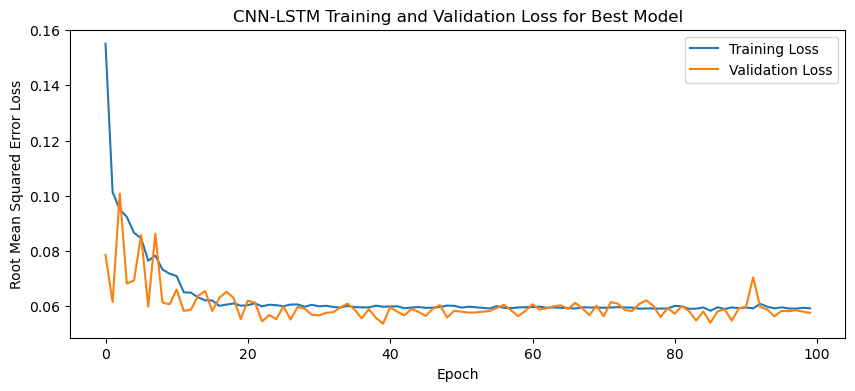

1/1 - 3s - loss: 0.0576 - 3s/epoch - 3s/step
Test Loss: 0.057587262243032455
1/1 [==============================] - 0s 35ms/step


NameError: name 'series' is not defined

In [3]:
n_batch = 1
nb_epoch = 100

def rmse (y_true, y_pred):
    return K.sqrt(K.mean(K.square(y_pred - y_true)))

def mape (y_true, y_pred):
    return 100*K.mean(K.sqrt(K.square(y_true - y_pred))/y_true)
    
def pearson (y_true, y_pred):
    return (K.square(K.mean((y_true - K.mean(y_true))*(y_pred - K.mean(y_pred)))))/(K.mean(K.square(y_true - K.mean(y_true)))*K.mean(K.square(y_pred - K.mean(y_pred))))
 
# fit an LSTM network to training data
#Adapted from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def create_model(trial, X, y, n_lag, n_seq, n_batch, nb_epoch):
    
    #Parameters:
    #trial (array-like): Optuna parameters.
    #train (array-like): Target values.
    #n_lag (int): Number of lag observations.
    #n_seq (int): Number of sequence observations
    #nb_epoch (int): Maximum number of epochs
    
    # Hyperparameters to be tuned by Optuna (taken from Javier Leon's dissertation 'Fruit Prices')
    lr = trial.suggest_float('lr', 1e-3, 1, log=True)
    optimizer_name = trial.suggest_categorical('optimizer', ['Adam', 'RMSprop', 'SGD'])
    if optimizer_name == 'Adam':
        optimizer = Adam(learning_rate=lr)
    elif optimizer_name == 'RMSprop':
        optimizer = RMSprop(learning_rate=lr)
    else:
        optimizer = SGD(learning_rate=lr)
    
    #Optuna will try either Rectified Linear Unit (ReLU) = max(0, x), tanh, or sigmoid functions
    activation_function = trial.suggest_categorical('activation_function', ['relu', 'tanh', 'sigmoid'])
    
    filters = trial.suggest_categorical('filters', [256, 512, 1024]) # Used for CNN-LSTM model
    lstm_units = trial.suggest_categorical('lstm_units', [256, 512, 1024])
    dropout_rate = trial.suggest_float('dropout_rate', 0.1, 0.5)

    # design network
    model = Sequential()
    model.add(Conv1D(filters=filters, kernel_size=1, activation='relu', input_shape=(X.shape[1], X.shape[2]))) # CNN-LSTM only
    model.add(MaxPooling1D(pool_size=1)) # CNN-LSTM Only
    model.add(Dropout(dropout_rate))
    model.add(LSTM(lstm_units, return_sequences=True))
    model.add(Dropout(dropout_rate))
    model.add(LSTM(lstm_units))
    model.add(Dropout(dropout_rate))
    model.add(Dense(256, input_dim=y.shape[1], activation=activation_function))
    model.add(Dense(128, activation=activation_function))
    model.add(Dense(n_seq))
    model.compile(loss=rmse, optimizer=optimizer)
        
    return model

# make forecast with the CNN-LSTM best model
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def forecast_lstm(model, X, n_seq, n_test):
    # reshape input pattern to [samples, timesteps, features]
    X = X.reshape(1, 1, X.shape[1])
    # make forecast
    forecast = model.predict(X)
    # convert to array
    return forecast
     
# evaluate the persistence model
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def make_forecasts(model, X_test, y_test, n_lag, n_seq, n_test):
    forecasts = list()
    for i in range(len(X_test)):
        X, y = X_test[i, :], y_test[i, :]
        # make forecast
        forecast = forecast_lstm(model, X, n_seq, n_test)
        # store the forecast
        forecasts.append(forecast)
    return forecasts
     
# invert differenced forecast
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def inverse_difference(last_ob, forecast):
    # invert first forecast
    inverted = list()
    inverted.append(forecast[0] + last_ob)
    # propagate difference forecast using inverted first value
    for i in range(1, len(forecast)):
        inverted.append(forecast[i] + inverted[i-1])
    return inverted
     
# inverse data transform on forecasts
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def inverse_transform(series, forecasts, scaler, n_test, n_seq):
    inverted = list()
    for i in range(len(forecasts)):
        # create array from forecast
        forecast = forecasts[i]
        forecast = forecast.reshape(1, n_seq)
        # invert scaling
        inv_scale = scaler.inverse_transform(forecast)
        inv_scale = inv_scale[0, :]
        # invert differencing
        index = len(series) - n_test + i - 1
        last_ob = series.values[index]
        inv_diff = inverse_difference(last_ob, inv_scale)
        # store
        inverted.append(inv_diff)
    return inverted
     
# evaluate the RMSE for each forecast time step
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def evaluate_forecasts(test, forecasts, n_lag, n_seq):
    rmse_list = []
    mae_list = []
    mape_list = []
    r2_list = []
    for i in range(n_seq):
        actual = [row[i] for row in test]
        predicted = [forecast[i] for forecast in forecasts]
        rmse = sqrt(mean_squared_error(actual, predicted))
        mae = mean_absolute_error(actual, predicted)
        mse = mean_squared_error(actual, predicted)
        mape = mean_absolute_percentage_error(actual, predicted)
        r2 = r2_score(actual, predicted) 
        rmse_list.append(rmse)
        mae_list.append(mae)
        mape_list.append(mape)
        r2_list.append(r2)
        print("Month at t+"+str(i+1)+":")
        print('t+%d RMSE: %f' % ((i+1), rmse))
        print('t+%d MAE: %f' % ((i+1), mae))
        print('t+%d MAPE: %f' % ((i+1), mape))
        print('t+%d R2_SCORE: %f' % ((i+1), r2))

    return rmse_list, mae_list, mape_list, r2_list
     
# plot the forecasts in the context of the original dataset
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def plot_forecasts(series, forecasts, n_test):
    # plot the entire dataset in blue
    plt.plot(series.values)
    # plot the forecasts in red
    for i in range(len(forecasts)):
        off_s = len(series) - n_test + i - 1
        off_e = off_s + len(forecasts[i]) + 1
        xaxis = [x for x in range(off_s, off_e)]
        yaxis = [series.values[off_s]] + forecasts[i]
        plt.plot(xaxis, yaxis, color='red')
    # show the plot
    plt.show()
    
def objective(trial):
    
    cv_accuracies = []
        
    for i in range(5):
        train1 = train[i]
        test1 = test[i]
        validation1 = validation[i]

        X, y = train1[:, 0:-n_seq], train1[:, -n_seq:]
        X_test, y_test = test1[:, 0:-n_seq], test1[:, -n_seq:]
        X_val, y_val = validation1[:, 0:-n_seq], validation1[:, -n_seq:]
        X = X.reshape(X.shape[0], 1, X.shape[1])
        X_test = X_test.reshape(X_test.shape[0], 1, X_test.shape[1])
        X_val = X_val.reshape(X_val.shape[0], 1, X_val.shape[1])
    
        model = create_model(trial, X, y, n_lag, n_seq, n_batch, nb_epoch)

        history = model.fit(X, y, validation_data=(X_val, y_val), epochs=nb_epoch, verbose=0)

        cv_accuracy = model.evaluate(X_test, y_test, verbose=0)
    
        loss = history.history['val_loss'][-1]
    
        # Plotting the training and validation loss
        #plt.figure(figsize=(10, 4))
        #plt.plot(history.history['loss'], label='Training Loss')
        #plt.plot(history.history['val_loss'], label='Validation Loss')
        #title1 = "CNN-LSTM Training and Validation Loss for Fold " + str(i+1)
        #plt.title(title1)
        #plt.xlabel('Epoch')
        #plt.ylabel('Root Mean Squared Error Loss')
        #plt.legend()
        #plt.show()
            
        cv_accuracies.append(cv_accuracy)
    
    print("Cross Validation Accuracies:")
    print(cv_accuracies)
    print("Mean Cross Validation Accuracy:")
    print(np.mean(cv_accuracies))
    print("Standard Deviation of Cross Validation Accuracy:")
    print(np.std(cv_accuracies))
        
    return np.mean(cv_accuracies)

n_batch = 1
nb_epoch = 100

# optimize and fit model
study = optuna.create_study(direction='minimize')
study.optimize(objective, n_trials=100)
print('Number of finished trials:', len(study.trials))

print('Best trial:', study.best_trial.params)
best_params = study.best_params
print("Best hyperparameters: ", best_params)

for i in range(5):
    print("Fold "+str(i+1)+":")
    train1 = train[i]
    test1 = test[i]
    validation1 = validation[i]

    X, y = train1[:, 0:-n_seq], train1[:, -n_seq:]
    X_test, y_test = test1[:, 0:-n_seq], test1[:, -n_seq:]
    X_val, y_val = validation1[:, 0:-n_seq], validation1[:, -n_seq:]
    X = X.reshape(X.shape[0], 1, X.shape[1])
    X_test = X_test.reshape(X_test.shape[0], 1, X_test.shape[1])
    X_val = X_val.reshape(X_val.shape[0], 1, X_val.shape[1])

    best_model = create_model(optuna.trial.FixedTrial(best_params), X, y, n_lag, n_seq, n_batch, nb_epoch)
    history = best_model.fit(X, y, epochs=100, batch_size=n_batch, validation_data=(X_val, y_val))

    # Plotting the training and validation loss
    plt.figure(figsize=(10, 4))
    plt.plot(history.history['loss'], label='Training Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    title1 = "CNN-LSTM Training and Validation Loss for Best Model"
    plt.title(title1)
    plt.xlabel('Epoch')
    plt.ylabel('Root Mean Squared Error Loss')
    plt.legend()
    plt.show()

    # Evaluate the model
    loss = best_model.evaluate(X_test, y_test, verbose=2)
    print(f'Test Loss: {loss}')

    # make forecasts
    forecasts = make_forecasts(best_model, X_test, y_test, n_lag, n_seq, n_test)
    
    # inverse transform forecasts and test
    forecasts = inverse_transform(series, forecasts, scaler[i], n_test+2, n_seq)
    actual = [row[-n_seq:] for row in test1]
    actual = inverse_transform(series, actual, scaler[i], n_test+2, n_seq)

    rmse_list = [] # list stores root mean squared errors for each future time prediction
    mae_list = [] # list stores root mean squared errors for each future time prediction
    mape_list = [] # list stores root mean squared errors for each future time prediction
    r2_list = [] # list stores root mean squared errors for each future time prediction
    
    # evaluate forecasts
    rmse_list, mae_list, mape_list, r2_list = evaluate_forecasts(actual, forecasts, n_lag, n_seq)

    for j in range(len(X_test)):
        print("Weather Station "+str(j+1)+":")
        dataset_df = pd.DataFrame(y_test[j].flatten())
        dataset = dataset_df.values
        dataset = dataset[:, 0]
        dataset = np.array(dataset).reshape(-1, 1)
        dataset = dataset.flatten()
        dataset = pd.DataFrame(dataset)
        series = scaler[i].inverse_transform(dataset)
        series = pd.Series(series.flatten())

    # plot forecasts
    plot_forecasts(series, forecasts, 1)
    
    best_model.summary()

    # Print out table of actual and predicted values for each weather station
    for j in range(11):
        print("Weather Station "+str(j+1)+":")
        print("Actual Specific Humidity\tPredicted Specific Humidity\tDifference")
        print("-----------\t--------------\t----------")
        for k in range(n_seq):
            diff = forecasts[j][k] - actual[j][k]
            print(f"{actual[j][k]:.2f}\t\t{forecasts[j][k]:.2f}\t\t{diff:.2f}")

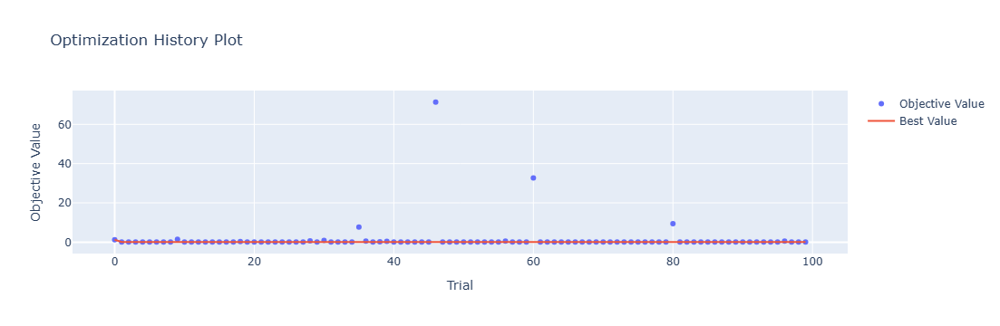

In [4]:
optuna.visualization.plot_optimization_history(study)

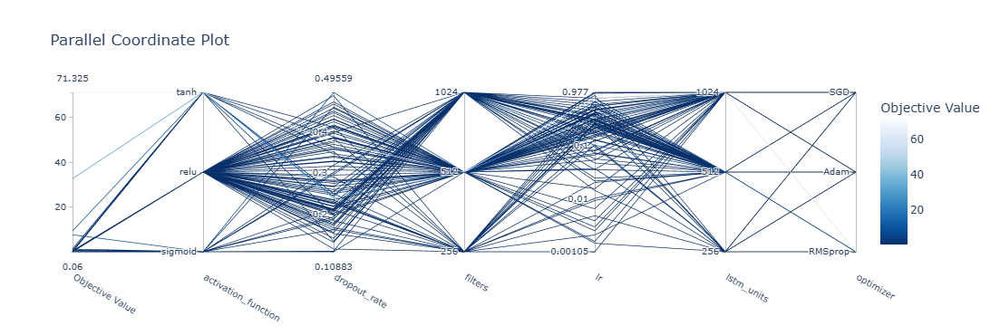

In [5]:
optuna.visualization.plot_parallel_coordinate(study)

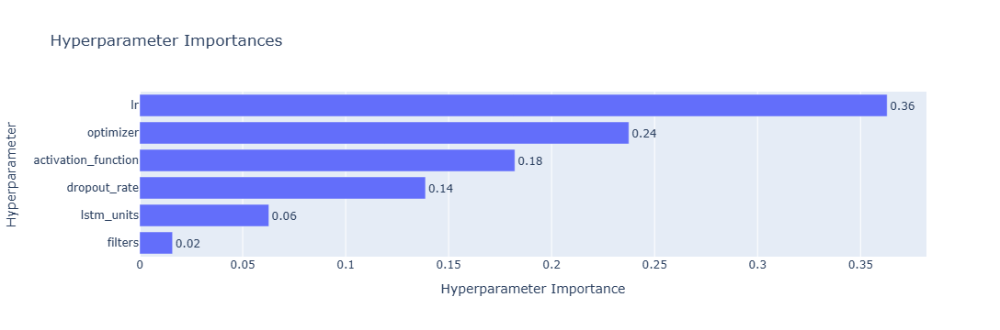

In [6]:
optuna.visualization.plot_param_importances(study)

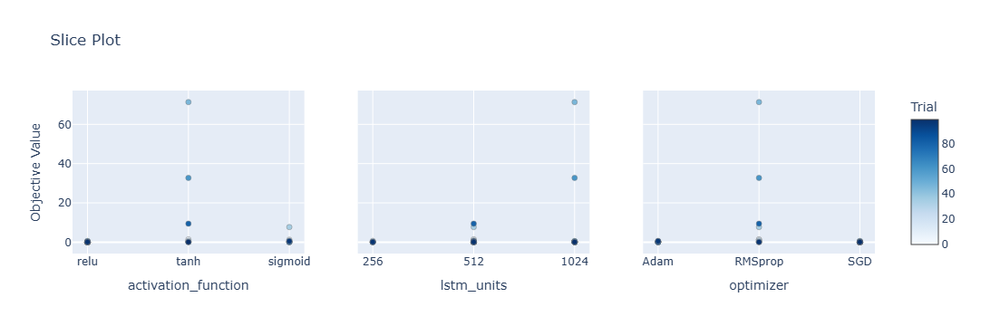

In [7]:
optuna.visualization.plot_slice(study, params=['optimizer', 'activation_function', 'lstm_units'])

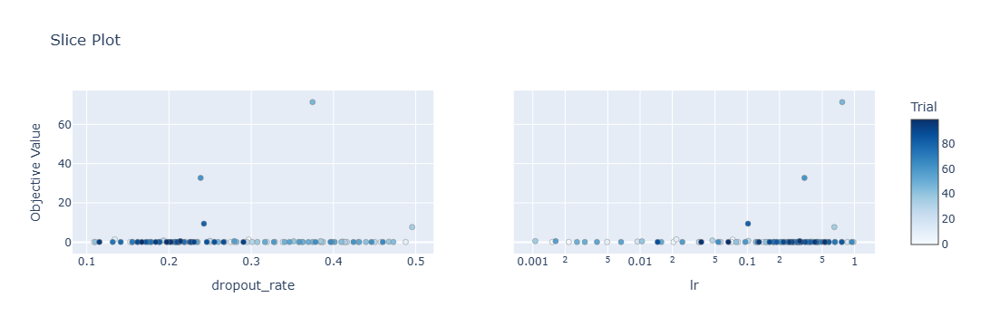

In [8]:
optuna.visualization.plot_slice(study, params=['lr', 'dropout_rate'])

Epoch 1/100
84/84 [==============================] - 10s 75ms/step - loss: 0.1491 - accuracy: 0.2024 - mae: 0.1233 - rmse: 0.1491 - mape: 26.4626 - pearson: 0.5187 - val_loss: 0.0738 - val_accuracy: 0.0000e+00 - val_mae: 0.0588 - val_rmse: 0.0738 - val_mape: 12.3297 - val_pearson: 0.7349
Epoch 2/100
84/84 [==============================] - 5s 54ms/step - loss: 0.1046 - accuracy: 0.2857 - mae: 0.0866 - rmse: 0.1046 - mape: 18.3875 - pearson: 0.7101 - val_loss: 0.0827 - val_accuracy: 0.7000 - val_mae: 0.0675 - val_rmse: 0.0827 - val_mape: 13.9133 - val_pearson: 0.7521
Epoch 3/100
84/84 [==============================] - 5s 62ms/step - loss: 0.0977 - accuracy: 0.3452 - mae: 0.0803 - rmse: 0.0977 - mape: 17.1107 - pearson: 0.7208 - val_loss: 0.0697 - val_accuracy: 0.0000e+00 - val_mae: 0.0549 - val_rmse: 0.0697 - val_mape: 11.3197 - val_pearson: 0.7404
Epoch 4/100
84/84 [==============================] - 6s 73ms/step - loss: 0.0882 - accuracy: 0.3690 - mae: 0.0722 - rmse: 0.0882 - mape: 15

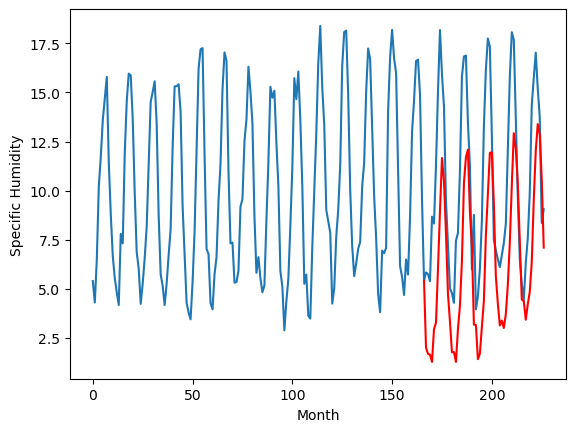

Weather Station 2:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
-1.70		1.69		3.39
-1.37		1.37		2.74
-1.81		1.33		3.14
-1.08		0.96		2.04
2.80		2.63		-0.17
1.01		2.96		1.95
3.33		5.71		2.38
7.01		8.65		1.64
8.67		11.35		2.68
8.61		10.18		1.57
6.51		7.53		1.02
3.95		4.42		0.47
0.62		3.02		2.40
-2.90		1.45		4.35
-2.55		1.46		4.01
-1.84		0.96		2.80
0.37		2.63		2.26
0.59		3.82		3.23
3.08		6.11		3.03
7.83		10.07		2.24
8.63		11.38		2.75
8.79		11.78		2.99
6.63		8.58		1.95
3.55		6.91		3.36
-2.11		2.86		4.97
1.53		2.84		1.31
-3.23		1.10		4.33
-2.01		1.38		3.39
-0.10		2.75		2.85
1.20		4.07		2.87
5.44		7.42		1.98
8.05		9.51		1.46
8.95		11.61		2.66
8.38		11.64		3.26
5.32		9.02		3.70
0.18		5.33		5.15
-0.02		3.94		3.96
-1.22		2.82		4.04
-1.13		3.07		4.20
0.56		2.69		2.13
0.94		3.39		2.45
1.73		4.89		3.16
3.92		7.03		3.11
7.25		9.98		2.73
8.92		12.61		3.69
9.70		11.83		2.13
5.68		10.05		4.37
0.98		7.11		6.13
-1.20		4.14		5.34
-2.64		4.06		6.70
-3.42		3.11		6.53
-2.20		3.8

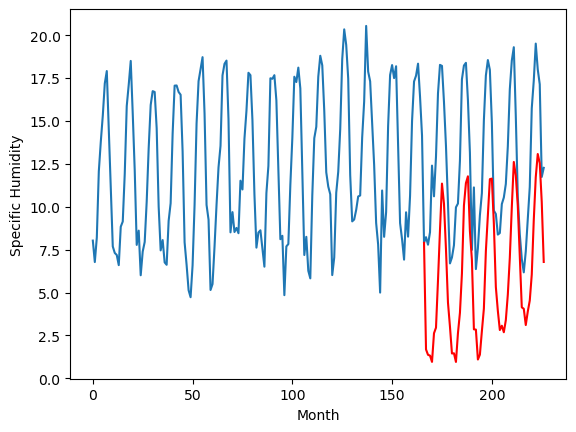

Weather Station 3:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
-1.36		1.58		2.94
-1.11		1.26		2.37
-1.28		1.22		2.50
-0.73		0.85		1.58
1.87		2.52		0.65
0.62		2.85		2.23
3.48		5.60		2.12
7.39		8.54		1.15
9.79		11.24		1.45
9.88		10.07		0.19
6.79		7.42		0.63
4.04		4.31		0.27
0.71		2.91		2.20
-2.45		1.34		3.79
-2.07		1.35		3.42
-1.92		0.85		2.77
-0.07		2.52		2.59
0.17		3.71		3.54
2.93		6.00		3.07
7.55		9.96		2.41
9.46		11.27		1.81
9.66		11.67		2.01
6.66		8.47		1.81
3.94		6.80		2.86
-1.93		2.75		4.68
0.47		2.73		2.26
-2.94		0.99		3.93
-1.73		1.27		3.00
-1.02		2.64		3.66
0.43		3.96		3.53
4.57		7.31		2.74
7.35		9.40		2.05
9.55		11.50		1.95
8.85		11.53		2.68
5.12		8.91		3.79
0.12		5.22		5.10
-0.20		3.83		4.03
-1.53		2.71		4.24
-1.16		2.96		4.12
-0.05		2.58		2.63
-0.69		3.28		3.97
0.75		4.78		4.03
3.53		6.92		3.39
6.11		9.87		3.76
8.97		12.50		3.53
9.06		11.72		2.66
5.48		9.94		4.46
1.57		7.00		5.43
-0.96		4.03		4.99
-1.77		3.95		5.72
-2.57		3.00		5.57
-1.93		3.7

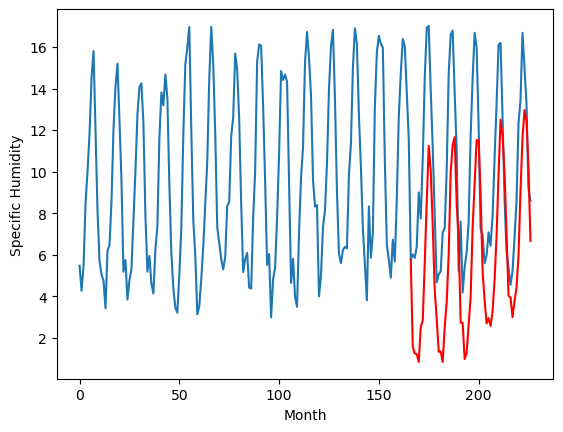

Weather Station 4:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
-1.82		1.28		3.10
-1.28		0.96		2.24
-1.04		0.92		1.96
-0.90		0.55		1.45
3.41		2.22		-1.19
2.26		2.55		0.29
4.41		5.30		0.89
6.90		8.24		1.34
9.65		10.94		1.29
8.40		9.77		1.37
7.05		7.12		0.07
3.24		4.01		0.77
0.19		2.61		2.42
-2.88		1.04		3.92
-2.81		1.05		3.86
-2.90		0.55		3.45
0.55		2.22		1.67
1.12		3.41		2.29
4.63		5.70		1.07
8.53		9.66		1.13
9.37		10.97		1.60
8.99		11.37		2.38
6.68		8.17		1.49
4.25		6.50		2.25
-1.96		2.45		4.41
1.09		2.43		1.34
-4.03		0.69		4.72
-2.82		0.97		3.79
-1.73		2.34		4.07
1.19		3.66		2.47
5.43		7.01		1.58
7.44		9.10		1.66
8.65		11.20		2.55
7.93		11.23		3.30
4.55		8.61		4.06
-0.55		4.92		5.47
-1.07		3.53		4.60
-1.57		2.41		3.98
-1.38		2.66		4.04
-0.71		2.28		2.99
0.37		2.98		2.61
0.77		4.48		3.71
3.62		6.62		3.00
7.77		9.57		1.80
8.80		12.20		3.40
8.55		11.42		2.87
6.37		9.64		3.27
1.80		6.70		4.90
-1.19		3.73		4.92
-2.59		3.65		6.24
-3.51		2.70		6.21
-1.73		3.48

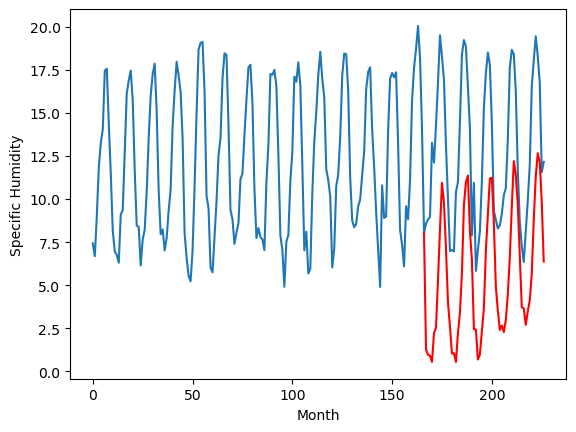

Weather Station 5:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
2.25		2.53		0.28
1.00		2.21		1.21
1.79		2.17		0.38
1.18		1.80		0.62
5.63		3.47		-2.16
5.35		3.80		-1.55
7.93		6.55		-1.38
10.29		9.49		-0.80
13.15		12.19		-0.96
10.88		11.02		0.14
9.57		8.37		-1.20
5.29		5.26		-0.03
3.44		3.86		0.42
0.66		2.29		1.63
0.59		2.30		1.71
0.19		1.80		1.61
3.03		3.47		0.44
4.43		4.66		0.23
8.44		6.95		-1.49
12.13		10.91		-1.22
12.84		12.22		-0.62
12.76		12.62		-0.14
8.53		9.42		0.89
6.44		7.75		1.31
2.22		3.70		1.48
4.98		3.68		-1.30
-0.52		1.94		2.46
-0.26		2.22		2.48
1.29		3.59		2.30
5.21		4.91		-0.30
8.91		8.26		-0.65
9.88		10.35		0.47
9.64		12.45		2.81
10.73		12.48		1.75
7.90		9.86		1.96
3.10		6.17		3.07
3.09		4.78		1.69
2.01		3.66		1.65
1.25		3.91		2.66
1.59		3.53		1.94
3.78		4.23		0.45
4.54		5.73		1.19
8.48		7.87		-0.61
12.60		10.82		-1.78
11.18		13.45		2.27
9.36		12.67		3.31
9.32		10.89		1.57
5.57		7.95		2.38
2.77		4.98		2.21
0.91		4.90		3.99
-0.27		3.95		4.2

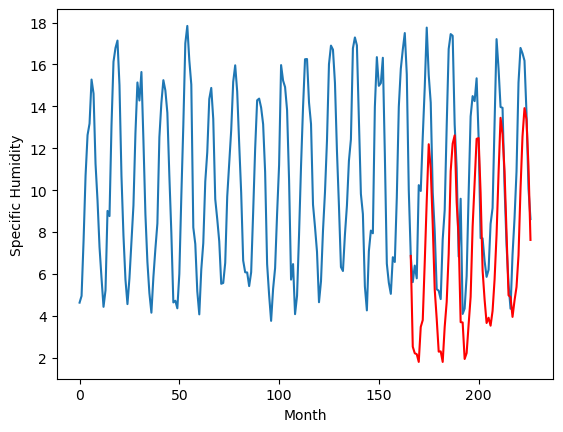

Weather Station 6:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
2.59		5.17		2.58
2.55		4.85		2.30
2.07		4.81		2.74
1.96		4.44		2.48
3.72		6.11		2.39
4.06		6.44		2.38
7.19		9.19		2.00
10.92		12.13		1.21
14.40		14.83		0.43
14.43		13.66		-0.77
11.53		11.01		-0.52
7.83		7.90		0.07
4.88		6.50		1.62
1.12		4.93		3.81
0.51		4.94		4.43
1.10		4.44		3.34
2.67		6.11		3.44
3.68		7.30		3.62
6.18		9.59		3.41
11.44		13.55		2.11
12.56		14.86		2.30
13.72		15.26		1.54
9.63		12.06		2.43
7.31		10.39		3.08
2.05		6.34		4.29
3.47		6.32		2.85
0.36		4.58		4.22
1.74		4.86		3.12
3.07		6.23		3.16
4.20		7.55		3.35
8.98		10.90		1.92
10.07		12.99		2.92
14.40		15.09		0.69
12.61		15.12		2.51
9.91		12.50		2.59
5.27		8.81		3.54
4.61		7.42		2.81
1.26		6.30		5.04
2.01		6.55		4.54
2.94		6.17		3.23
2.72		6.87		4.15
5.40		8.37		2.97
6.16		10.51		4.35
10.06		13.46		3.40
14.41		16.09		1.68
13.52		15.31		1.79
10.40		13.53		3.13
6.00		10.59		4.59
2.98		7.62		4.64
2.16		7.54		5.38
1.37		6.59		5.22
1.

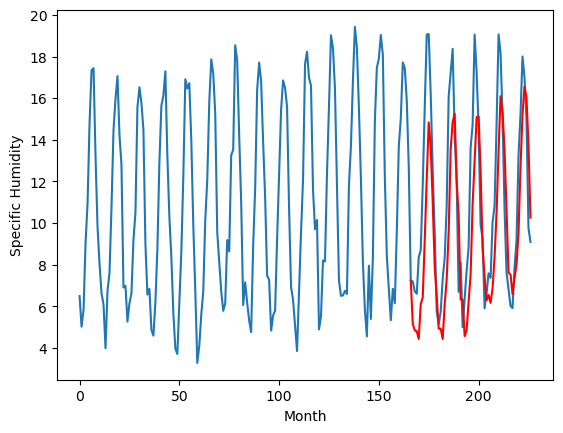

Weather Station 7:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
0.36		2.62		2.26
0.48		2.30		1.82
0.40		2.26		1.86
0.76		1.89		1.13
2.39		3.56		1.17
2.17		3.89		1.72
5.27		6.64		1.37
8.99		9.58		0.59
11.78		12.28		0.50
11.72		11.11		-0.61
8.19		8.46		0.27
5.47		5.35		-0.12
2.62		3.95		1.33
-0.25		2.38		2.63
-0.40		2.39		2.79
-0.35		1.89		2.24
1.24		3.56		2.32
1.84		4.75		2.91
4.84		7.04		2.20
9.22		11.00		1.78
10.66		12.31		1.65
11.19		12.71		1.52
7.87		9.51		1.64
5.76		7.84		2.08
0.01		3.79		3.78
1.85		3.77		1.92
-0.93		2.03		2.96
0.35		2.31		1.96
1.36		3.68		2.32
2.36		5.00		2.64
6.72		8.35		1.63
8.60		10.44		1.84
12.22		12.54		0.32
10.87		12.57		1.70
7.43		9.95		2.52
2.87		6.26		3.39
2.27		4.87		2.60
0.09		3.75		3.66
0.95		4.00		3.05
1.63		3.62		1.99
1.22		4.32		3.10
3.43		5.82		2.39
5.02		7.96		2.94
7.75		10.91		3.16
11.49		13.54		2.05
11.12		12.76		1.64
8.18		10.98		2.80
3.92		8.04		4.12
0.59		5.07		4.48
0.52		4.99		4.47
-0.15		4.04		4.19
0.01		4.82	

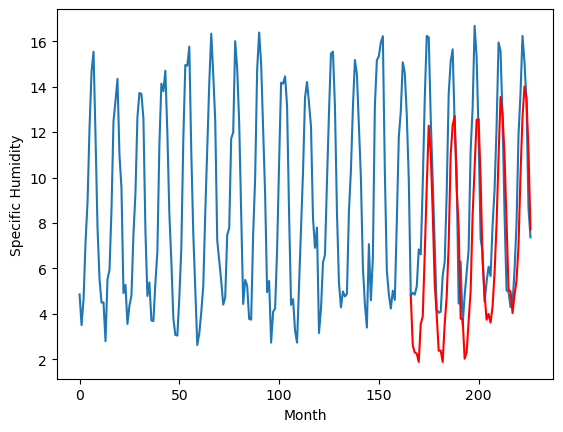

Weather Station 8:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
2.52		4.57		2.05
2.77		4.25		1.48
2.80		4.21		1.41
3.02		3.84		0.82
4.32		5.51		1.19
4.26		5.84		1.58
6.25		8.59		2.34
10.92		11.53		0.61
13.73		14.23		0.50
13.97		13.06		-0.91
10.07		10.41		0.34
7.36		7.30		-0.06
4.82		5.90		1.08
1.95		4.33		2.38
1.64		4.34		2.70
1.67		3.84		2.17
3.29		5.51		2.22
3.99		6.70		2.71
7.01		8.99		1.98
11.28		12.95		1.67
12.78		14.26		1.48
13.06		14.66		1.60
9.57		11.46		1.89
7.69		9.79		2.10
1.90		5.74		3.84
3.67		5.72		2.05
1.16		3.98		2.82
2.39		4.26		1.87
3.38		5.63		2.25
4.28		6.95		2.67
8.57		10.30		1.73
10.02		12.39		2.37
13.39		14.49		1.10
12.32		14.52		2.20
9.53		11.90		2.37
5.11		8.21		3.10
4.41		6.82		2.41
2.07		5.70		3.63
3.00		5.95		2.95
3.36		5.57		2.21
3.28		6.27		2.99
5.56		7.77		2.21
6.88		9.91		3.03
9.50		12.86		3.36
13.85		15.49		1.64
12.79		14.71		1.92
9.99		12.93		2.94
6.24		9.99		3.75
2.72		7.02		4.30
2.92		6.94		4.02
2.23		5.99		3.76
2.26		6

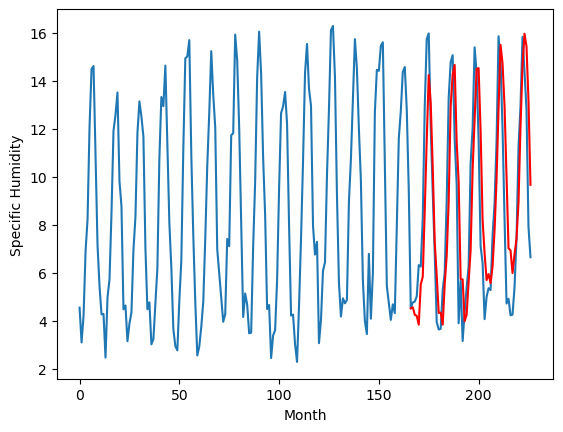

Weather Station 9:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
1.35		1.77		0.42
1.44		1.45		0.01
1.04		1.41		0.37
1.03		1.04		0.01
3.29		2.71		-0.58
3.53		3.04		-0.49
6.75		5.79		-0.96
10.40		8.73		-1.67
13.49		11.43		-2.06
11.46		10.26		-1.20
8.74		7.61		-1.13
4.29		4.50		0.21
2.53		3.10		0.57
0.62		1.53		0.91
0.39		1.54		1.15
-0.29		1.04		1.33
2.77		2.71		-0.06
3.50		3.90		0.40
6.41		6.19		-0.22
11.39		10.15		-1.24
12.89		11.46		-1.43
13.08		11.86		-1.22
9.27		8.66		-0.61
6.85		6.99		0.14
1.56		2.94		1.38
3.15		2.92		-0.23
-0.13		1.18		1.31
0.46		1.46		1.00
2.14		2.83		0.69
3.72		4.15		0.43
7.91		7.50		-0.41
10.09		9.59		-0.50
13.75		11.69		-2.06
12.78		11.72		-1.06
8.33		9.10		0.77
3.10		5.41		2.31
2.10		4.02		1.92
1.17		2.90		1.73
1.77		3.15		1.38
1.84		2.77		0.93
2.28		3.47		1.19
3.50		4.97		1.47
6.99		7.11		0.12
9.27		10.06		0.79
12.82		12.69		-0.13
12.82		11.91		-0.91
8.75		10.13		1.38
4.69		7.19		2.50
2.03		4.22		2.19
1.42		4.14		2.72
0.24		3.19	

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



84/84 [==============================] - 6s 75ms/step - loss: 0.0597 - accuracy: 0.6190 - mae: 0.0468 - rmse: 0.0597 - mape: 10.6169 - pearson: 0.8061 - val_loss: 0.0577 - val_accuracy: 0.5000 - val_mae: 0.0454 - val_rmse: 0.0577 - val_mape: 10.0971 - val_pearson: 0.8062
Epoch 50/100
84/84 [==============================] - 6s 68ms/step - loss: 0.0594 - accuracy: 0.6190 - mae: 0.0469 - rmse: 0.0594 - mape: 10.5822 - pearson: 0.8074 - val_loss: 0.0570 - val_accuracy: 0.5000 - val_mae: 0.0445 - val_rmse: 0.0570 - val_mape: 10.2565 - val_pearson: 0.8071
Epoch 51/100
84/84 [==============================] - 6s 69ms/step - loss: 0.0592 - accuracy: 0.6190 - mae: 0.0465 - rmse: 0.0592 - mape: 10.6104 - pearson: 0.8084 - val_loss: 0.0588 - val_accuracy: 0.5000 - val_mae: 0.0464 - val_rmse: 0.0588 - val_mape: 10.5479 - val_pearson: 0.7980
Epoch 52/100
84/84 [==============================] - 8s 92ms/step - loss: 0.0596 - accuracy: 0.6190 - mae: 0.0470 - rmse: 0.0596 - mape: 10.6361 - pearson: 0

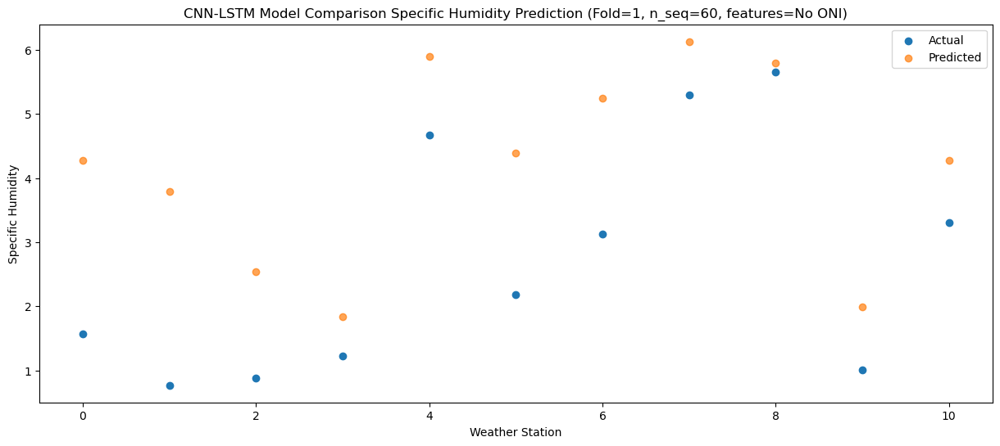

Predictions for (t+42):
    Weather_Station  Actual  Predicted
0                 0    2.77   6.238231
1                 1    3.51   5.748231
2                 2    4.18   4.498231
3                 3    5.01   3.798231
4                 4    8.34   7.858231
5                 5    6.55   6.348231
6                 6    5.69   7.198231
7                 7    9.34   8.088231
8                 8   10.71   7.758231
9                 9    6.74   3.948231
10               10    3.61   6.238231


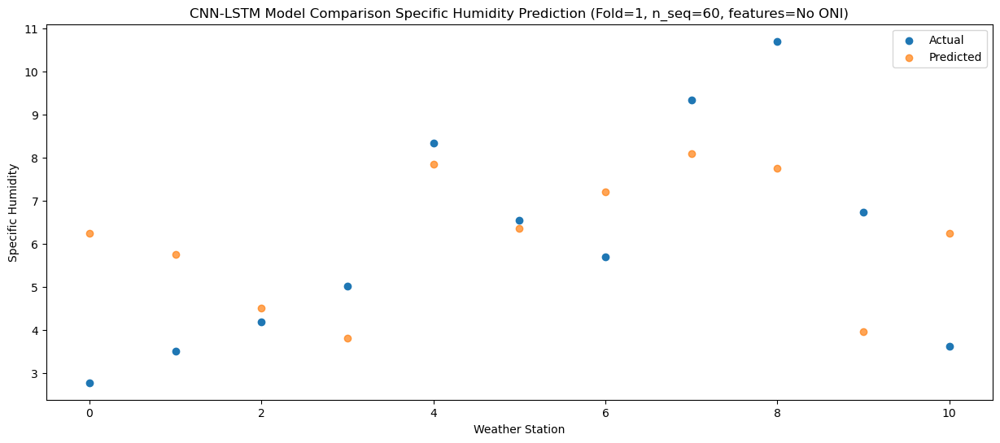

Predictions for (t+43):
    Weather_Station  Actual  Predicted
0                 0    6.12   8.922031
1                 1    5.86   8.432031
2                 2    6.83   7.182031
3                 3    8.41   6.482031
4                 4   11.60  10.542031
5                 5    6.50   9.032031
6                 6    8.27   9.882031
7                 7   12.26  10.772031
8                 8   13.29  10.442031
9                 9    8.35   6.632031
10               10    6.90   8.922031


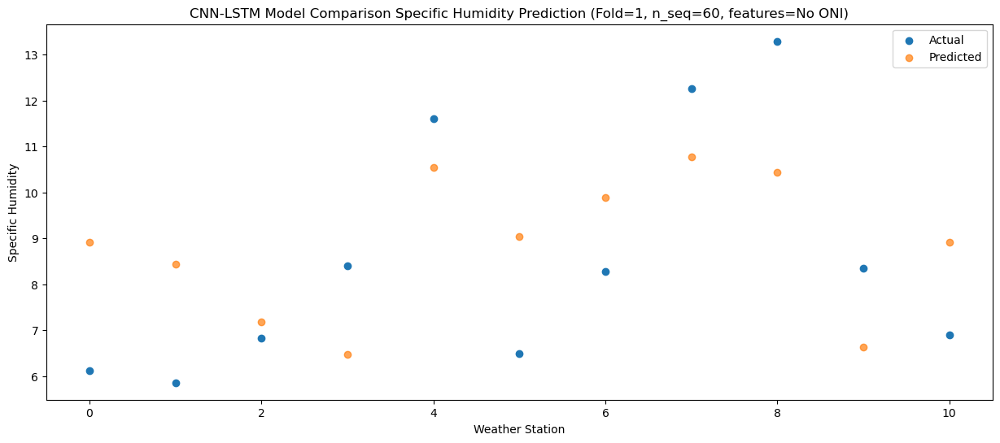

Predictions for (t+44):
    Weather_Station  Actual  Predicted
0                 0    9.53  11.978685
1                 1    8.82  11.488685
2                 2    9.97  10.238685
3                 3    8.97   9.538685
4                 4   11.68  13.598685
5                 5    8.67  12.088685
6                 6   11.89  12.938685
7                 7   14.83  13.828685
8                 8   13.52  13.498685
9                 9   10.28   9.688685
10               10   11.61  11.978685


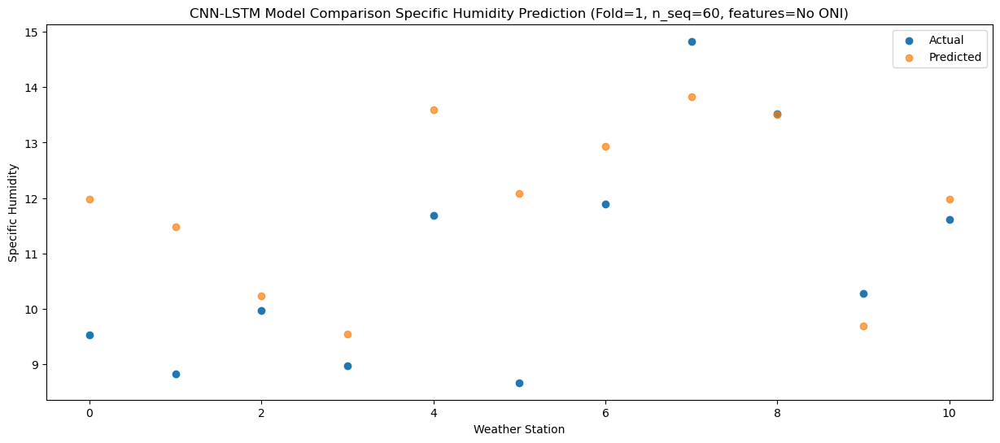

Predictions for (t+45):
    Weather_Station  Actual  Predicted
0                 0    9.36  11.807372
1                 1    8.95  11.317372
2                 2    9.90  10.067372
3                 3    7.30   9.367372
4                 4   10.28  13.427372
5                 5    8.82  11.917372
6                 6   11.78  12.767372
7                 7   14.41  13.657372
8                 8   11.69  13.327372
9                 9    8.37   9.517372
10               10    9.32  11.807372


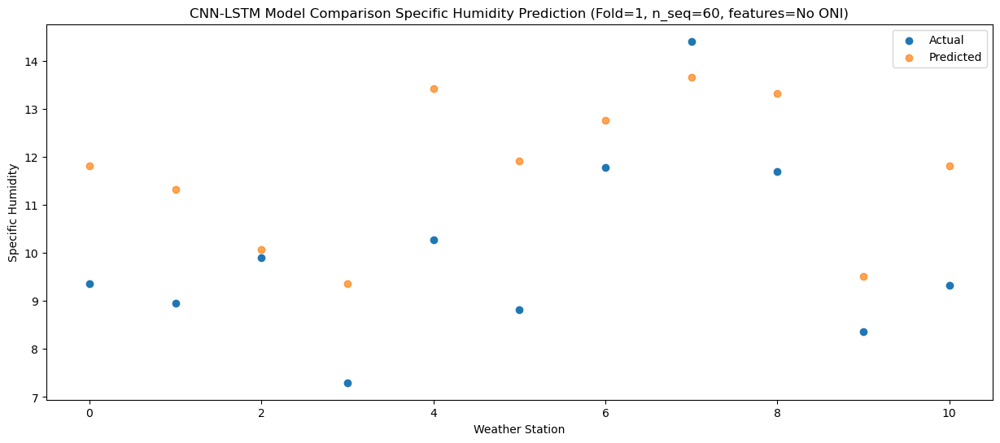

Predictions for (t+46):
    Weather_Station  Actual  Predicted
0                 0    5.50   9.555502
1                 1    5.84   9.065502
2                 2    6.09   7.815502
3                 3    6.10   7.115502
4                 4    9.53  11.175502
5                 5    8.46   9.665502
6                 6    8.81  10.515502
7                 7    9.92  11.405502
8                 8   10.74  11.075502
9                 9    6.72   7.265502
10               10    8.06   9.555502


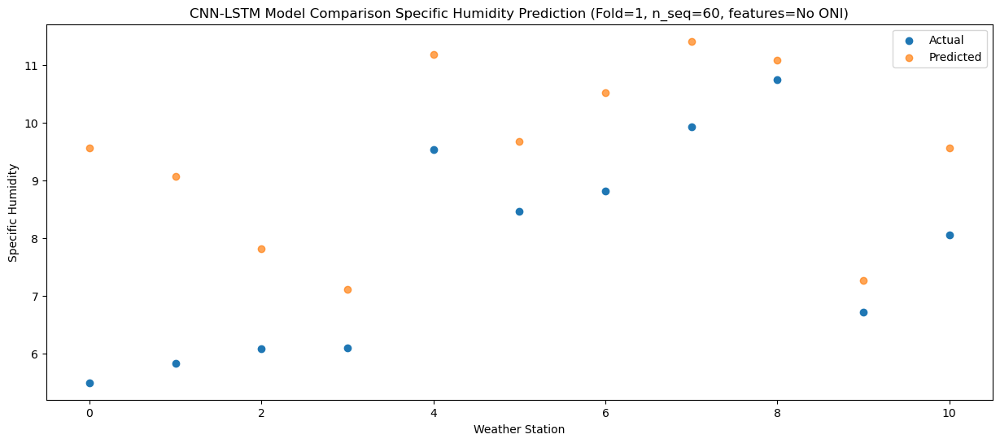

Predictions for (t+47):
    Weather_Station  Actual  Predicted
0                 0    2.10   5.902001
1                 1    1.99   5.412001
2                 2    1.58   4.162001
3                 3    2.68   3.462001
4                 4    6.14   7.522001
5                 5    6.48   6.012001
6                 6    4.56   6.862001
7                 7    6.67   7.752001
8                 8    7.31   7.422001
9                 9    3.61   3.612001
10               10    5.01   5.902001


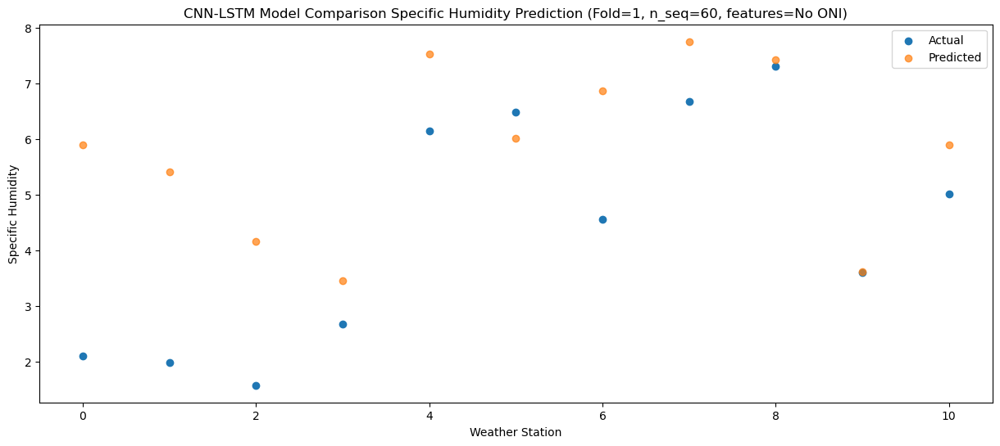

Predictions for (t+48):
    Weather_Station  Actual  Predicted
0                 0   -0.96    3.04737
1                 1   -1.02    2.55737
2                 2   -0.97    1.30737
3                 3   -0.65    0.60737
4                 4    2.80    4.66737
5                 5    3.85    3.15737
6                 6    1.21    4.00737
7                 7    3.96    4.89737
8                 8    4.64    4.56737
9                 9    1.29    0.75737
10               10    1.35    3.04737


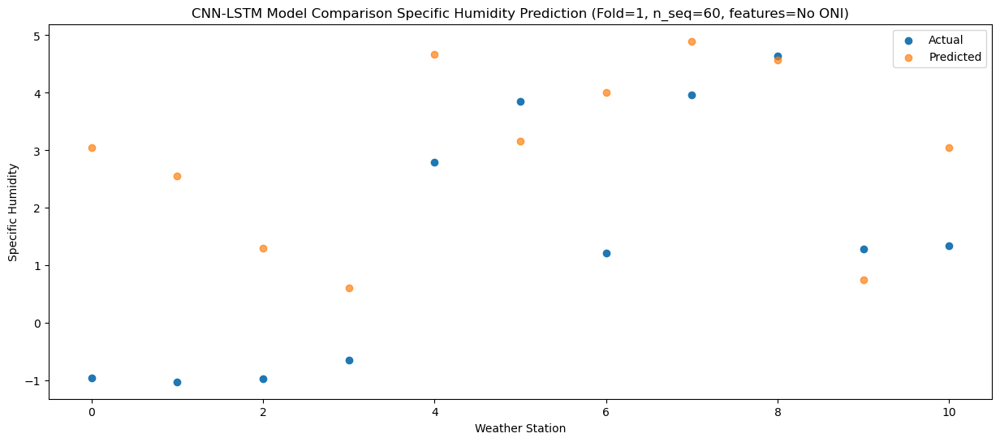

Predictions for (t+49):
    Weather_Station  Actual  Predicted
0                 0   -1.71   2.979791
1                 1   -1.60   2.489791
2                 2   -1.99   1.239791
3                 3   -2.29   0.539791
4                 4    1.08   4.599791
5                 5    1.98   3.089791
6                 6    0.71   3.939791
7                 7    2.57   4.829791
8                 8    3.59   4.499791
9                 9    0.85   0.689791
10               10    1.59   2.979791


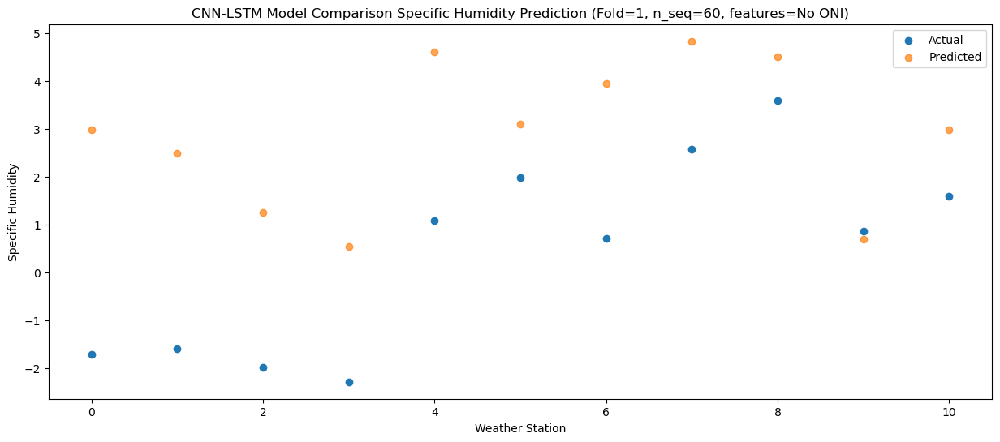

Predictions for (t+50):
    Weather_Station  Actual  Predicted
0                 0   -2.10   2.065467
1                 1   -2.37   1.575467
2                 2   -2.62   0.325467
3                 3   -3.39  -0.374533
4                 4   -0.09   3.685467
5                 5    0.83   2.175467
6                 6   -0.11   3.025467
7                 7    1.50   3.915467
8                 8    2.28   3.585467
9                 9    0.11  -0.224533
10               10    0.54   2.065467


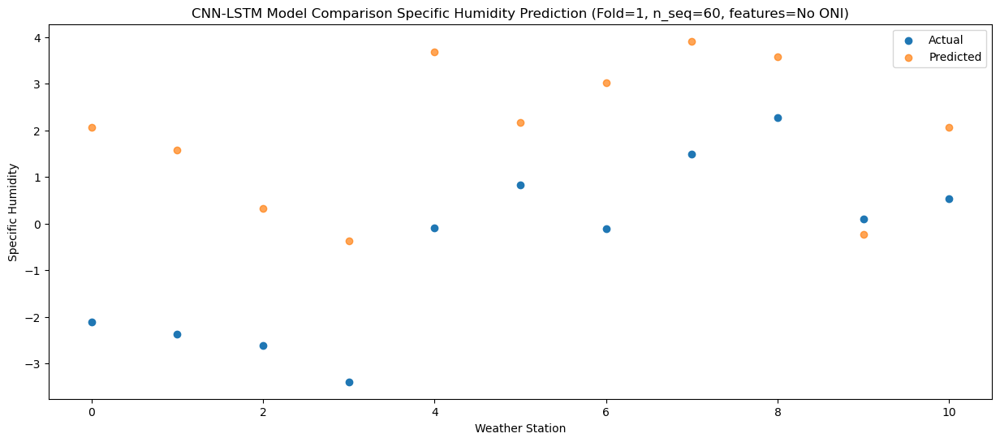

Predictions for (t+51):
    Weather_Station  Actual  Predicted
0                 0   -2.49    2.64822
1                 1   -2.03    2.15822
2                 2   -1.82    0.90822
3                 3   -1.14    0.20822
4                 4    2.16    4.26822
5                 5    1.24    2.75822
6                 6    0.37    3.60822
7                 7    3.25    4.49822
8                 8    4.03    4.16822
9                 9    0.78    0.35822
10               10    0.41    2.64822


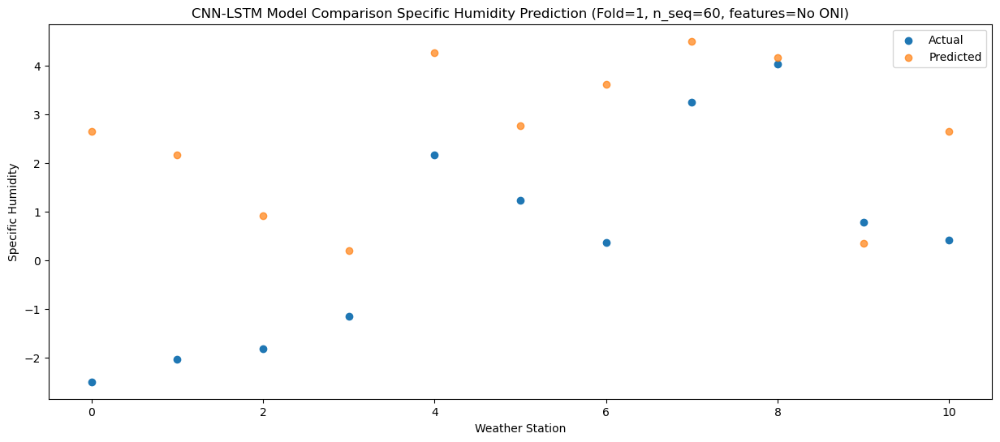

Predictions for (t+52):
    Weather_Station  Actual  Predicted
0                 0   -0.08   3.560221
1                 1   -0.52   3.070221
2                 2   -0.28   1.820221
3                 3    0.77   1.120221
4                 4    4.09   5.180221
5                 5    2.20   3.670221
6                 6    1.71   4.520221
7                 7    4.44   5.410221
8                 8    5.58   5.080221
9                 9    1.09   1.270221
10               10    1.44   3.560221


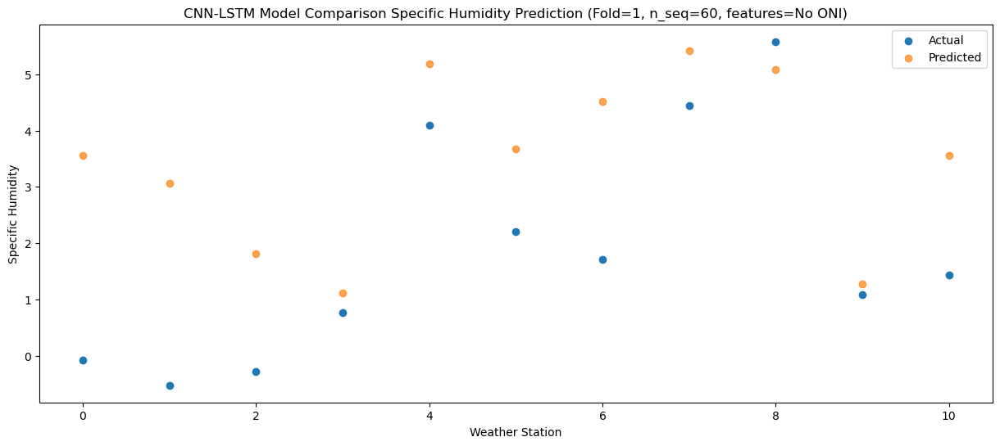

Predictions for (t+53):
    Weather_Station  Actual  Predicted
0                 0    0.99   5.193353
1                 1    1.37   4.703353
2                 2    1.71   3.453353
3                 3    3.02   2.753353
4                 4    6.29   6.813353
5                 5    2.84   5.303353
6                 6    3.86   6.153353
7                 7    6.21   7.043353
8                 8    7.90   6.713353
9                 9    1.95   2.903353
10               10    3.05   5.193353


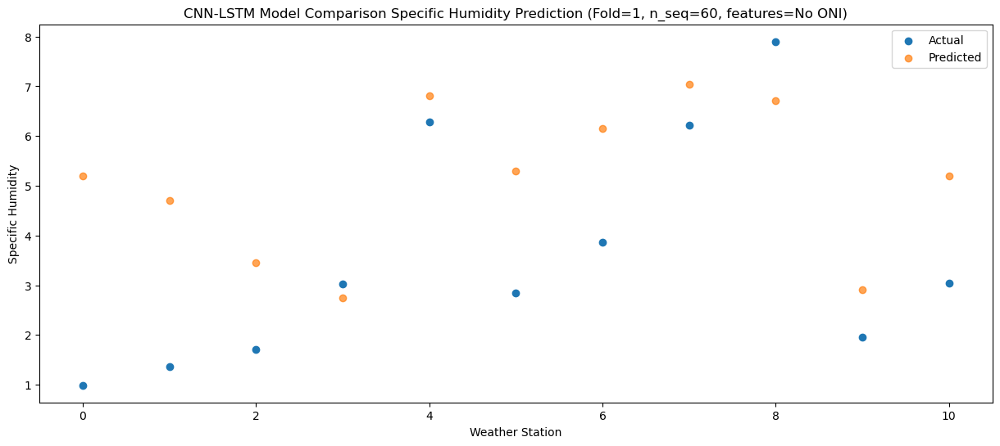

Predictions for (t+54):
    Weather_Station  Actual  Predicted
0                 0    5.19   8.516766
1                 1    5.17   8.026766
2                 2    5.84   6.776766
3                 3    7.37   6.076766
4                 4   10.27  10.136766
5                 5    5.27   8.626766
6                 6    8.00   9.476766
7                 7   10.52  10.366766
8                 8   11.50  10.036766
9                 9    4.68   6.226766
10               10    6.63   8.516766


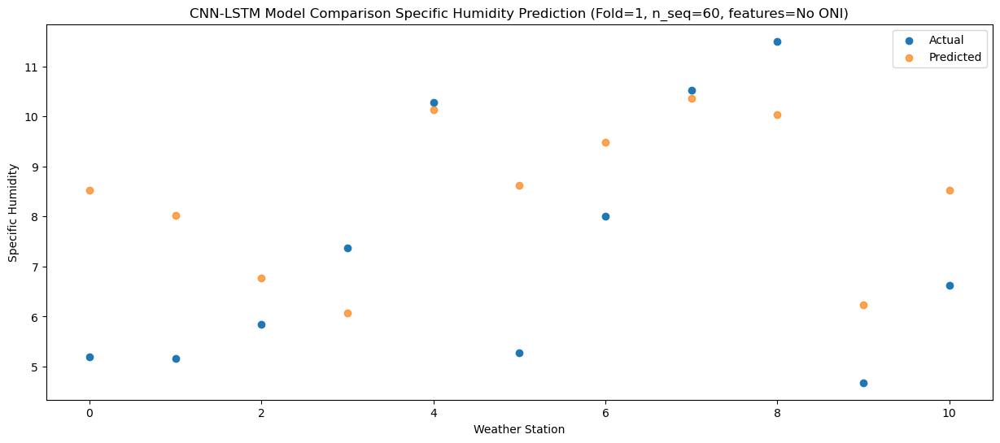

Predictions for (t+55):
    Weather_Station  Actual  Predicted
0                 0    7.26  10.783368
1                 1    6.68  10.293368
2                 2    7.27   9.043368
3                 3    8.76   8.343368
4                 4   11.78  12.403368
5                 5   10.12  10.893368
6                 6    9.96  11.743368
7                 7   12.54  12.633368
8                 8   14.41  12.303368
9                 9   10.35   8.493368
10               10    8.45  10.783368


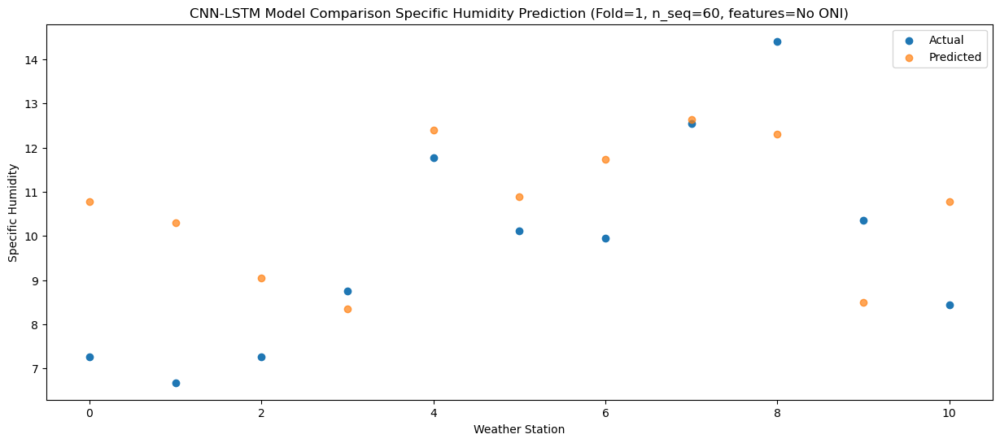

Predictions for (t+56):
    Weather_Station  Actual  Predicted
0                 0    9.68  12.412107
1                 1    9.28  11.922107
2                 2   10.44  10.672107
3                 3    8.84   9.972107
4                 4   12.10  14.032107
5                 5    9.97  12.522107
6                 6   12.34  13.372107
7                 7   13.21  14.262107
8                 8   13.02  13.932107
9                 9    8.60  10.122107
10               10   11.82  12.412107


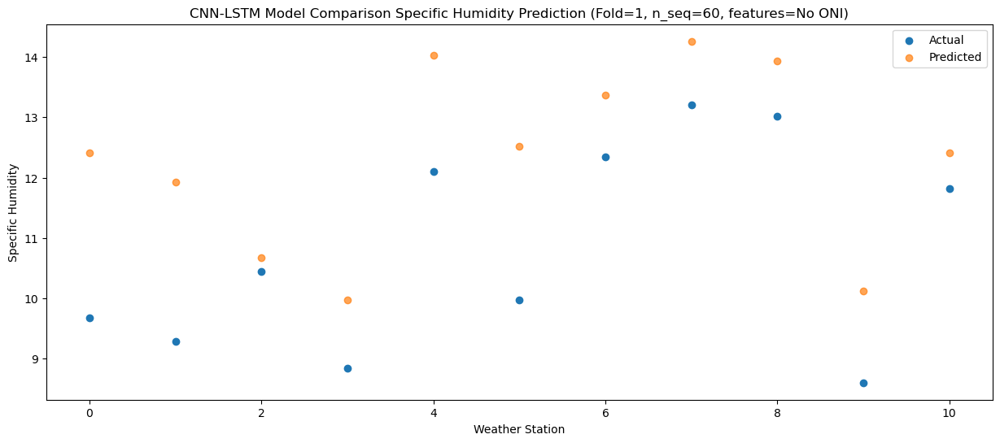

Predictions for (t+57):
    Weather_Station  Actual  Predicted
0                 0    9.04  12.092441
1                 1    7.55  11.602441
2                 2    8.32  10.352441
3                 3    8.93   9.652441
4                 4   12.15  13.712441
5                 5    8.83  12.202441
6                 6   10.62  13.052441
7                 7   11.97  13.942441
8                 8   12.43  13.612441
9                 9    8.79   9.802441
10               10   10.24  12.092441


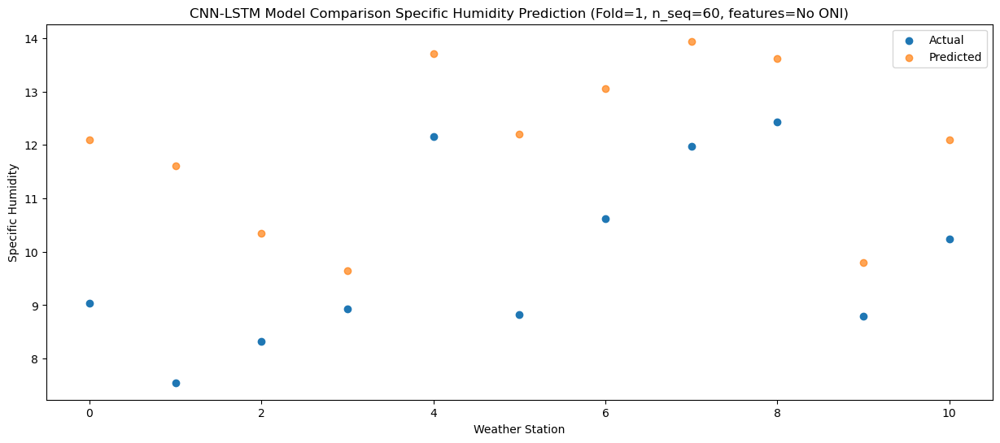

Predictions for (t+58):
    Weather_Station  Actual  Predicted
0                 0    7.05   9.910067
1                 1    6.03   9.420067
2                 2    6.77   8.170067
3                 3    6.01   7.470067
4                 4    9.61  11.530067
5                 5    9.31  10.020067
6                 6    9.33  10.870067
7                 7   10.21  11.760067
8                 8   10.52  11.430067
9                 9    6.35   7.620067
10               10    7.75   9.910067


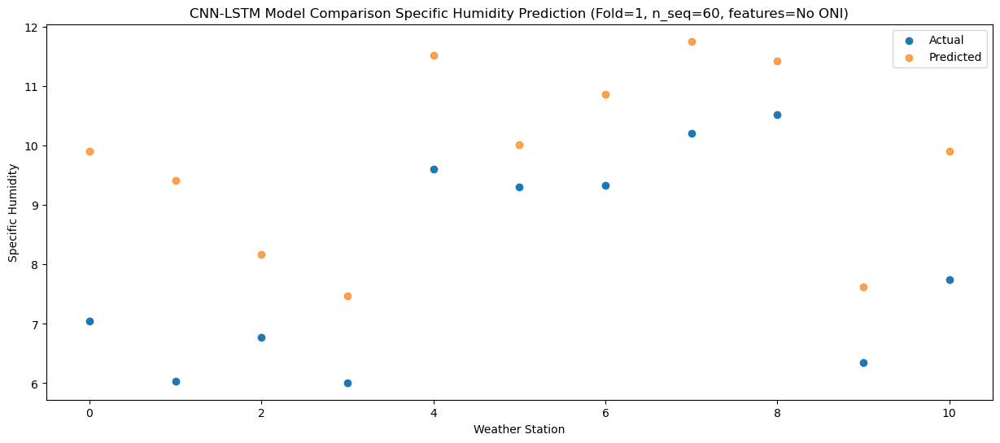

Predictions for (t+59):
    Weather_Station  Actual  Predicted
0                 0    2.10   5.793437
1                 1    2.20   5.303437
2                 2    2.27   4.053437
3                 3    1.96   3.353437
4                 4    5.28   7.413437
5                 5    5.04   5.903437
6                 6    5.19   6.753437
7                 7    5.17   7.643437
8                 8    7.16   7.313437
9                 9    3.36   3.503437
10               10    3.44   5.793437


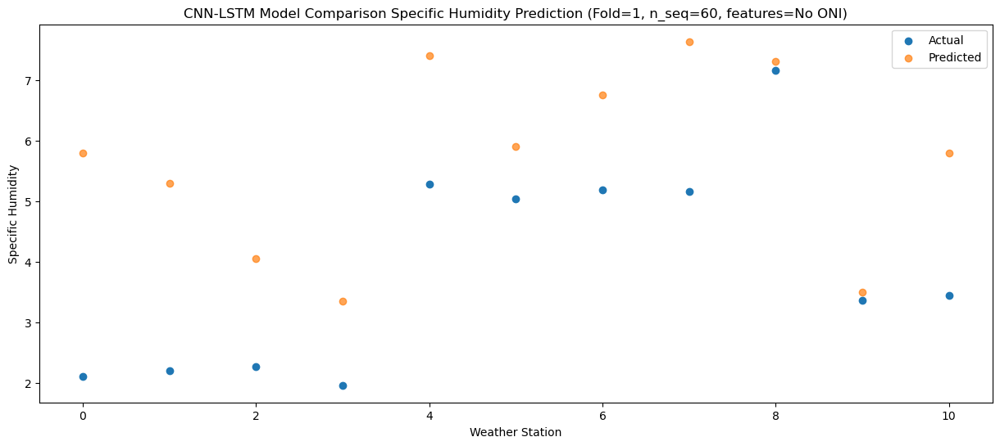

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_1 (Conv1D)           (None, 1, 512)            1014272   
                                                                 
 max_pooling1d_1 (MaxPooling  (None, 1, 512)           0         
 1D)                                                             
                                                                 
 dropout_3 (Dropout)         (None, 1, 512)            0         
                                                                 
 lstm_2 (LSTM)               (None, 1, 1024)           6295552   
                                                                 
 dropout_4 (Dropout)         (None, 1, 1024)           0         
                                                                 
 lstm_3 (LSTM)               (None, 1024)              8392704   
                                                      

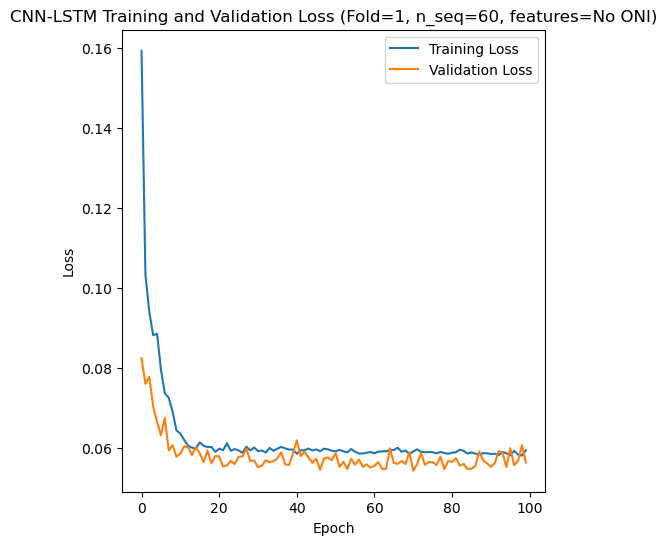

Epoch 1/100
84/84 [==============================] - 11s 72ms/step - loss: 0.1622 - accuracy: 0.1905 - mae: 0.1349 - rmse: 0.1622 - mape: 28.8381 - pearson: 0.4842 - val_loss: 0.0592 - val_accuracy: 0.0000e+00 - val_mae: 0.0472 - val_rmse: 0.0592 - val_mape: 10.8353 - val_pearson: 0.8509
Epoch 2/100
84/84 [==============================] - 5s 55ms/step - loss: 0.1130 - accuracy: 0.2143 - mae: 0.0937 - rmse: 0.1130 - mape: 20.0548 - pearson: 0.6759 - val_loss: 0.0756 - val_accuracy: 0.0000e+00 - val_mae: 0.0612 - val_rmse: 0.0756 - val_mape: 13.7263 - val_pearson: 0.7367
Epoch 3/100
84/84 [==============================] - 5s 55ms/step - loss: 0.0965 - accuracy: 0.2976 - mae: 0.0799 - rmse: 0.0965 - mape: 17.1008 - pearson: 0.7391 - val_loss: 0.0754 - val_accuracy: 0.8000 - val_mae: 0.0617 - val_rmse: 0.0754 - val_mape: 12.2887 - val_pearson: 0.8494
Epoch 4/100
84/84 [==============================] - 5s 55ms/step - loss: 0.0940 - accuracy: 0.4524 - mae: 0.0780 - rmse: 0.0940 - mape: 16

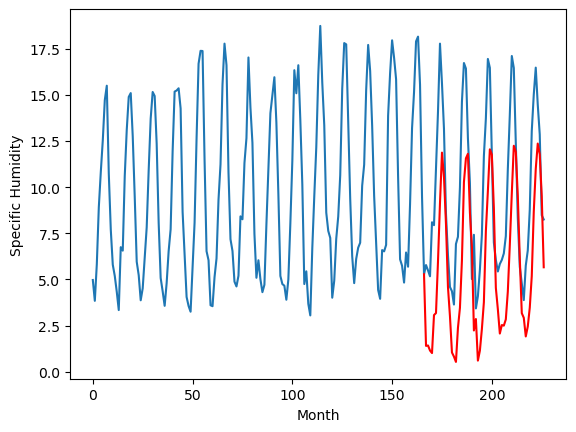

Weather Station 2:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
0.26		-1.33		-1.59
-0.25		-1.31		-1.06
-0.27		-1.58		-1.31
-0.21		-1.72		-1.51
1.58		0.34		-1.24
1.87		0.45		-1.42
4.77		3.24		-1.53
6.19		6.41		0.22
11.00		9.14		-1.86
9.57		7.82		-1.75
5.51		5.29		-0.22
1.78		1.86		0.08
1.56		0.27		-1.29
-0.17		-1.69		-1.52
-0.22		-1.91		-1.69
-0.90		-2.20		-1.30
0.95		-0.36		-1.31
1.07		0.73		-0.34
6.19		3.31		-2.88
9.10		7.54		-1.56
10.71		8.83		-1.88
9.09		9.08		-0.01
6.27		5.89		-0.38
2.88		4.01		1.13
0.45		-0.50		-0.95
-0.61		0.12		0.73
-0.94		-2.13		-1.19
-1.03		-1.59		-0.56
-0.15		-0.42		-0.27
1.00		1.04		0.04
3.39		4.89		1.50
7.75		7.05		-0.70
9.09		9.32		0.23
8.59		9.03		0.44
6.02		6.14		0.12
2.34		1.81		-0.53
0.84		0.66		-0.18
-0.35		-0.66		-0.31
-0.36		-0.20		0.16
-0.44		-0.23		0.21
0.25		0.11		-0.14
0.87		1.61		0.74
6.65		4.15		-2.50
9.30		6.95		-2.35
11.36		9.52		-1.84
9.47		9.20		-0.27
6.88		6.81		-0.07
3.42		3.41		-0.01
0.86		0.44		-0.42
0.47

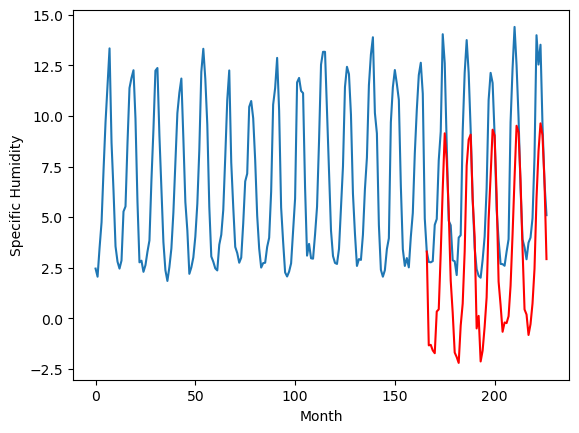

Weather Station 3:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
0.12		1.82		1.70
0.43		1.84		1.41
-1.13		1.57		2.70
-0.25		1.43		1.68
0.92		3.49		2.57
2.40		3.60		1.20
3.51		6.39		2.88
6.85		9.56		2.71
7.87		12.29		4.42
8.57		10.97		2.40
7.87		8.44		0.57
5.28		5.01		-0.27
2.33		3.42		1.09
-2.34		1.46		3.80
-1.85		1.24		3.09
0.28		0.95		0.67
0.50		2.79		2.29
1.47		3.88		2.41
2.78		6.46		3.68
6.56		10.69		4.13
6.96		11.98		5.02
7.58		12.23		4.65
6.30		9.04		2.74
3.64		7.16		3.52
-0.31		2.65		2.96
1.09		3.27		2.18
-2.56		1.02		3.58
-1.37		1.56		2.93
0.44		2.73		2.29
1.80		4.19		2.39
4.90		8.04		3.14
6.83		10.20		3.37
7.66		12.47		4.81
7.55		12.18		4.63
7.40		9.29		1.89
3.01		4.96		1.95
2.90		3.81		0.91
-0.76		2.49		3.25
-1.14		2.95		4.09
0.71		2.92		2.21
1.10		3.26		2.16
2.61		4.76		2.15
3.42		7.30		3.88
6.58		10.10		3.52
7.55		12.67		5.12
8.27		12.35		4.08
5.88		9.96		4.08
2.96		6.56		3.60
0.46		3.59		3.13
-0.11		3.34		3.45
-1.18		2.33		3.51
-1.60		2.87		4.

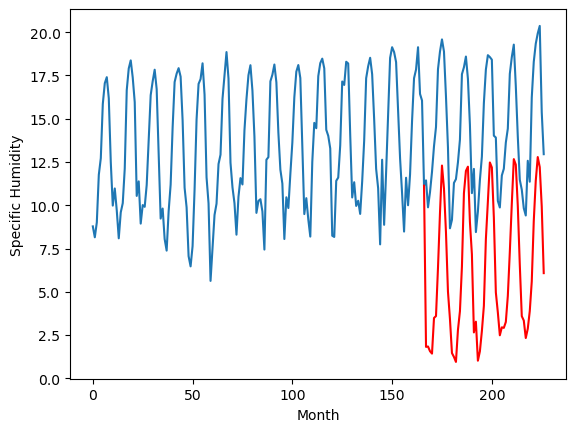

Weather Station 4:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
0.77		1.84		1.07
0.21		1.86		1.65
0.03		1.59		1.56
0.05		1.45		1.40
0.57		3.51		2.94
0.95		3.62		2.67
3.20		6.41		3.21
7.21		9.58		2.37
10.59		12.31		1.72
9.76		10.99		1.23
6.67		8.46		1.79
4.16		5.03		0.87
2.29		3.44		1.15
0.37		1.48		1.11
-0.71		1.26		1.97
-0.54		0.97		1.51
0.10		2.81		2.71
1.45		3.90		2.45
3.13		6.48		3.35
7.73		10.71		2.98
10.33		12.00		1.67
11.07		12.25		1.18
8.41		9.06		0.65
5.45		7.18		1.73
1.00		2.67		1.67
0.64		3.29		2.65
-0.69		1.04		1.73
-0.12		1.58		1.70
0.64		2.75		2.11
1.34		4.21		2.87
4.64		8.06		3.42
6.90		10.22		3.32
10.26		12.49		2.23
10.94		12.20		1.26
7.14		9.31		2.17
4.27		4.98		0.71
2.45		3.83		1.38
0.36		2.51		2.15
0.87		2.97		2.10
0.11		2.94		2.83
0.36		3.28		2.92
2.44		4.78		2.34
3.25		7.32		4.07
7.15		10.12		2.97
11.41		12.69		1.28
9.07		12.37		3.30
8.06		9.98		1.92
4.70		6.58		1.88
0.87		3.61		2.74
1.16		3.36		2.20
-0.17		2.35		2.52
-0.22		2.89		3.1

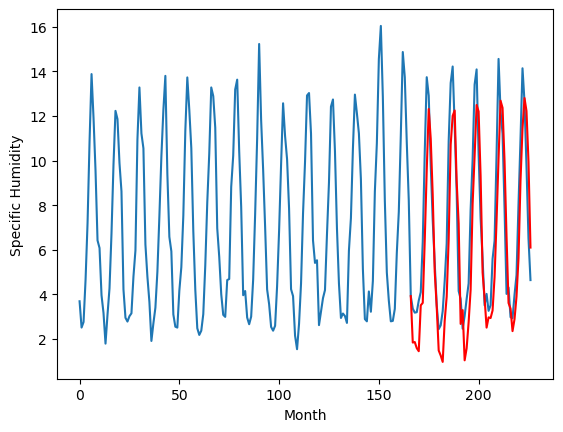

Weather Station 5:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
-0.79		1.75		2.54
0.01		1.77		1.76
0.04		1.50		1.46
0.36		1.36		1.00
3.85		3.42		-0.43
2.89		3.53		0.64
5.01		6.32		1.31
8.35		9.49		1.14
10.48		12.22		1.74
9.75		10.90		1.15
7.95		8.37		0.42
4.74		4.94		0.20
2.01		3.35		1.34
-1.27		1.39		2.66
-1.14		1.17		2.31
-1.16		0.88		2.04
2.13		2.72		0.59
2.15		3.81		1.66
5.35		6.39		1.04
9.24		10.62		1.38
10.27		11.91		1.64
9.87		12.16		2.29
7.73		8.97		1.24
5.20		7.09		1.89
-0.46		2.58		3.04
2.82		3.20		0.38
-2.09		0.95		3.04
-0.63		1.49		2.12
0.22		2.66		2.44
2.65		4.12		1.47
6.68		7.97		1.29
8.98		10.13		1.15
10.27		12.40		2.13
10.67		12.11		1.44
7.16		9.22		2.06
1.98		4.89		2.91
1.54		3.74		2.20
0.99		2.42		1.43
0.90		2.88		1.98
2.20		2.85		0.65
3.08		3.19		0.11
3.63		4.69		1.06
6.69		7.23		0.54
10.00		10.03		0.03
11.34		12.60		1.26
11.37		12.28		0.91
9.02		9.89		0.87
3.79		6.49		2.70
1.27		3.52		2.25
-0.32		3.27		3.59
-1.19		2.26		3.45
-0.13		2.8

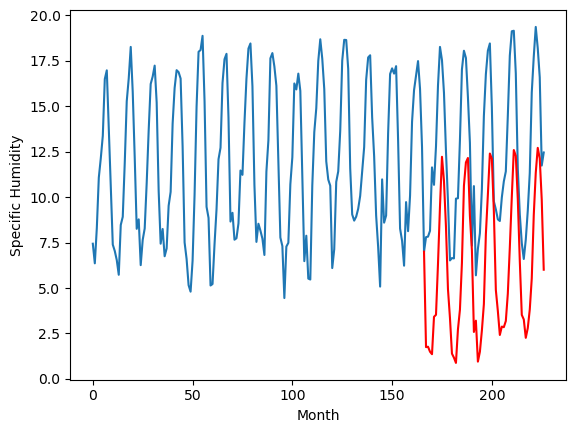

Weather Station 6:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
-1.21		-0.76		0.45
-2.40		-0.74		1.66
-1.57		-1.01		0.56
-2.24		-1.15		1.09
2.37		0.91		-1.46
1.85		1.02		-0.83
3.93		3.81		-0.12
6.05		6.98		0.93
8.63		9.71		1.08
7.19		8.39		1.20
5.74		5.86		0.12
1.87		2.43		0.56
-0.19		0.84		1.03
-2.51		-1.12		1.39
-2.64		-1.34		1.30
-2.69		-1.63		1.06
0.30		0.21		-0.09
1.87		1.30		-0.57
6.70		3.88		-2.82
9.34		8.11		-1.23
8.30		9.40		1.10
8.43		9.65		1.22
4.87		6.46		1.59
3.28		4.58		1.30
-0.91		0.07		0.98
1.96		0.69		-1.27
-3.67		-1.56		2.11
-3.45		-1.02		2.43
-1.83		0.15		1.98
2.13		1.61		-0.52
5.78		5.46		-0.32
6.81		7.62		0.81
7.91		9.89		1.98
8.37		9.60		1.23
5.01		6.71		1.70
0.19		2.38		2.19
0.05		1.23		1.18
-0.86		-0.09		0.77
-1.24		0.37		1.61
-0.79		0.34		1.13
0.99		0.68		-0.31
1.54		2.18		0.64
5.24		4.72		-0.52
8.70		7.52		-1.18
8.41		10.09		1.68
6.98		9.77		2.79
6.43		7.38		0.95
2.90		3.98		1.08
-0.27		1.01		1.28
-2.20		0.76		2.96
-3.21		-0.25		

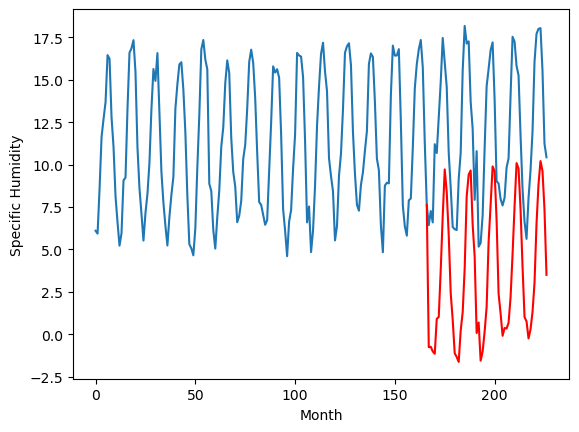

Weather Station 7:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
5.57		5.56		-0.01
4.47		5.58		1.11
5.15		5.31		0.16
4.59		5.17		0.58
8.81		7.23		-1.58
8.39		7.34		-1.05
11.33		10.13		-1.20
13.61		13.30		-0.31
16.52		16.03		-0.49
13.82		14.71		0.89
12.88		12.18		-0.70
8.39		8.75		0.36
6.80		7.16		0.36
4.09		5.20		1.11
3.99		4.98		0.99
3.66		4.69		1.03
6.52		6.53		0.01
7.84		7.62		-0.22
12.04		10.20		-1.84
15.79		14.43		-1.36
16.61		15.72		-0.89
16.99		15.97		-1.02
12.54		12.78		0.24
9.93		10.90		0.97
5.94		6.39		0.45
8.44		7.01		-1.43
3.15		4.76		1.61
3.62		5.30		1.68
5.25		6.47		1.22
9.15		7.93		-1.22
13.24		11.78		-1.46
14.04		13.94		-0.10
13.36		16.21		2.85
14.42		15.92		1.50
11.75		13.03		1.28
6.97		8.70		1.73
6.52		7.55		1.03
5.35		6.23		0.88
4.57		6.69		2.12
4.97		6.66		1.69
6.88		7.00		0.12
7.55		8.50		0.95
11.44		11.04		-0.40
15.34		13.84		-1.50
14.63		16.41		1.78
12.58		16.09		3.51
11.95		13.70		1.75
8.80		10.30		1.50
6.18		7.33		1.15
4.36		7.08		

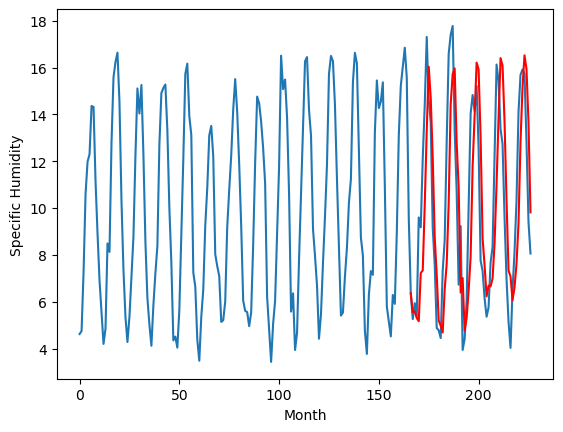

Weather Station 8:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
2.62		0.47		-2.15
2.17		0.49		-1.68
1.22		0.22		-1.00
1.75		0.08		-1.67
3.21		2.14		-1.07
1.81		2.25		0.44
2.05		5.04		2.99
3.73		8.21		4.48
7.17		10.94		3.77
5.44		9.62		4.18
4.79		7.09		2.30
1.72		3.66		1.94
1.77		2.07		0.30
0.51		0.11		-0.40
0.79		-0.11		-0.90
0.66		-0.40		-1.06
0.75		1.44		0.69
1.05		2.53		1.48
1.17		5.11		3.94
3.83		9.34		5.51
9.07		10.63		1.56
9.36		10.88		1.52
6.60		7.69		1.09
2.89		5.81		2.92
1.24		1.30		0.06
1.37		1.92		0.55
1.09		-0.33		-1.42
0.10		0.21		0.11
0.50		1.38		0.88
0.51		2.84		2.33
0.44		6.69		6.25
5.94		8.85		2.91
8.50		11.12		2.62
10.47		10.83		0.36
7.43		7.94		0.51
5.35		3.61		-1.74
1.38		2.46		1.08
2.20		1.14		-1.06
1.31		1.60		0.29
1.19		1.57		0.38
1.53		1.91		0.38
0.69		3.41		2.72
2.69		5.95		3.26
2.49		8.75		6.26
5.84		11.32		5.48
8.03		11.00		2.97
6.22		8.61		2.39
3.77		5.21		1.44
2.85		2.24		-0.61
1.33		1.99		0.66
1.75		0.98		-0.77
1.77		1.52		-0

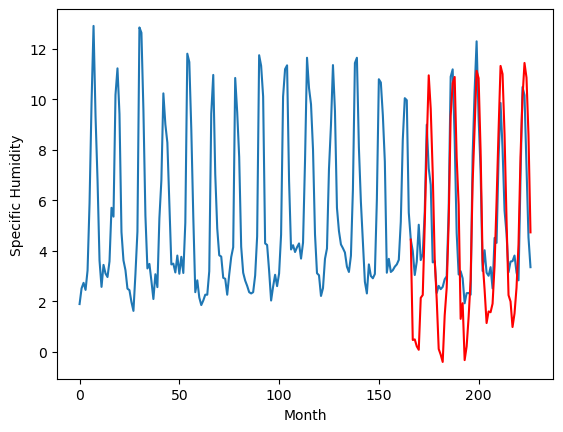

Weather Station 9:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
7.78		4.22		-3.56
7.60		4.24		-3.36
7.39		3.97		-3.42
6.67		3.83		-2.84
8.31		5.89		-2.42
9.72		6.00		-3.72
10.48		8.79		-1.69
10.46		11.96		1.50
11.23		14.69		3.46
12.31		13.37		1.06
10.53		10.84		0.31
9.40		7.41		-1.99
7.16		5.82		-1.34
5.59		3.86		-1.73
6.44		3.64		-2.80
6.97		3.35		-3.62
7.08		5.19		-1.89
8.40		6.28		-2.12
9.88		8.86		-1.02
11.13		13.09		1.96
12.28		14.38		2.10
11.68		14.63		2.95
11.22		11.44		0.22
8.42		9.56		1.14
7.88		5.05		-2.83
7.70		5.67		-2.03
6.34		3.42		-2.92
5.60		3.96		-1.64
7.34		5.13		-2.21
8.18		6.59		-1.59
9.44		10.44		1.00
11.21		12.60		1.39
12.10		14.87		2.77
12.20		14.58		2.38
13.05		11.69		-1.36
11.28		7.36		-3.92
6.64		6.21		-0.43
7.49		4.89		-2.60
7.58		5.35		-2.23
6.17		5.32		-0.85
8.09		5.66		-2.43
8.79		7.16		-1.63
10.19		9.70		-0.49
10.57		12.50		1.93
11.91		15.07		3.16
12.52		14.75		2.23
12.27		12.36		0.09
9.97		8.96		-1.01
6.94		5.99		-0.95
7.73

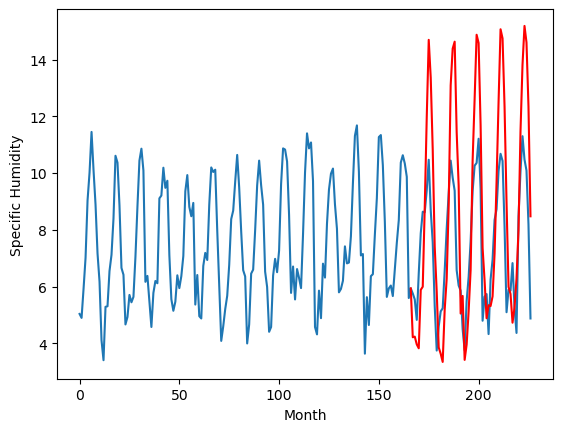

Weather Station 10:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
0.89		2.88		1.99
1.00		2.90		1.90
0.98		2.63		1.65
1.37		2.49		1.12
3.00		4.55		1.55
2.91		4.66		1.75
6.24		7.45		1.21
9.75		10.62		0.87
12.60		13.35		0.75
12.59		12.03		-0.56
8.87		9.50		0.63
6.25		6.07		-0.18
3.60		4.48		0.88
0.38		2.52		2.14
0.26		2.30		2.04
0.33		2.01		1.68
2.06		3.85		1.79
2.59		4.94		2.35
5.30		7.52		2.22
9.80		11.75		1.95
11.32		13.04		1.72
11.90		13.29		1.39
8.30		10.10		1.80
6.14		8.22		2.08
0.58		3.71		3.13
2.43		4.33		1.90
-0.35		2.08		2.43
0.96		2.62		1.66
1.92		3.79		1.87
2.96		5.25		2.29
7.28		9.10		1.82
9.08		11.26		2.18
12.66		13.53		0.87
11.09		13.24		2.15
7.66		10.35		2.69
3.30		6.02		2.72
2.83		4.87		2.04
0.59		3.55		2.96
1.45		4.01		2.56
2.21		3.98		1.77
1.90		4.32		2.42
4.03		5.82		1.79
5.56		8.36		2.80
8.42		11.16		2.74
12.26		13.73		1.47
11.77		13.41		1.64
8.63		11.02		2.39
4.44		7.62		3.18
1.33		4.65		3.32
1.24		4.40		3.16
0.55		3.39		2.84
0.69		3.93	

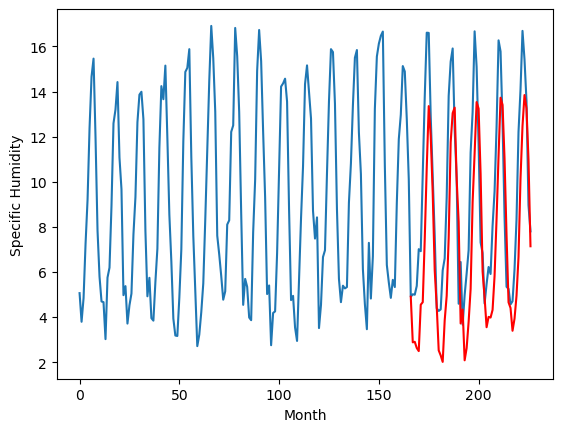

Weather Station 11:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
0.08		1.40		1.32
0.53		1.42		0.89
0.33		1.15		0.82
0.44		1.01		0.57
2.29		3.07		0.78
1.72		3.18		1.46
4.51		5.97		1.46
7.95		9.14		1.19
10.65		11.87		1.22
10.41		10.55		0.14
7.80		8.02		0.22
4.61		4.59		-0.02
1.49		3.00		1.51
-0.30		1.04		1.34
-0.29		0.82		1.11
-0.05		0.53		0.58
0.98		2.37		1.39
1.59		3.46		1.87
4.26		6.04		1.78
8.36		10.27		1.91
9.77		11.56		1.79
10.16		11.81		1.65
6.95		8.62		1.67
5.22		6.74		1.52
-0.14		2.23		2.37
1.42		2.85		1.43
-1.00		0.60		1.60
-0.10		1.14		1.24
0.52		2.31		1.79
1.79		3.77		1.98
5.95		7.62		1.67
7.91		9.78		1.87
11.12		12.05		0.93
10.13		11.76		1.63
6.65		8.87		2.22
1.99		4.54		2.55
1.37		3.39		2.02
0.28		2.07		1.79
0.55		2.53		1.98
0.95		2.50		1.55
0.55		2.84		2.29
2.19		4.34		2.15
4.78		6.88		2.10
6.62		9.68		3.06
9.93		12.25		2.32
10.04		11.93		1.89
7.62		9.54		1.92
3.51		6.14		2.63
0.56		3.17		2.61
0.35		2.92		2.57
-0.27		1.91		2.18
0.13		2.45		2.

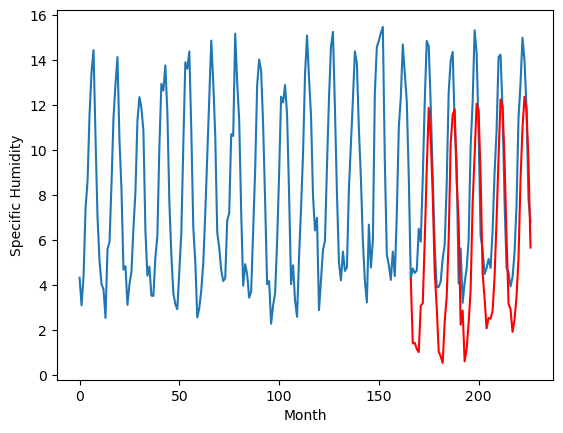

RangeIndex(start=1, stop=12, step=1)
[0.41000000000000014, 0.26000000000000045, 0.1200000000000001, 0.7699999999999987, -0.79, -1.2099999999999995, 5.569999999999999, 2.62, 7.780000000000001, 0.8900000000000006, 0.08000000000000007]
[1.397442216873169, -1.3325577831268312, 1.817442216873169, 1.8374422168731686, 1.7474422168731687, -0.7625577831268311, 5.557442216873168, 0.4674422168731689, 4.217442216873169, 2.8774422168731686, 1.397442216873169]
Predictions for (t+0):
    Weather_Station  Actual  Predicted
0                 0    0.41   1.397442
1                 1    0.26  -1.332558
2                 2    0.12   1.817442
3                 3    0.77   1.837442
4                 4   -0.79   1.747442
5                 5   -1.21  -0.762558
6                 6    5.57   5.557442
7                 7    2.62   0.467442
8                 8    7.78   4.217442
9                 9    0.89   2.877442
10               10    0.08   1.397442


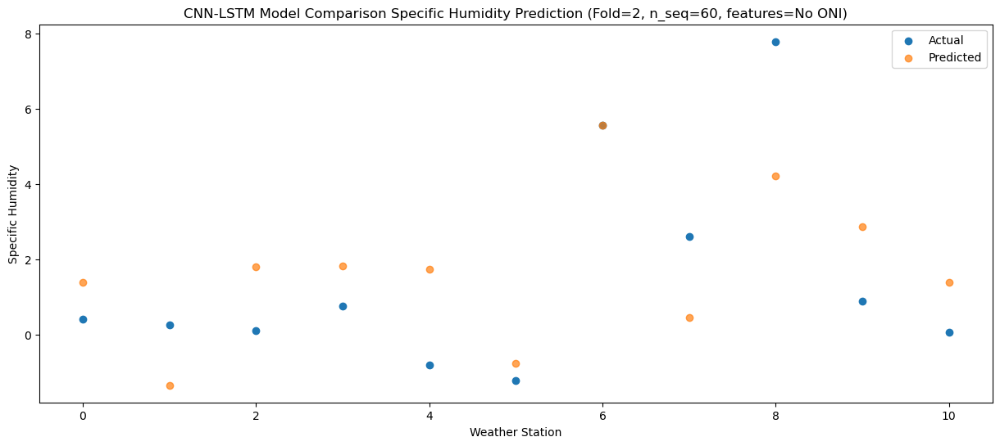

Predictions for (t+1):
    Weather_Station  Actual  Predicted
0                 0    0.91   1.421117
1                 1   -0.25  -1.308883
2                 2    0.43   1.841117
3                 3    0.21   1.861117
4                 4    0.01   1.771117
5                 5   -2.40  -0.738883
6                 6    4.47   5.581117
7                 7    2.17   0.491117
8                 8    7.60   4.241117
9                 9    1.00   2.901117
10               10    0.53   1.421117


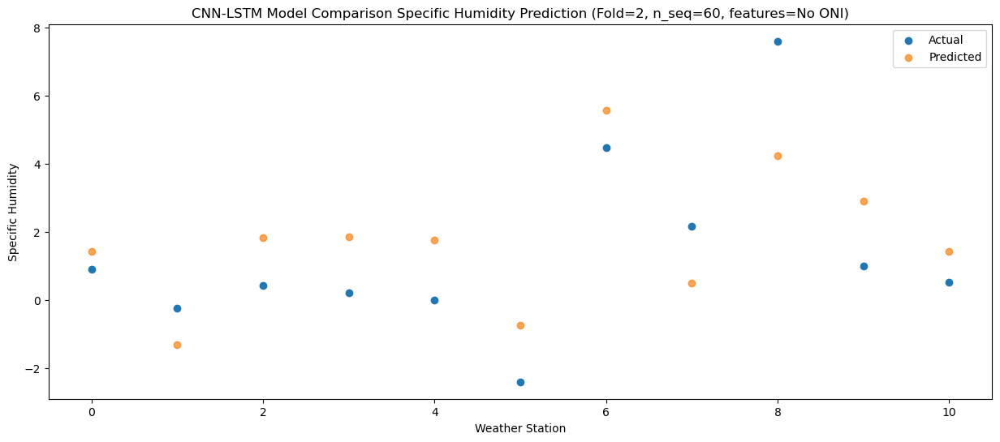

Predictions for (t+2):
    Weather_Station  Actual  Predicted
0                 0    0.62   1.147036
1                 1   -0.27  -1.582964
2                 2   -1.13   1.567036
3                 3    0.03   1.587036
4                 4    0.04   1.497036
5                 5   -1.57  -1.012964
6                 6    5.15   5.307036
7                 7    1.22   0.217036
8                 8    7.39   3.967036
9                 9    0.98   2.627036
10               10    0.33   1.147036


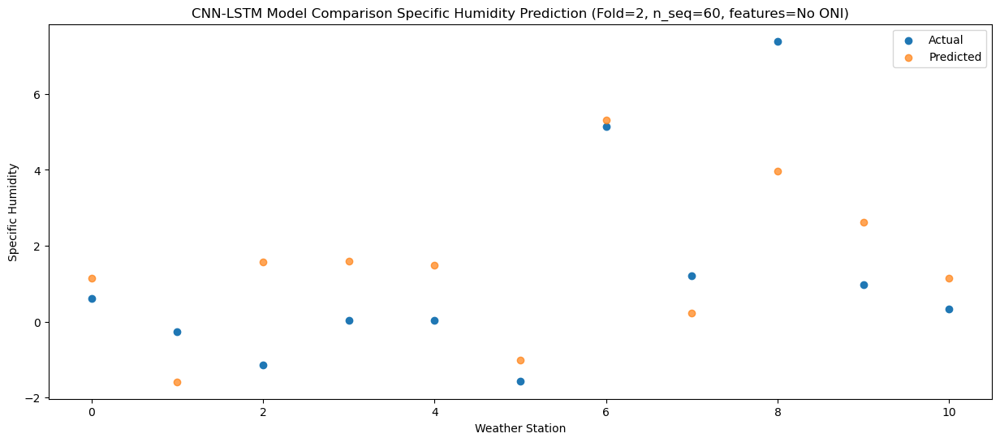

Predictions for (t+3):
    Weather_Station  Actual  Predicted
0                 0    0.30   1.009416
1                 1   -0.21  -1.720584
2                 2   -0.25   1.429416
3                 3    0.05   1.449416
4                 4    0.36   1.359416
5                 5   -2.24  -1.150584
6                 6    4.59   5.169416
7                 7    1.75   0.079416
8                 8    6.67   3.829416
9                 9    1.37   2.489416
10               10    0.44   1.009416


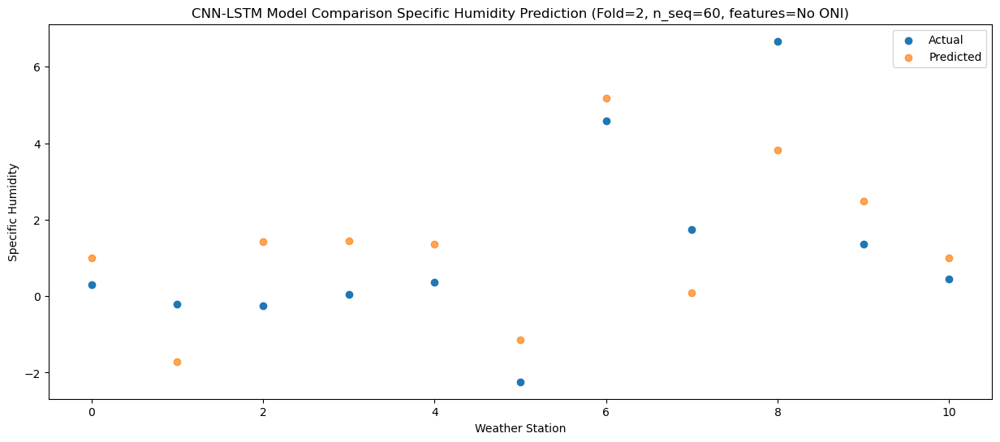

Predictions for (t+4):
    Weather_Station  Actual  Predicted
0                 0    3.23   3.067667
1                 1    1.58   0.337667
2                 2    0.92   3.487667
3                 3    0.57   3.507667
4                 4    3.85   3.417667
5                 5    2.37   0.907667
6                 6    8.81   7.227667
7                 7    3.21   2.137667
8                 8    8.31   5.887667
9                 9    3.00   4.547667
10               10    2.29   3.067667


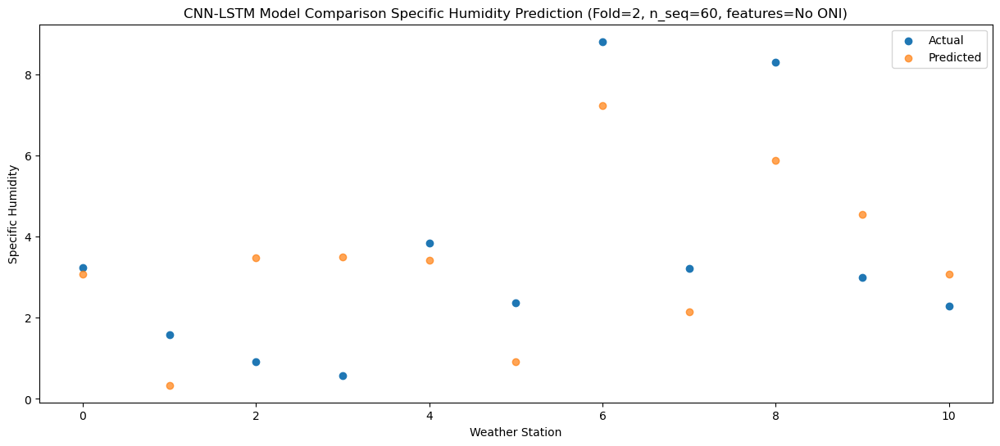

Predictions for (t+5):
    Weather_Station  Actual  Predicted
0                 0    3.07   3.177868
1                 1    1.87   0.447868
2                 2    2.40   3.597868
3                 3    0.95   3.617868
4                 4    2.89   3.527868
5                 5    1.85   1.017868
6                 6    8.39   7.337868
7                 7    1.81   2.247868
8                 8    9.72   5.997868
9                 9    2.91   4.657868
10               10    1.72   3.177868


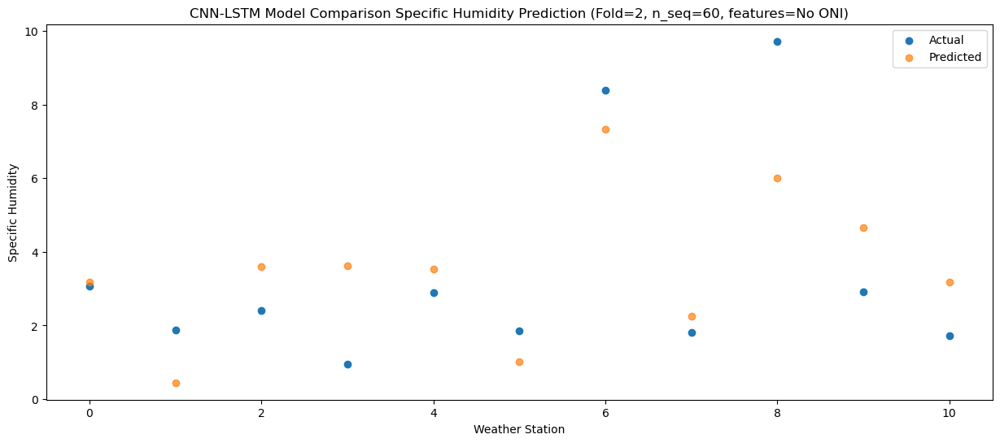

Predictions for (t+6):
    Weather_Station  Actual  Predicted
0                 0    6.06   5.971258
1                 1    4.77   3.241258
2                 2    3.51   6.391258
3                 3    3.20   6.411258
4                 4    5.01   6.321258
5                 5    3.93   3.811258
6                 6   11.33  10.131258
7                 7    2.05   5.041258
8                 8   10.48   8.791258
9                 9    6.24   7.451258
10               10    4.51   5.971258


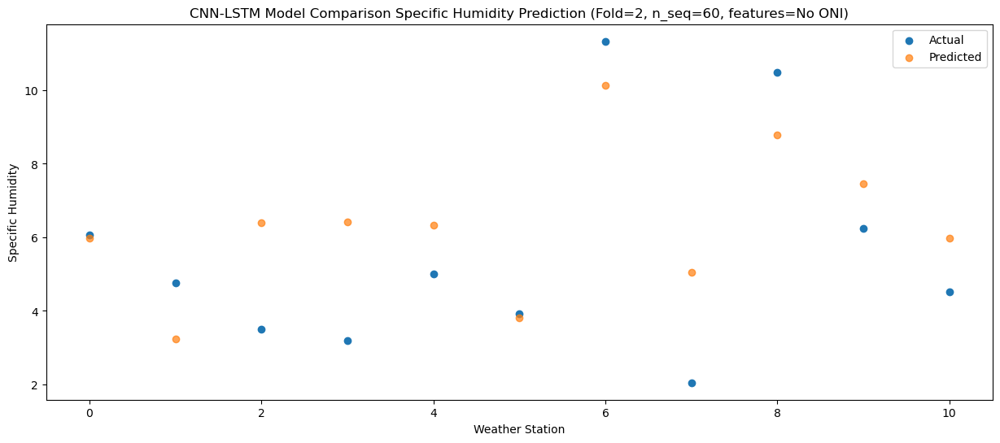

Predictions for (t+7):
    Weather_Station  Actual  Predicted
0                 0    9.21   9.135049
1                 1    6.19   6.405049
2                 2    6.85   9.555049
3                 3    7.21   9.575049
4                 4    8.35   9.485049
5                 5    6.05   6.975049
6                 6   13.61  13.295049
7                 7    3.73   8.205049
8                 8   10.46  11.955049
9                 9    9.75  10.615049
10               10    7.95   9.135049


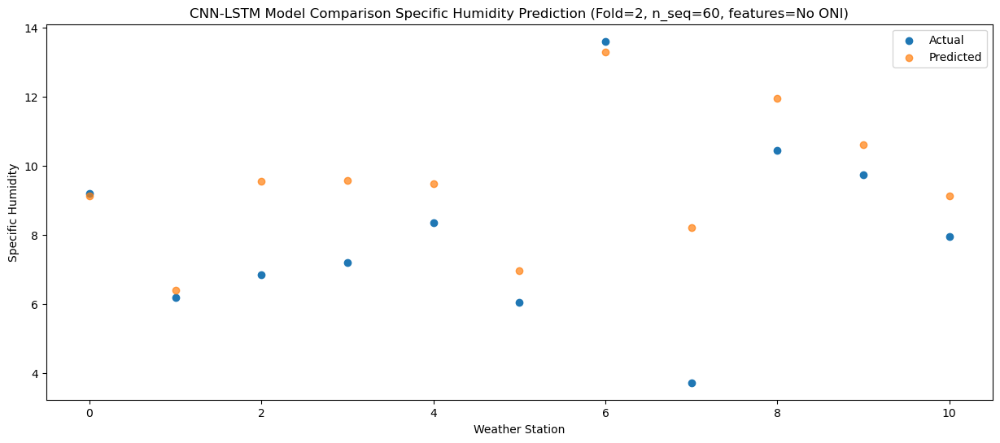

Predictions for (t+8):
    Weather_Station  Actual  Predicted
0                 0   12.91  11.873716
1                 1   11.00   9.143716
2                 2    7.87  12.293716
3                 3   10.59  12.313716
4                 4   10.48  12.223716
5                 5    8.63   9.713716
6                 6   16.52  16.033716
7                 7    7.17  10.943716
8                 8   11.23  14.693716
9                 9   12.60  13.353716
10               10   10.65  11.873716


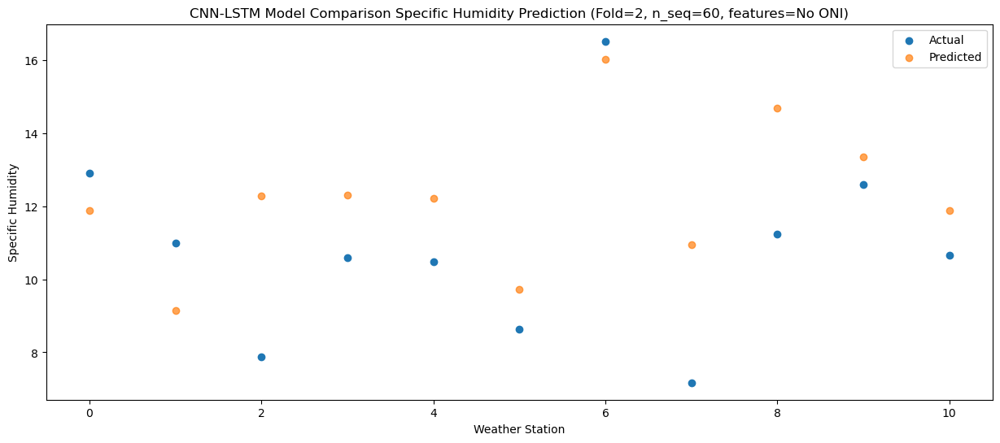

Predictions for (t+9):
    Weather_Station  Actual  Predicted
0                 0   10.75  10.546676
1                 1    9.57   7.816676
2                 2    8.57  10.966676
3                 3    9.76  10.986676
4                 4    9.75  10.896676
5                 5    7.19   8.386676
6                 6   13.82  14.706676
7                 7    5.44   9.616676
8                 8   12.31  13.366676
9                 9   12.59  12.026676
10               10   10.41  10.546676


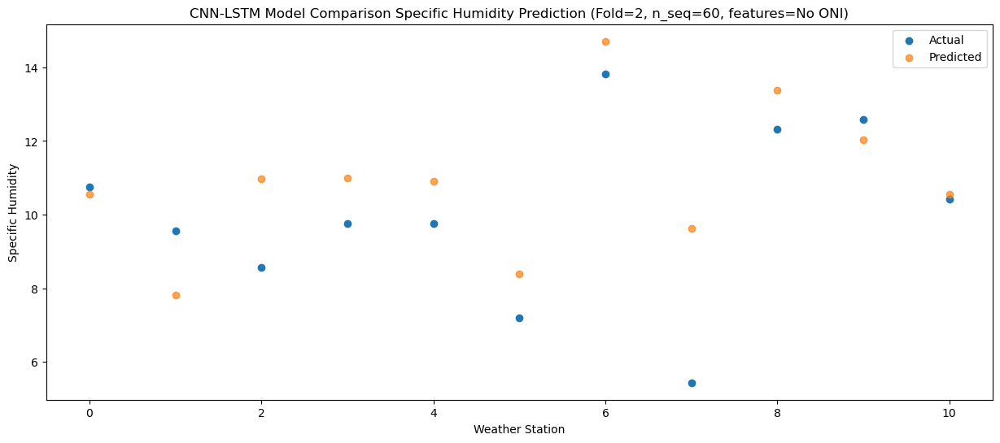

Predictions for (t+10):
    Weather_Station  Actual  Predicted
0                 0    8.29   8.015308
1                 1    5.51   5.285308
2                 2    7.87   8.435308
3                 3    6.67   8.455308
4                 4    7.95   8.365308
5                 5    5.74   5.855308
6                 6   12.88  12.175308
7                 7    4.79   7.085308
8                 8   10.53  10.835308
9                 9    8.87   9.495308
10               10    7.80   8.015308


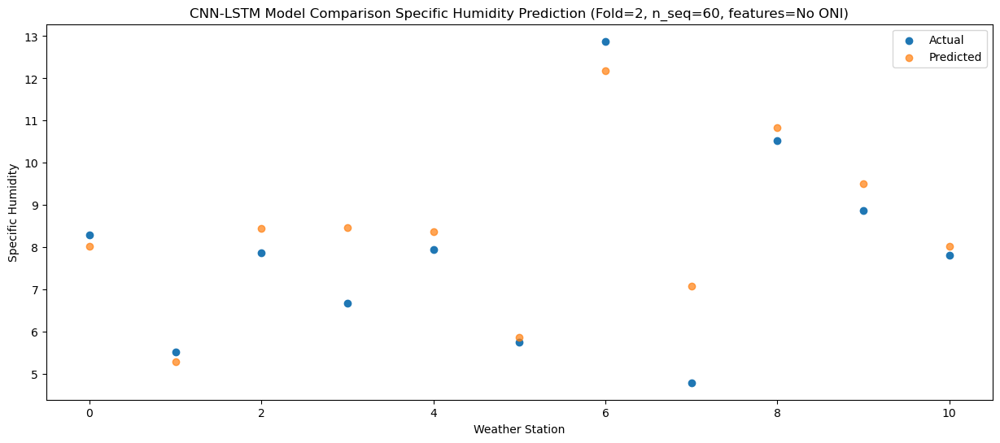

Predictions for (t+11):
    Weather_Station  Actual  Predicted
0                 0    3.70   4.588982
1                 1    1.78   1.858982
2                 2    5.28   5.008982
3                 3    4.16   5.028982
4                 4    4.74   4.938982
5                 5    1.87   2.428982
6                 6    8.39   8.748982
7                 7    1.72   3.658982
8                 8    9.40   7.408982
9                 9    6.25   6.068982
10               10    4.61   4.588982


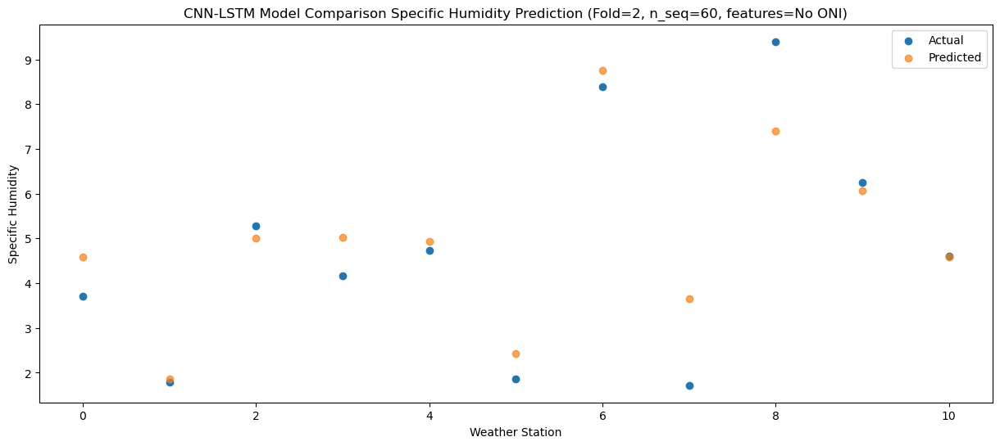

Predictions for (t+12):
    Weather_Station  Actual  Predicted
0                 0    1.45   3.004195
1                 1    1.56   0.274195
2                 2    2.33   3.424195
3                 3    2.29   3.444195
4                 4    2.01   3.354195
5                 5   -0.19   0.844195
6                 6    6.80   7.164195
7                 7    1.77   2.074195
8                 8    7.16   5.824195
9                 9    3.60   4.484195
10               10    1.49   3.004195


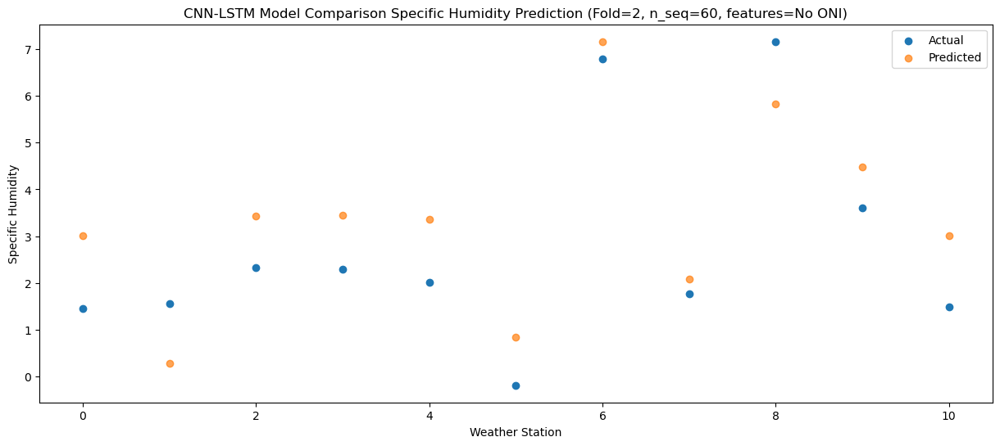

Predictions for (t+13):
    Weather_Station  Actual  Predicted
0                 0   -0.28   1.041169
1                 1   -0.17  -1.688831
2                 2   -2.34   1.461169
3                 3    0.37   1.481169
4                 4   -1.27   1.391169
5                 5   -2.51  -1.118831
6                 6    4.09   5.201169
7                 7    0.51   0.111169
8                 8    5.59   3.861169
9                 9    0.38   2.521169
10               10   -0.30   1.041169


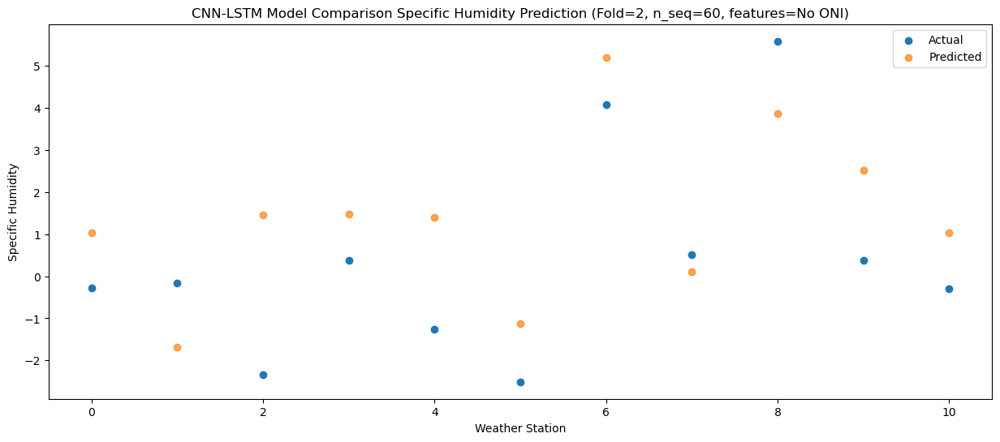

Predictions for (t+14):
    Weather_Station  Actual  Predicted
0                 0   -0.51   0.816713
1                 1   -0.22  -1.913287
2                 2   -1.85   1.236713
3                 3   -0.71   1.256713
4                 4   -1.14   1.166713
5                 5   -2.64  -1.343287
6                 6    3.99   4.976713
7                 7    0.79  -0.113287
8                 8    6.44   3.636713
9                 9    0.26   2.296713
10               10   -0.29   0.816713


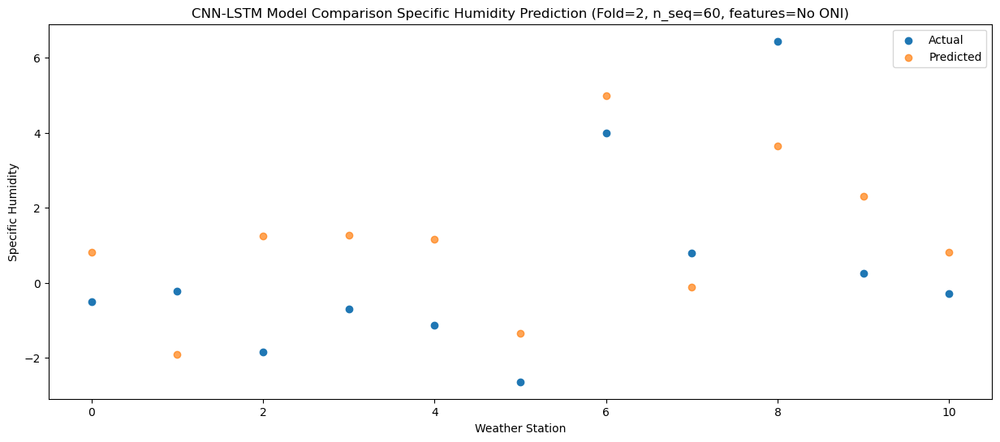

Predictions for (t+15):
    Weather_Station  Actual  Predicted
0                 0   -1.23   0.529419
1                 1   -0.90  -2.200581
2                 2    0.28   0.949419
3                 3   -0.54   0.969419
4                 4   -1.16   0.879419
5                 5   -2.69  -1.630581
6                 6    3.66   4.689419
7                 7    0.66  -0.400581
8                 8    6.97   3.349419
9                 9    0.33   2.009419
10               10   -0.05   0.529419


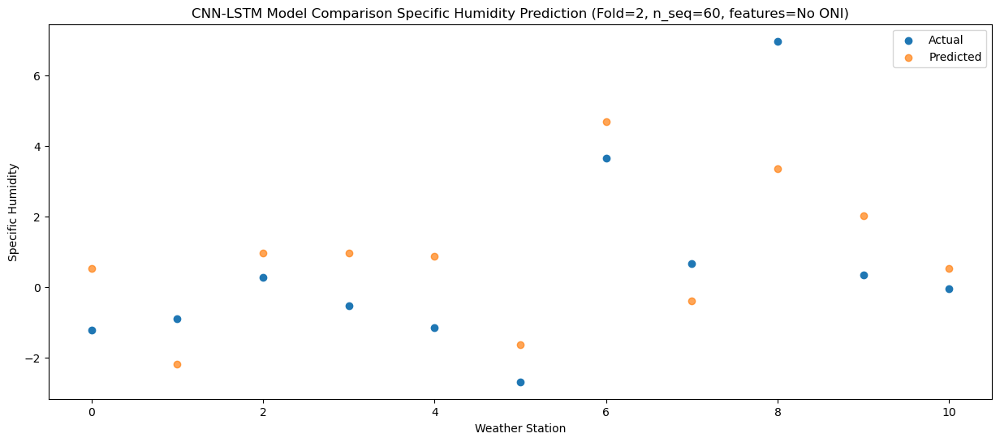

Predictions for (t+16):
    Weather_Station  Actual  Predicted
0                 0    2.05    2.37183
1                 1    0.95   -0.35817
2                 2    0.50    2.79183
3                 3    0.10    2.81183
4                 4    2.13    2.72183
5                 5    0.30    0.21183
6                 6    6.52    6.53183
7                 7    0.75    1.44183
8                 8    7.08    5.19183
9                 9    2.06    3.85183
10               10    0.98    2.37183


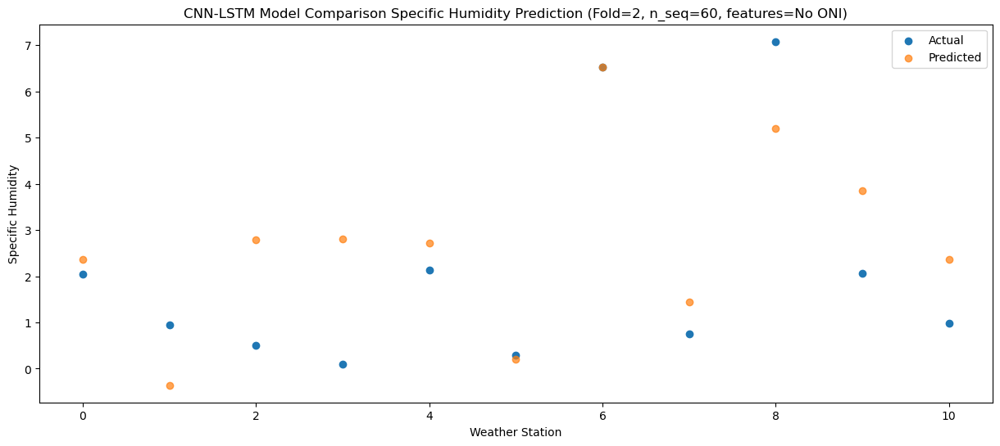

Predictions for (t+17):
    Weather_Station  Actual  Predicted
0                 0    2.44   3.458633
1                 1    1.07   0.728633
2                 2    1.47   3.878633
3                 3    1.45   3.898633
4                 4    2.15   3.808633
5                 5    1.87   1.298633
6                 6    7.84   7.618633
7                 7    1.05   2.528633
8                 8    8.40   6.278633
9                 9    2.59   4.938633
10               10    1.59   3.458633


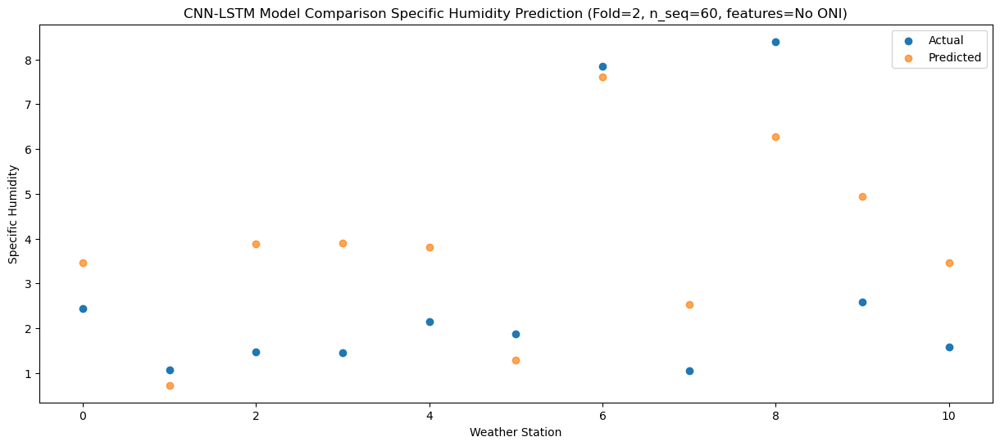

Predictions for (t+18):
    Weather_Station  Actual  Predicted
0                 0    5.11   6.037802
1                 1    6.19   3.307802
2                 2    2.78   6.457802
3                 3    3.13   6.477802
4                 4    5.35   6.387802
5                 5    6.70   3.877802
6                 6   12.04  10.197802
7                 7    1.17   5.107802
8                 8    9.88   8.857802
9                 9    5.30   7.517802
10               10    4.26   6.037802


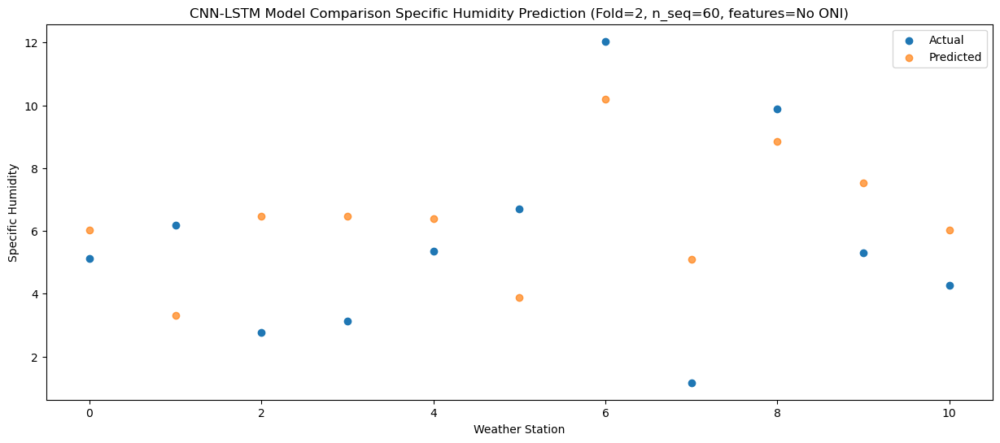

Predictions for (t+19):
    Weather_Station  Actual  Predicted
0                 0    9.76  10.273544
1                 1    9.10   7.543544
2                 2    6.56  10.693544
3                 3    7.73  10.713544
4                 4    9.24  10.623544
5                 5    9.34   8.113544
6                 6   15.79  14.433544
7                 7    3.83   9.343544
8                 8   11.13  13.093544
9                 9    9.80  11.753544
10               10    8.36  10.273544


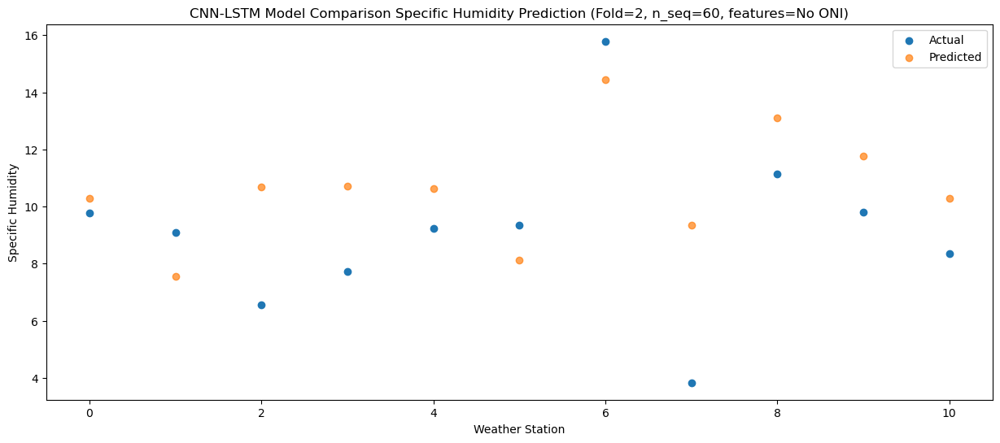

Predictions for (t+20):
    Weather_Station  Actual  Predicted
0                 0   11.86   11.56374
1                 1   10.71    8.83374
2                 2    6.96   11.98374
3                 3   10.33   12.00374
4                 4   10.27   11.91374
5                 5    8.30    9.40374
6                 6   16.61   15.72374
7                 7    9.07   10.63374
8                 8   12.28   14.38374
9                 9   11.32   13.04374
10               10    9.77   11.56374


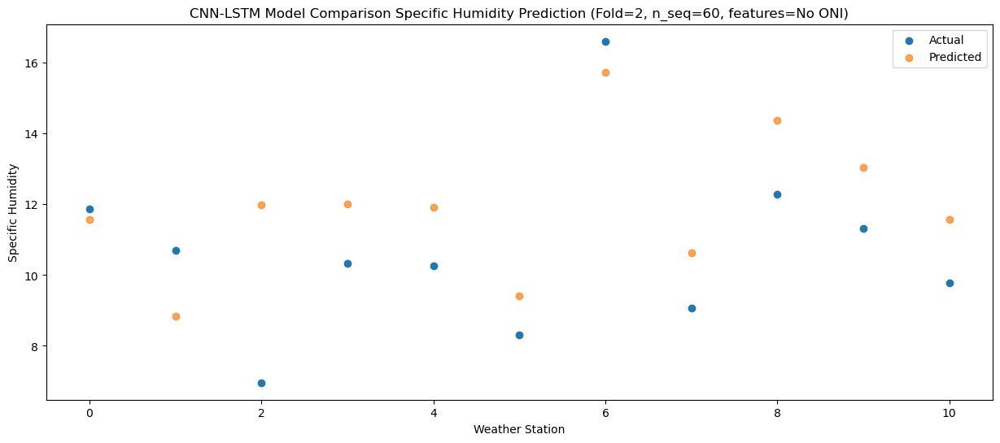

Predictions for (t+21):
    Weather_Station  Actual  Predicted
0                 0   11.56  11.808804
1                 1    9.09   9.078804
2                 2    7.58  12.228804
3                 3   11.07  12.248804
4                 4    9.87  12.158804
5                 5    8.43   9.648804
6                 6   16.99  15.968804
7                 7    9.36  10.878804
8                 8   11.68  14.628804
9                 9   11.90  13.288804
10               10   10.16  11.808804


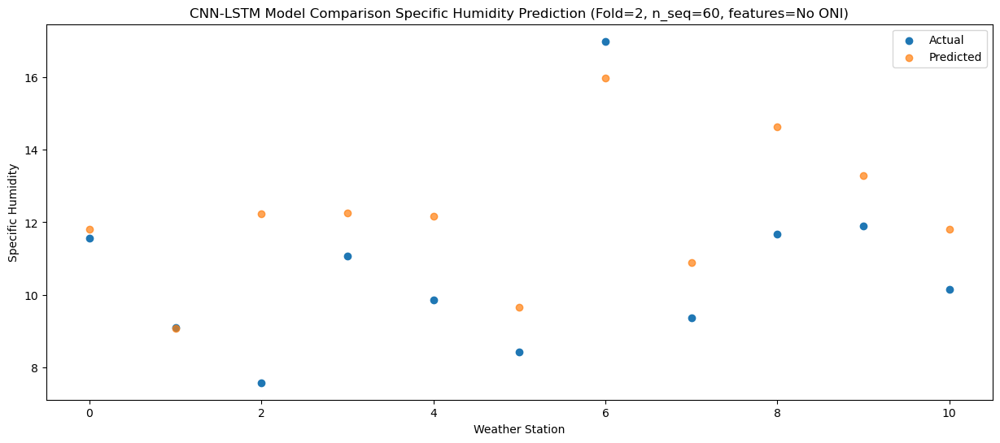

Predictions for (t+22):
    Weather_Station  Actual  Predicted
0                 0    7.79   8.624913
1                 1    6.27   5.894913
2                 2    6.30   9.044913
3                 3    8.41   9.064913
4                 4    7.73   8.974913
5                 5    4.87   6.464913
6                 6   12.54  12.784913
7                 7    6.60   7.694913
8                 8   11.22  11.444913
9                 9    8.30  10.104913
10               10    6.95   8.624913


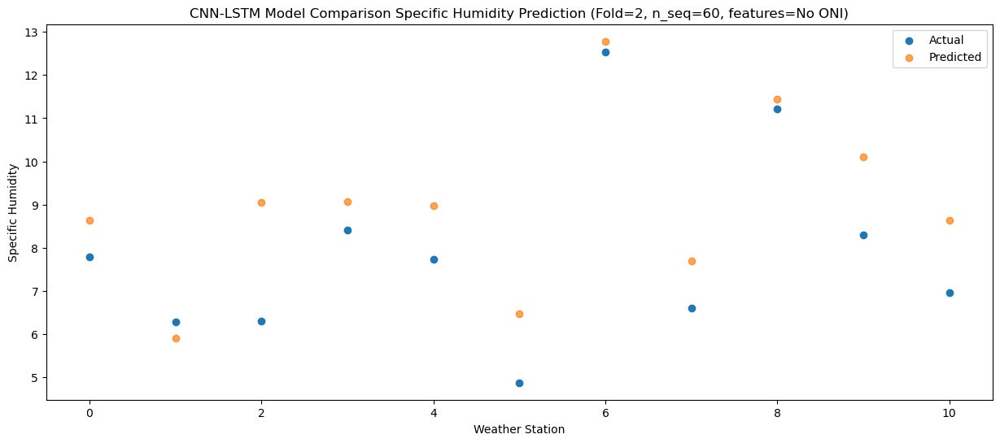

Predictions for (t+23):
    Weather_Station  Actual  Predicted
0                 0    5.34    6.74285
1                 1    2.88    4.01285
2                 2    3.64    7.16285
3                 3    5.45    7.18285
4                 4    5.20    7.09285
5                 5    3.28    4.58285
6                 6    9.93   10.90285
7                 7    2.89    5.81285
8                 8    8.42    9.56285
9                 9    6.14    8.22285
10               10    5.22    6.74285


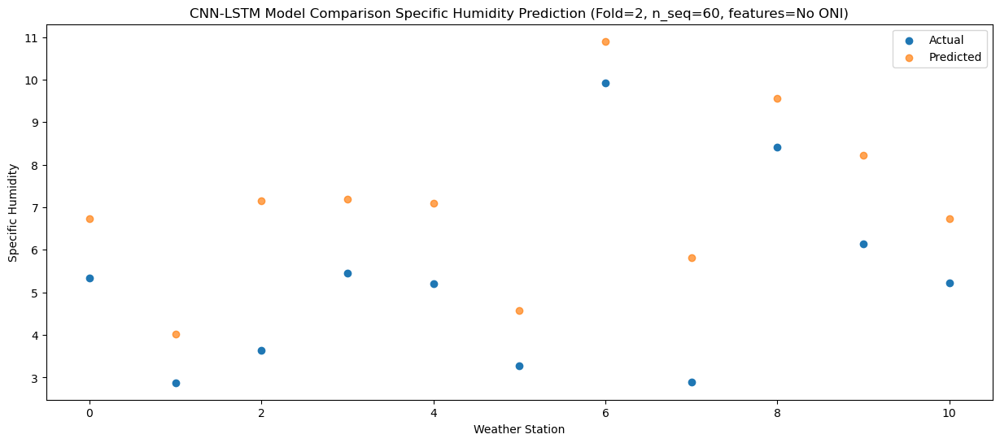

Predictions for (t+24):
    Weather_Station  Actual  Predicted
0                 0    0.15   2.233679
1                 1    0.45  -0.496321
2                 2   -0.31   2.653679
3                 3    1.00   2.673679
4                 4   -0.46   2.583679
5                 5   -0.91   0.073679
6                 6    5.94   6.393679
7                 7    1.24   1.303679
8                 8    7.88   5.053679
9                 9    0.58   3.713679
10               10   -0.14   2.233679


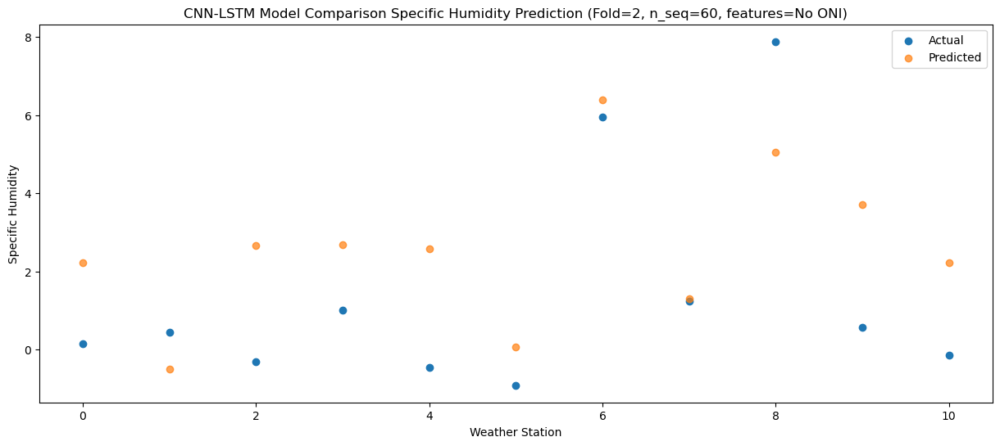

Predictions for (t+25):
    Weather_Station  Actual  Predicted
0                 0    2.55   2.853529
1                 1   -0.61   0.123529
2                 2    1.09   3.273529
3                 3    0.64   3.293529
4                 4    2.82   3.203529
5                 5    1.96   0.693529
6                 6    8.44   7.013529
7                 7    1.37   1.923529
8                 8    7.70   5.673529
9                 9    2.43   4.333529
10               10    1.42   2.853529


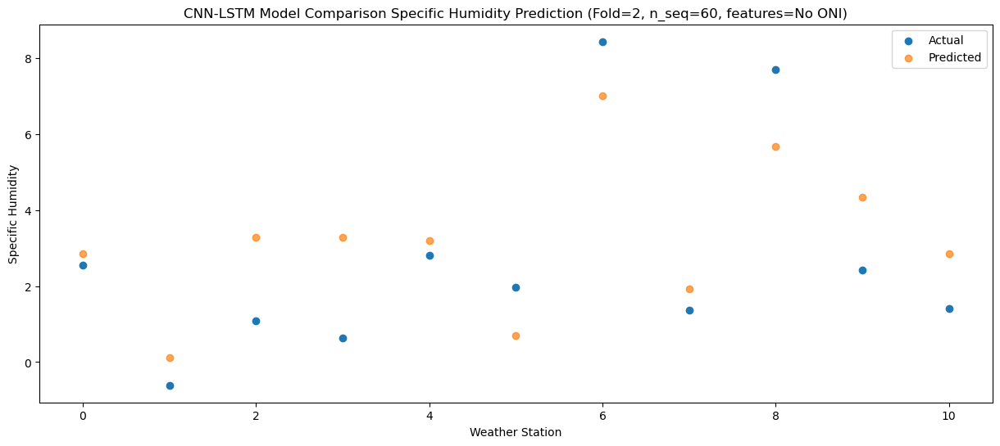

Predictions for (t+26):
    Weather_Station  Actual  Predicted
0                 0   -1.44   0.601268
1                 1   -0.94  -2.128732
2                 2   -2.56   1.021268
3                 3   -0.69   1.041268
4                 4   -2.09   0.951268
5                 5   -3.67  -1.558732
6                 6    3.15   4.761268
7                 7    1.09  -0.328732
8                 8    6.34   3.421268
9                 9   -0.35   2.081268
10               10   -1.00   0.601268


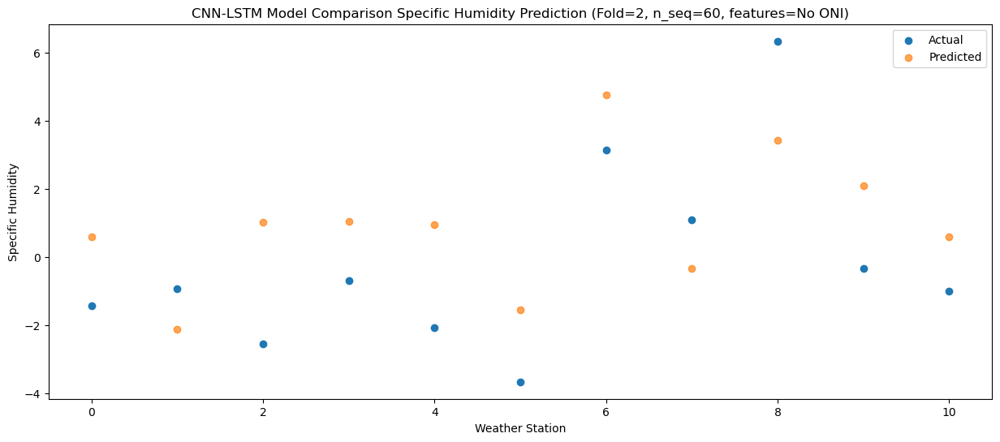

Predictions for (t+27):
    Weather_Station  Actual  Predicted
0                 0   -0.78   1.142109
1                 1   -1.03  -1.587891
2                 2   -1.37   1.562109
3                 3   -0.12   1.582109
4                 4   -0.63   1.492109
5                 5   -3.45  -1.017891
6                 6    3.62   5.302109
7                 7    0.10   0.212109
8                 8    5.60   3.962109
9                 9    0.96   2.622109
10               10   -0.10   1.142109


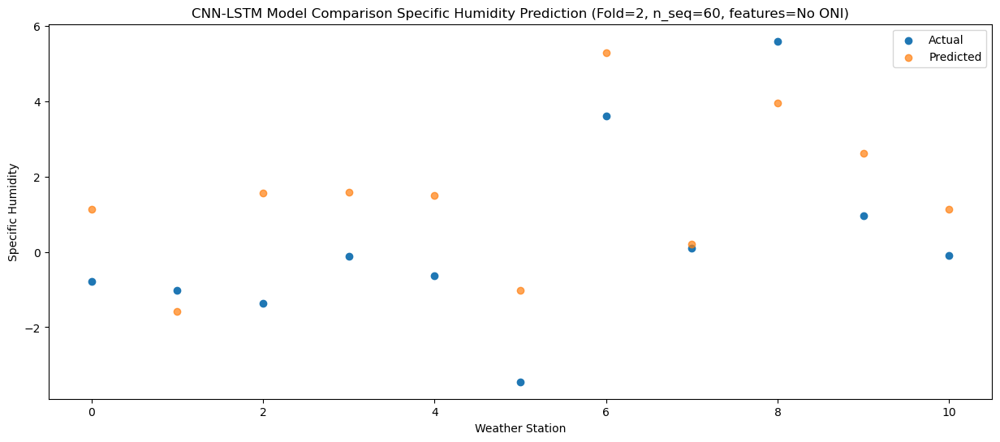

Predictions for (t+28):
    Weather_Station  Actual  Predicted
0                 0    0.65    2.31285
1                 1   -0.15   -0.41715
2                 2    0.44    2.73285
3                 3    0.64    2.75285
4                 4    0.22    2.66285
5                 5   -1.83    0.15285
6                 6    5.25    6.47285
7                 7    0.50    1.38285
8                 8    7.34    5.13285
9                 9    1.92    3.79285
10               10    0.52    2.31285


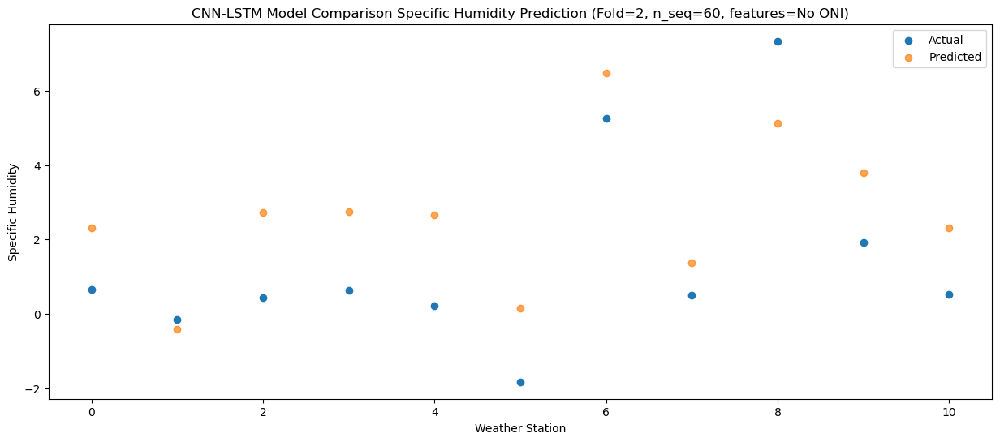

Predictions for (t+29):
    Weather_Station  Actual  Predicted
0                 0    2.55   3.767123
1                 1    1.00   1.037123
2                 2    1.80   4.187123
3                 3    1.34   4.207123
4                 4    2.65   4.117123
5                 5    2.13   1.607123
6                 6    9.15   7.927123
7                 7    0.51   2.837123
8                 8    8.18   6.587123
9                 9    2.96   5.247123
10               10    1.79   3.767123


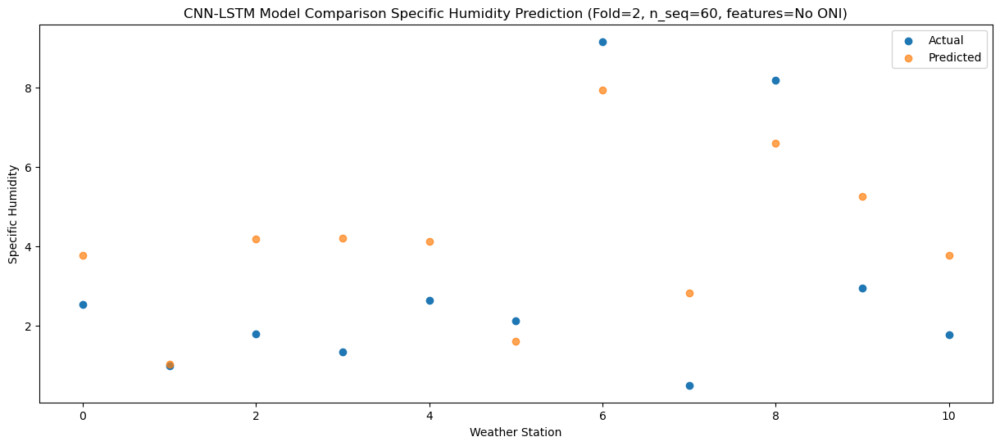

Predictions for (t+30):
    Weather_Station  Actual  Predicted
0                 0    6.81   7.620493
1                 1    3.39   4.890493
2                 2    4.90   8.040493
3                 3    4.64   8.060493
4                 4    6.68   7.970493
5                 5    5.78   5.460493
6                 6   13.24  11.780493
7                 7    0.44   6.690493
8                 8    9.44  10.440493
9                 9    7.28   9.100493
10               10    5.95   7.620493


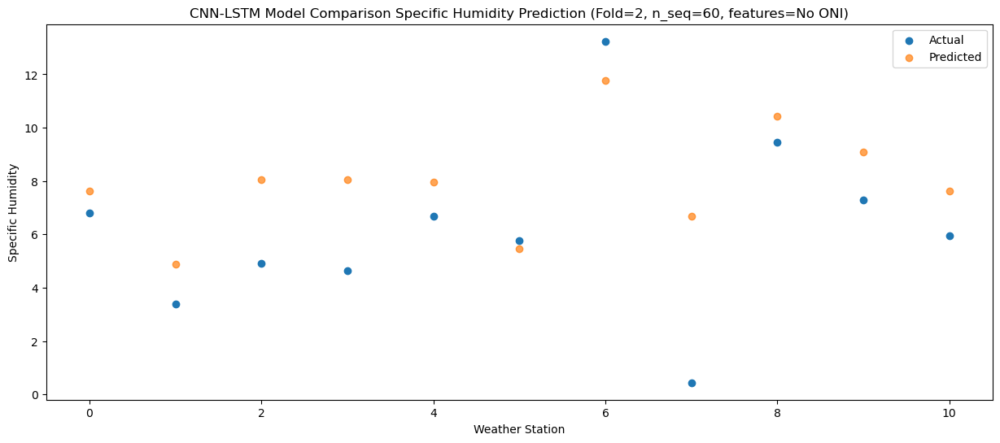

Predictions for (t+31):
    Weather_Station  Actual  Predicted
0                 0    8.86   9.783911
1                 1    7.75   7.053911
2                 2    6.83  10.203911
3                 3    6.90  10.223911
4                 4    8.98  10.133911
5                 5    6.81   7.623911
6                 6   14.04  13.943911
7                 7    5.94   8.853911
8                 8   11.21  12.603911
9                 9    9.08  11.263911
10               10    7.91   9.783911


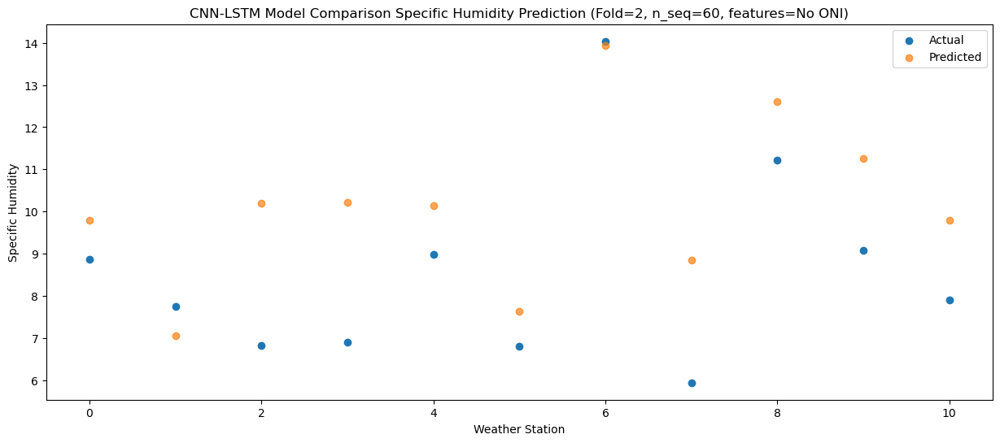

Predictions for (t+32):
    Weather_Station  Actual  Predicted
0                 0   12.08  12.052738
1                 1    9.09   9.322738
2                 2    7.66  12.472738
3                 3   10.26  12.492738
4                 4   10.27  12.402738
5                 5    7.91   9.892738
6                 6   13.36  16.212738
7                 7    8.50  11.122738
8                 8   12.10  14.872738
9                 9   12.66  13.532738
10               10   11.12  12.052738


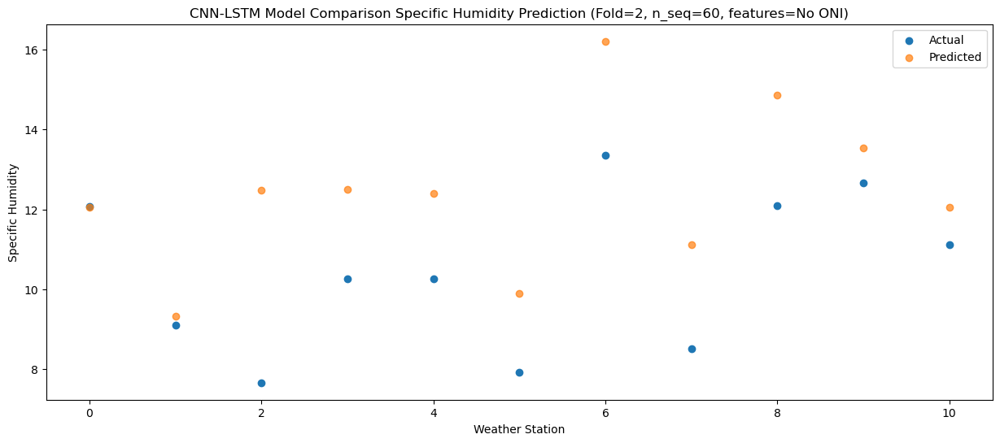

Predictions for (t+33):
    Weather_Station  Actual  Predicted
0                 0   11.60  11.762391
1                 1    8.59   9.032391
2                 2    7.55  12.182391
3                 3   10.94  12.202391
4                 4   10.67  12.112391
5                 5    8.37   9.602391
6                 6   14.42  15.922391
7                 7   10.47  10.832391
8                 8   12.20  14.582391
9                 9   11.09  13.242391
10               10   10.13  11.762391


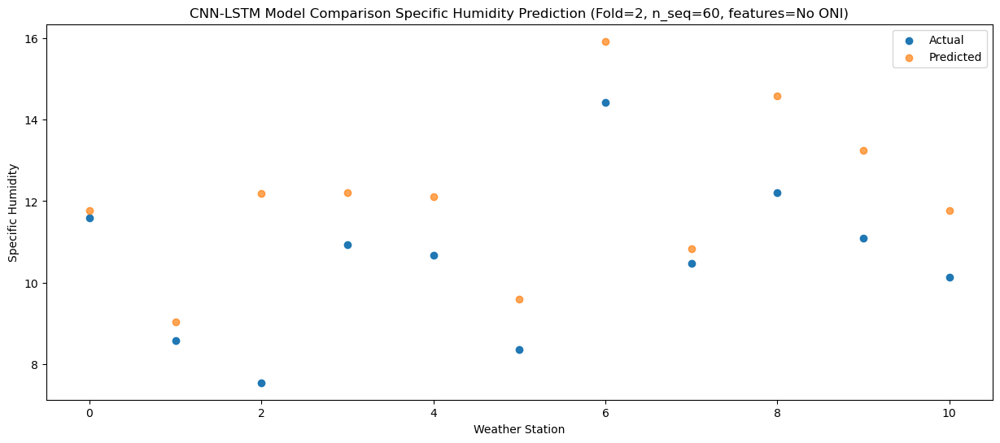

Predictions for (t+34):
    Weather_Station  Actual  Predicted
0                 0    6.85   8.872237
1                 1    6.02   6.142237
2                 2    7.40   9.292237
3                 3    7.14   9.312237
4                 4    7.16   9.222237
5                 5    5.01   6.712237
6                 6   11.75  13.032237
7                 7    7.43   7.942237
8                 8   13.05  11.692237
9                 9    7.66  10.352237
10               10    6.65   8.872237


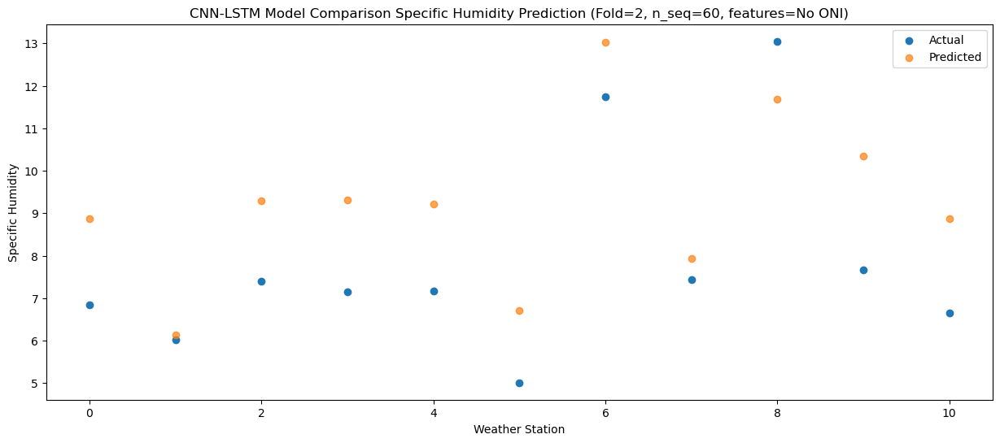

Predictions for (t+35):
    Weather_Station  Actual  Predicted
0                 0    2.13   4.543351
1                 1    2.34   1.813351
2                 2    3.01   4.963351
3                 3    4.27   4.983351
4                 4    1.98   4.893351
5                 5    0.19   2.383351
6                 6    6.97   8.703351
7                 7    5.35   3.613351
8                 8   11.28   7.363351
9                 9    3.30   6.023351
10               10    1.99   4.543351


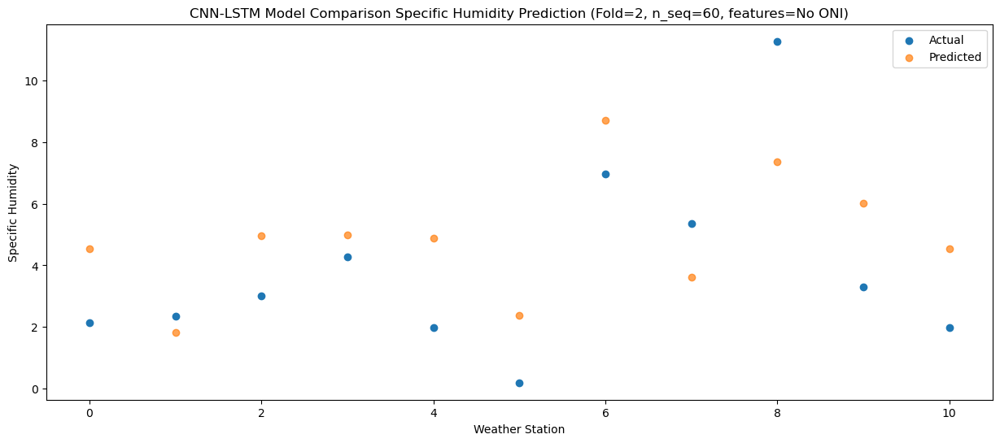

Predictions for (t+36):
    Weather_Station  Actual  Predicted
0                 0    1.19   3.387736
1                 1    0.84   0.657736
2                 2    2.90   3.807736
3                 3    2.45   3.827736
4                 4    1.54   3.737736
5                 5    0.05   1.227736
6                 6    6.52   7.547736
7                 7    1.38   2.457736
8                 8    6.64   6.207736
9                 9    2.83   4.867736
10               10    1.37   3.387736


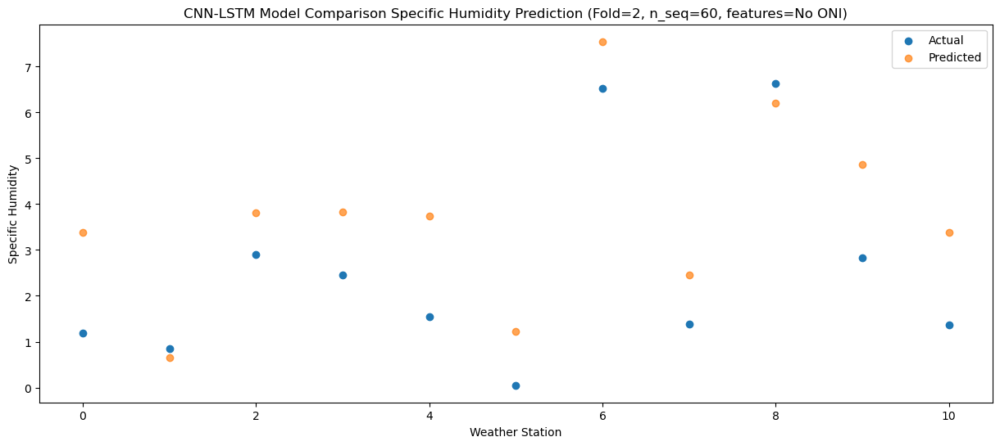

Predictions for (t+37):
    Weather_Station  Actual  Predicted
0                 0    0.56   2.068644
1                 1   -0.35  -0.661356
2                 2   -0.76   2.488644
3                 3    0.36   2.508644
4                 4    0.99   2.418644
5                 5   -0.86  -0.091356
6                 6    5.35   6.228644
7                 7    2.20   1.138644
8                 8    7.49   4.888644
9                 9    0.59   3.548644
10               10    0.28   2.068644


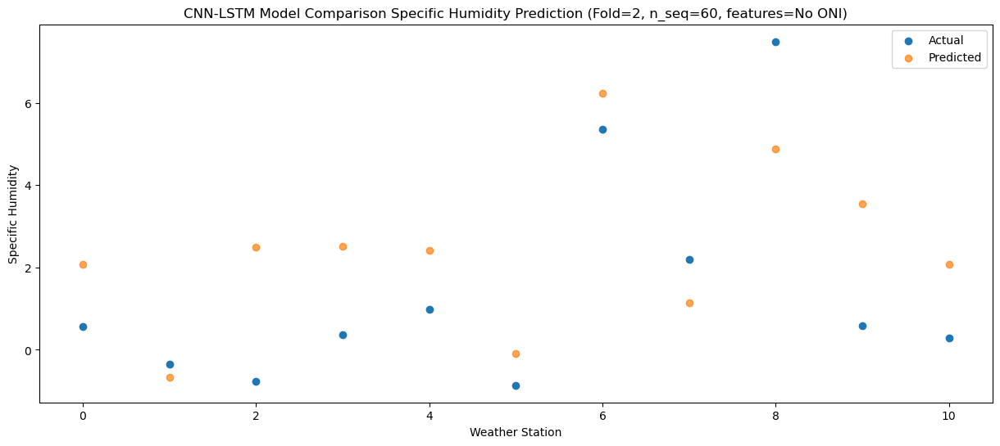

Predictions for (t+38):
    Weather_Station  Actual  Predicted
0                 0    0.97   2.528017
1                 1   -0.36  -0.201983
2                 2   -1.14   2.948017
3                 3    0.87   2.968017
4                 4    0.90   2.878017
5                 5   -1.24   0.368017
6                 6    4.57   6.688017
7                 7    1.31   1.598017
8                 8    7.58   5.348017
9                 9    1.45   4.008017
10               10    0.55   2.528017


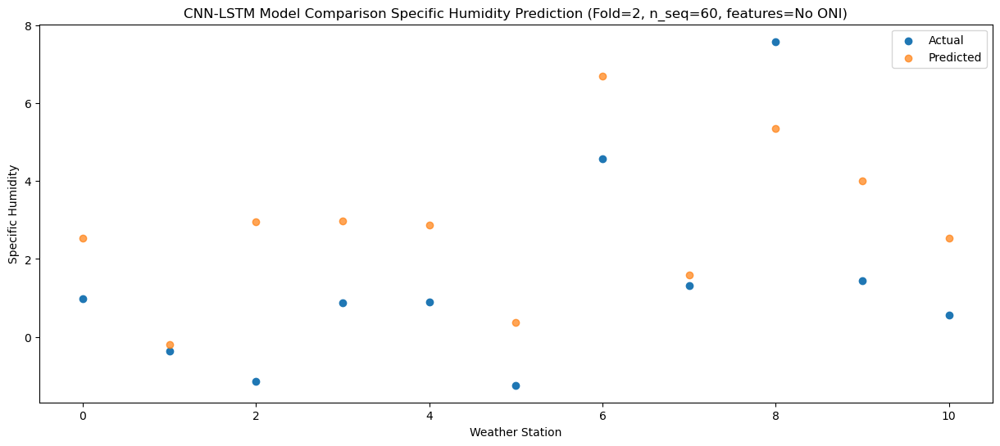

Predictions for (t+39):
    Weather_Station  Actual  Predicted
0                 0    1.19   2.496371
1                 1   -0.44  -0.233629
2                 2    0.71   2.916371
3                 3    0.11   2.936371
4                 4    2.20   2.846371
5                 5   -0.79   0.336371
6                 6    4.97   6.656371
7                 7    1.19   1.566371
8                 8    6.17   5.316371
9                 9    2.21   3.976371
10               10    0.95   2.496371


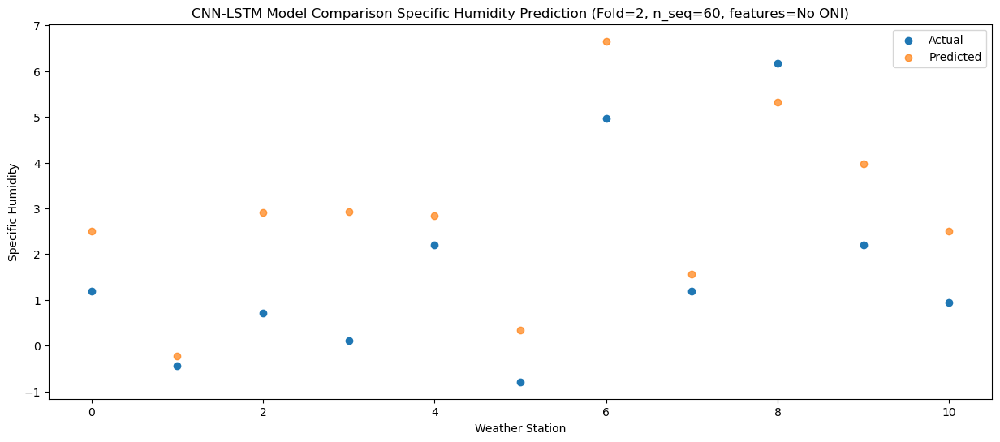

Predictions for (t+40):
    Weather_Station  Actual  Predicted
0                 0    1.54   2.837054
1                 1    0.25   0.107054
2                 2    1.10   3.257054
3                 3    0.36   3.277054
4                 4    3.08   3.187054
5                 5    0.99   0.677054
6                 6    6.88   6.997054
7                 7    1.53   1.907054
8                 8    8.09   5.657054
9                 9    1.90   4.317054
10               10    0.55   2.837054


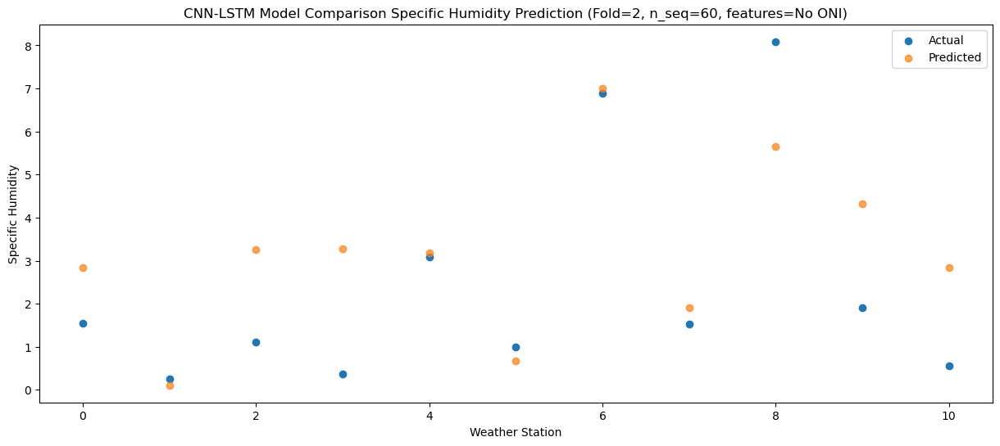

Predictions for (t+41):
    Weather_Station  Actual  Predicted
0                 0    2.48   4.342017
1                 1    0.87   1.612017
2                 2    2.61   4.762017
3                 3    2.44   4.782017
4                 4    3.63   4.692017
5                 5    1.54   2.182017
6                 6    7.55   8.502017
7                 7    0.69   3.412017
8                 8    8.79   7.162017
9                 9    4.03   5.822017
10               10    2.19   4.342017


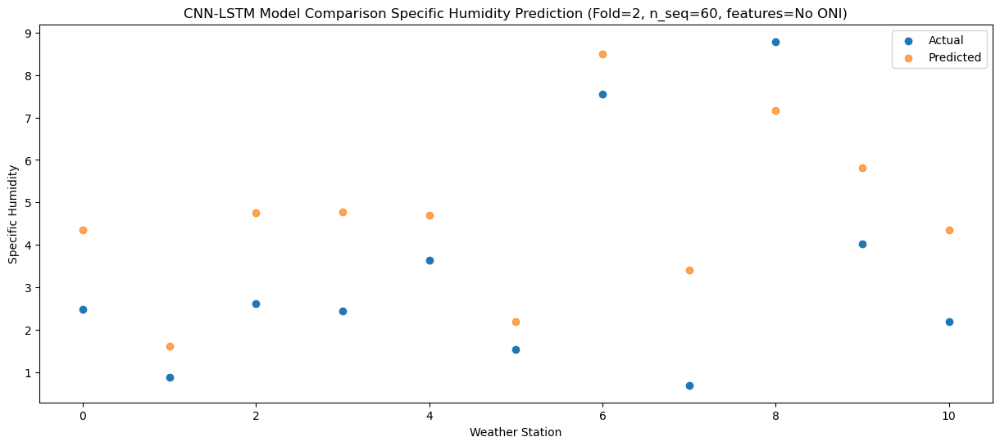

Predictions for (t+42):
    Weather_Station  Actual  Predicted
0                 0    6.09   6.879481
1                 1    6.65   4.149481
2                 2    3.42   7.299481
3                 3    3.25   7.319481
4                 4    6.69   7.229481
5                 5    5.24   4.719481
6                 6   11.44  11.039481
7                 7    2.69   5.949481
8                 8   10.19   9.699481
9                 9    5.56   8.359481
10               10    4.78   6.879481


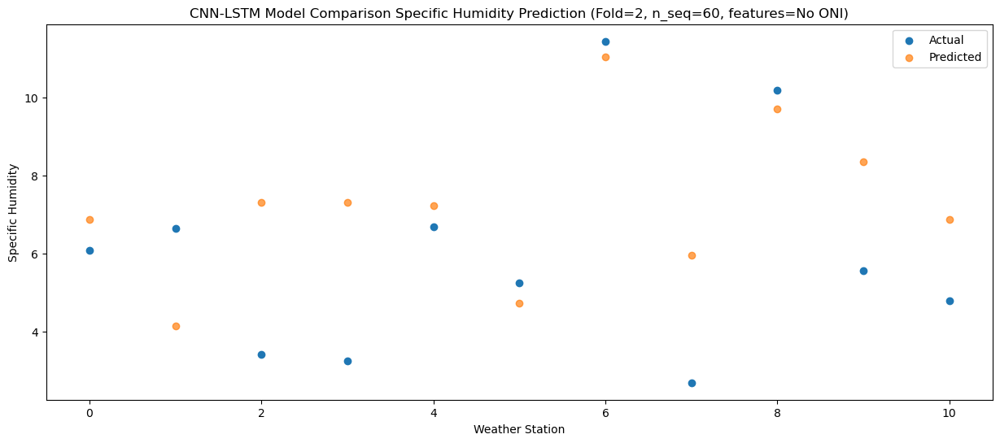

Predictions for (t+43):
    Weather_Station  Actual  Predicted
0                 0    9.06   9.678346
1                 1    9.30   6.948346
2                 2    6.58  10.098346
3                 3    7.15  10.118346
4                 4   10.00  10.028346
5                 5    8.70   7.518346
6                 6   15.34  13.838346
7                 7    2.49   8.748346
8                 8   10.57  12.498346
9                 9    8.42  11.158346
10               10    6.62   9.678346


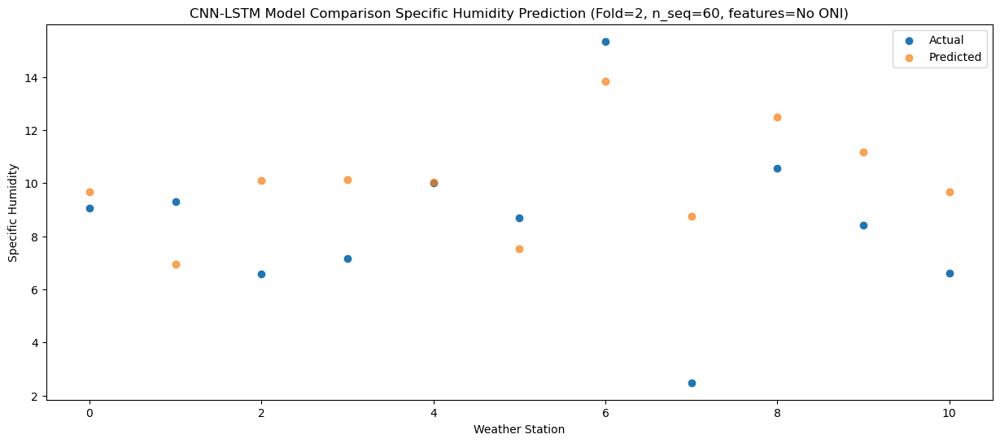

Predictions for (t+44):
    Weather_Station  Actual  Predicted
0                 0   12.24  12.246205
1                 1   11.36   9.516205
2                 2    7.55  12.666205
3                 3   11.41  12.686205
4                 4   11.34  12.596205
5                 5    8.41  10.086205
6                 6   14.63  16.406205
7                 7    5.84  11.316205
8                 8   11.91  15.066205
9                 9   12.26  13.726205
10               10    9.93  12.246205


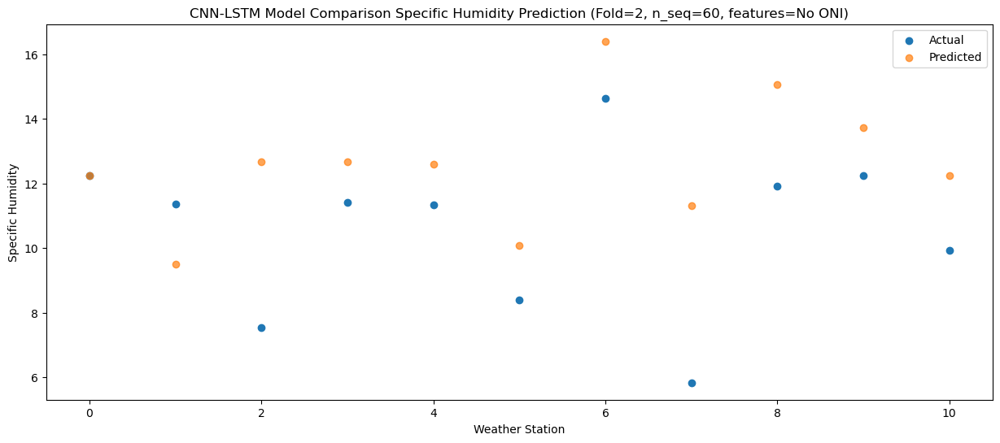

Predictions for (t+45):
    Weather_Station  Actual  Predicted
0                 0   11.59  11.925174
1                 1    9.47   9.195174
2                 2    8.27  12.345174
3                 3    9.07  12.365174
4                 4   11.37  12.275174
5                 5    6.98   9.765174
6                 6   12.58  16.085174
7                 7    8.03  10.995174
8                 8   12.52  14.745174
9                 9   11.77  13.405174
10               10   10.04  11.925174


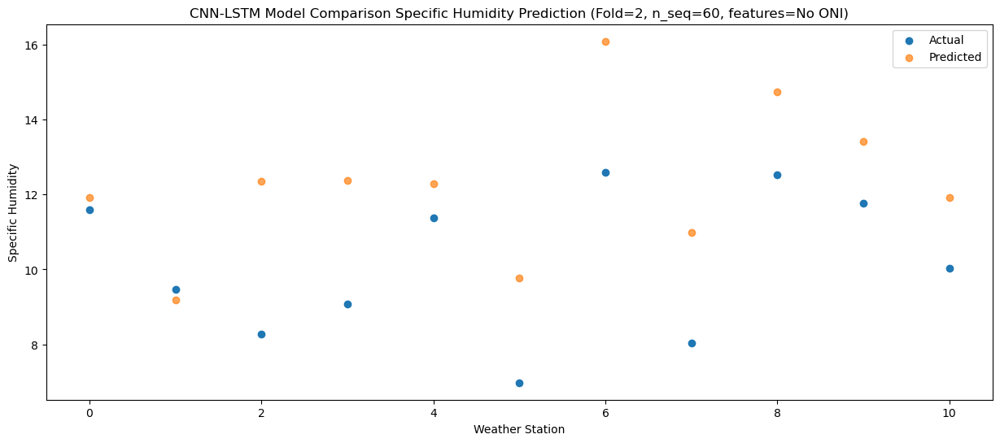

Predictions for (t+46):
    Weather_Station  Actual  Predicted
0                 0    7.56   9.535019
1                 1    6.88   6.805019
2                 2    5.88   9.955019
3                 3    8.06   9.975019
4                 4    9.02   9.885019
5                 5    6.43   7.375019
6                 6   11.95  13.695019
7                 7    6.22   8.605019
8                 8   12.27  12.355019
9                 9    8.63  11.015019
10               10    7.62   9.535019


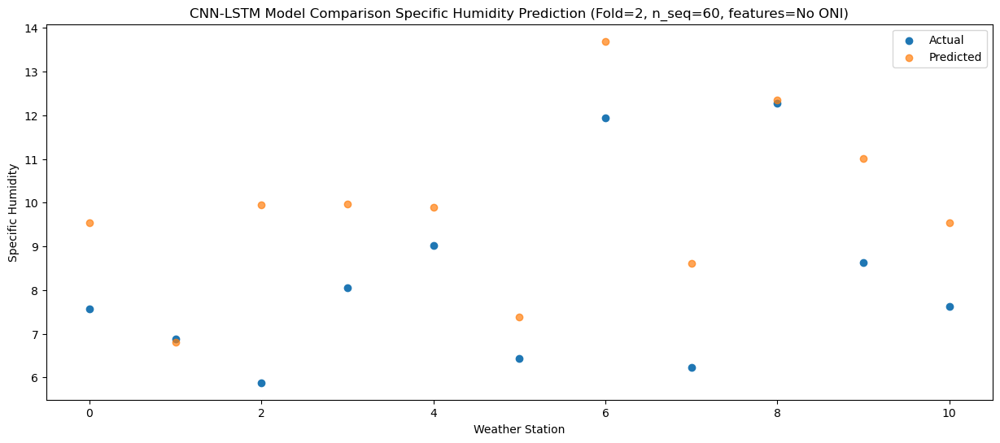

Predictions for (t+47):
    Weather_Station  Actual  Predicted
0                 0    3.46     6.1422
1                 1    3.42     3.4122
2                 2    2.96     6.5622
3                 3    4.70     6.5822
4                 4    3.79     6.4922
5                 5    2.90     3.9822
6                 6    8.80    10.3022
7                 7    3.77     5.2122
8                 8    9.97     8.9622
9                 9    4.44     7.6222
10               10    3.51     6.1422


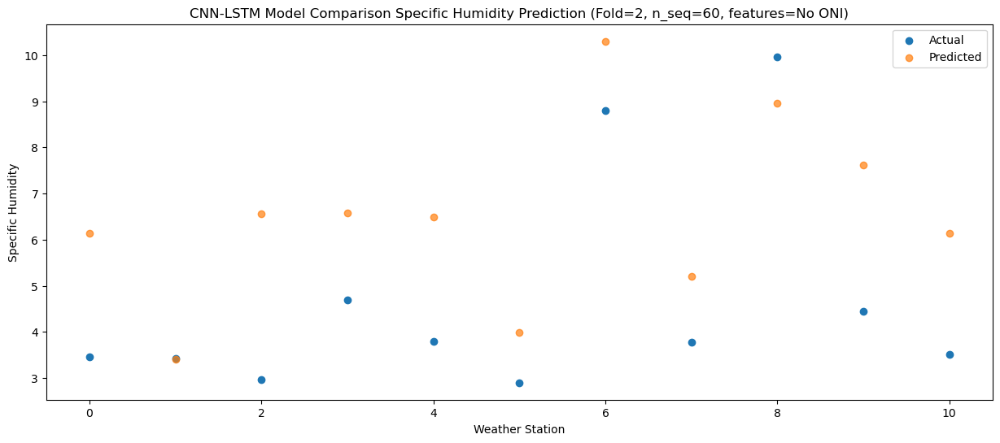

Predictions for (t+48):
    Weather_Station  Actual  Predicted
0                 0    0.82    3.17218
1                 1    0.86    0.44218
2                 2    0.46    3.59218
3                 3    0.87    3.61218
4                 4    1.27    3.52218
5                 5   -0.27    1.01218
6                 6    6.18    7.33218
7                 7    2.85    2.24218
8                 8    6.94    5.99218
9                 9    1.33    4.65218
10               10    0.56    3.17218


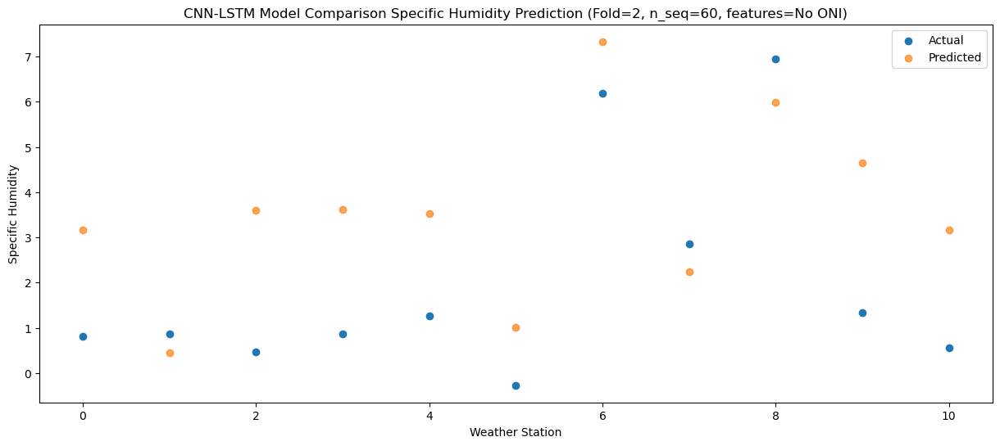

Predictions for (t+49):
    Weather_Station  Actual  Predicted
0                 0   -0.10   2.921758
1                 1    0.47   0.191758
2                 2   -0.11   3.341758
3                 3    1.16   3.361758
4                 4   -0.32   3.271758
5                 5   -2.20   0.761758
6                 6    4.36   7.081758
7                 7    1.33   1.991758
8                 8    7.73   5.741758
9                 9    1.24   4.401758
10               10    0.35   2.921758


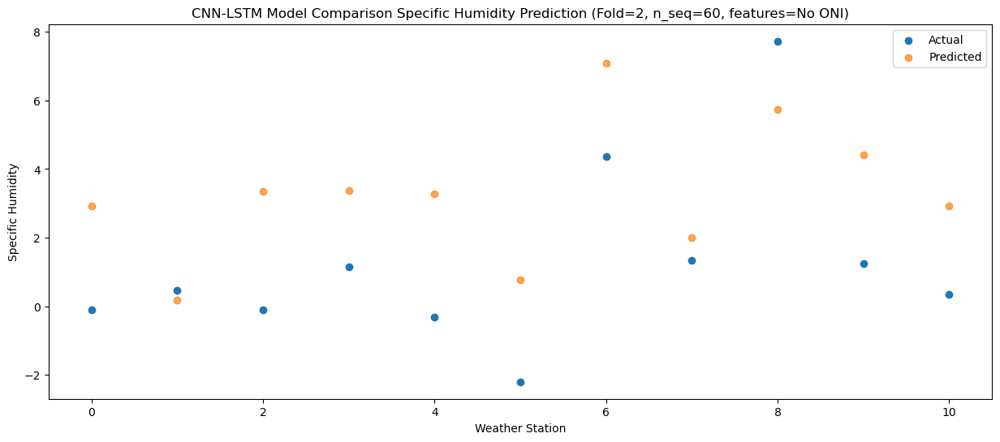

Predictions for (t+50):
    Weather_Station  Actual  Predicted
0                 0   -0.99   1.911005
1                 1   -0.12  -0.818995
2                 2   -1.18   2.331005
3                 3   -0.17   2.351005
4                 4   -1.19   2.261005
5                 5   -3.21  -0.248995
6                 6    3.24   6.071005
7                 7    1.75   0.981005
8                 8    7.70   4.731005
9                 9    0.55   3.391005
10               10   -0.27   1.911005


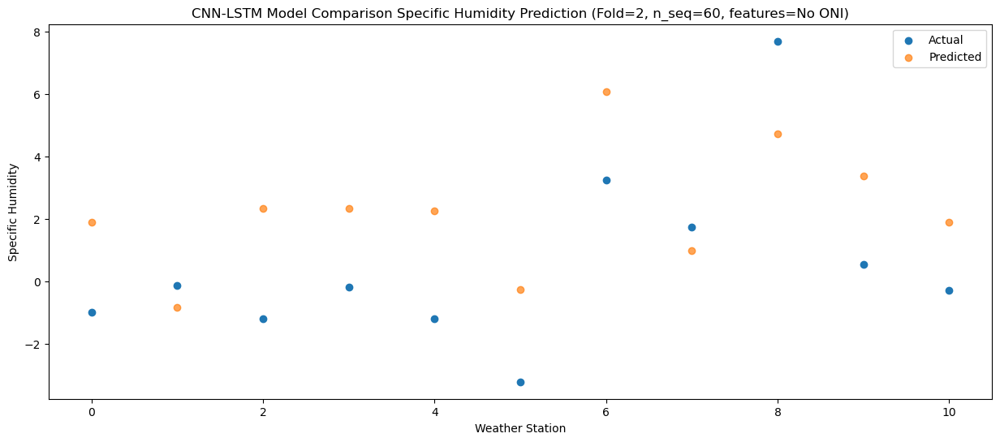

Predictions for (t+51):
    Weather_Station  Actual  Predicted
0                 0    0.88   2.447139
1                 1    0.70  -0.282861
2                 2   -1.60   2.867139
3                 3   -0.22   2.887139
4                 4   -0.13   2.797139
5                 5   -0.81   0.287139
6                 6    5.71   6.607139
7                 7    1.77   1.517139
8                 8    8.67   5.267139
9                 9    0.69   3.927139
10               10    0.13   2.447139


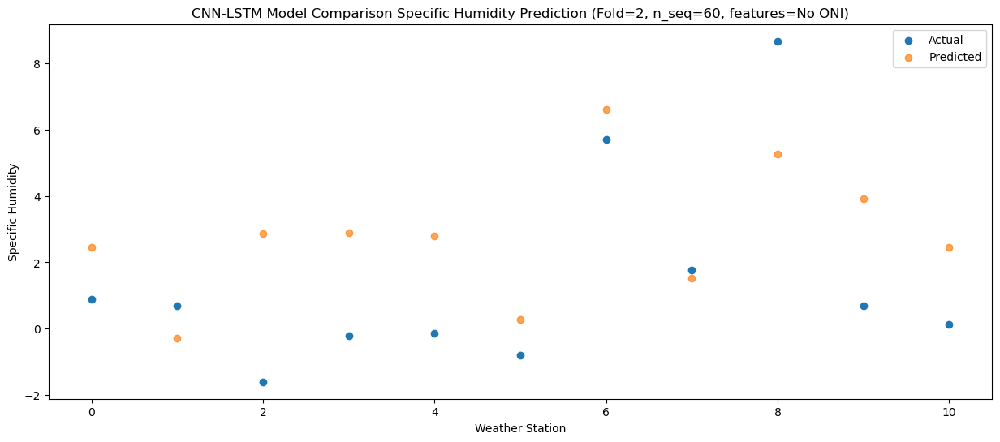

Predictions for (t+52):
    Weather_Station  Actual  Predicted
0                 0    1.70   3.465778
1                 1    0.95   0.735778
2                 2    1.56   3.885778
3                 3    0.83   3.905778
4                 4    1.47   3.815778
5                 5    0.83   1.305778
6                 6    7.33   7.625778
7                 7    1.99   2.535778
8                 8    7.11   6.285778
9                 9    2.10   4.945778
10               10    1.23   3.465778


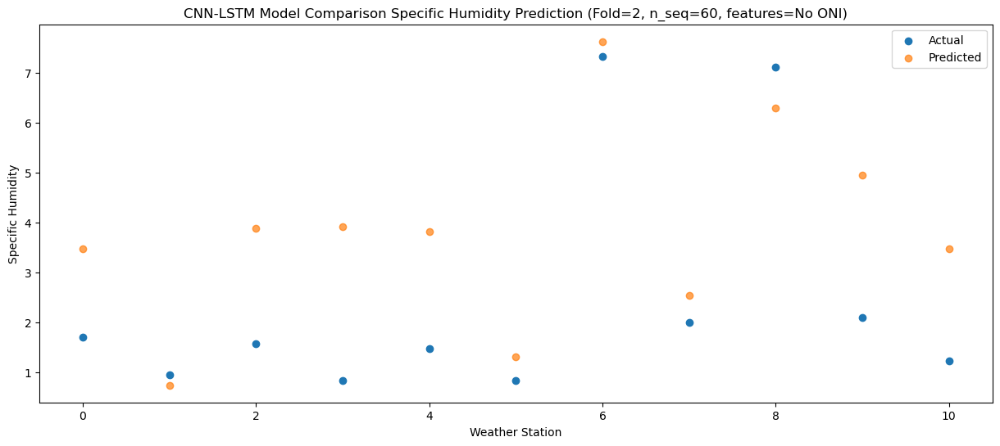

Predictions for (t+53):
    Weather_Station  Actual  Predicted
0                 0    3.91   5.180974
1                 1    1.91   2.450974
2                 2    0.35   5.600974
3                 3    1.72   5.620974
4                 4    3.54   5.530974
5                 5    3.11   3.020974
6                 6    9.53   9.340974
7                 7    1.32   4.250974
8                 8    6.21   8.000974
9                 9    4.32   6.660974
10               10    3.34   5.180974


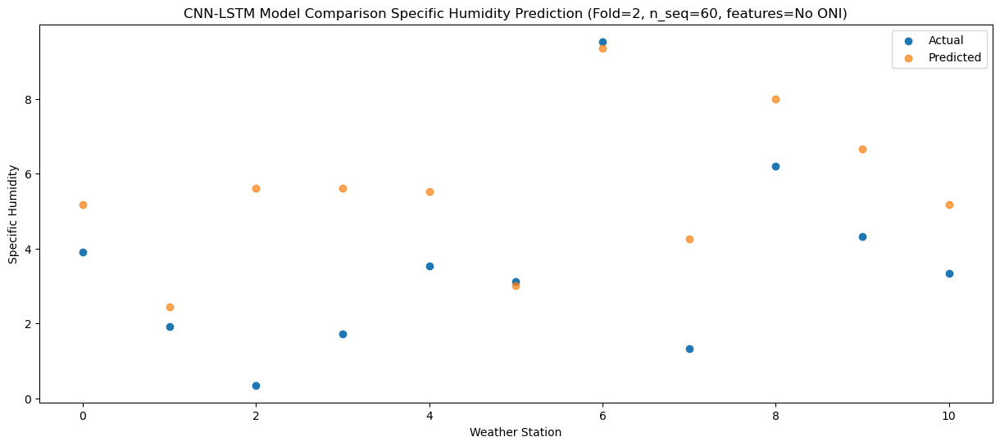

Predictions for (t+54):
    Weather_Station  Actual  Predicted
0                 0    8.17   8.655215
1                 1    4.94   5.925215
2                 2    5.21   9.075215
3                 3    4.90   9.095215
4                 4    7.97   9.005215
5                 5    7.21   6.495215
6                 6   13.31  12.815215
7                 7    1.01   7.725215
8                 8   10.31  11.475215
9                 9    8.20  10.135215
10               10    7.20   8.655215


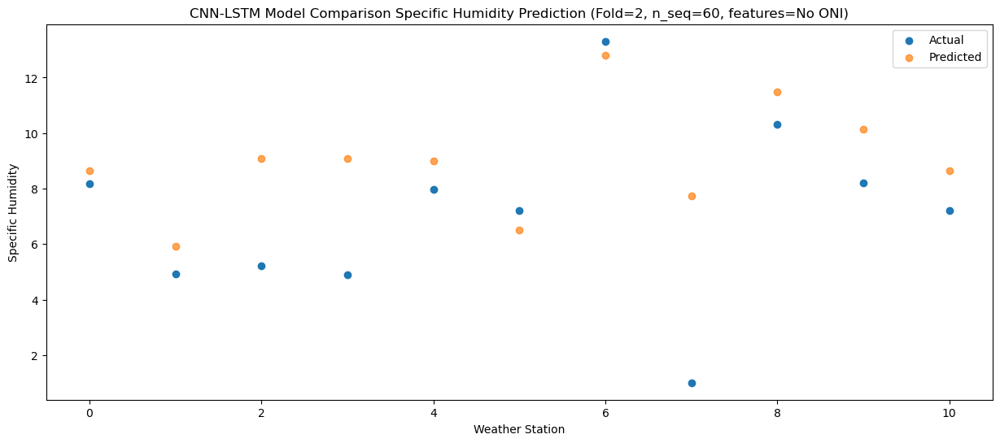

Predictions for (t+55):
    Weather_Station  Actual  Predicted
0                 0   10.14  10.988058
1                 1   10.95   8.258058
2                 2    7.27  11.408058
3                 3    7.82  11.428058
4                 4    9.94  11.338058
5                 5    8.87   8.828058
6                 6   14.90  15.148058
7                 7    5.06  10.058058
8                 8   11.91  13.808058
9                 9   10.07  12.468058
10               10    8.75  10.988058


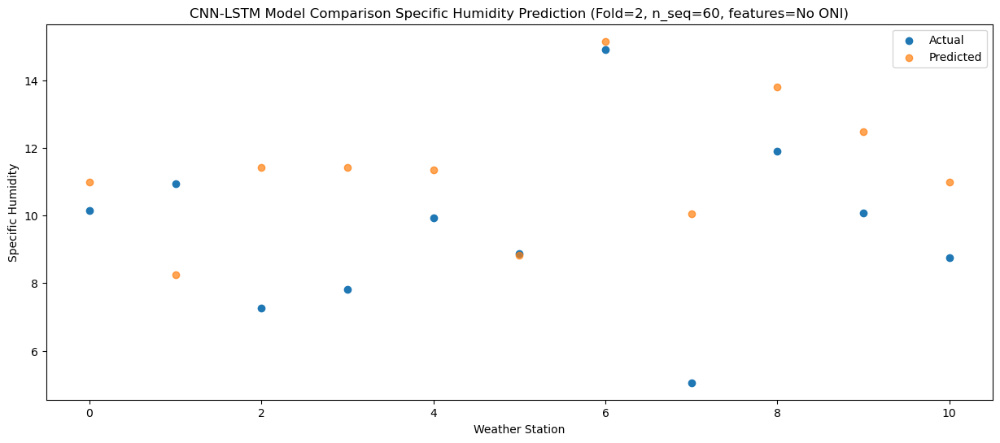

Predictions for (t+56):
    Weather_Station  Actual  Predicted
0                 0   11.61   12.36407
1                 1    9.50    9.63407
2                 2    8.32   12.78407
3                 3   10.99   12.80407
4                 4   11.58   12.71407
5                 5    9.17   10.20407
6                 6   15.13   16.52407
7                 7    8.66   11.43407
8                 8   13.14   15.18407
9                 9   12.68   13.84407
10               10   10.79   12.36407


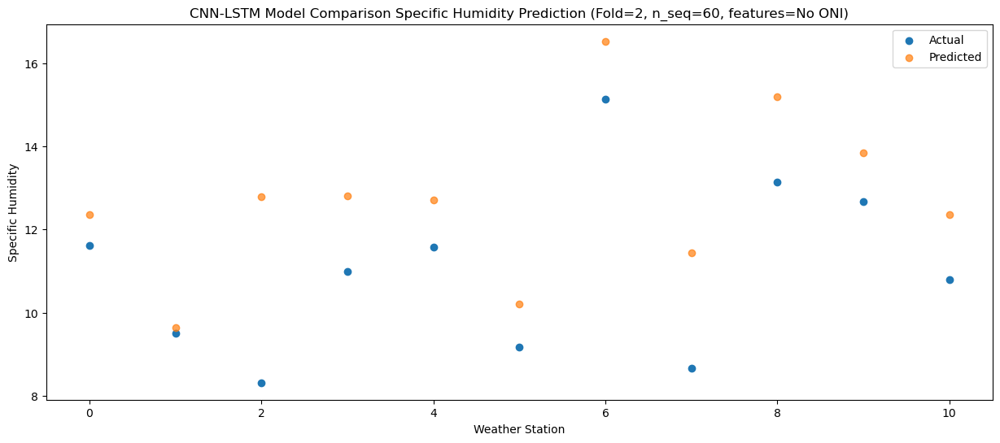

Predictions for (t+57):
    Weather_Station  Actual  Predicted
0                 0    9.61  11.782951
1                 1   10.48   9.052951
2                 2    8.92  12.202951
3                 3    9.49  12.222951
4                 4   10.41  12.132951
5                 5    9.21   9.622951
6                 6   14.95  15.942951
7                 7    8.34  10.852951
8                 8   12.32  14.602951
9                 9   11.42  13.262951
10               10    9.78  11.782951


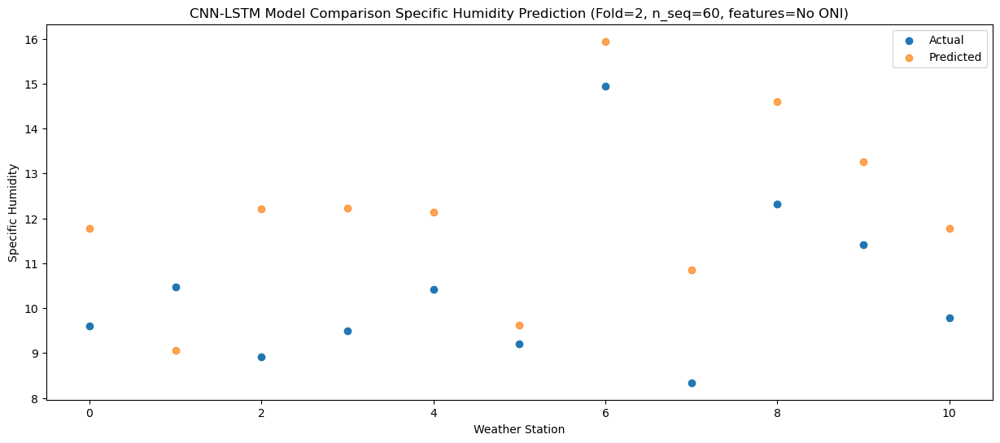

Predictions for (t+58):
    Weather_Station  Actual  Predicted
0                 0    7.99    9.51608
1                 1    6.53    6.78608
2                 2    9.35    9.93608
3                 3    6.60    9.95608
4                 4    8.81    9.86608
5                 5    6.72    7.35608
6                 6   12.05   13.67608
7                 7    5.60    8.58608
8                 8   11.93   12.33608
9                 9    9.57   10.99608
10               10    7.68    9.51608


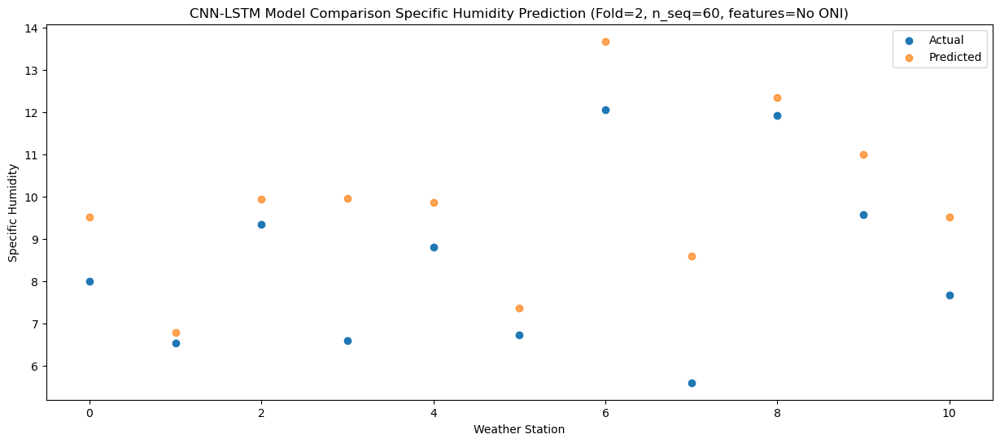

Predictions for (t+59):
    Weather_Station  Actual  Predicted
0                 0    3.61   5.658686
1                 1    3.67   2.928686
2                 2    4.37   6.078686
3                 3    3.36   6.098686
4                 4    3.95   6.008686
5                 5    2.40   3.498686
6                 6    8.63   9.818686
7                 7    2.71   4.728686
8                 8   10.03   8.478686
9                 9    4.95   7.138686
10               10    3.61   5.658686


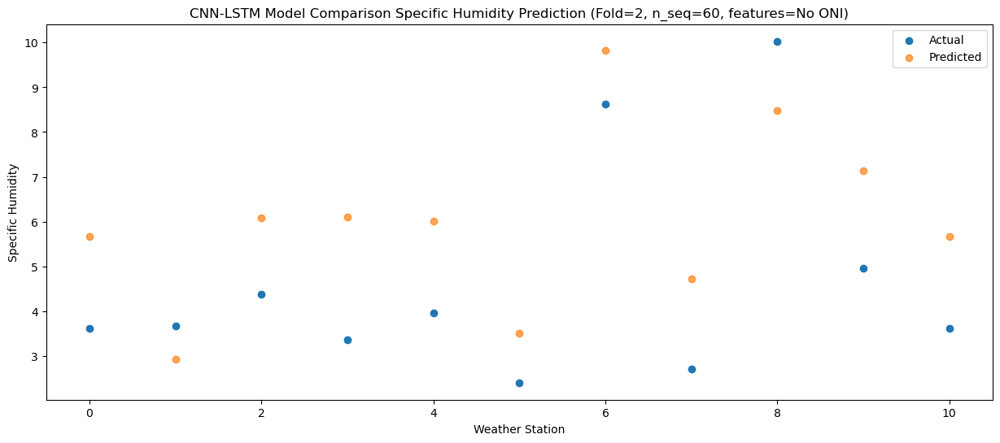

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_2 (Conv1D)           (None, 1, 512)            1014272   
                                                                 
 max_pooling1d_2 (MaxPooling  (None, 1, 512)           0         
 1D)                                                             
                                                                 
 dropout_6 (Dropout)         (None, 1, 512)            0         
                                                                 
 lstm_4 (LSTM)               (None, 1, 1024)           6295552   
                                                                 
 dropout_7 (Dropout)         (None, 1, 1024)           0         
                                                                 
 lstm_5 (LSTM)               (None, 1024)              8392704   
                                                      

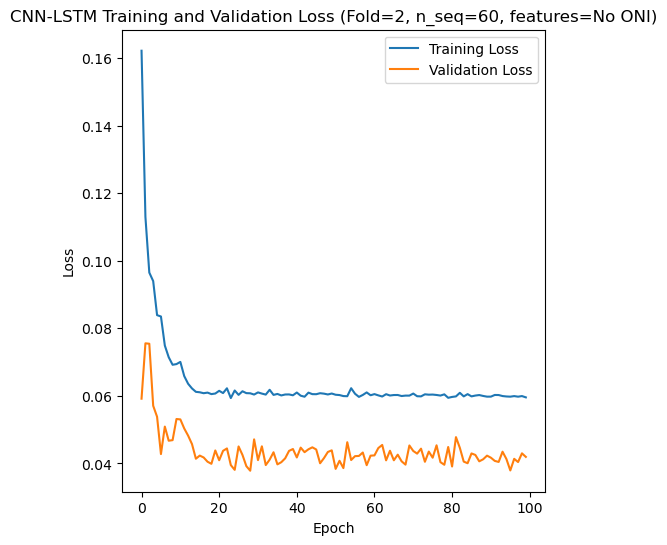

Epoch 1/100
84/84 [==============================] - 12s 85ms/step - loss: 0.1655 - accuracy: 0.2143 - mae: 0.1385 - rmse: 0.1655 - mape: 29.5725 - pearson: 0.5393 - val_loss: 0.1016 - val_accuracy: 0.6000 - val_mae: 0.0833 - val_rmse: 0.1016 - val_mape: 17.2248 - val_pearson: 0.6162
Epoch 2/100
84/84 [==============================] - 5s 54ms/step - loss: 0.1022 - accuracy: 0.1667 - mae: 0.0844 - rmse: 0.1022 - mape: 18.3723 - pearson: 0.7231 - val_loss: 0.0872 - val_accuracy: 0.6000 - val_mae: 0.0685 - val_rmse: 0.0872 - val_mape: 14.3502 - val_pearson: 0.6561
Epoch 3/100
84/84 [==============================] - 6s 66ms/step - loss: 0.0853 - accuracy: 0.3095 - mae: 0.0687 - rmse: 0.0853 - mape: 15.0182 - pearson: 0.7648 - val_loss: 0.1075 - val_accuracy: 0.6000 - val_mae: 0.0892 - val_rmse: 0.1075 - val_mape: 18.0358 - val_pearson: 0.7041
Epoch 4/100
84/84 [==============================] - 6s 76ms/step - loss: 0.0885 - accuracy: 0.3571 - mae: 0.0727 - rmse: 0.0885 - mape: 15.8158 - 

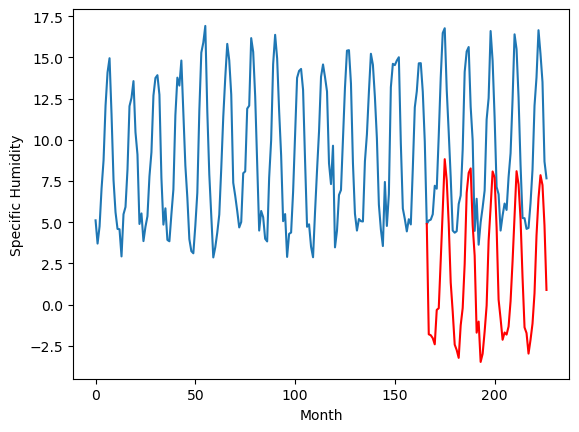

Weather Station 2:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
-0.14		-0.77		-0.63
-0.55		-0.82		-0.27
-0.58		-1.00		-0.42
-0.94		-1.38		-0.44
1.66		0.72		-0.94
1.81		0.82		-0.99
4.78		3.75		-1.03
8.31		6.76		-1.55
11.05		9.86		-1.19
8.38		8.59		0.21
6.94		5.95		-0.99
2.37		2.37		0.00
0.87		0.61		-0.26
-1.17		-1.39		-0.22
-1.26		-1.72		-0.46
-1.82		-2.20		-0.38
0.69		-0.22		-0.91
1.86		0.82		-1.04
5.38		3.50		-1.88
9.91		7.82		-2.09
10.79		9.03		-1.76
10.96		9.30		-1.66
6.99		5.86		-1.13
4.80		4.01		-0.79
0.37		-0.67		-1.04
1.34		0.01		-1.33
-1.85		-2.44		-0.59
-1.48		-1.95		-0.47
-0.01		-0.60		-0.59
2.29		0.97		-1.32
6.74		4.91		-1.83
9.36		6.95		-2.41
9.57		9.12		-0.45
10.18		8.75		-1.43
6.33		5.72		-0.61
1.87		1.34		-0.53
0.84		0.18		-0.66
-0.35		-1.10		-0.75
-0.43		-0.66		-0.23
-0.27		-0.79		-0.52
0.67		-0.30		-0.97
1.54		1.24		-0.30
5.95		3.66		-2.29
8.59		6.41		-2.18
10.86		9.13		-1.73
11.10		8.33		-2.77
7.03		6.23		-0.80
3.59		2.69		-0.90
0.71		-0

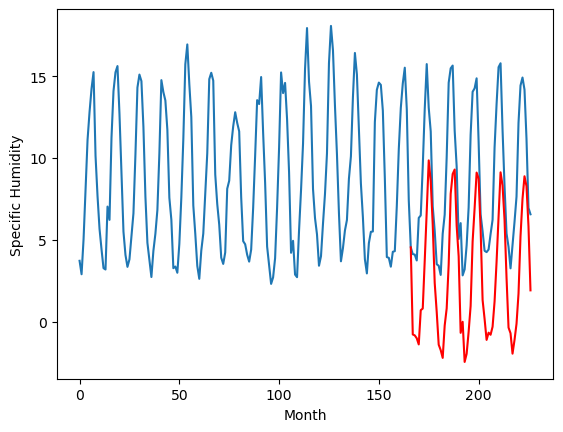

Weather Station 3:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
5.99		2.43		-3.56
6.53		2.38		-4.15
6.15		2.20		-3.95
5.46		1.82		-3.64
6.54		3.92		-2.62
7.91		4.02		-3.89
7.72		6.95		-0.77
9.26		9.96		0.70
9.48		13.06		3.58
11.00		11.79		0.79
10.52		9.15		-1.37
8.64		5.57		-3.07
5.95		3.81		-2.14
5.35		1.81		-3.54
5.79		1.48		-4.31
5.73		1.00		-4.73
5.81		2.98		-2.83
6.43		4.02		-2.41
6.83		6.70		-0.13
9.28		11.02		1.74
9.98		12.23		2.25
9.51		12.50		2.99
8.22		9.06		0.84
7.08		7.21		0.13
7.66		2.53		-5.13
6.16		3.21		-2.95
5.88		0.76		-5.12
5.10		1.25		-3.85
6.44		2.60		-3.84
6.11		4.17		-1.94
6.29		8.11		1.82
7.46		10.15		2.69
8.63		12.32		3.69
9.42		11.95		2.53
9.13		8.92		-0.21
7.96		4.54		-3.42
5.24		3.38		-1.86
6.08		2.10		-3.98
6.23		2.54		-3.69
5.10		2.41		-2.69
6.62		2.90		-3.72
6.82		4.44		-2.38
7.76		6.86		-0.90
8.53		9.61		1.08
9.63		12.33		2.70
10.70		11.53		0.83
9.16		9.43		0.27
8.00		5.89		-2.11
5.89		2.85		-3.04
6.12		2.51		-3.61
6.66		1.

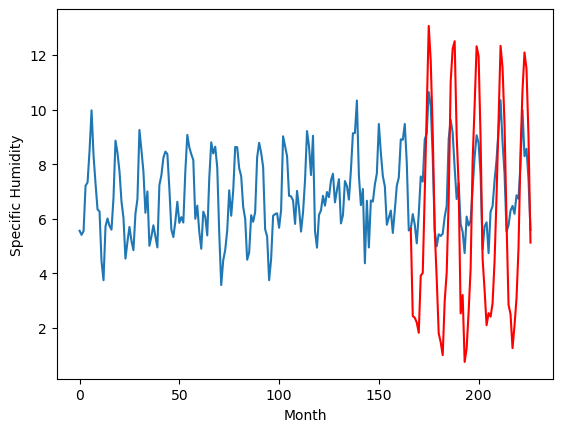

Weather Station 4:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
-0.83		0.21		1.04
-0.30		0.16		0.46
-0.70		-0.02		0.68
-0.88		-0.40		0.48
0.98		1.70		0.72
0.90		1.80		0.90
4.33		4.73		0.40
7.57		7.74		0.17
10.67		10.84		0.17
9.59		9.57		-0.02
7.02		6.93		-0.09
3.33		3.35		0.02
0.44		1.59		1.15
-1.17		-0.41		0.76
-1.44		-0.74		0.70
-1.51		-1.22		0.29
-0.21		0.76		0.97
0.98		1.80		0.82
3.51		4.48		0.97
8.93		8.80		-0.13
9.56		10.01		0.45
10.44		10.28		-0.16
6.97		6.84		-0.13
4.91		4.99		0.08
-0.78		0.31		1.09
0.36		0.99		0.63
-1.96		-1.46		0.50
-1.44		-0.97		0.47
-0.46		0.38		0.84
0.81		1.95		1.14
5.23		5.89		0.66
7.49		7.93		0.44
10.53		10.10		-0.43
9.40		9.73		0.33
6.15		6.70		0.55
1.00		2.32		1.32
0.19		1.16		0.97
-0.84		-0.12		0.72
-0.30		0.32		0.62
-0.48		0.19		0.67
-0.61		0.68		1.29
0.93		2.22		1.29
3.84		4.64		0.80
5.86		7.39		1.53
9.51		10.11		0.60
8.96		9.31		0.35
6.49		7.21		0.72
2.96		3.67		0.71
-0.43		0.63		1.06
-0.41		0.29		0.70
-1.15		-0.96		0

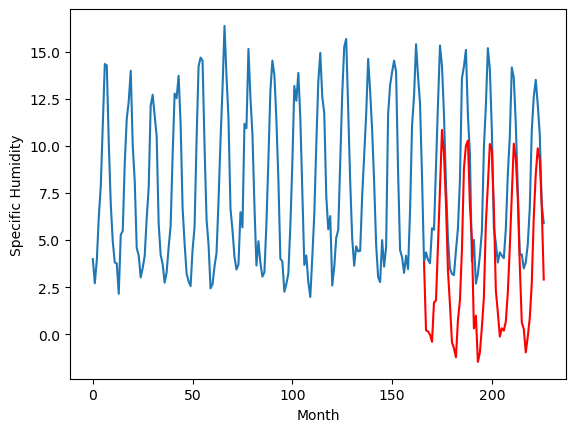

Weather Station 5:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.61		1.61		-2.00
2.11		1.56		-0.55
-0.18		1.38		1.56
-0.94		1.00		1.94
1.13		3.10		1.97
1.45		3.20		1.75
5.15		6.13		0.98
8.24		9.14		0.90
12.19		12.24		0.05
9.81		10.97		1.16
6.85		8.33		1.48
2.13		4.75		2.62
1.03		2.99		1.96
-0.90		0.99		1.89
-1.10		0.66		1.76
-1.93		0.18		2.11
0.55		2.16		1.61
1.61		3.20		1.59
4.03		5.88		1.85
8.49		10.20		1.71
10.44		11.41		0.97
10.53		11.68		1.15
6.76		8.24		1.48
4.81		6.39		1.58
-0.31		1.71		2.02
0.39		2.39		2.00
-2.07		-0.06		2.01
-1.45		0.43		1.88
0.12		1.78		1.66
1.68		3.35		1.67
5.77		7.29		1.52
7.87		9.33		1.46
10.46		11.50		1.04
9.96		11.13		1.17
6.86		8.10		1.24
1.86		3.72		1.86
0.47		2.56		2.09
-0.65		1.28		1.93
-0.27		1.72		1.99
0.61		1.59		0.98
0.28		2.08		1.80
1.51		3.62		2.11
4.69		6.04		1.35
6.82		8.79		1.97
10.59		11.51		0.92
10.98		10.71		-0.27
6.87		8.61		1.74
3.25		5.07		1.82
0.08		2.03		1.95
-0.33		1.69		2.02
-1.20		0.44		1.64
-0.29		

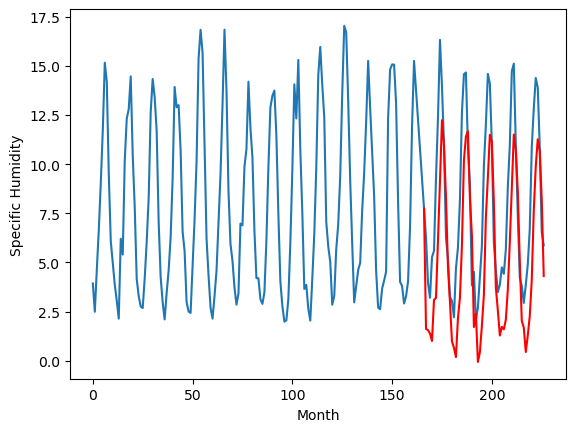

Weather Station 6:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
0.24		0.23		-0.01
0.53		0.18		-0.35
0.03		-0.00		-0.03
-0.22		-0.38		-0.16
1.77		1.72		-0.05
1.89		1.82		-0.07
5.10		4.75		-0.35
7.83		7.76		-0.07
10.99		10.86		-0.13
9.77		9.59		-0.18
6.59		6.95		0.36
3.17		3.37		0.20
1.40		1.61		0.21
-0.26		-0.39		-0.13
-0.57		-0.72		-0.15
-1.09		-1.20		-0.11
0.94		0.78		-0.16
2.24		1.82		-0.42
4.48		4.50		0.02
9.70		8.82		-0.88
10.95		10.03		-0.92
11.12		10.30		-0.82
7.82		6.86		-0.96
6.20		5.01		-1.19
0.33		0.33		0.00
1.38		1.01		-0.37
-1.13		-1.44		-0.31
-0.60		-0.95		-0.35
0.71		0.40		-0.31
2.24		1.97		-0.27
6.47		5.91		-0.56
8.54		7.95		-0.59
11.32		10.12		-1.20
10.12		9.75		-0.37
7.35		6.72		-0.63
2.05		2.34		0.29
0.83		1.18		0.35
0.07		-0.10		-0.17
0.65		0.34		-0.31
0.32		0.21		-0.11
0.75		0.70		-0.05
2.06		2.24		0.18
4.66		4.66		-0.00
6.82		7.41		0.59
11.33		10.13		-1.20
10.45		9.33		-1.12
7.22		7.23		0.01
3.84		3.69		-0.15
0.65		0.65		0.00
0.61		0.

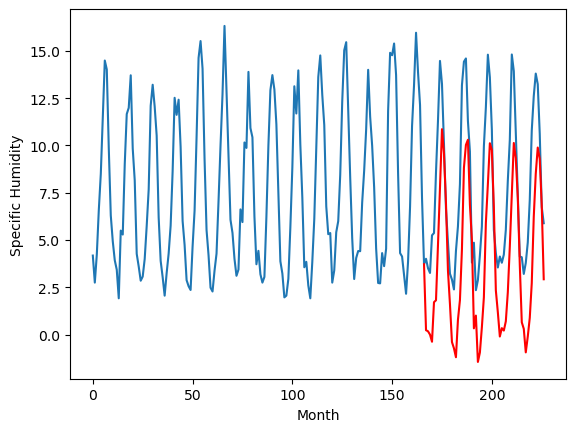

Weather Station 7:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
6.16		2.06		-4.10
5.79		2.01		-3.78
5.75		1.83		-3.92
5.71		1.45		-4.26
6.34		3.55		-2.79
6.69		3.65		-3.04
7.82		6.58		-1.24
8.88		9.59		0.71
10.40		12.69		2.29
9.19		11.42		2.23
8.05		8.78		0.73
6.40		5.20		-1.20
6.34		3.44		-2.90
5.53		1.44		-4.09
5.70		1.11		-4.59
5.76		0.63		-5.13
6.07		2.61		-3.46
6.54		3.65		-2.89
7.94		6.33		-1.61
9.27		10.65		1.38
11.72		11.86		0.14
10.29		12.13		1.84
8.59		8.69		0.10
7.50		6.84		-0.66
6.79		2.16		-4.63
6.08		2.84		-3.24
5.60		0.39		-5.21
5.39		0.88		-4.51
6.07		2.23		-3.84
6.57		3.80		-2.77
7.38		7.74		0.36
9.32		9.78		0.46
12.31		11.95		-0.36
12.15		11.58		-0.57
9.20		8.55		-0.65
7.59		4.17		-3.42
5.93		3.01		-2.92
5.96		1.73		-4.23
5.93		2.17		-3.76
5.55		2.04		-3.51
5.85		2.53		-3.32
6.48		4.07		-2.41
8.64		6.49		-2.15
8.87		9.24		0.37
9.71		11.96		2.25
11.36		11.16		-0.20
8.74		9.06		0.32
7.49		5.52		-1.97
6.16		2.48		-3.68
6.03		2.14		-3.89
5.9

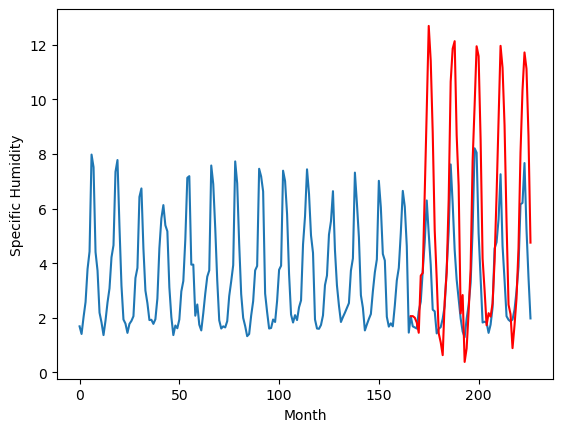

Weather Station 8:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.99		0.49		-4.50
5.98		0.44		-5.54
4.86		0.26		-4.60
4.44		-0.12		-4.56
6.18		1.98		-4.20
5.99		2.08		-3.91
5.29		5.01		-0.28
5.62		8.02		2.40
6.10		11.12		5.02
6.97		9.85		2.88
5.71		7.21		1.50
4.70		3.63		-1.07
4.68		1.87		-2.81
3.85		-0.13		-3.98
4.66		-0.46		-5.12
4.18		-0.94		-5.12
4.48		1.04		-3.44
4.17		2.08		-2.09
4.73		4.76		0.03
6.15		9.08		2.93
11.51		10.29		-1.22
9.08		10.56		1.48
7.36		7.12		-0.24
6.26		5.27		-0.99
4.99		0.59		-4.40
5.13		1.27		-3.86
4.14		-1.18		-5.32
3.71		-0.69		-4.40
4.33		0.66		-3.67
4.33		2.23		-2.10
4.59		6.17		1.58
6.35		8.21		1.86
9.78		10.38		0.60
12.85		10.01		-2.84
8.94		6.98		-1.96
6.21		2.60		-3.61
4.44		1.44		-3.00
5.19		0.16		-5.03
5.58		0.60		-4.98
4.33		0.47		-3.86
5.37		0.96		-4.41
4.52		2.50		-2.02
6.06		4.92		-1.14
6.56		7.67		1.11
7.53		10.39		2.86
10.11		9.59		-0.52
9.17		7.49		-1.68
6.11		3.95		-2.16
5.10		0.91		-4.19
5.02		0.57		-4.45
5.

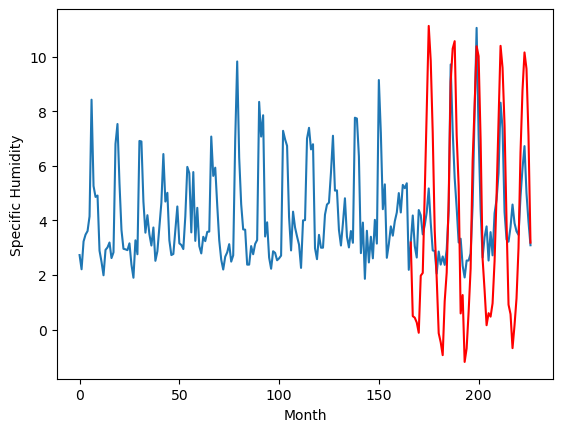

Weather Station 9:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.53		0.43		-4.10
5.76		0.38		-5.38
5.08		0.20		-4.88
4.19		-0.18		-4.37
4.67		1.92		-2.75
5.73		2.02		-3.71
6.59		4.95		-1.64
6.81		7.96		1.15
7.28		11.06		3.78
8.08		9.79		1.71
7.69		7.15		-0.54
5.49		3.57		-1.92
4.33		1.81		-2.52
3.99		-0.19		-4.18
4.66		-0.52		-5.18
4.31		-1.00		-5.31
3.96		0.98		-2.98
4.89		2.02		-2.87
5.33		4.70		-0.63
6.76		9.02		2.26
7.24		10.23		2.99
7.63		10.50		2.87
6.99		7.06		0.07
5.96		5.21		-0.75
6.18		0.53		-5.65
4.93		1.21		-3.72
4.60		-1.24		-5.84
3.76		-0.75		-4.51
4.76		0.60		-4.16
4.86		2.17		-2.69
5.23		6.11		0.88
6.72		8.15		1.43
7.55		10.32		2.77
8.01		9.95		1.94
7.41		6.92		-0.49
6.10		2.54		-3.56
3.85		1.38		-2.47
4.64		0.10		-4.54
4.47		0.54		-3.93
3.61		0.41		-3.20
4.41		0.90		-3.51
4.79		2.44		-2.35
6.38		4.86		-1.52
6.44		7.61		1.17
7.28		10.33		3.05
8.55		9.53		0.98
8.00		7.43		-0.57
6.57		3.89		-2.68
5.48		0.85		-4.63
5.86		0.51		-5.35
5.87		-0

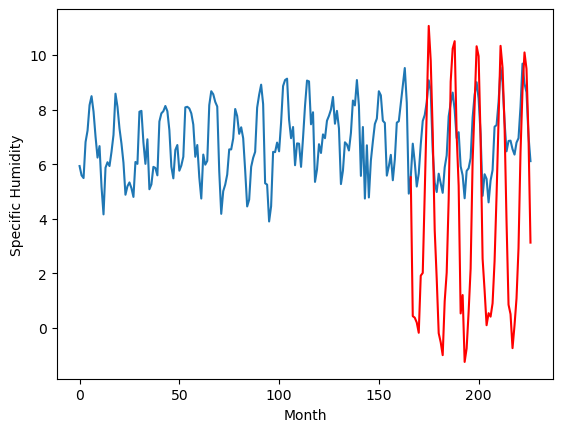

Weather Station 10:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
0.50		0.68		0.18
0.14		0.63		0.49
-0.14		0.45		0.59
-0.06		0.07		0.13
0.43		2.17		1.74
0.93		2.27		1.34
3.16		5.20		2.04
7.27		8.21		0.94
11.25		11.31		0.06
10.18		10.04		-0.14
6.81		7.40		0.59
4.28		3.82		-0.46
2.12		2.06		-0.06
0.16		0.06		-0.10
-0.93		-0.27		0.66
-0.78		-0.75		0.03
0.00		1.23		1.23
1.38		2.27		0.89
2.95		4.95		2.00
7.85		9.27		1.42
10.06		10.48		0.42
10.44		10.75		0.31
7.84		7.31		-0.53
5.30		5.46		0.16
0.77		0.78		0.01
0.47		1.46		0.99
-1.01		-0.99		0.02
-0.42		-0.50		-0.08
0.42		0.85		0.43
1.07		2.42		1.35
4.46		6.36		1.90
6.80		8.40		1.60
9.96		10.57		0.61
10.10		10.20		0.10
6.43		7.17		0.74
3.80		2.79		-1.01
1.95		1.63		-0.32
-0.02		0.35		0.37
0.55		0.79		0.24
-0.16		0.66		0.82
0.05		1.15		1.10
2.29		2.69		0.40
2.81		5.11		2.30
6.51		7.86		1.35
11.36		10.58		-0.78
8.79		9.78		0.99
7.82		7.68		-0.14
4.43		4.14		-0.29
0.63		1.10		0.47
0.96		0.76		-0.20
-0.34		-0.49		-0.

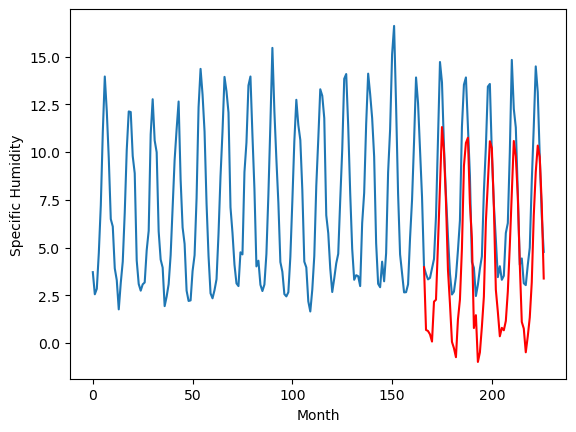

Weather Station 11:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
-2.56		-1.81		0.75
-2.68		-1.86		0.82
-2.76		-2.04		0.72
-2.77		-2.42		0.35
-1.81		-0.32		1.49
-1.38		-0.22		1.16
1.15		2.71		1.56
4.72		5.72		1.00
8.07		8.82		0.75
7.43		7.55		0.12
4.14		4.91		0.77
1.37		1.33		-0.04
-0.96		-0.43		0.53
-2.81		-2.43		0.38
-3.50		-2.76		0.74
-3.64		-3.24		0.40
-2.36		-1.26		1.10
-0.95		-0.22		0.73
0.64		2.46		1.82
5.51		6.78		1.27
7.20		7.99		0.79
7.52		8.26		0.74
4.60		4.82		0.22
2.70		2.97		0.27
-2.22		-1.71		0.51
-2.32		-1.03		1.29
-3.83		-3.48		0.35
-3.13		-2.99		0.14
-2.19		-1.64		0.55
-1.55		-0.07		1.48
2.63		3.87		1.24
4.03		5.91		1.88
7.01		8.08		1.07
6.64		7.71		1.07
3.62		4.68		1.06
0.20		0.30		0.10
-1.02		-0.86		0.16
-2.94		-2.14		0.80
-2.16		-1.70		0.46
-2.91		-1.83		1.08
-2.78		-1.34		1.44
-0.35		0.20		0.55
0.12		2.62		2.50
3.81		5.37		1.56
7.79		8.09		0.30
6.55		7.29		0.74
4.86		5.19		0.33
1.59		1.65		0.06
-2.09		-1.39		0.70
-1.71		-1.73		-0.02
-

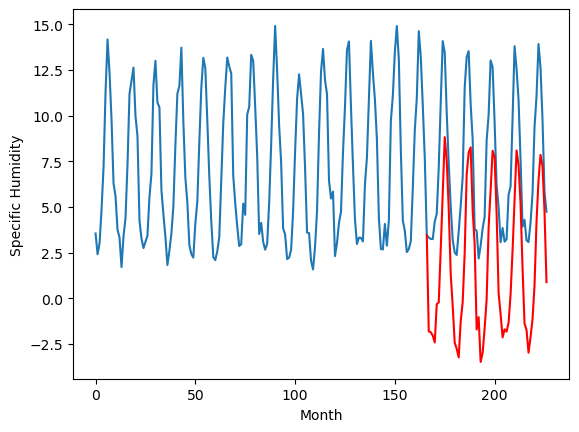

RangeIndex(start=1, stop=12, step=1)
[-3.310000000000001, -0.13999999999999968, 5.989999999999999, -0.8299999999999992, 3.6100000000000003, 0.2400000000000002, 6.16, 4.990000000000001, 4.529999999999999, 0.49999999999999956, -2.56]
[-1.805811700820923, -0.7658117008209229, 2.434188299179077, 0.2141882991790771, 1.6141882991790775, 0.23418829917907713, 2.0641882991790768, 0.49418829917907736, 0.4341882991790773, 0.6841882991790769, -1.805811700820923]
Predictions for (t+0):
    Weather_Station  Actual  Predicted
0                 0   -3.31  -1.805812
1                 1   -0.14  -0.765812
2                 2    5.99   2.434188
3                 3   -0.83   0.214188
4                 4    3.61   1.614188
5                 5    0.24   0.234188
6                 6    6.16   2.064188
7                 7    4.99   0.494188
8                 8    4.53   0.434188
9                 9    0.50   0.684188
10               10   -2.56  -1.805812


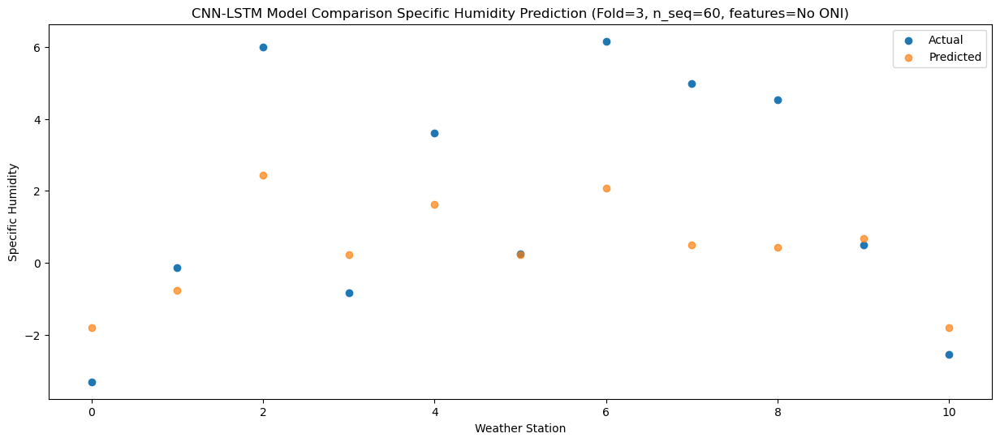

Predictions for (t+1):
    Weather_Station  Actual  Predicted
0                 0   -3.10  -1.863475
1                 1   -0.55  -0.823475
2                 2    6.53   2.376525
3                 3   -0.30   0.156525
4                 4    2.11   1.556525
5                 5    0.53   0.176525
6                 6    5.79   2.006525
7                 7    5.98   0.436525
8                 8    5.76   0.376525
9                 9    0.14   0.626525
10               10   -2.68  -1.863475


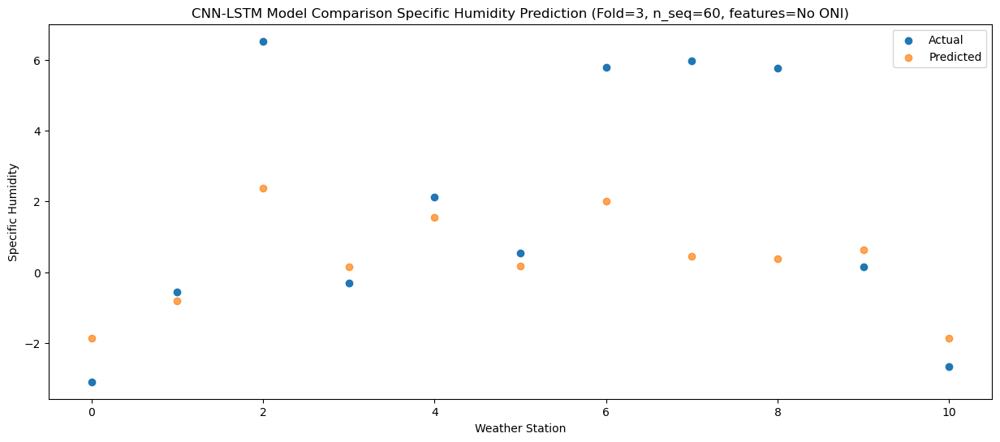

Predictions for (t+2):
    Weather_Station  Actual  Predicted
0                 0   -3.05  -2.040157
1                 1   -0.58  -1.000157
2                 2    6.15   2.199843
3                 3   -0.70  -0.020157
4                 4   -0.18   1.379843
5                 5    0.03  -0.000157
6                 6    5.75   1.829843
7                 7    4.86   0.259843
8                 8    5.08   0.199843
9                 9   -0.14   0.449843
10               10   -2.76  -2.040157


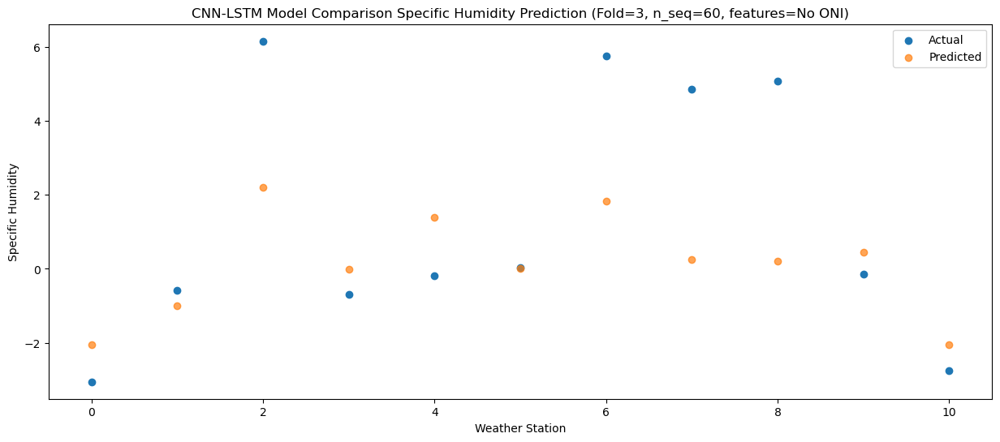

Predictions for (t+3):
    Weather_Station  Actual  Predicted
0                 0   -2.72  -2.415438
1                 1   -0.94  -1.375438
2                 2    5.46   1.824562
3                 3   -0.88  -0.395438
4                 4   -0.94   1.004562
5                 5   -0.22  -0.375438
6                 6    5.71   1.454562
7                 7    4.44  -0.115438
8                 8    4.19  -0.175438
9                 9   -0.06   0.074562
10               10   -2.77  -2.415438


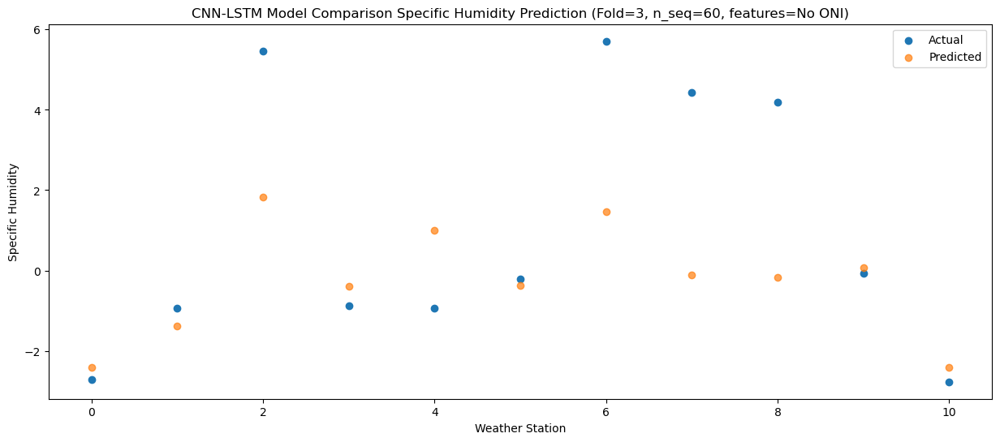

Predictions for (t+4):
    Weather_Station  Actual  Predicted
0                 0   -0.99  -0.324463
1                 1    1.66   0.715537
2                 2    6.54   3.915537
3                 3    0.98   1.695537
4                 4    1.13   3.095537
5                 5    1.77   1.715537
6                 6    6.34   3.545537
7                 7    6.18   1.975537
8                 8    4.67   1.915537
9                 9    0.43   2.165537
10               10   -1.81  -0.324463


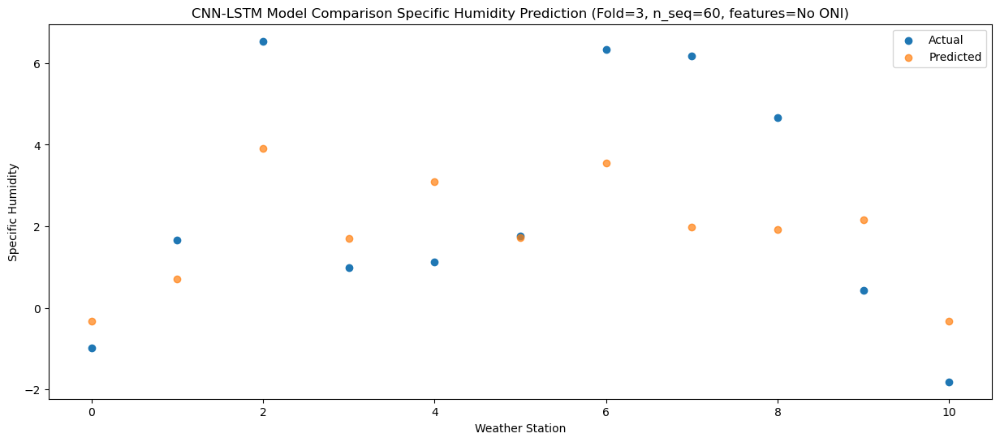

Predictions for (t+5):
    Weather_Station  Actual  Predicted
0                 0   -1.17  -0.224343
1                 1    1.81   0.815657
2                 2    7.91   4.015657
3                 3    0.90   1.795657
4                 4    1.45   3.195657
5                 5    1.89   1.815657
6                 6    6.69   3.645657
7                 7    5.99   2.075657
8                 8    5.73   2.015657
9                 9    0.93   2.265657
10               10   -1.38  -0.224343


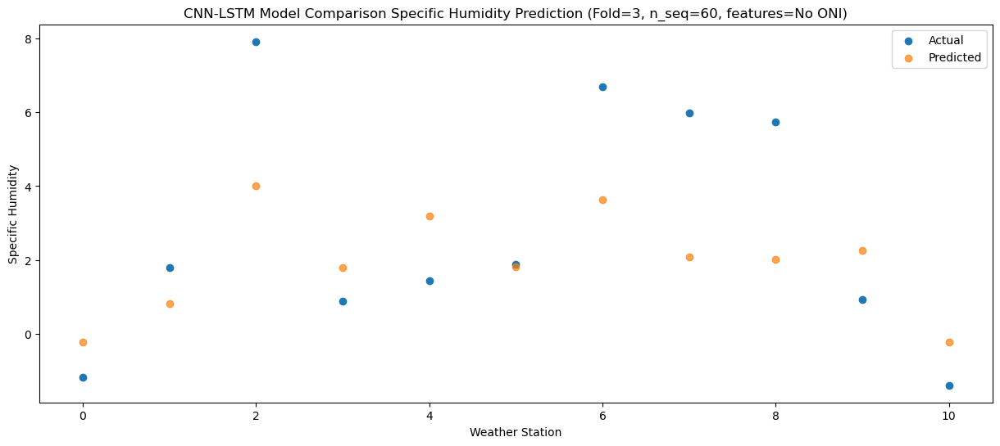

Predictions for (t+6):
    Weather_Station  Actual  Predicted
0                 0    2.05   2.713881
1                 1    4.78   3.753881
2                 2    7.72   6.953881
3                 3    4.33   4.733881
4                 4    5.15   6.133881
5                 5    5.10   4.753881
6                 6    7.82   6.583881
7                 7    5.29   5.013881
8                 8    6.59   4.953881
9                 9    3.16   5.203881
10               10    1.15   2.713881


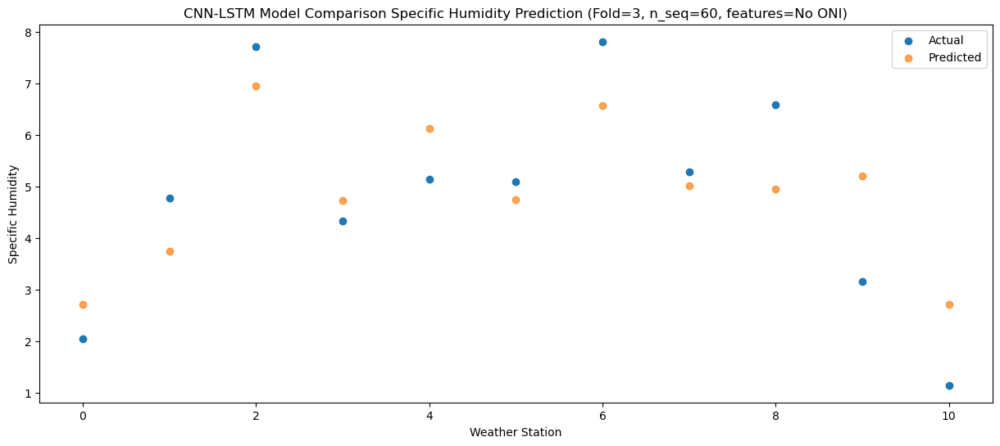

Predictions for (t+7):
    Weather_Station  Actual  Predicted
0                 0    5.59   5.720566
1                 1    8.31   6.760566
2                 2    9.26   9.960566
3                 3    7.57   7.740566
4                 4    8.24   9.140566
5                 5    7.83   7.760566
6                 6    8.88   9.590566
7                 7    5.62   8.020566
8                 8    6.81   7.960566
9                 9    7.27   8.210566
10               10    4.72   5.720566


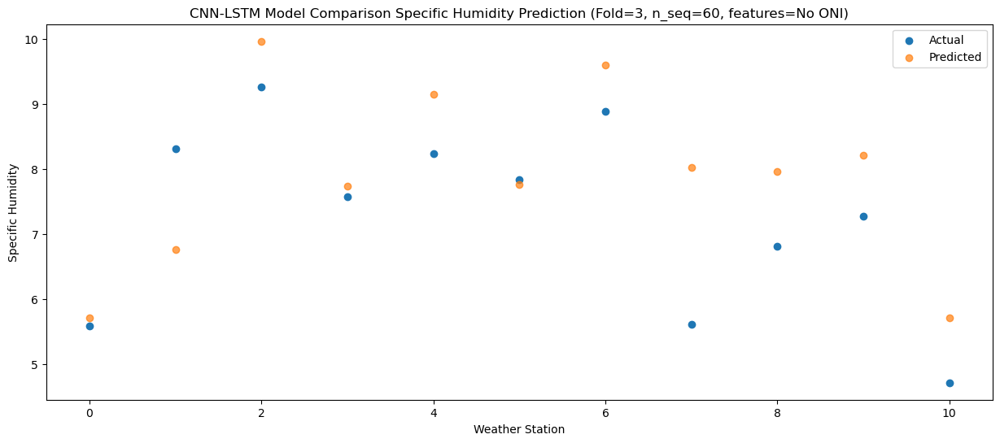

Predictions for (t+8):
    Weather_Station  Actual  Predicted
0                 0    8.28   8.821701
1                 1   11.05   9.861701
2                 2    9.48  13.061701
3                 3   10.67  10.841701
4                 4   12.19  12.241701
5                 5   10.99  10.861701
6                 6   10.40  12.691701
7                 7    6.10  11.121701
8                 8    7.28  11.061701
9                 9   11.25  11.311701
10               10    8.07   8.821701


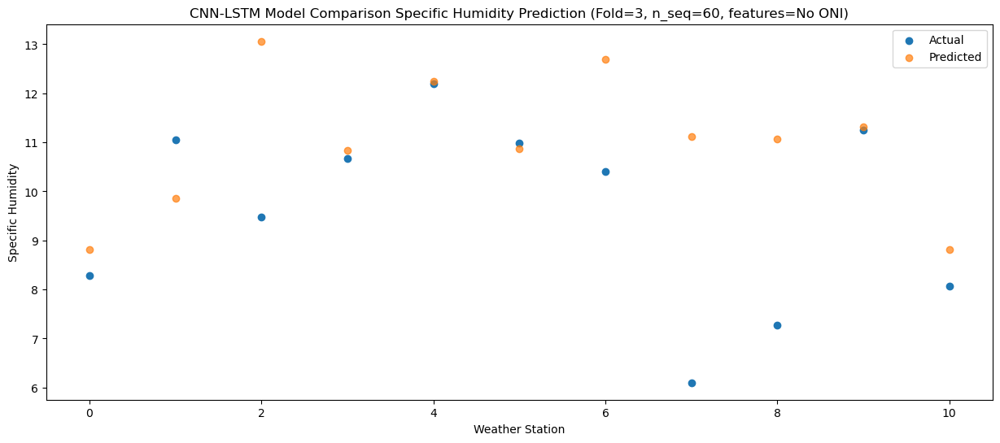

Predictions for (t+9):
    Weather_Station  Actual  Predicted
0                 0    8.57   7.545986
1                 1    8.38   8.585986
2                 2   11.00  11.785986
3                 3    9.59   9.565986
4                 4    9.81  10.965986
5                 5    9.77   9.585986
6                 6    9.19  11.415986
7                 7    6.97   9.845986
8                 8    8.08   9.785986
9                 9   10.18  10.035986
10               10    7.43   7.545986


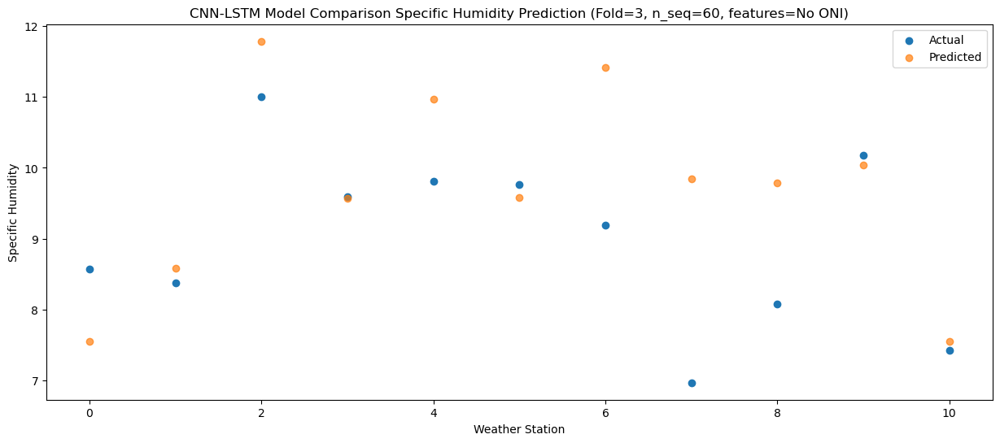

Predictions for (t+10):
    Weather_Station  Actual  Predicted
0                 0    4.83   4.913985
1                 1    6.94   5.953985
2                 2   10.52   9.153985
3                 3    7.02   6.933985
4                 4    6.85   8.333985
5                 5    6.59   6.953985
6                 6    8.05   8.783985
7                 7    5.71   7.213985
8                 8    7.69   7.153985
9                 9    6.81   7.403985
10               10    4.14   4.913985


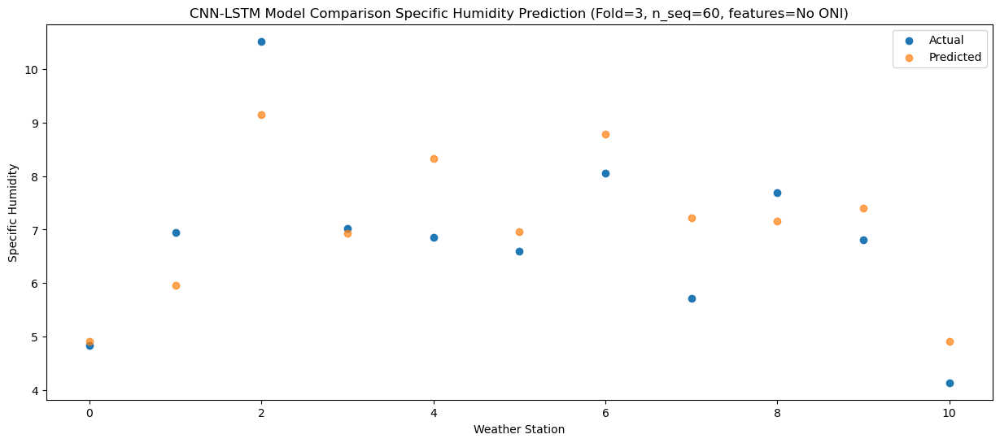

Predictions for (t+11):
    Weather_Station  Actual  Predicted
0                 0    2.25   1.334194
1                 1    2.37   2.374194
2                 2    8.64   5.574194
3                 3    3.33   3.354194
4                 4    2.13   4.754194
5                 5    3.17   3.374194
6                 6    6.40   5.204194
7                 7    4.70   3.634194
8                 8    5.49   3.574194
9                 9    4.28   3.824194
10               10    1.37   1.334194


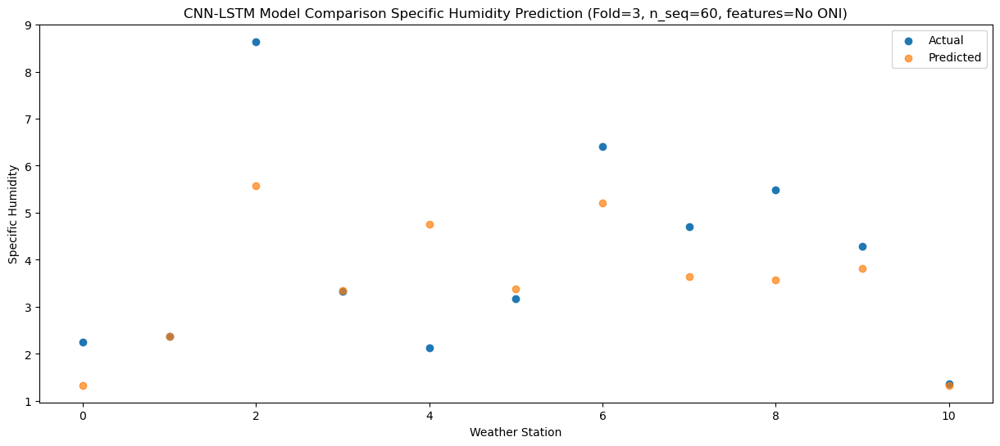

Predictions for (t+12):
    Weather_Station  Actual  Predicted
0                 0   -0.49  -0.430745
1                 1    0.87   0.609255
2                 2    5.95   3.809255
3                 3    0.44   1.589255
4                 4    1.03   2.989255
5                 5    1.40   1.609255
6                 6    6.34   3.439255
7                 7    4.68   1.869255
8                 8    4.33   1.809255
9                 9    2.12   2.059255
10               10   -0.96  -0.430745


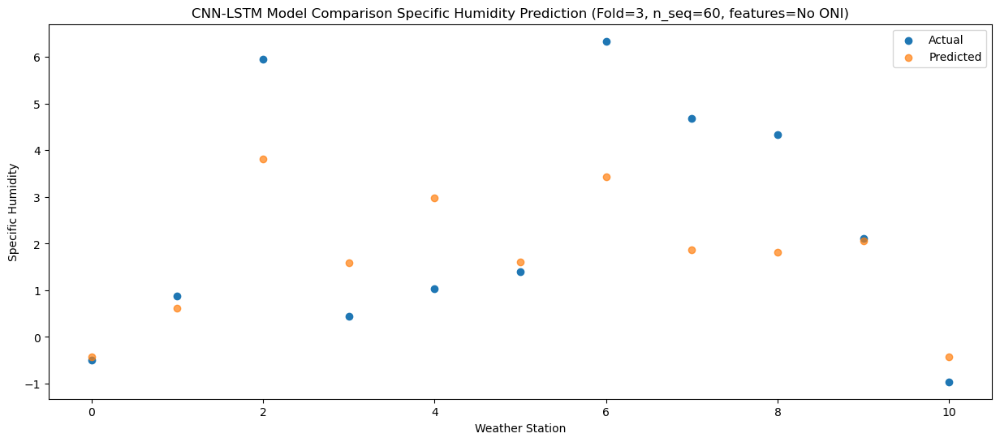

Predictions for (t+13):
    Weather_Station  Actual  Predicted
0                 0   -3.71  -2.432445
1                 1   -1.17  -1.392445
2                 2    5.35   1.807555
3                 3   -1.17  -0.412445
4                 4   -0.90   0.987555
5                 5   -0.26  -0.392445
6                 6    5.53   1.437555
7                 7    3.85  -0.132445
8                 8    3.99  -0.192445
9                 9    0.16   0.057555
10               10   -2.81  -2.432445


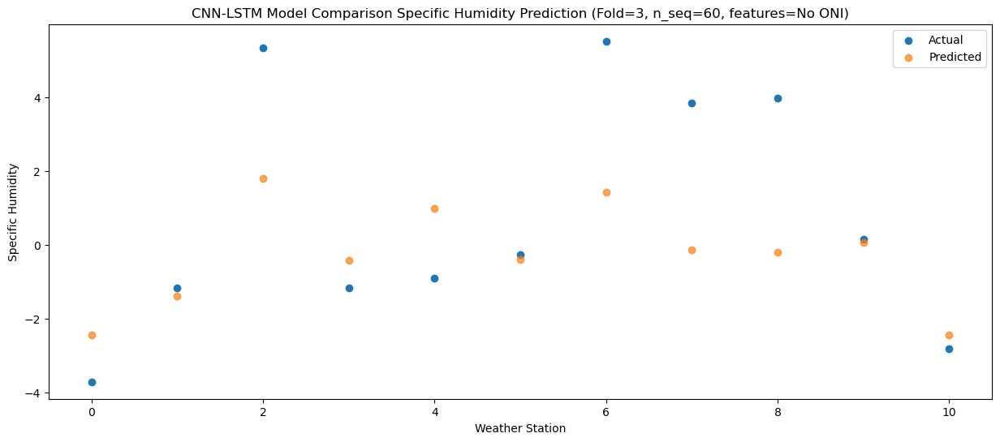

Predictions for (t+14):
    Weather_Station  Actual  Predicted
0                 0   -3.84  -2.762131
1                 1   -1.26  -1.722131
2                 2    5.79   1.477869
3                 3   -1.44  -0.742131
4                 4   -1.10   0.657869
5                 5   -0.57  -0.722131
6                 6    5.70   1.107869
7                 7    4.66  -0.462131
8                 8    4.66  -0.522131
9                 9   -0.93  -0.272131
10               10   -3.50  -2.762131


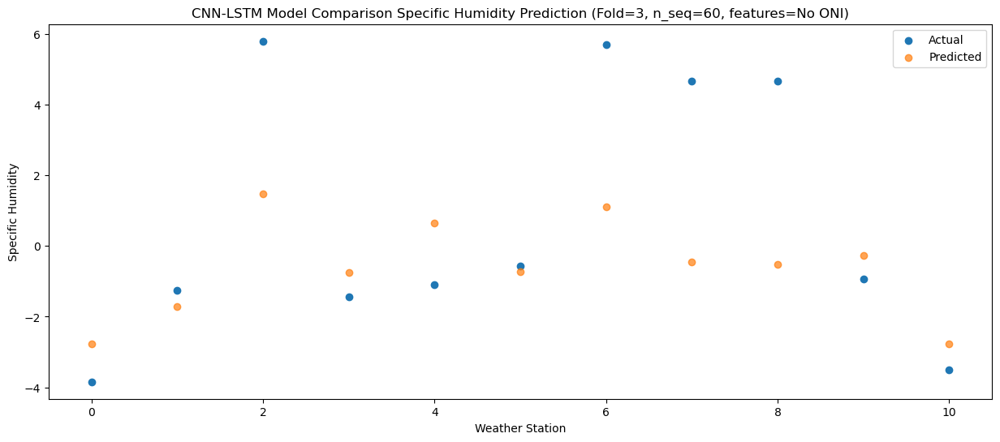

Predictions for (t+15):
    Weather_Station  Actual  Predicted
0                 0   -3.75  -3.235274
1                 1   -1.82  -2.195274
2                 2    5.73   1.004726
3                 3   -1.51  -1.215274
4                 4   -1.93   0.184726
5                 5   -1.09  -1.195274
6                 6    5.76   0.634726
7                 7    4.18  -0.935274
8                 8    4.31  -0.995274
9                 9   -0.78  -0.745274
10               10   -3.64  -3.235274


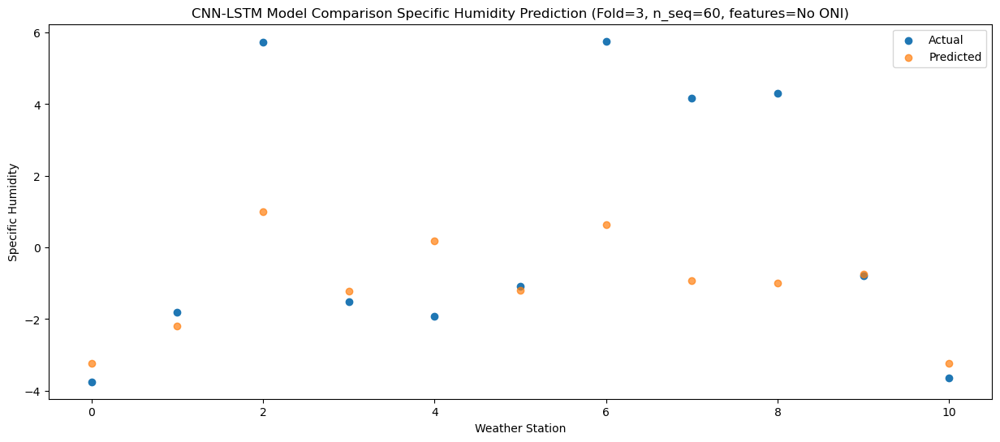

Predictions for (t+16):
    Weather_Station        Actual  Predicted
0                 0 -2.100000e+00  -1.260978
1                 1  6.900000e-01  -0.220978
2                 2  5.810000e+00   2.979022
3                 3 -2.100000e-01   0.759022
4                 4  5.500000e-01   2.159022
5                 5  9.400000e-01   0.779022
6                 6  6.070000e+00   2.609022
7                 7  4.480000e+00   1.039022
8                 8  3.960000e+00   0.979022
9                 9  2.220446e-16   1.229022
10               10 -2.360000e+00  -1.260978


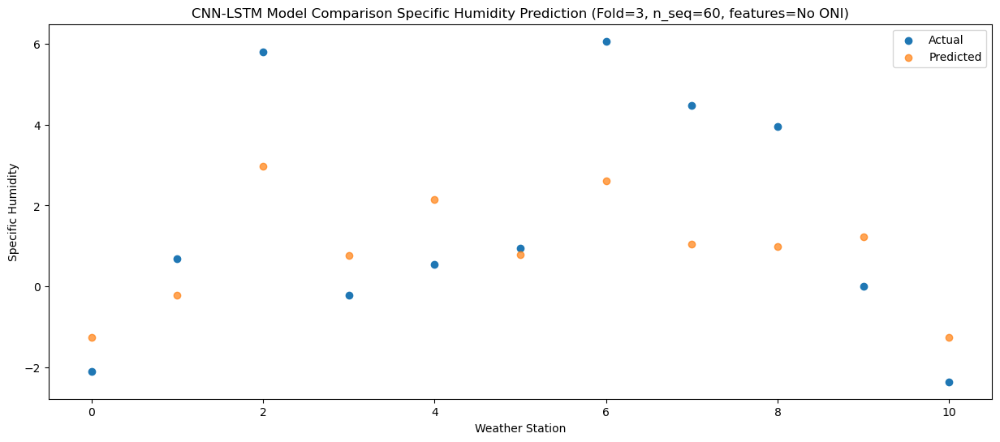

Predictions for (t+17):
    Weather_Station  Actual  Predicted
0                 0   -1.58  -0.215054
1                 1    1.86   0.824946
2                 2    6.43   4.024946
3                 3    0.98   1.804946
4                 4    1.61   3.204946
5                 5    2.24   1.824946
6                 6    6.54   3.654946
7                 7    4.17   2.084946
8                 8    4.89   2.024946
9                 9    1.38   2.274946
10               10   -0.95  -0.215054


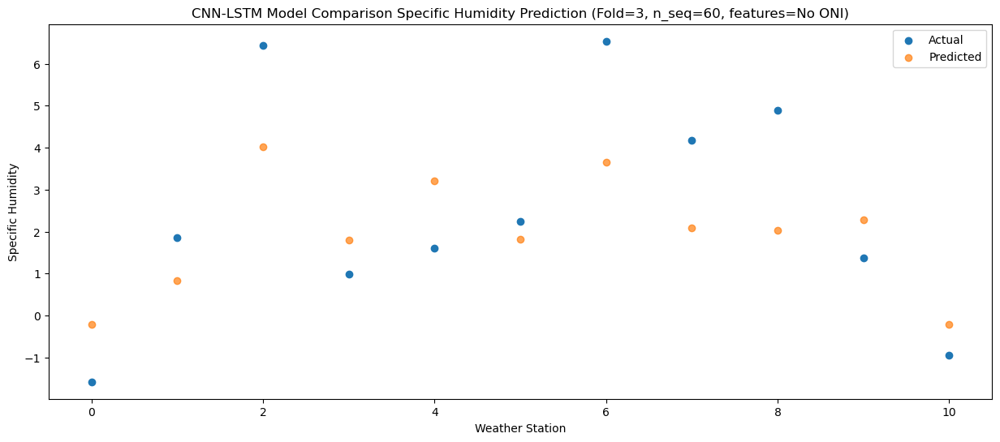

Predictions for (t+18):
    Weather_Station  Actual  Predicted
0                 0    1.20    2.46379
1                 1    5.38    3.50379
2                 2    6.83    6.70379
3                 3    3.51    4.48379
4                 4    4.03    5.88379
5                 5    4.48    4.50379
6                 6    7.94    6.33379
7                 7    4.73    4.76379
8                 8    5.33    4.70379
9                 9    2.95    4.95379
10               10    0.64    2.46379


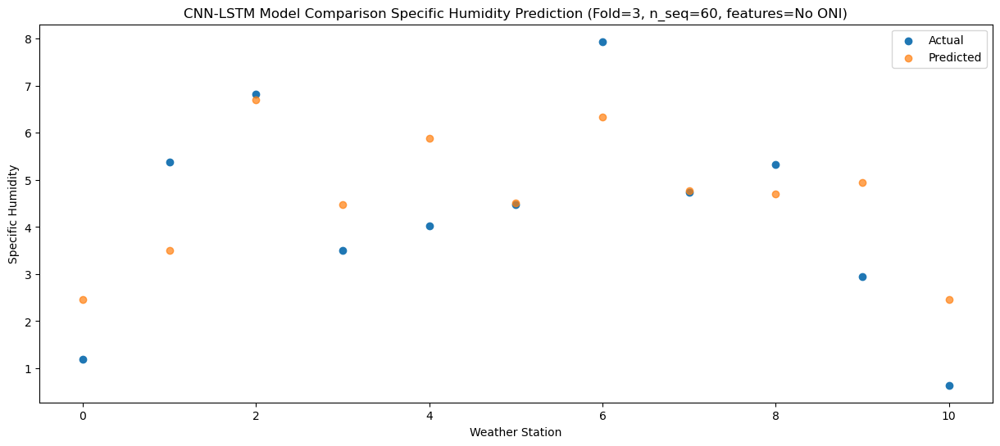

Predictions for (t+19):
    Weather_Station  Actual  Predicted
0                 0    5.92    6.78092
1                 1    9.91    7.82092
2                 2    9.28   11.02092
3                 3    8.93    8.80092
4                 4    8.49   10.20092
5                 5    9.70    8.82092
6                 6    9.27   10.65092
7                 7    6.15    9.08092
8                 8    6.76    9.02092
9                 9    7.85    9.27092
10               10    5.51    6.78092


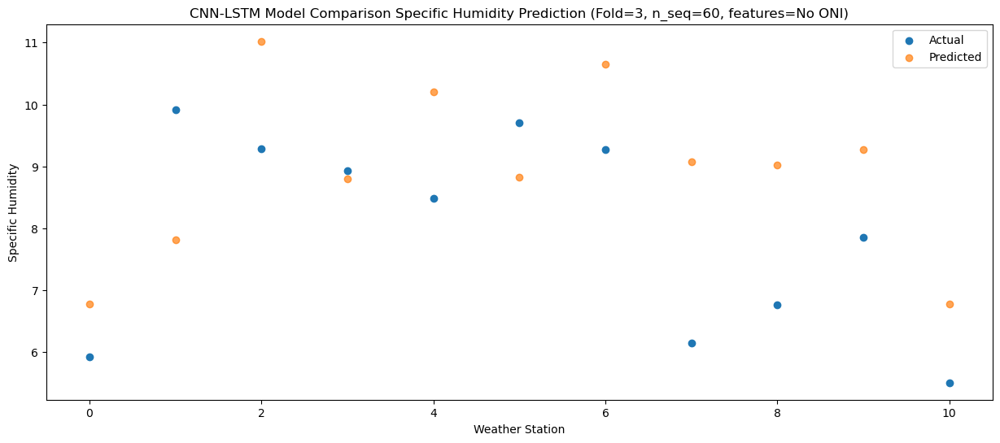

Predictions for (t+20):
    Weather_Station  Actual  Predicted
0                 0    7.16   7.988264
1                 1   10.79   9.028264
2                 2    9.98  12.228264
3                 3    9.56  10.008264
4                 4   10.44  11.408264
5                 5   10.95  10.028264
6                 6   11.72  11.858264
7                 7   11.51  10.288264
8                 8    7.24  10.228264
9                 9   10.06  10.478264
10               10    7.20   7.988264


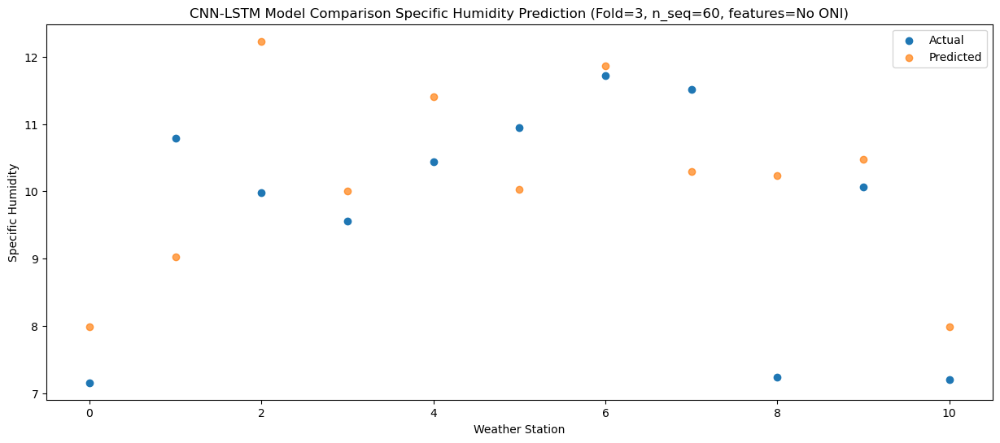

Predictions for (t+21):
    Weather_Station  Actual  Predicted
0                 0    7.43   8.262278
1                 1   10.96   9.302278
2                 2    9.51  12.502278
3                 3   10.44  10.282278
4                 4   10.53  11.682278
5                 5   11.12  10.302278
6                 6   10.29  12.132278
7                 7    9.08  10.562278
8                 8    7.63  10.502278
9                 9   10.44  10.752278
10               10    7.52   8.262278


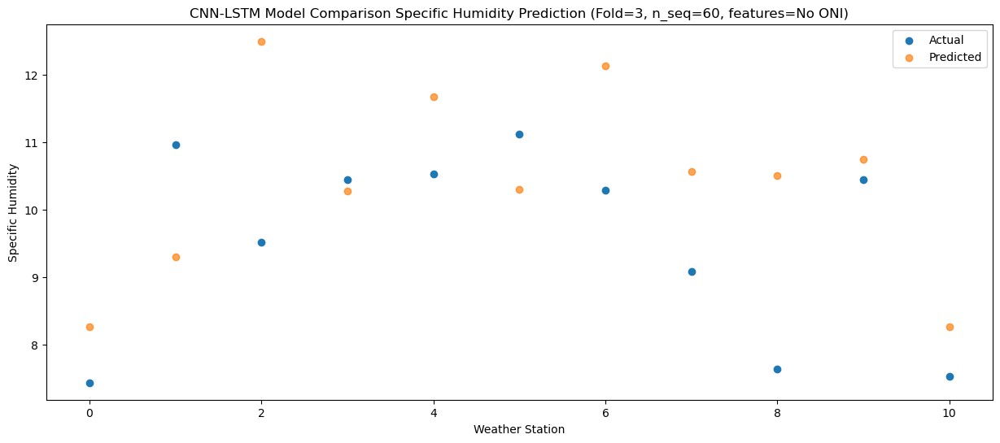

Predictions for (t+22):
    Weather_Station  Actual  Predicted
0                 0    3.81   4.823835
1                 1    6.99   5.863835
2                 2    8.22   9.063835
3                 3    6.97   6.843835
4                 4    6.76   8.243835
5                 5    7.82   6.863835
6                 6    8.59   8.693835
7                 7    7.36   7.123835
8                 8    6.99   7.063835
9                 9    7.84   7.313835
10               10    4.60   4.823835


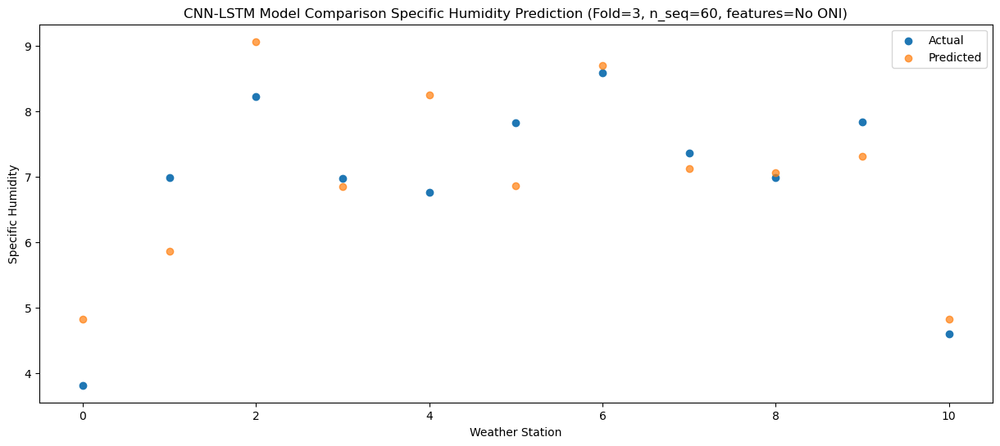

Predictions for (t+23):
    Weather_Station  Actual  Predicted
0                 0    1.77   2.966589
1                 1    4.80   4.006589
2                 2    7.08   7.206589
3                 3    4.91   4.986589
4                 4    4.81   6.386589
5                 5    6.20   5.006589
6                 6    7.50   6.836589
7                 7    6.26   5.266589
8                 8    5.96   5.206589
9                 9    5.30   5.456589
10               10    2.70   2.966589


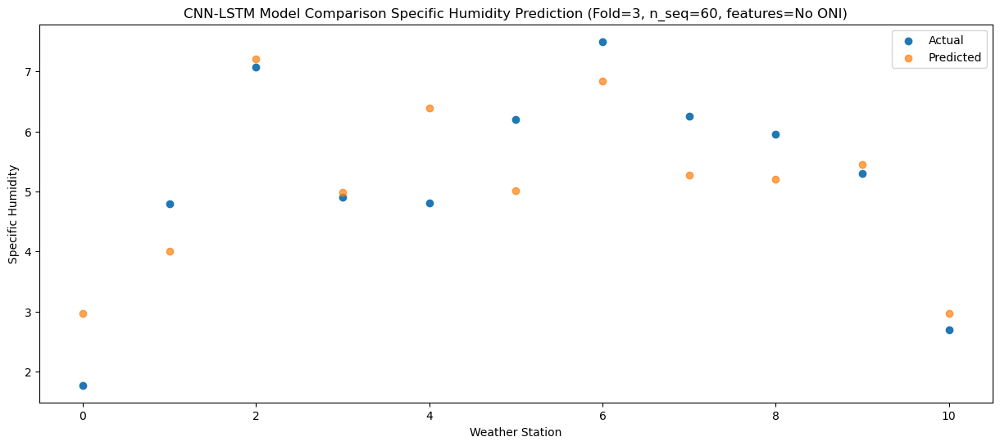

Predictions for (t+24):
    Weather_Station  Actual  Predicted
0                 0   -3.73  -1.706979
1                 1    0.37  -0.666979
2                 2    7.66   2.533021
3                 3   -0.78   0.313021
4                 4   -0.31   1.713021
5                 5    0.33   0.333021
6                 6    6.79   2.163021
7                 7    4.99   0.593021
8                 8    6.18   0.533021
9                 9    0.77   0.783021
10               10   -2.22  -1.706979


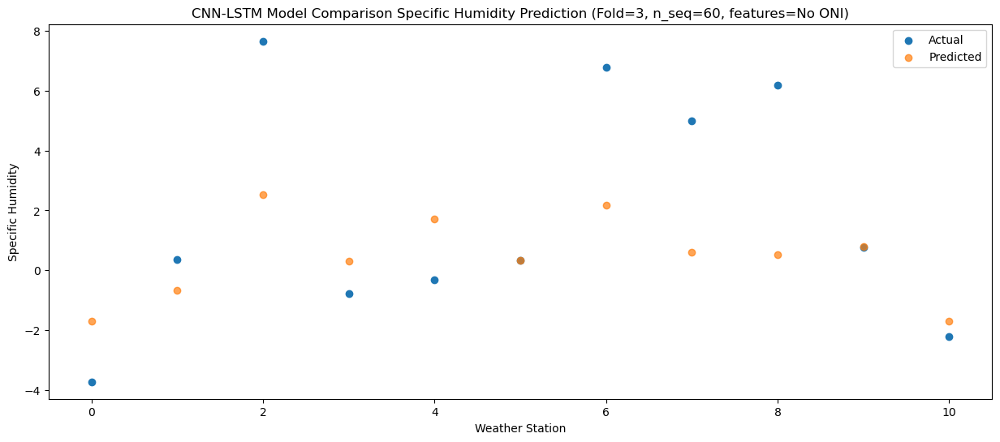

Predictions for (t+25):
    Weather_Station  Actual  Predicted
0                 0   -1.78  -1.033943
1                 1    1.34   0.006057
2                 2    6.16   3.206057
3                 3    0.36   0.986057
4                 4    0.39   2.386057
5                 5    1.38   1.006057
6                 6    6.08   2.836057
7                 7    5.13   1.266057
8                 8    4.93   1.206057
9                 9    0.47   1.456057
10               10   -2.32  -1.033943


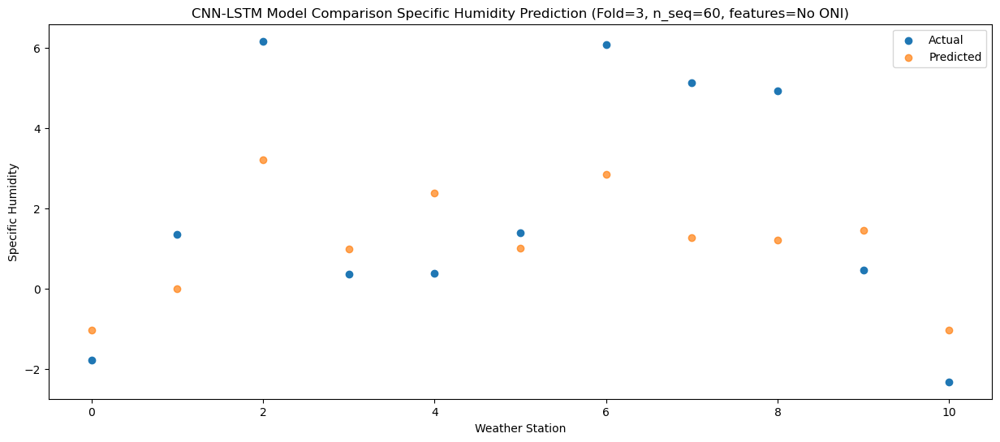

Predictions for (t+26):
    Weather_Station  Actual  Predicted
0                 0   -4.57  -3.483056
1                 1   -1.85  -2.443056
2                 2    5.88   0.756944
3                 3   -1.96  -1.463056
4                 4   -2.07  -0.063056
5                 5   -1.13  -1.443056
6                 6    5.60   0.386944
7                 7    4.14  -1.183056
8                 8    4.60  -1.243056
9                 9   -1.01  -0.993056
10               10   -3.83  -3.483056


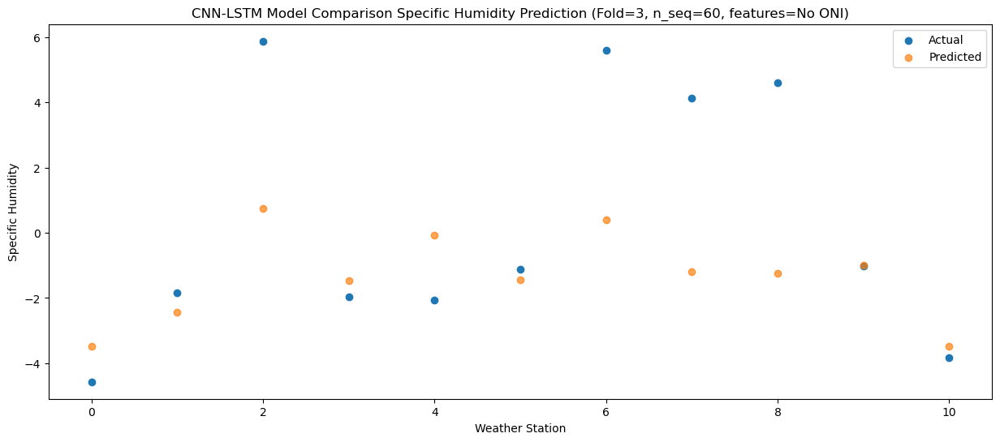

Predictions for (t+27):
    Weather_Station  Actual  Predicted
0                 0   -3.21  -2.987308
1                 1   -1.48  -1.947308
2                 2    5.10   1.252692
3                 3   -1.44  -0.967308
4                 4   -1.45   0.432692
5                 5   -0.60  -0.947308
6                 6    5.39   0.882692
7                 7    3.71  -0.687308
8                 8    3.76  -0.747308
9                 9   -0.42  -0.497308
10               10   -3.13  -2.987308


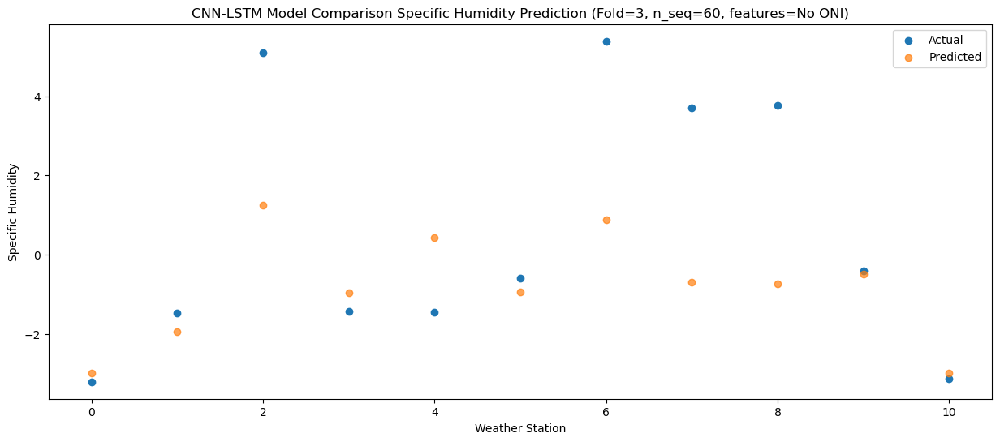

Predictions for (t+28):
    Weather_Station  Actual  Predicted
0                 0   -2.31  -1.643481
1                 1   -0.01  -0.603481
2                 2    6.44   2.596519
3                 3   -0.46   0.376519
4                 4    0.12   1.776519
5                 5    0.71   0.396519
6                 6    6.07   2.226519
7                 7    4.33   0.656519
8                 8    4.76   0.596519
9                 9    0.42   0.846519
10               10   -2.19  -1.643481


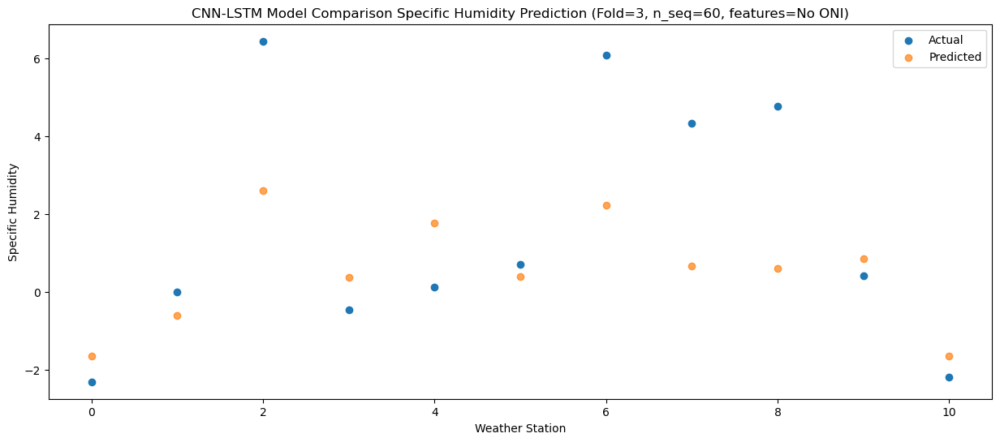

Predictions for (t+29):
    Weather_Station  Actual  Predicted
0                 0   -1.28  -0.065831
1                 1    2.29   0.974169
2                 2    6.11   4.174169
3                 3    0.81   1.954169
4                 4    1.68   3.354169
5                 5    2.24   1.974169
6                 6    6.57   3.804169
7                 7    4.33   2.234169
8                 8    4.86   2.174169
9                 9    1.07   2.424169
10               10   -1.55  -0.065831


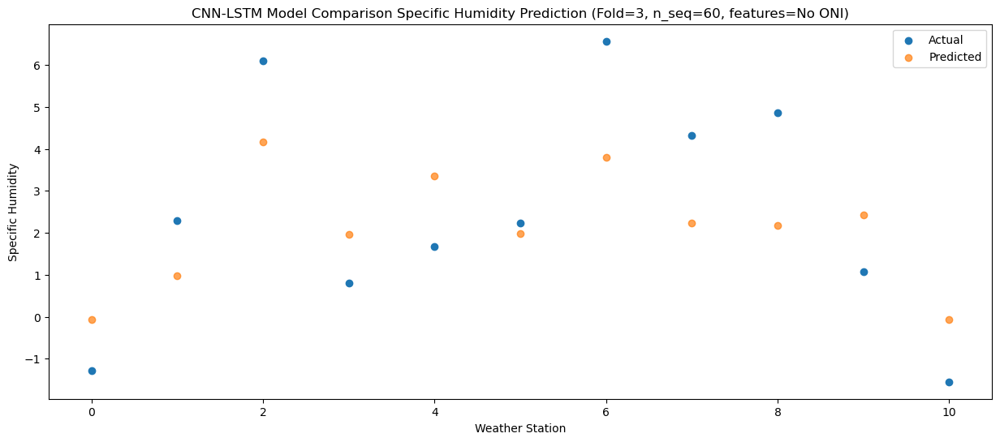

Predictions for (t+30):
    Weather_Station  Actual  Predicted
0                 0    3.03   3.873633
1                 1    6.74   4.913633
2                 2    6.29   8.113633
3                 3    5.23   5.893633
4                 4    5.77   7.293633
5                 5    6.47   5.913633
6                 6    7.38   7.743633
7                 7    4.59   6.173633
8                 8    5.23   6.113633
9                 9    4.46   6.363633
10               10    2.63   3.873633


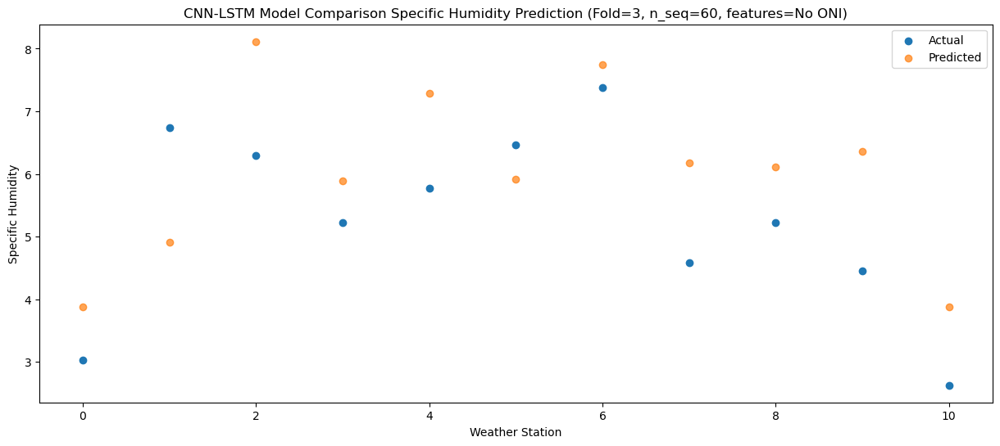

Predictions for (t+31):
    Weather_Station  Actual  Predicted
0                 0    4.33   5.906092
1                 1    9.36   6.946092
2                 2    7.46  10.146092
3                 3    7.49   7.926092
4                 4    7.87   9.326092
5                 5    8.54   7.946092
6                 6    9.32   9.776092
7                 7    6.35   8.206092
8                 8    6.72   8.146092
9                 9    6.80   8.396092
10               10    4.03   5.906092


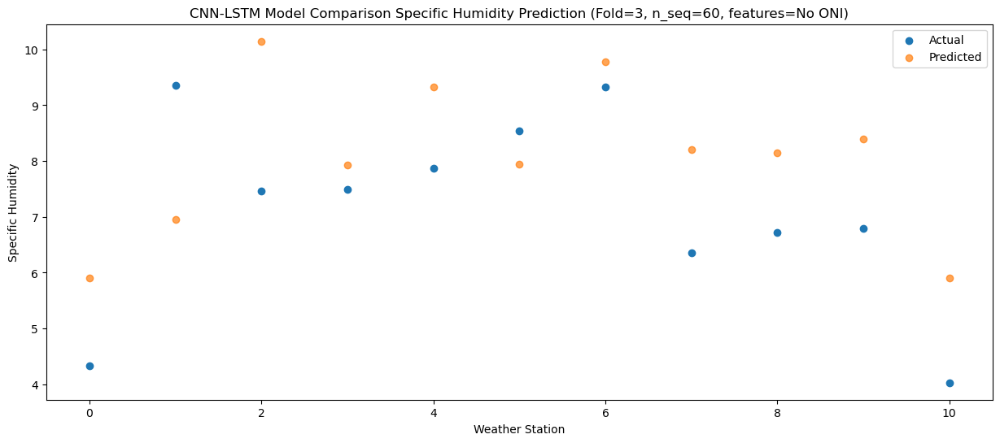

Predictions for (t+32):
    Weather_Station  Actual  Predicted
0                 0    8.40   8.076987
1                 1    9.57   9.116987
2                 2    8.63  12.316987
3                 3   10.53  10.096987
4                 4   10.46  11.496987
5                 5   11.32  10.116987
6                 6   12.31  11.946987
7                 7    9.78  10.376987
8                 8    7.55  10.316987
9                 9    9.96  10.566987
10               10    7.01   8.076987


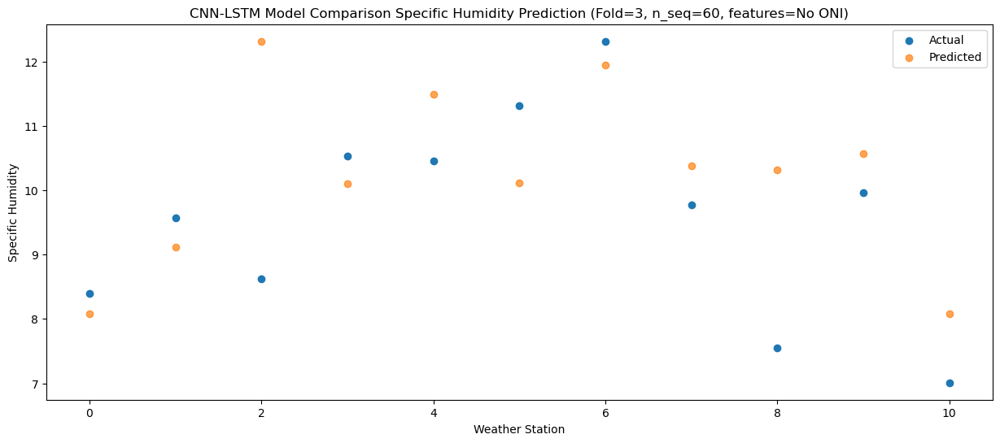

Predictions for (t+33):
    Weather_Station  Actual  Predicted
0                 0    6.59   7.714607
1                 1   10.18   8.754607
2                 2    9.42  11.954607
3                 3    9.40   9.734607
4                 4    9.96  11.134607
5                 5   10.12   9.754607
6                 6   12.15  11.584607
7                 7   12.85  10.014607
8                 8    8.01   9.954607
9                 9   10.10  10.204607
10               10    6.64   7.714607


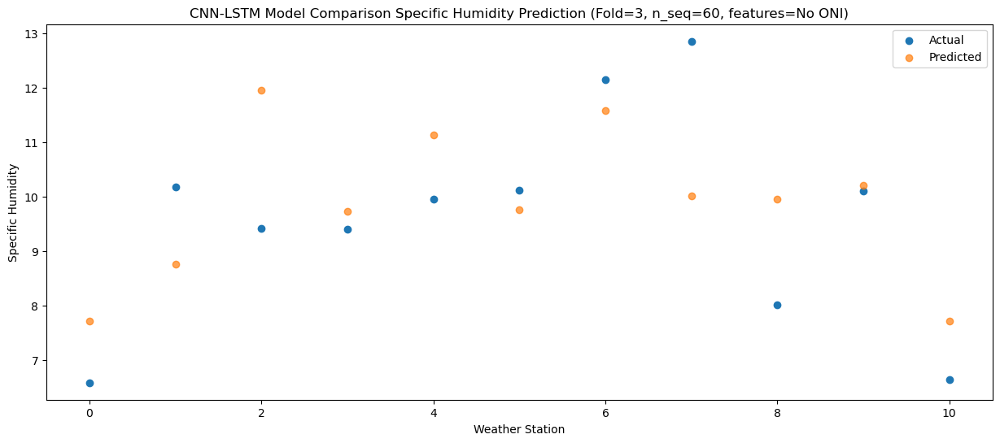

Predictions for (t+34):
    Weather_Station  Actual  Predicted
0                 0    3.17   4.675851
1                 1    6.33   5.715851
2                 2    9.13   8.915851
3                 3    6.15   6.695851
4                 4    6.86   8.095851
5                 5    7.35   6.715851
6                 6    9.20   8.545851
7                 7    8.94   6.975851
8                 8    7.41   6.915851
9                 9    6.43   7.165851
10               10    3.62   4.675851


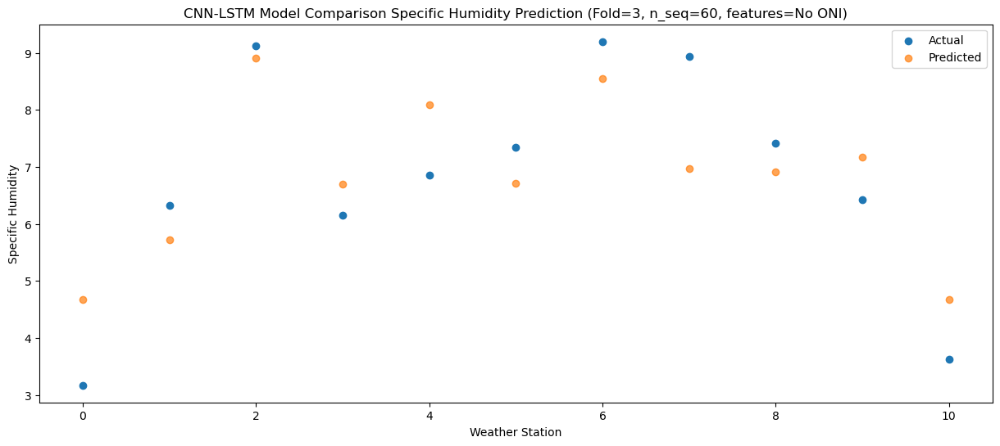

Predictions for (t+35):
    Weather_Station  Actual  Predicted
0                 0   -1.06   0.296974
1                 1    1.87   1.336974
2                 2    7.96   4.536974
3                 3    1.00   2.316974
4                 4    1.86   3.716974
5                 5    2.05   2.336974
6                 6    7.59   4.166974
7                 7    6.21   2.596974
8                 8    6.10   2.536974
9                 9    3.80   2.786974
10               10    0.20   0.296974


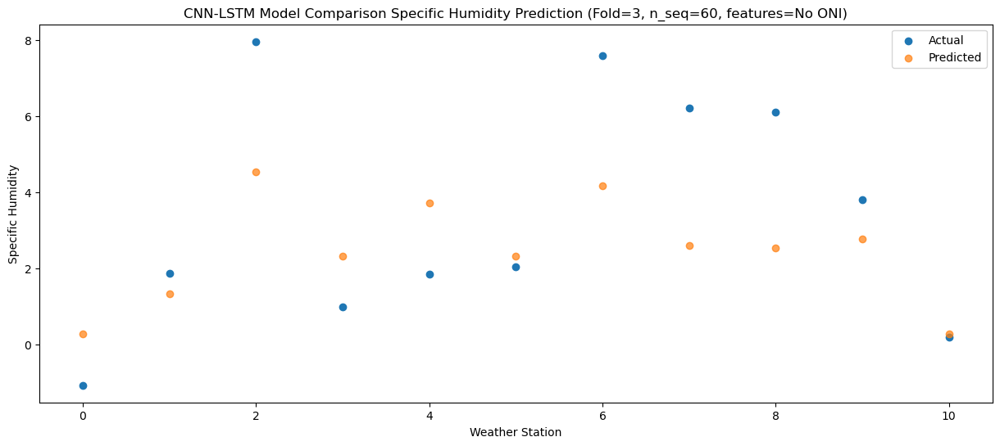

Predictions for (t+36):
    Weather_Station  Actual  Predicted
0                 0   -1.51  -0.861881
1                 1    0.84   0.178119
2                 2    5.24   3.378119
3                 3    0.19   1.158119
4                 4    0.47   2.558119
5                 5    0.83   1.178119
6                 6    5.93   3.008119
7                 7    4.44   1.438119
8                 8    3.85   1.378119
9                 9    1.95   1.628119
10               10   -1.02  -0.861881


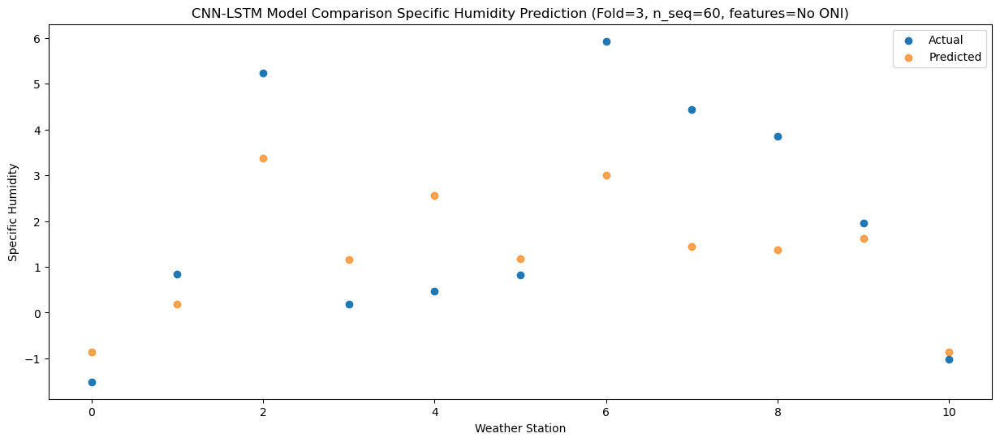

Predictions for (t+37):
    Weather_Station  Actual  Predicted
0                 0   -3.71  -2.139081
1                 1   -0.35  -1.099081
2                 2    6.08   2.100919
3                 3   -0.84  -0.119081
4                 4   -0.65   1.280919
5                 5    0.07  -0.099081
6                 6    5.96   1.730919
7                 7    5.19   0.160919
8                 8    4.64   0.100919
9                 9   -0.02   0.350919
10               10   -2.94  -2.139081


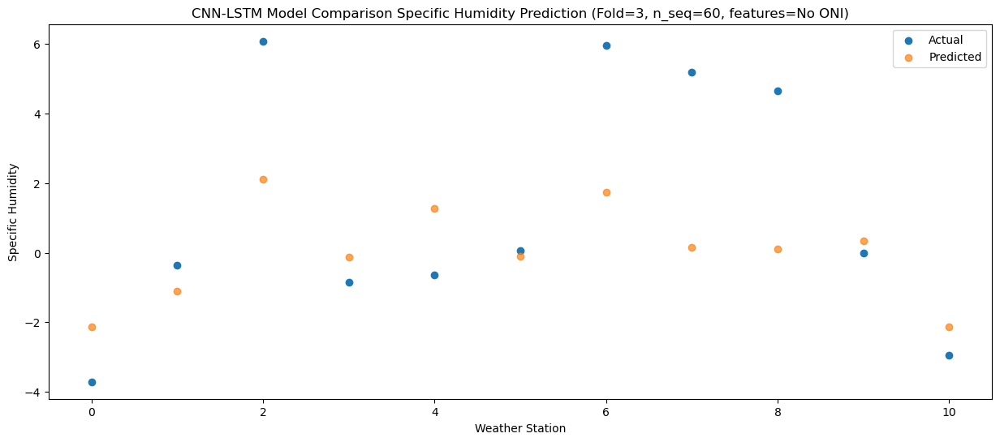

Predictions for (t+38):
    Weather_Station  Actual  Predicted
0                 0   -2.80  -1.697646
1                 1   -0.43  -0.657646
2                 2    6.23   2.542354
3                 3   -0.30   0.322354
4                 4   -0.27   1.722354
5                 5    0.65   0.342354
6                 6    5.93   2.172354
7                 7    5.58   0.602354
8                 8    4.47   0.542354
9                 9    0.55   0.792354
10               10   -2.16  -1.697646


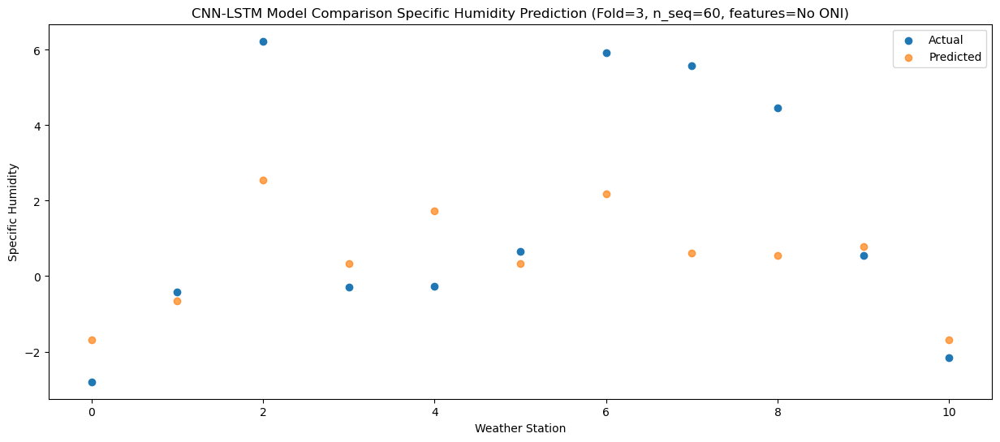

Predictions for (t+39):
    Weather_Station  Actual  Predicted
0                 0   -2.07  -1.825317
1                 1   -0.27  -0.785317
2                 2    5.10   2.414683
3                 3   -0.48   0.194683
4                 4    0.61   1.594683
5                 5    0.32   0.214683
6                 6    5.55   2.044683
7                 7    4.33   0.474683
8                 8    3.61   0.414683
9                 9   -0.16   0.664683
10               10   -2.91  -1.825317


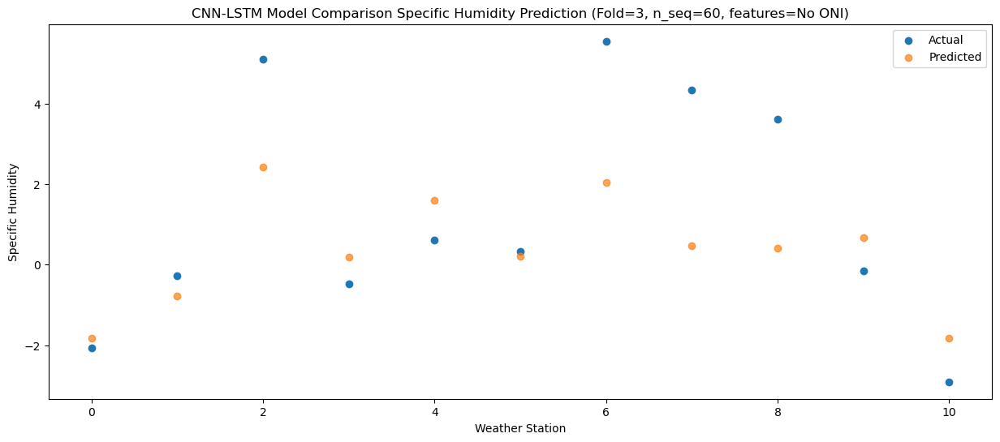

Predictions for (t+40):
    Weather_Station  Actual  Predicted
0                 0   -2.46  -1.336125
1                 1    0.67  -0.296125
2                 2    6.62   2.903875
3                 3   -0.61   0.683875
4                 4    0.28   2.083875
5                 5    0.75   0.703875
6                 6    5.85   2.533875
7                 7    5.37   0.963875
8                 8    4.41   0.903875
9                 9    0.05   1.153875
10               10   -2.78  -1.336125


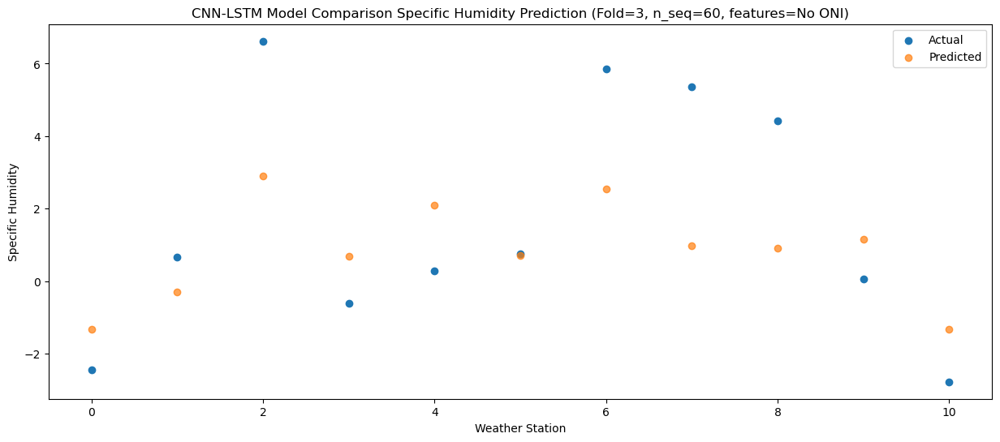

Predictions for (t+41):
    Weather_Station  Actual  Predicted
0                 0   -0.47    0.20363
1                 1    1.54    1.24363
2                 2    6.82    4.44363
3                 3    0.93    2.22363
4                 4    1.51    3.62363
5                 5    2.06    2.24363
6                 6    6.48    4.07363
7                 7    4.52    2.50363
8                 8    4.79    2.44363
9                 9    2.29    2.69363
10               10   -0.35    0.20363


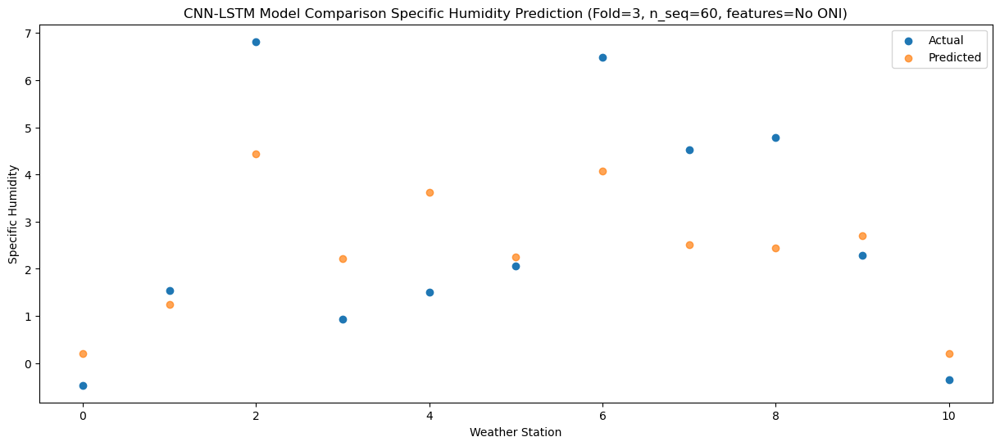

Predictions for (t+42):
    Weather_Station  Actual  Predicted
0                 0    0.98   2.618534
1                 1    5.95   3.658534
2                 2    7.76   6.858534
3                 3    3.84   4.638534
4                 4    4.69   6.038534
5                 5    4.66   4.658534
6                 6    8.64   6.488534
7                 7    6.06   4.918534
8                 8    6.38   4.858534
9                 9    2.81   5.108534
10               10    0.12   2.618534


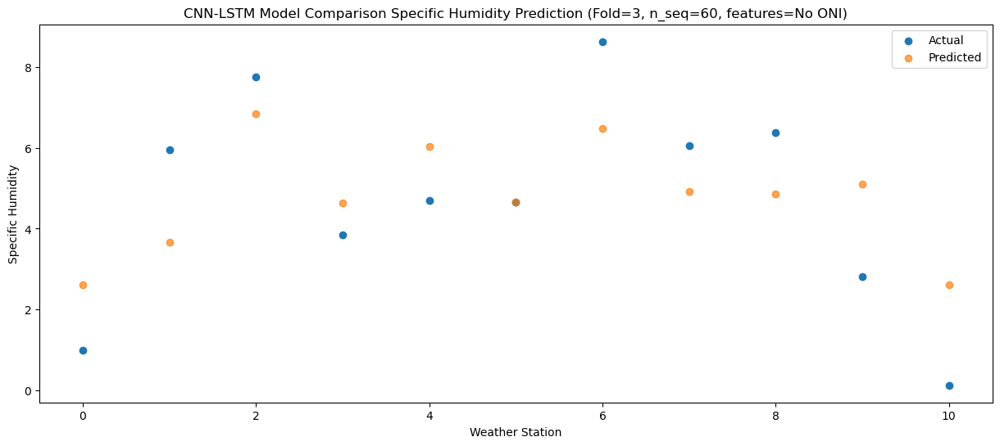

Predictions for (t+43):
    Weather_Station  Actual  Predicted
0                 0    4.25   5.372479
1                 1    8.59   6.412479
2                 2    8.53   9.612479
3                 3    5.86   7.392479
4                 4    6.82   8.792479
5                 5    6.82   7.412479
6                 6    8.87   9.242479
7                 7    6.56   7.672479
8                 8    6.44   7.612479
9                 9    6.51   7.862479
10               10    3.81   5.372479


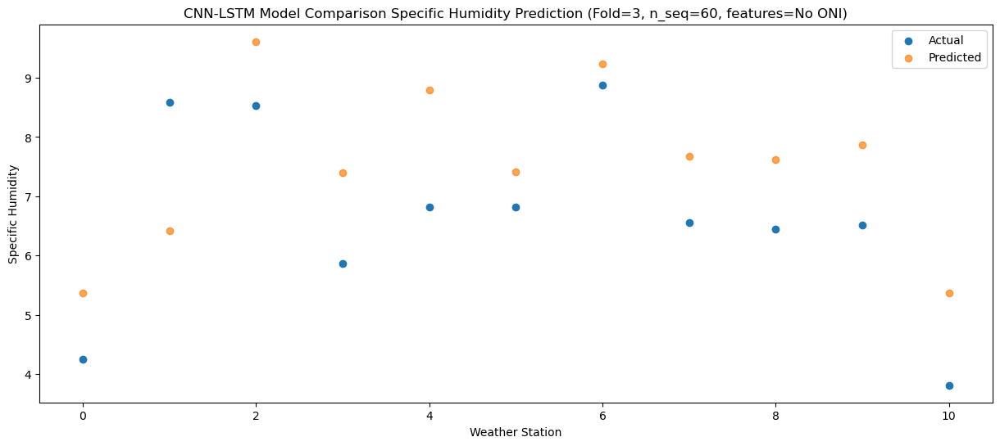

Predictions for (t+44):
    Weather_Station  Actual  Predicted
0                 0    8.20   8.092238
1                 1   10.86   9.132238
2                 2    9.63  12.332238
3                 3    9.51  10.112238
4                 4   10.59  11.512238
5                 5   11.33  10.132238
6                 6    9.71  11.962238
7                 7    7.53  10.392238
8                 8    7.28  10.332238
9                 9   11.36  10.582238
10               10    7.79   8.092238


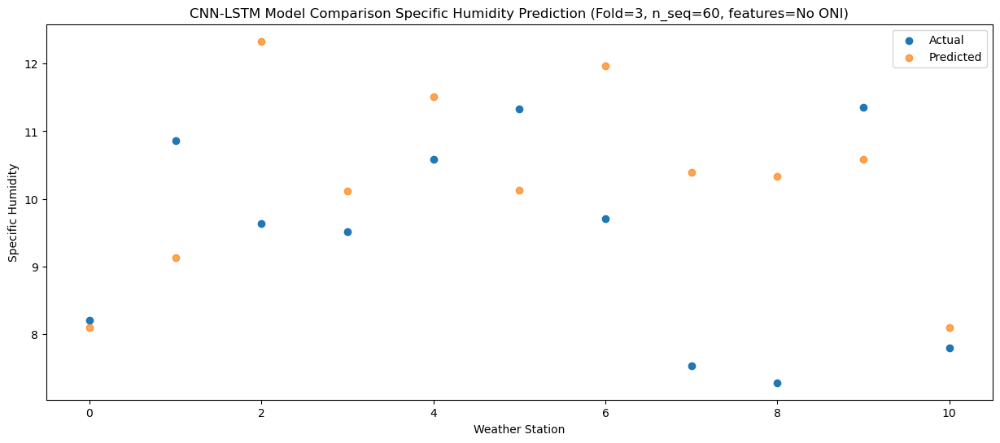

Predictions for (t+45):
    Weather_Station  Actual  Predicted
0                 0    7.30   7.289515
1                 1   11.10   8.329515
2                 2   10.70  11.529515
3                 3    8.96   9.309515
4                 4   10.98  10.709515
5                 5   10.45   9.329515
6                 6   11.36  11.159515
7                 7   10.11   9.589515
8                 8    8.55   9.529515
9                 9    8.79   9.779515
10               10    6.55   7.289515


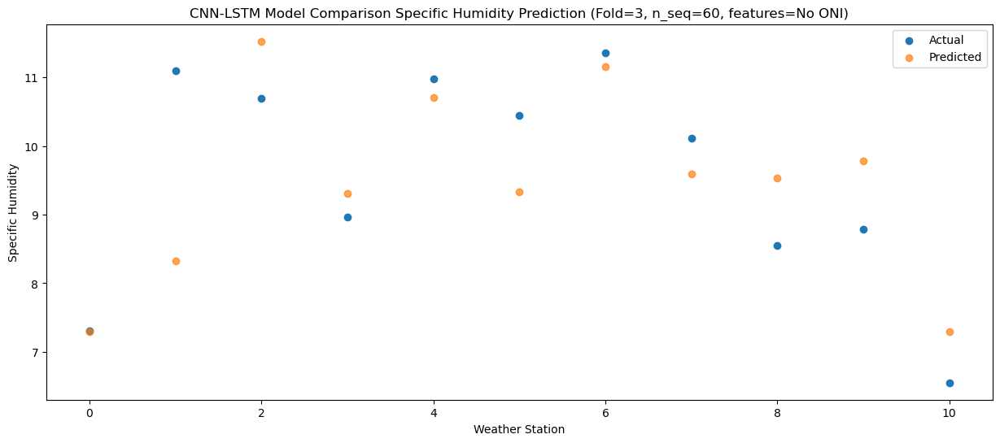

Predictions for (t+46):
    Weather_Station  Actual  Predicted
0                 0    4.39   5.190952
1                 1    7.03   6.230952
2                 2    9.16   9.430952
3                 3    6.49   7.210952
4                 4    6.87   8.610952
5                 5    7.22   7.230952
6                 6    8.74   9.060952
7                 7    9.17   7.490952
8                 8    8.00   7.430952
9                 9    7.82   7.680952
10               10    4.86   5.190952


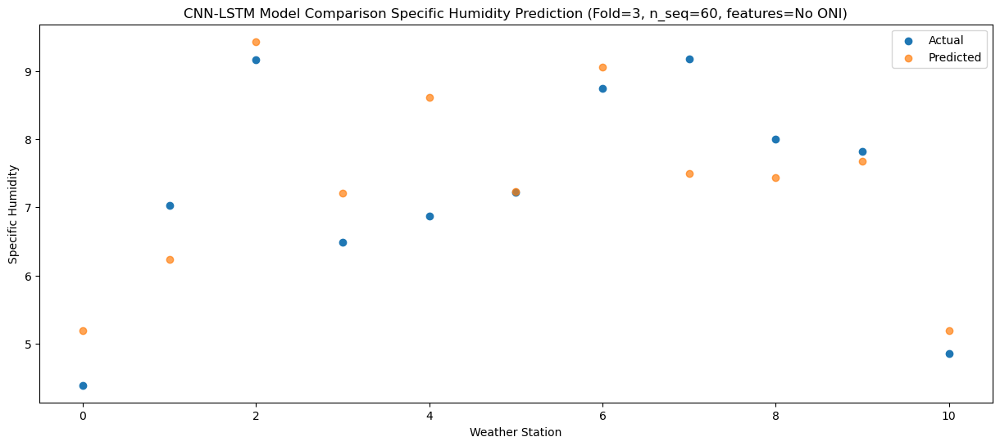

Predictions for (t+47):
    Weather_Station  Actual  Predicted
0                 0    0.28   1.648165
1                 1    3.59   2.688165
2                 2    8.00   5.888165
3                 3    2.96   3.668165
4                 4    3.25   5.068165
5                 5    3.84   3.688165
6                 6    7.49   5.518165
7                 7    6.11   3.948165
8                 8    6.57   3.888165
9                 9    4.43   4.138165
10               10    1.59   1.648165


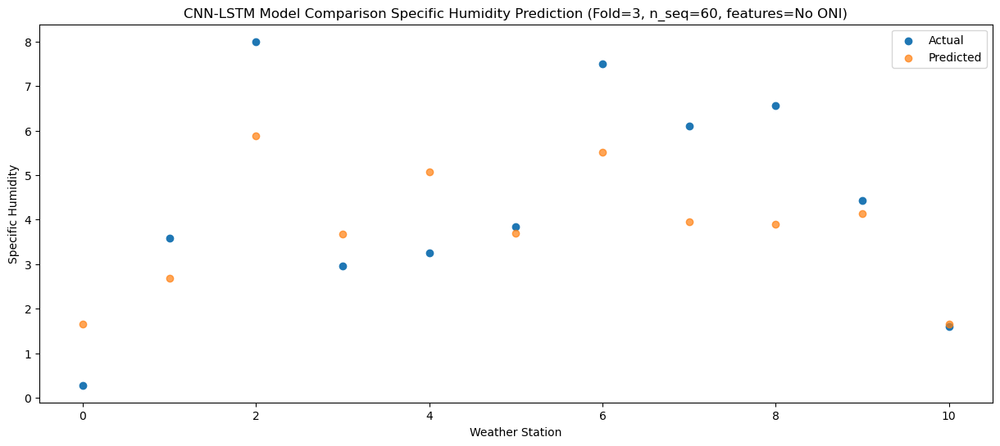

Predictions for (t+48):
    Weather_Station  Actual  Predicted
0                 0   -2.95  -1.387157
1                 1    0.71  -0.347157
2                 2    5.89   2.852843
3                 3   -0.43   0.632843
4                 4    0.08   2.032843
5                 5    0.65   0.652843
6                 6    6.16   2.482843
7                 7    5.10   0.912843
8                 8    5.48   0.852843
9                 9    0.63   1.102843
10               10   -2.09  -1.387157


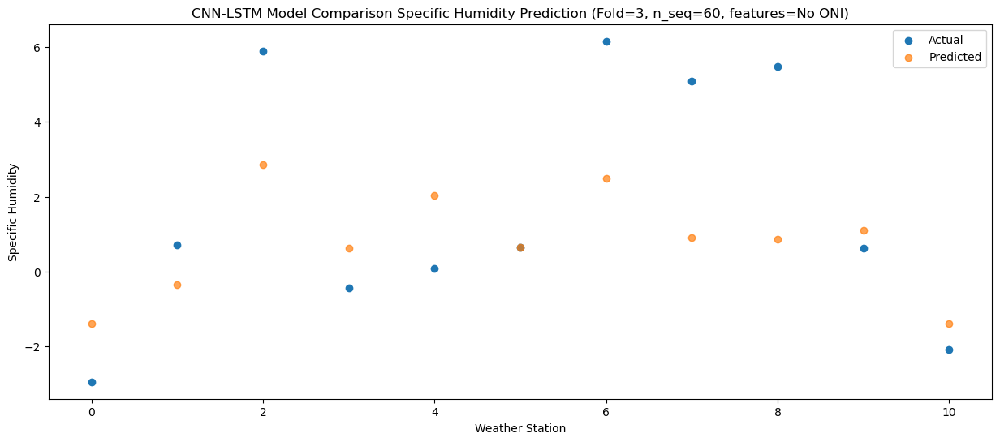

Predictions for (t+49):
    Weather_Station  Actual  Predicted
0                 0   -2.96  -1.733369
1                 1   -0.11  -0.693369
2                 2    6.12   2.506631
3                 3   -0.41   0.286631
4                 4   -0.33   1.686631
5                 5    0.61   0.306631
6                 6    6.03   2.136631
7                 7    5.02   0.566631
8                 8    5.86   0.506631
9                 9    0.96   0.756631
10               10   -1.71  -1.733369


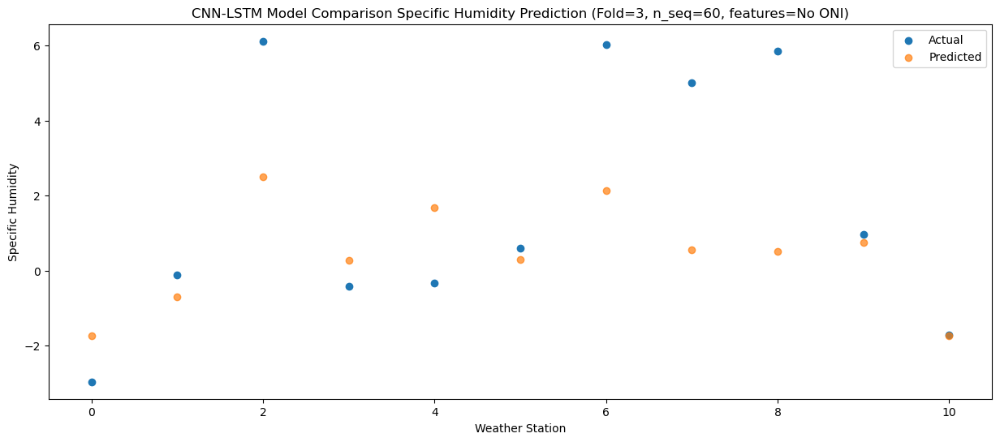

Predictions for (t+50):
    Weather_Station  Actual  Predicted
0                 0   -3.61  -2.978465
1                 1   -1.42  -1.938465
2                 2    6.66   1.261535
3                 3   -1.15  -0.958465
4                 4   -1.20   0.441535
5                 5   -0.27  -0.938465
6                 6    5.97   0.891535
7                 7    5.56  -0.678465
8                 8    5.87  -0.738465
9                 9   -0.34  -0.488465
10               10   -2.84  -2.978465


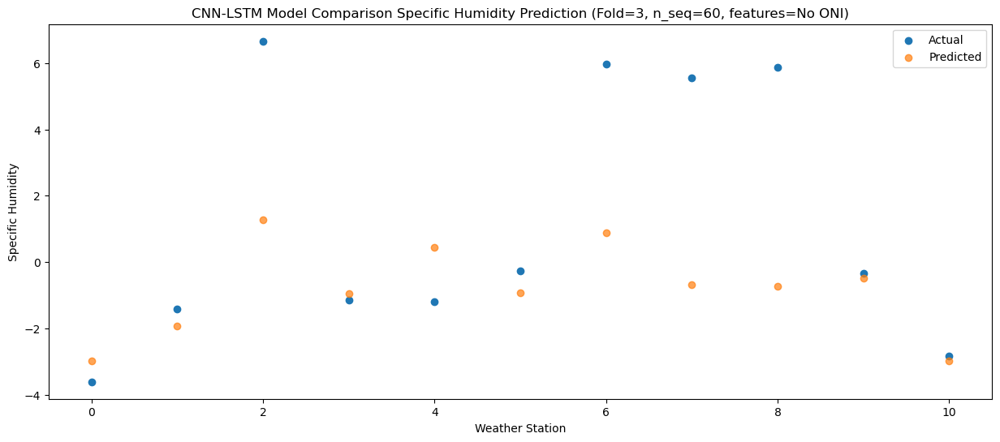

Predictions for (t+51):
    Weather_Station        Actual  Predicted
0                 0 -3.550000e+00  -2.142429
1                 1 -3.552714e-15  -1.102429
2                 2  6.830000e+00   2.097571
3                 3 -8.300000e-01  -0.122429
4                 4 -2.900000e-01   1.277571
5                 5  3.100000e-01  -0.102429
6                 6  6.040000e+00   1.727571
7                 7  6.380000e+00   0.157571
8                 8  5.560000e+00   0.097571
9                 9 -4.400000e-01   0.347571
10               10 -2.930000e+00  -2.142429


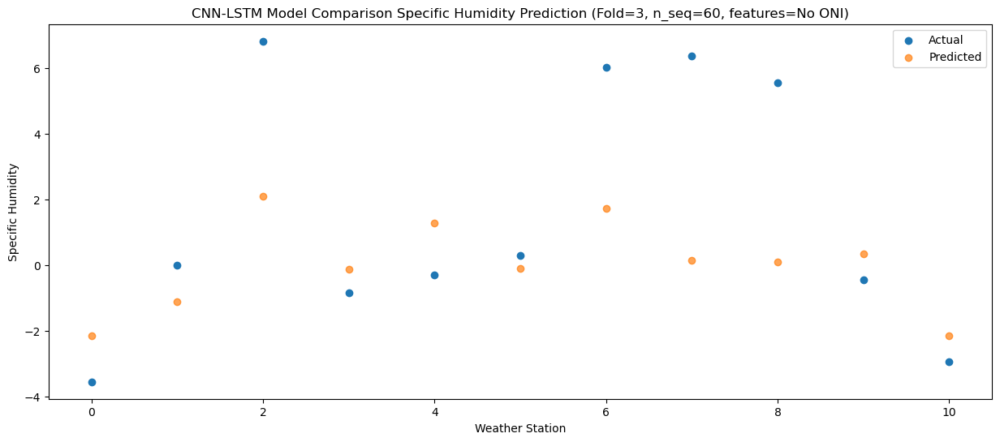

Predictions for (t+52):
    Weather_Station  Actual  Predicted
0                 0   -2.05  -1.154108
1                 1    1.42  -0.114108
2                 2    6.54   3.085892
3                 3    0.13   0.865892
4                 4    0.75   2.265892
5                 5    1.39   0.885892
6                 6    6.40   2.715892
7                 7    5.70   1.145892
8                 8    5.36   1.085892
9                 9    0.61   1.335892
10               10   -1.88  -1.154108


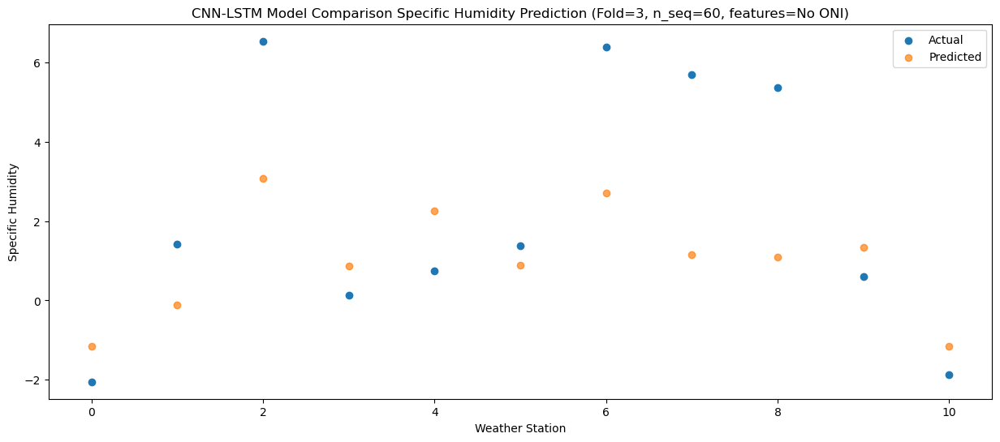

Predictions for (t+53):
    Weather_Station  Actual  Predicted
0                 0   -0.01   0.684703
1                 1    2.96   1.724703
2                 2    7.22   4.924703
3                 3    2.04   2.704703
4                 4    2.57   4.104703
5                 5    3.64   2.724703
6                 6    7.08   4.554703
7                 7    5.40   2.984703
8                 8    5.80   2.924703
9                 9    1.52   3.174703
10               10   -0.28   0.684703


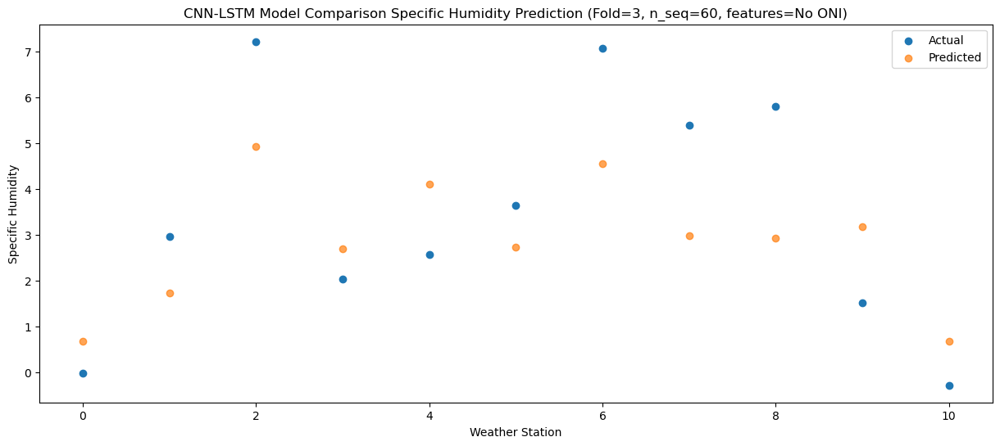

Predictions for (t+54):
    Weather_Station  Actual  Predicted
0                 0    3.86   4.181681
1                 1    7.46   5.221681
2                 2    7.09   8.421681
3                 3    6.15   6.201681
4                 4    6.71   7.601681
5                 5    7.31   6.221681
6                 6    7.97   8.051681
7                 7    5.27   6.481681
8                 8    5.96   6.421681
9                 9    4.98   6.671681
10               10    3.35   4.181681


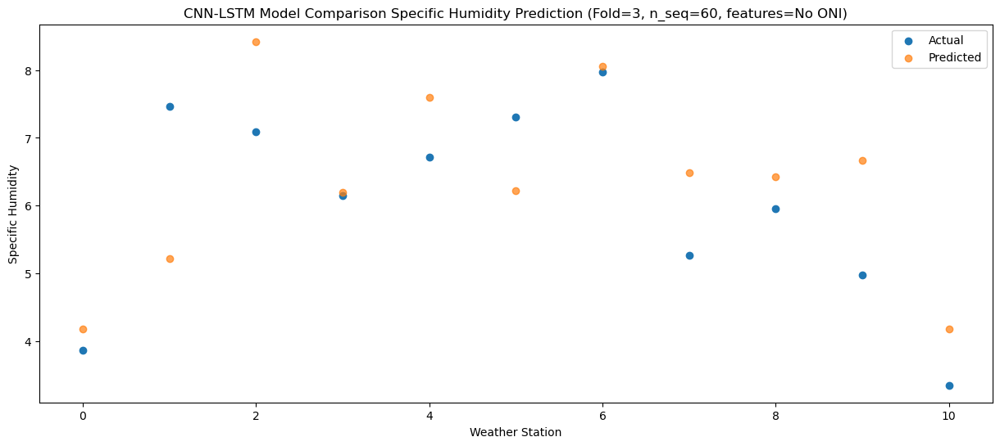

Predictions for (t+55):
    Weather_Station  Actual  Predicted
0                 0    5.59   6.463204
1                 1    9.74   7.503204
2                 2    8.36  10.703204
3                 3    7.95   8.483204
4                 4    8.68   9.883204
5                 5    9.13   8.503204
6                 6   10.26  10.333204
7                 7    6.67   8.763204
8                 8    7.11   8.703204
9                 9    7.85   8.953204
10               10    5.03   6.463204


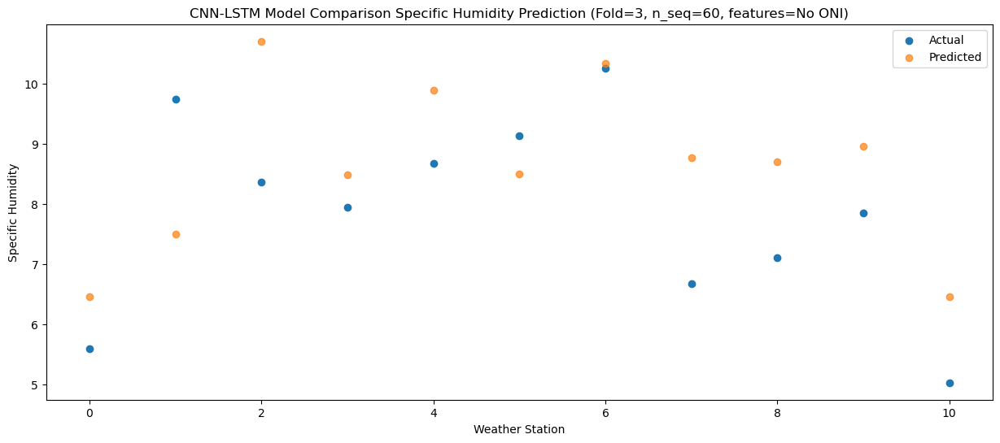

Predictions for (t+56):
    Weather_Station  Actual  Predicted
0                 0    8.45   7.850765
1                 1   10.23   8.890765
2                 2   10.34  12.090765
3                 3    8.85   9.870765
4                 4   10.25  11.270765
5                 5   10.32   9.890765
6                 6   10.31  11.720765
7                 7    7.70  10.150765
8                 8    8.69  10.090765
9                 9   11.02  10.340765
10               10    7.91   7.850765


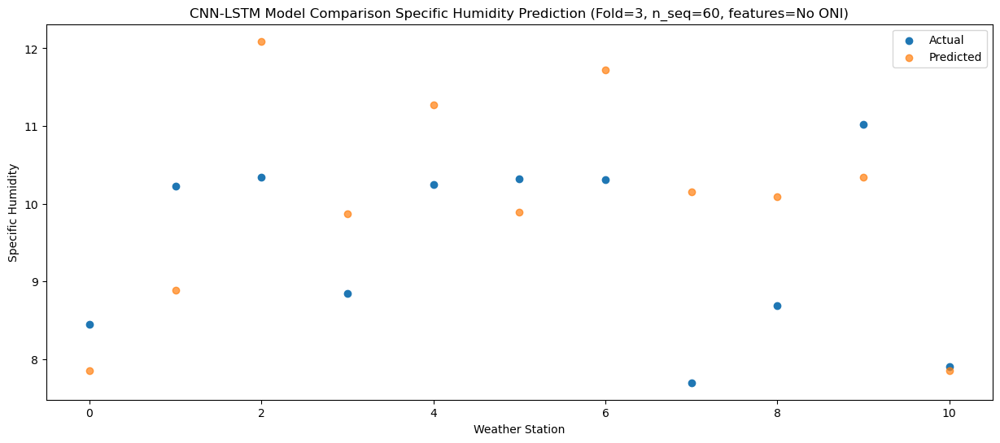

Predictions for (t+57):
    Weather_Station  Actual  Predicted
0                 0    7.01   7.249516
1                 1    9.49   8.289516
2                 2    8.65  11.489516
3                 3    7.53   9.269516
4                 4    9.77  10.669516
5                 5    9.76   9.289516
6                 6   11.77  11.119516
7                 7    8.52   9.549516
8                 8    7.96   9.489516
9                 9    9.67   9.739516
10               10    6.63   7.249516


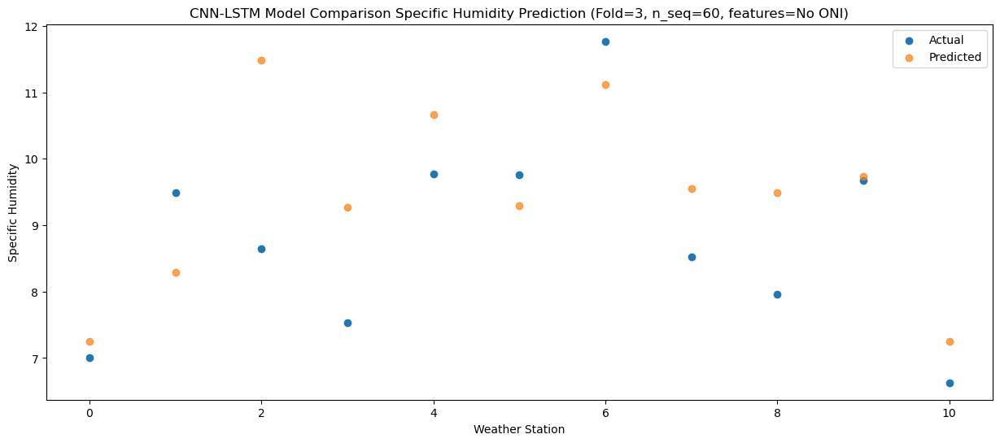

Predictions for (t+58):
    Weather_Station  Actual  Predicted
0                 0    5.30   4.800891
1                 1    6.50   5.840891
2                 2    8.92   9.040891
3                 3    5.99   6.820891
4                 4    6.76   8.220891
5                 5    7.14   6.840891
6                 6    9.35   8.670891
7                 7    6.80   7.100891
8                 8    7.64   7.040891
9                 9    6.31   7.290891
10               10    3.81   4.800891


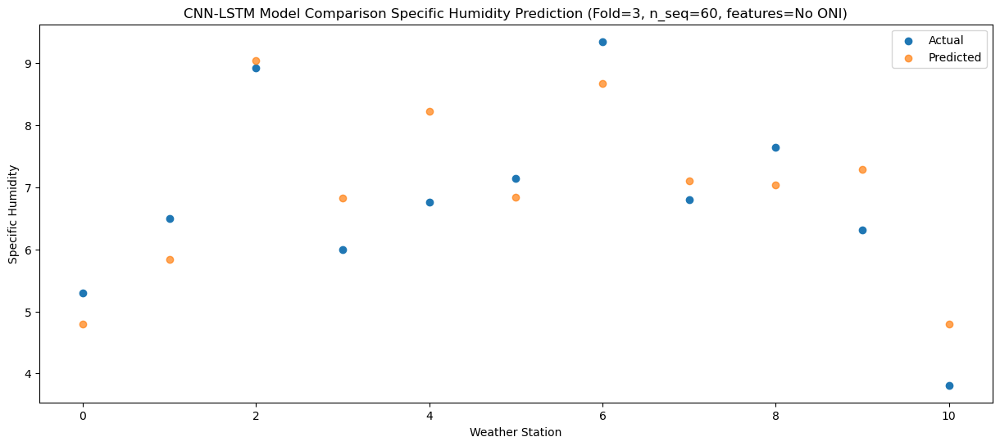

Predictions for (t+59):
    Weather_Station  Actual  Predicted
0                 0    0.48   0.886247
1                 1    2.27   1.926247
2                 2    7.81   5.126247
3                 3    2.24   2.906247
4                 4    2.40   4.306247
5                 5    3.27   2.926247
6                 6    7.59   4.756247
7                 7    5.75   3.186247
8                 8    6.05   3.126247
9                 9    3.21   3.376247
10               10   -0.19   0.886247


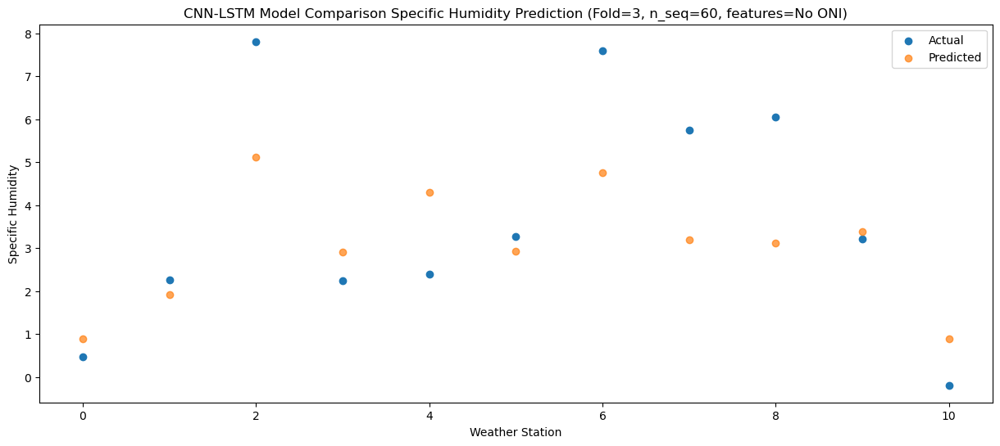

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_3 (Conv1D)           (None, 1, 512)            1014272   
                                                                 
 max_pooling1d_3 (MaxPooling  (None, 1, 512)           0         
 1D)                                                             
                                                                 
 dropout_9 (Dropout)         (None, 1, 512)            0         
                                                                 
 lstm_6 (LSTM)               (None, 1, 1024)           6295552   
                                                                 
 dropout_10 (Dropout)        (None, 1, 1024)           0         
                                                                 
 lstm_7 (LSTM)               (None, 1024)              8392704   
                                                      

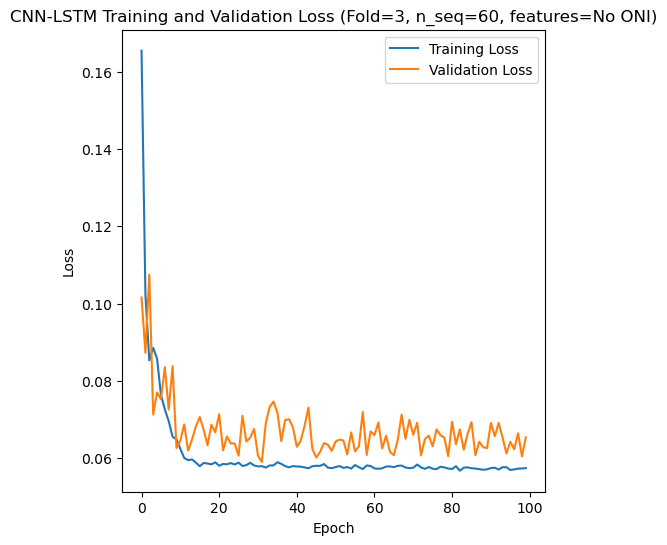

Epoch 1/100
84/84 [==============================] - 22s 117ms/step - loss: 0.1533 - accuracy: 0.1905 - mae: 0.1274 - rmse: 0.1533 - mape: 27.1563 - pearson: 0.5339 - val_loss: 0.0953 - val_accuracy: 0.7000 - val_mae: 0.0797 - val_rmse: 0.0953 - val_mape: 16.6350 - val_pearson: 0.7401
Epoch 2/100
84/84 [==============================] - 5s 64ms/step - loss: 0.1054 - accuracy: 0.3333 - mae: 0.0868 - rmse: 0.1054 - mape: 18.6755 - pearson: 0.6905 - val_loss: 0.0783 - val_accuracy: 0.7000 - val_mae: 0.0646 - val_rmse: 0.0783 - val_mape: 14.2633 - val_pearson: 0.7118
Epoch 3/100
84/84 [==============================] - 6s 72ms/step - loss: 0.0978 - accuracy: 0.3452 - mae: 0.0799 - rmse: 0.0978 - mape: 17.2100 - pearson: 0.7169 - val_loss: 0.0823 - val_accuracy: 0.7000 - val_mae: 0.0642 - val_rmse: 0.0823 - val_mape: 13.1385 - val_pearson: 0.7364
Epoch 4/100
84/84 [==============================] - 6s 68ms/step - loss: 0.0876 - accuracy: 0.3929 - mae: 0.0717 - rmse: 0.0876 - mape: 15.6999 -

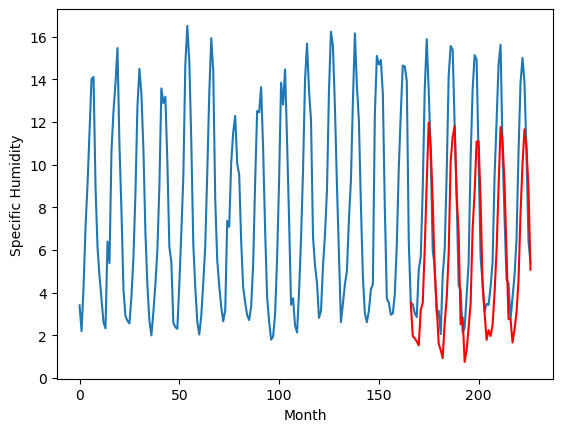

Weather Station 2:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
-1.36		0.66		2.02
-1.22		0.55		1.77
-2.78		0.41		3.19
-1.94		0.22		2.16
-0.56		1.88		2.44
0.65		2.22		1.57
1.30		4.76		3.46
4.63		7.88		3.25
6.37		10.67		4.30
6.61		9.49		2.88
6.03		6.95		0.92
3.99		3.67		-0.32
0.93		2.04		1.11
-3.81		0.30		4.11
-3.46		0.01		3.47
-1.47		-0.38		1.09
-1.50		1.28		2.78
-0.75		2.41		3.16
0.58		4.51		3.93
4.87		8.88		4.01
6.08		10.00		3.92
6.47		10.50		4.03
5.67		7.25		1.58
2.75		5.48		2.73
-1.91		1.21		3.12
-0.17		1.53		1.70
-4.03		-0.55		3.48
-2.45		-0.01		2.44
-0.92		1.07		1.99
0.37		2.18		1.81
2.76		5.66		2.90
5.66		7.44		1.78
6.69		9.78		3.09
6.77		9.79		3.02
5.90		6.98		1.08
1.12		3.06		1.94
1.29		1.74		0.45
-2.23		0.48		2.71
-2.74		0.94		3.68
-0.80		0.66		1.46
-0.42		1.18		1.60
1.07		2.70		1.63
1.87		4.66		2.79
5.38		7.62		2.24
7.29		10.46		3.17
7.59		9.77		2.18
5.14		7.81		2.67
1.52		4.57		3.05
-0.78		1.46		2.24
-1.87		1.45		3.32
-2.91		0.36		3.27
-3.60		0

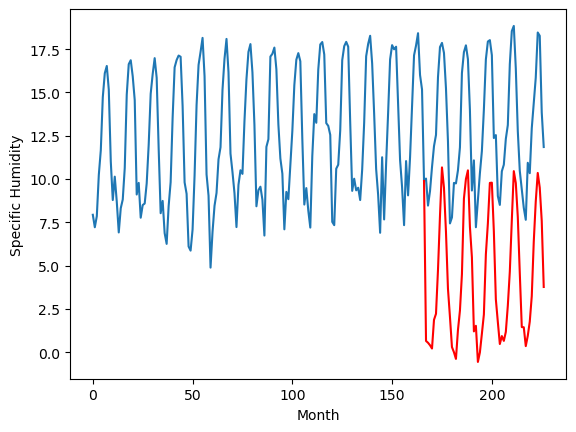

Weather Station 3:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
-1.06		0.72		1.78
-0.22		0.61		0.83
-0.36		0.47		0.83
-0.55		0.28		0.83
3.00		1.94		-1.06
1.88		2.28		0.40
4.12		4.82		0.70
7.42		7.94		0.52
10.35		10.73		0.38
8.84		9.55		0.71
6.79		7.01		0.22
3.44		3.73		0.29
0.77		2.10		1.33
-1.61		0.36		1.97
-1.72		0.07		1.79
-1.84		-0.32		1.52
1.22		1.34		0.12
1.47		2.47		1.00
4.91		4.57		-0.34
9.15		8.94		-0.21
10.80		10.06		-0.74
10.81		10.56		-0.25
7.87		7.31		-0.56
5.09		5.54		0.45
-0.35		1.27		1.62
2.60		1.59		-1.01
-2.13		-0.49		1.64
-1.28		0.05		1.33
-0.23		1.13		1.36
2.22		2.24		0.02
6.82		5.72		-1.10
9.20		7.50		-1.70
11.04		9.84		-1.20
10.86		9.85		-1.01
6.62		7.04		0.42
1.66		3.12		1.46
0.91		1.80		0.89
0.37		0.54		0.17
0.27		1.00		0.73
0.94		0.72		-0.22
1.27		1.24		-0.03
2.11		2.76		0.65
5.49		4.72		-0.77
9.06		7.68		-1.38
10.65		10.52		-0.13
9.07		9.83		0.76
6.05		7.87		1.82
2.12		4.63		2.51
0.14		1.52		1.38
-1.17		1.51		2.68
-1.89		0.42		2.

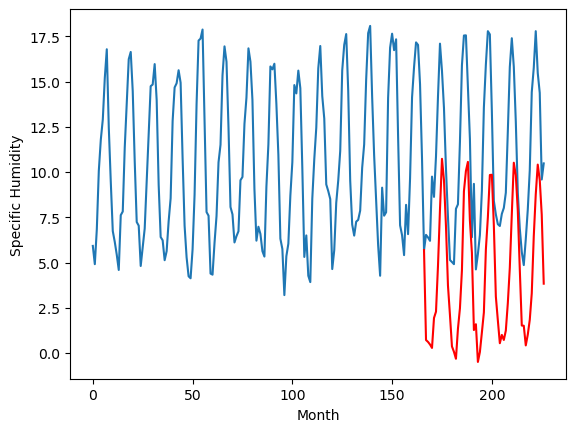

Weather Station 4:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
1.12		0.58		-0.54
0.12		0.47		0.35
0.76		0.33		-0.43
0.14		0.14		0.00
4.09		1.80		-2.29
3.69		2.14		-1.55
6.85		4.68		-2.17
9.01		7.80		-1.21
12.24		10.59		-1.65
9.65		9.41		-0.24
8.44		6.87		-1.57
3.87		3.59		-0.28
2.23		1.96		-0.27
-0.37		0.22		0.59
-0.48		-0.07		0.41
-0.80		-0.46		0.34
1.86		1.20		-0.66
3.15		2.33		-0.82
7.15		4.43		-2.72
10.84		8.80		-2.04
11.41		9.92		-1.49
11.80		10.42		-1.38
7.79		7.17		-0.62
4.94		5.40		0.46
1.32		1.13		-0.19
3.18		1.45		-1.73
-1.48		-0.63		0.85
-0.95		-0.09		0.86
0.64		0.99		0.35
4.15		2.10		-2.05
8.14		5.58		-2.56
9.91		7.36		-2.55
9.33		9.70		0.37
10.34		9.71		-0.63
7.06		6.90		-0.16
2.60		2.98		0.38
2.42		1.66		-0.76
0.84		0.40		-0.44
0.15		0.86		0.71
0.51		0.58		0.07
2.57		1.10		-1.47
3.25		2.62		-0.63
7.51		4.58		-2.93
11.45		7.54		-3.91
11.30		10.38		-0.92
9.20		9.69		0.49
8.30		7.73		-0.57
4.58		4.49		-0.09
2.05		1.38		-0.67
0.30		1.37		1.07
-

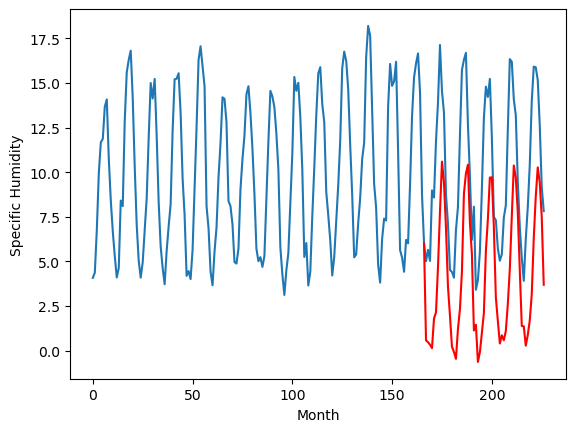

Weather Station 5:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
0.61		0.14		-0.47
-0.36		0.03		0.39
0.33		-0.11		-0.44
-0.33		-0.30		0.03
3.57		1.36		-2.21
3.06		1.70		-1.36
6.30		4.24		-2.06
8.28		7.36		-0.92
11.43		10.15		-1.28
8.78		8.97		0.19
7.89		6.43		-1.46
3.12		3.15		0.03
1.76		1.52		-0.24
-0.81		-0.22		0.59
-0.85		-0.51		0.34
-1.30		-0.90		0.40
1.28		0.76		-0.52
2.64		1.89		-0.75
6.93		3.99		-2.94
10.81		8.36		-2.45
11.19		9.48		-1.71
11.30		9.98		-1.32
7.40		6.73		-0.67
4.67		4.96		0.29
1.06		0.69		-0.37
2.47		1.01		-1.46
-1.86		-1.07		0.79
-1.42		-0.53		0.89
0.10		0.55		0.45
3.78		1.66		-2.12
7.66		5.14		-2.52
9.34		6.92		-2.42
8.84		9.26		0.42
10.01		9.27		-0.74
6.86		6.46		-0.40
2.40		2.54		0.14
1.98		1.22		-0.76
0.39		-0.04		-0.43
-0.36		0.42		0.78
0.04		0.14		0.10
2.01		0.66		-1.35
2.86		2.18		-0.68
7.13		4.14		-2.99
10.61		7.10		-3.51
9.71		9.94		0.23
8.33		9.25		0.92
8.00		7.29		-0.71
4.34		4.05		-0.29
1.92		0.94		-0.98
0.16		0.93		0.77


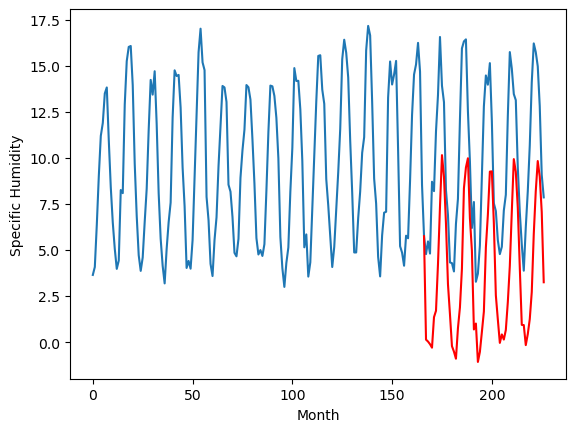

Weather Station 6:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
6.92		4.68		-2.24
5.68		4.57		-1.11
5.56		4.43		-1.13
5.44		4.24		-1.20
8.24		5.90		-2.34
7.49		6.24		-1.25
9.76		8.78		-0.98
11.47		11.90		0.43
12.70		14.69		1.99
11.39		13.51		2.12
11.20		10.97		-0.23
7.55		7.69		0.14
7.09		6.06		-1.03
4.53		4.32		-0.21
5.23		4.03		-1.20
4.59		3.64		-0.95
6.08		5.30		-0.78
7.04		6.43		-0.61
11.59		8.53		-3.06
13.89		12.90		-0.99
14.92		14.02		-0.90
14.64		14.52		-0.12
11.39		11.27		-0.12
8.34		9.50		1.16
6.62		5.23		-1.39
5.77		5.55		-0.22
4.31		3.47		-0.84
4.30		4.01		-0.29
4.89		5.09		0.20
6.92		6.20		-0.72
9.18		9.68		0.50
12.03		11.46		-0.57
12.72		13.80		1.08
14.71		13.81		-0.90
13.46		11.00		-2.46
9.95		7.08		-2.87
7.25		5.76		-1.49
6.61		4.50		-2.11
5.06		4.96		-0.10
5.18		4.68		-0.50
6.47		5.20		-1.27
6.44		6.72		0.28
11.28		8.68		-2.60
15.14		11.64		-3.50
12.81		14.48		1.67
11.95		13.79		1.84
12.46		11.83		-0.63
10.33		8.59		-1.74
8.03		5.48		-2.55

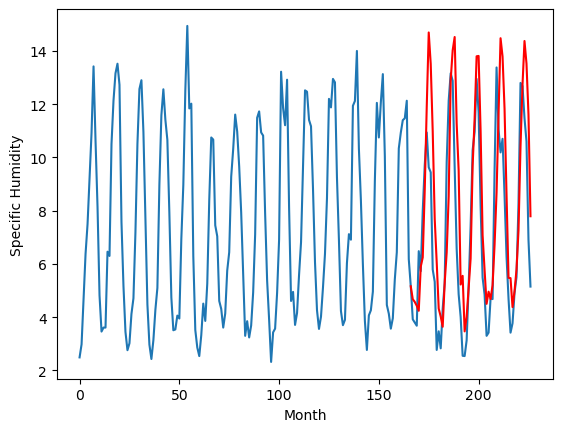

Weather Station 7:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
0.46		2.66		2.20
0.53		2.55		2.02
0.37		2.41		2.04
0.95		2.22		1.27
3.14		3.88		0.74
2.47		4.22		1.75
5.59		6.76		1.17
9.42		9.88		0.46
12.01		12.67		0.66
12.22		11.49		-0.73
8.38		8.95		0.57
5.73		5.67		-0.06
2.90		4.04		1.14
-0.44		2.30		2.74
-0.56		2.01		2.57
-0.31		1.62		1.93
1.40		3.28		1.88
1.81		4.41		2.60
4.79		6.51		1.72
9.48		10.88		1.40
11.08		12.00		0.92
11.46		12.50		1.04
7.88		9.25		1.37
5.67		7.48		1.81
-0.05		3.21		3.26
1.81		3.53		1.72
-1.17		1.45		2.62
0.15		1.99		1.84
0.99		3.07		2.08
2.05		4.18		2.13
6.06		7.66		1.60
8.34		9.44		1.10
11.50		11.78		0.28
10.31		11.79		1.48
6.76		8.98		2.22
2.08		5.06		2.98
1.90		3.74		1.84
-0.09		2.48		2.57
0.54		2.94		2.40
1.58		2.66		1.08
1.07		3.18		2.11
2.67		4.70		2.03
4.89		6.66		1.77
7.94		9.62		1.68
11.33		12.46		1.13
10.87		11.77		0.90
7.42		9.81		2.39
3.51		6.57		3.06
0.56		3.46		2.90
0.28		3.45		3.17
-0.50		2.36		2.86
-0.32		2.95	

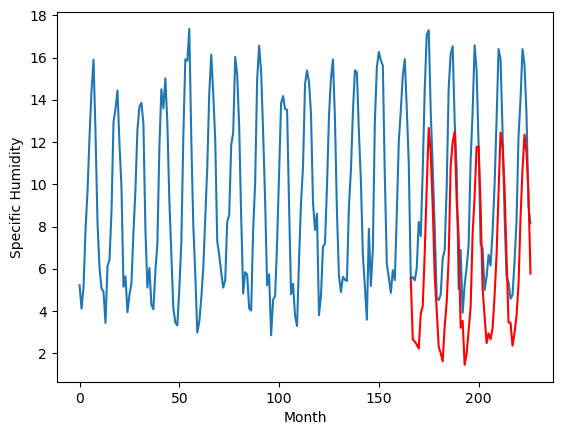

Weather Station 8:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
0.67		0.82		0.15
0.40		0.71		0.31
0.16		0.57		0.41
-0.07		0.38		0.45
2.48		2.04		-0.44
2.80		2.38		-0.42
6.18		4.92		-1.26
9.79		8.04		-1.75
11.84		10.83		-1.01
9.19		9.65		0.46
7.59		7.11		-0.48
3.04		3.83		0.79
1.37		2.20		0.83
-0.56		0.46		1.02
-0.71		0.17		0.88
-1.34		-0.22		1.12
1.03		1.44		0.41
1.95		2.57		0.62
5.11		4.67		-0.44
9.71		9.04		-0.67
10.66		10.16		-0.50
10.40		10.66		0.26
7.14		7.41		0.27
5.05		5.64		0.59
0.36		1.37		1.01
1.83		1.69		-0.14
-1.37		-0.39		0.98
-0.86		0.15		1.01
0.65		1.23		0.58
2.44		2.34		-0.10
7.15		5.82		-1.33
9.51		7.60		-1.91
10.31		9.94		-0.37
10.78		9.95		-0.83
6.97		7.14		0.17
2.31		3.22		0.91
0.95		1.90		0.95
0.08		0.64		0.56
0.36		1.10		0.74
0.17		0.82		0.65
0.93		1.34		0.41
1.83		2.86		1.03
6.22		4.82		-1.40
8.78		7.78		-1.00
11.57		10.62		-0.95
11.85		9.93		-1.92
7.65		7.97		0.32
4.04		4.73		0.69
1.01		1.62		0.61
0.20		1.61		1.41
-0.95		0.52		1.47

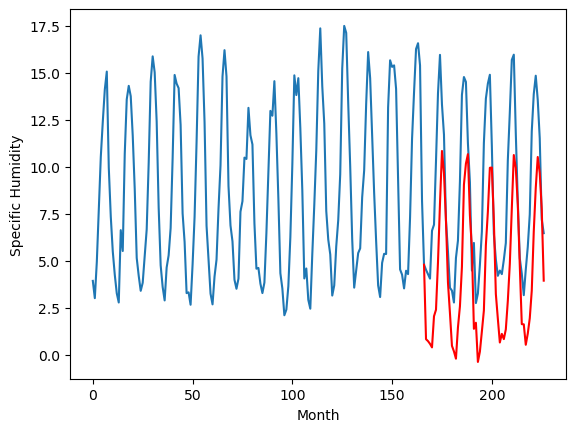

Weather Station 9:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
0.13		0.39		0.26
0.30		0.28		-0.02
-0.07		0.14		0.21
-0.47		-0.05		0.42
1.45		1.61		0.16
1.73		1.95		0.22
4.88		4.49		-0.39
7.62		7.61		-0.01
10.84		10.40		-0.44
9.17		9.22		0.05
6.25		6.68		0.43
2.87		3.40		0.53
1.19		1.77		0.58
-0.41		0.03		0.44
-0.76		-0.26		0.50
-1.33		-0.65		0.68
0.61		1.01		0.40
1.94		2.14		0.20
4.23		4.24		0.01
9.29		8.61		-0.68
10.55		9.73		-0.82
10.69		10.23		-0.46
7.21		6.98		-0.23
6.06		5.21		-0.85
0.29		0.94		0.65
1.00		1.26		0.26
-1.38		-0.82		0.56
-0.80		-0.28		0.52
0.51		0.80		0.29
2.00		1.91		-0.09
6.02		5.39		-0.63
7.46		7.17		-0.29
10.20		9.51		-0.69
9.84		9.52		-0.32
7.18		6.71		-0.47
1.85		2.79		0.94
0.81		1.47		0.66
-0.15		0.21		0.36
0.47		0.67		0.20
0.07		0.39		0.32
0.42		0.91		0.49
1.87		2.43		0.56
4.12		4.39		0.27
6.08		7.35		1.27
10.38		10.19		-0.19
9.84		9.50		-0.34
7.04		7.54		0.50
3.71		4.30		0.59
0.64		1.19		0.55
0.61		1.18		0.57
-0.47		0.09		0.56

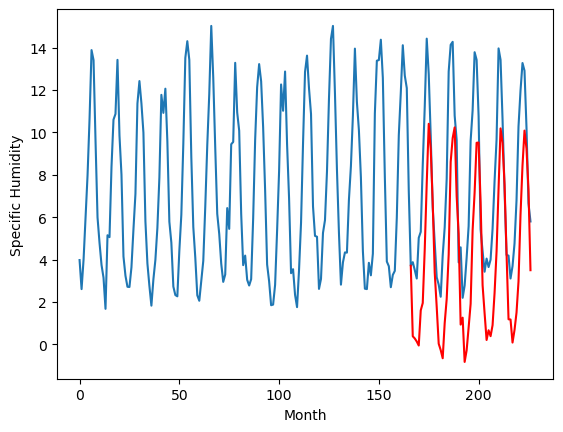

Weather Station 10:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
-0.54		-0.77		-0.23
-0.37		-0.88		-0.51
-0.85		-1.02		-0.17
-1.12		-1.21		-0.09
0.93		0.45		-0.48
1.52		0.79		-0.73
5.24		3.33		-1.91
7.72		6.45		-1.27
11.28		9.24		-2.04
9.09		8.06		-1.03
6.31		5.52		-0.79
2.15		2.24		0.09
1.06		0.61		-0.45
-0.85		-1.13		-0.28
-1.17		-1.42		-0.25
-1.81		-1.81		0.00
0.56		-0.15		-0.71
1.87		0.98		-0.89
4.49		3.08		-1.41
9.24		7.45		-1.79
10.64		8.57		-2.07
10.89		9.07		-1.82
6.86		5.82		-1.04
4.99		4.05		-0.94
-0.30		-0.22		0.08
0.24		0.10		-0.14
-2.00		-1.98		0.02
-1.30		-1.44		-0.14
0.22		-0.36		-0.58
1.52		0.75		-0.77
5.59		4.23		-1.36
7.83		6.01		-1.82
10.47		8.35		-2.12
9.70		8.36		-1.34
6.33		5.55		-0.78
1.57		1.63		0.06
0.20		0.31		0.11
-0.91		-0.95		-0.04
-0.39		-0.49		-0.10
-0.62		-0.77		-0.15
-0.01		-0.25		-0.24
1.50		1.27		-0.23
4.28		3.23		-1.05
5.92		6.19		0.27
10.62		9.03		-1.59
10.49		8.34		-2.15
6.71		6.38		-0.33
3.27		3.14		-0.13
-0.12		0.03

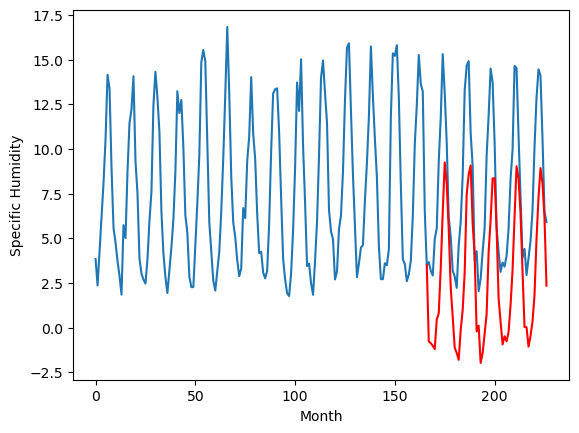

Weather Station 11:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
1.53		1.96		0.43
1.68		1.85		0.17
1.34		1.71		0.37
0.99		1.52		0.53
2.56		3.18		0.62
2.40		3.52		1.12
5.02		6.06		1.04
8.21		9.18		0.97
11.13		11.97		0.84
9.71		10.79		1.08
7.57		8.25		0.68
4.53		4.97		0.44
2.60		3.34		0.74
1.27		1.60		0.33
0.89		1.31		0.42
0.32		0.92		0.60
1.61		2.58		0.97
3.28		3.71		0.43
4.88		5.81		0.93
9.89		10.18		0.29
11.16		11.30		0.14
12.03		11.80		-0.23
8.27		8.55		0.28
7.26		6.78		-0.48
2.02		2.51		0.49
1.98		2.83		0.85
0.24		0.75		0.51
0.69		1.29		0.60
1.84		2.37		0.53
2.83		3.48		0.65
6.29		6.96		0.67
8.20		8.74		0.54
9.93		11.08		1.15
10.39		11.09		0.70
8.40		8.28		-0.12
3.58		4.36		0.78
2.86		3.04		0.18
1.41		1.78		0.37
2.03		2.24		0.21
1.28		1.96		0.68
1.49		2.48		0.99
3.19		4.00		0.81
4.09		5.96		1.87
7.33		8.92		1.59
10.95		11.76		0.81
10.15		11.07		0.92
8.44		9.11		0.67
5.38		5.87		0.49
1.94		2.76		0.82
2.46		2.75		0.29
1.39		1.66		0.27
1.41		2.25		0.84
2.

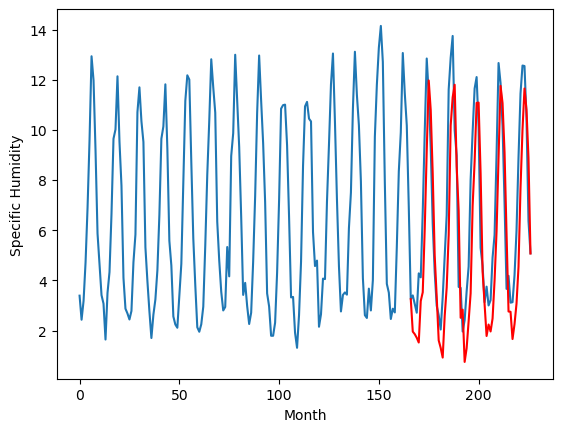

RangeIndex(start=1, stop=12, step=1)
[2.3299999999999996, -1.3599999999999994, -1.06, 1.1199999999999997, 0.6100000000000012, 6.92, 0.45999999999999996, 0.6700000000000013, 0.1299999999999999, -0.5399999999999991, 1.529999999999999]
[1.9569403839111326, 0.6569403839111327, 0.7169403839111328, 0.5769403839111327, 0.13694038391113272, 4.676940383911133, 2.6569403839111327, 0.8169403839111329, 0.3869403839111327, -0.773059616088867, 1.9569403839111326]
Predictions for (t+0):
    Weather_Station  Actual  Predicted
0                 0    2.33    1.95694
1                 1   -1.36    0.65694
2                 2   -1.06    0.71694
3                 3    1.12    0.57694
4                 4    0.61    0.13694
5                 5    6.92    4.67694
6                 6    0.46    2.65694
7                 7    0.67    0.81694
8                 8    0.13    0.38694
9                 9   -0.54   -0.77306
10               10    1.53    1.95694


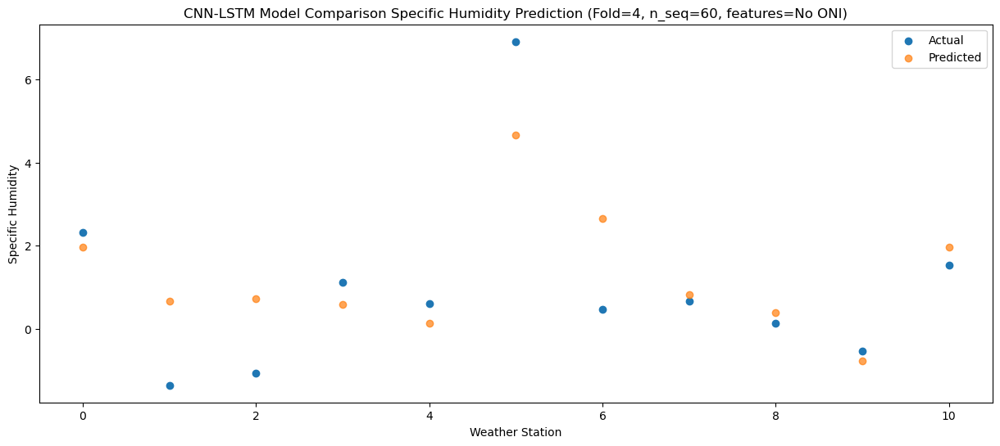

Predictions for (t+1):
    Weather_Station  Actual  Predicted
0                 0    2.26    1.85366
1                 1   -1.22    0.55366
2                 2   -0.22    0.61366
3                 3    0.12    0.47366
4                 4   -0.36    0.03366
5                 5    5.68    4.57366
6                 6    0.53    2.55366
7                 7    0.40    0.71366
8                 8    0.30    0.28366
9                 9   -0.37   -0.87634
10               10    1.68    1.85366


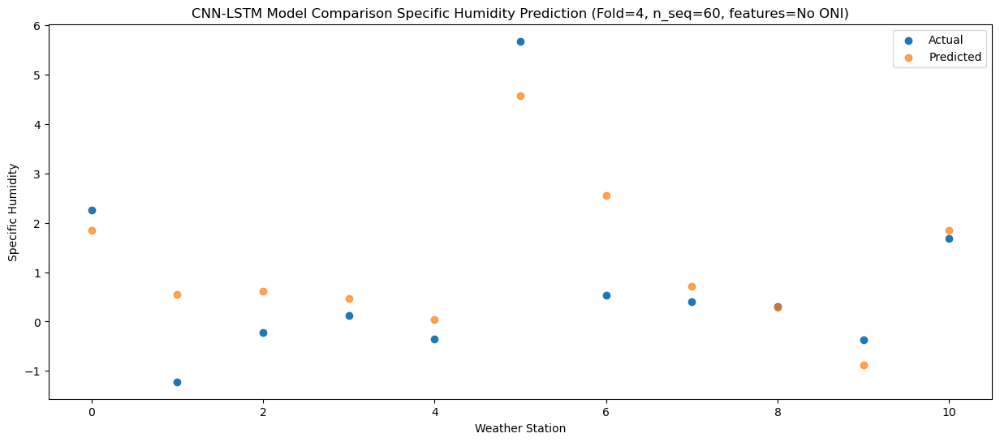

Predictions for (t+2):
    Weather_Station  Actual  Predicted
0                 0    1.84   1.708866
1                 1   -2.78   0.408866
2                 2   -0.36   0.468866
3                 3    0.76   0.328866
4                 4    0.33  -0.111134
5                 5    5.56   4.428866
6                 6    0.37   2.408866
7                 7    0.16   0.568866
8                 8   -0.07   0.138866
9                 9   -0.85  -1.021134
10               10    1.34   1.708866


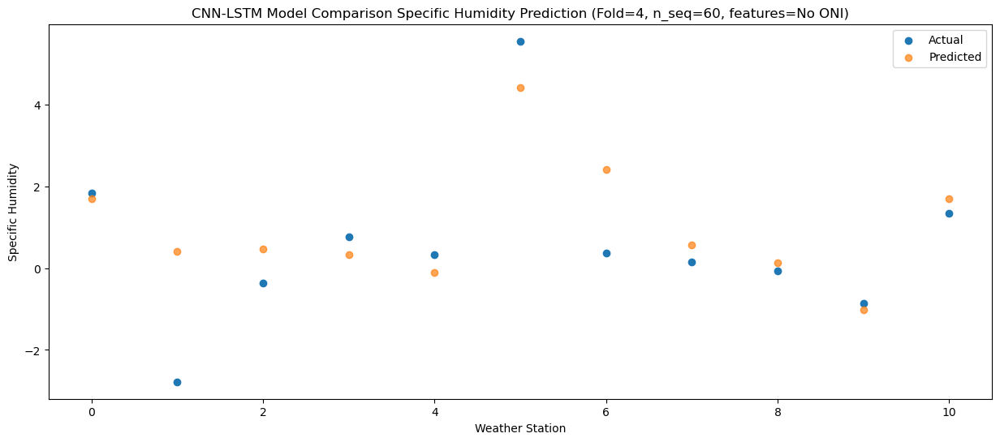

Predictions for (t+3):
    Weather_Station  Actual  Predicted
0                 0    1.66   1.520342
1                 1   -1.94   0.220342
2                 2   -0.55   0.280342
3                 3    0.14   0.140342
4                 4   -0.33  -0.299658
5                 5    5.44   4.240342
6                 6    0.95   2.220342
7                 7   -0.07   0.380342
8                 8   -0.47  -0.049658
9                 9   -1.12  -1.209658
10               10    0.99   1.520342


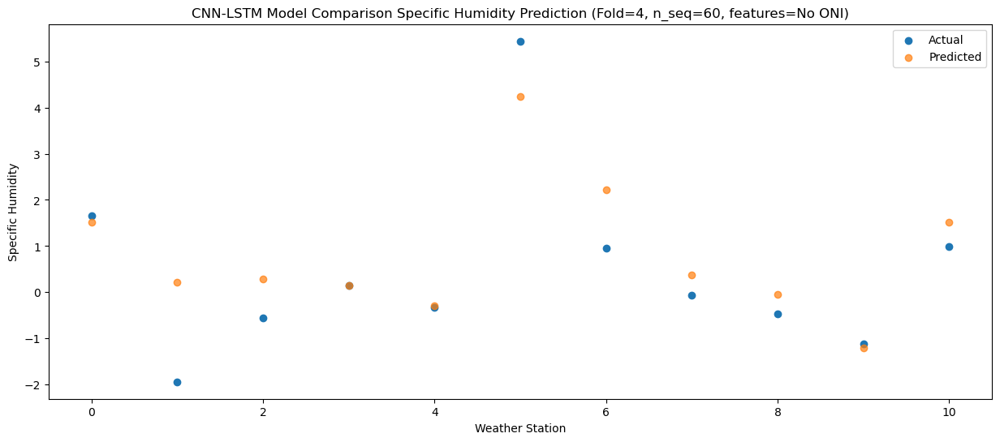

Predictions for (t+4):
    Weather_Station  Actual  Predicted
0                 0    3.89   3.177005
1                 1   -0.56   1.877005
2                 2    3.00   1.937005
3                 3    4.09   1.797005
4                 4    3.57   1.357005
5                 5    8.24   5.897005
6                 6    3.14   3.877005
7                 7    2.48   2.037005
8                 8    1.45   1.607005
9                 9    0.93   0.447005
10               10    2.56   3.177005


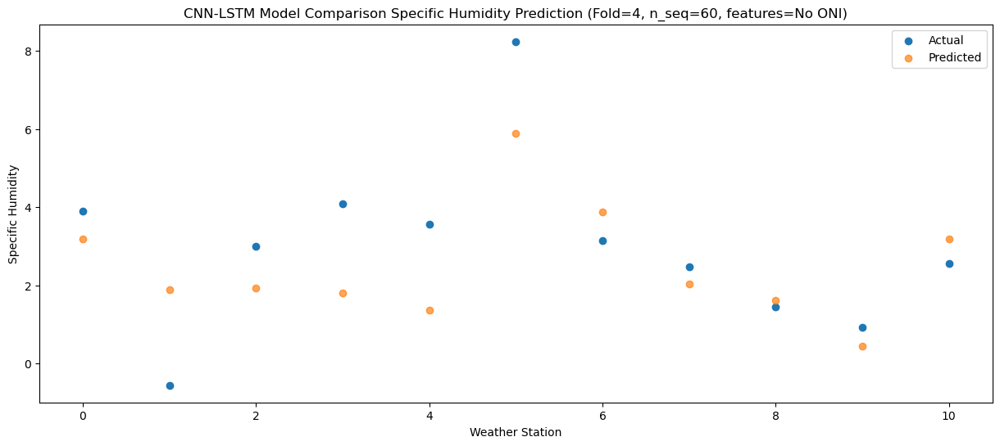

Predictions for (t+5):
    Weather_Station  Actual  Predicted
0                 0    4.48   3.524761
1                 1    0.65   2.224761
2                 2    1.88   2.284761
3                 3    3.69   2.144761
4                 4    3.06   1.704761
5                 5    7.49   6.244761
6                 6    2.47   4.224761
7                 7    2.80   2.384761
8                 8    1.73   1.954761
9                 9    1.52   0.794761
10               10    2.40   3.524761


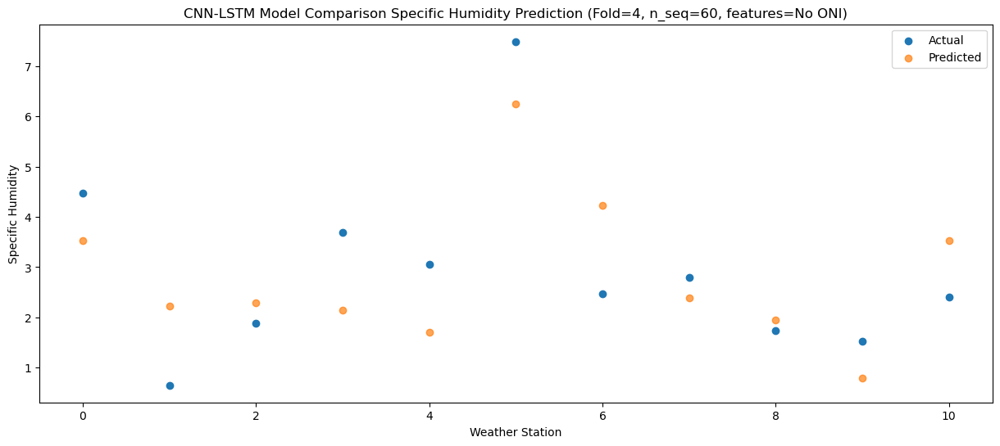

Predictions for (t+6):
    Weather_Station  Actual  Predicted
0                 0    7.69   6.058355
1                 1    1.30   4.758355
2                 2    4.12   4.818355
3                 3    6.85   4.678355
4                 4    6.30   4.238355
5                 5    9.76   8.778355
6                 6    5.59   6.758355
7                 7    6.18   4.918355
8                 8    4.88   4.488355
9                 9    5.24   3.328355
10               10    5.02   6.058355


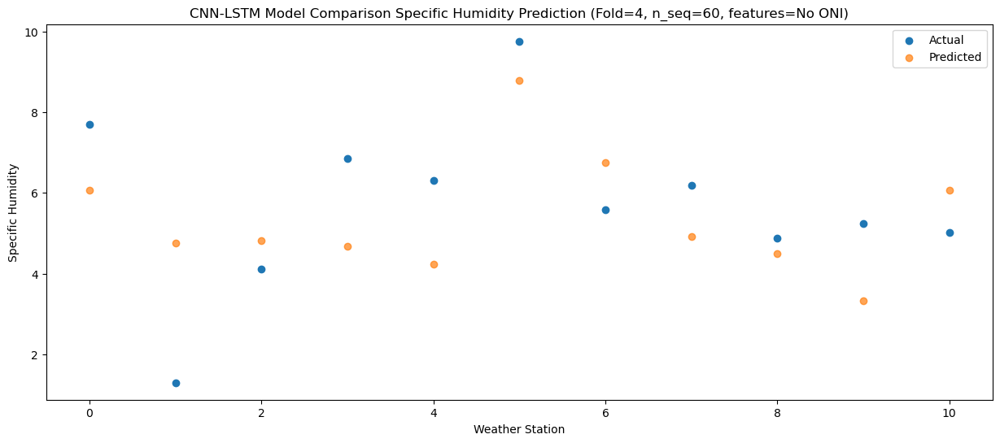

Predictions for (t+7):
    Weather_Station  Actual  Predicted
0                 0   12.34   9.176816
1                 1    4.63   7.876816
2                 2    7.42   7.936816
3                 3    9.01   7.796816
4                 4    8.28   7.356816
5                 5   11.47  11.896816
6                 6    9.42   9.876816
7                 7    9.79   8.036816
8                 8    7.62   7.606816
9                 9    7.72   6.446816
10               10    8.21   9.176816


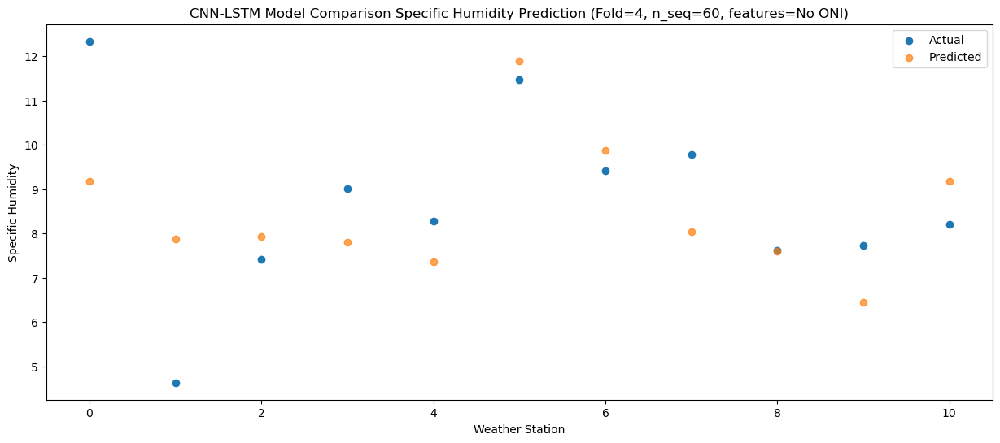

Predictions for (t+8):
    Weather_Station  Actual  Predicted
0                 0   14.69  11.974294
1                 1    6.37  10.674294
2                 2   10.35  10.734294
3                 3   12.24  10.594294
4                 4   11.43  10.154294
5                 5   12.70  14.694294
6                 6   12.01  12.674294
7                 7   11.84  10.834294
8                 8   10.84  10.404294
9                 9   11.28   9.244294
10               10   11.13  11.974294


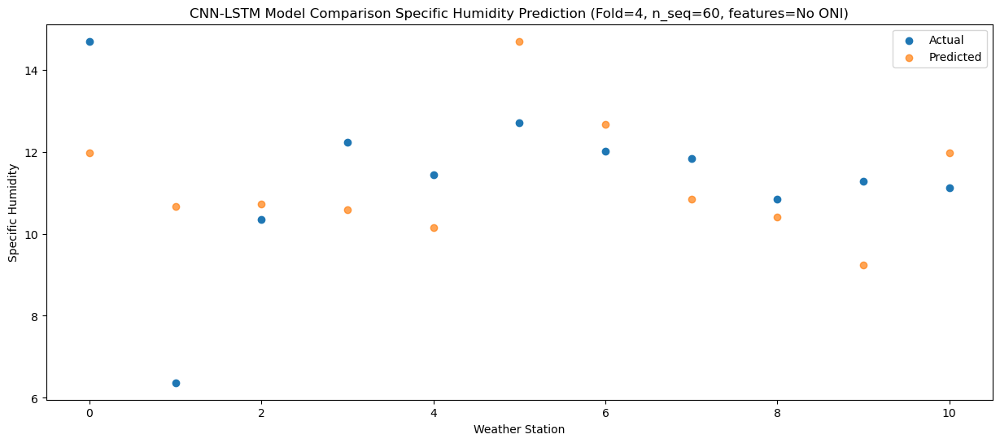

Predictions for (t+9):
    Weather_Station  Actual  Predicted
0                 0   12.26  10.794842
1                 1    6.61   9.494842
2                 2    8.84   9.554842
3                 3    9.65   9.414842
4                 4    8.78   8.974842
5                 5   11.39  13.514842
6                 6   12.22  11.494842
7                 7    9.19   9.654842
8                 8    9.17   9.224842
9                 9    9.09   8.064842
10               10    9.71  10.794842


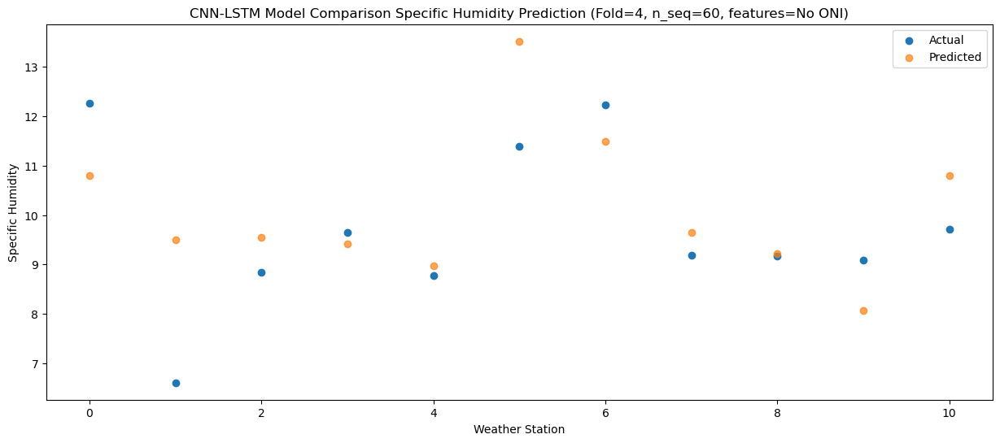

Predictions for (t+10):
    Weather_Station  Actual  Predicted
0                 0    9.37    8.25234
1                 1    6.03    6.95234
2                 2    6.79    7.01234
3                 3    8.44    6.87234
4                 4    7.89    6.43234
5                 5   11.20   10.97234
6                 6    8.38    8.95234
7                 7    7.59    7.11234
8                 8    6.25    6.68234
9                 9    6.31    5.52234
10               10    7.57    8.25234


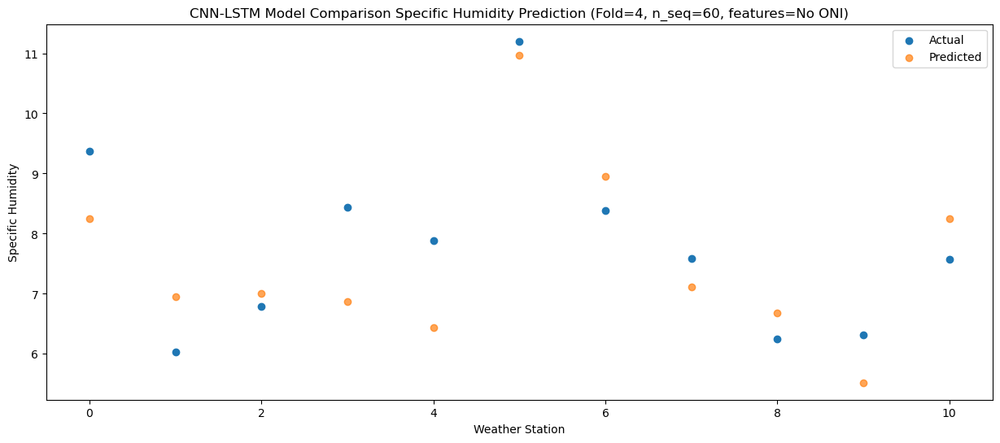

Predictions for (t+11):
    Weather_Station  Actual  Predicted
0                 0    4.78   4.969749
1                 1    3.99   3.669749
2                 2    3.44   3.729749
3                 3    3.87   3.589749
4                 4    3.12   3.149749
5                 5    7.55   7.689749
6                 6    5.73   5.669749
7                 7    3.04   3.829749
8                 8    2.87   3.399749
9                 9    2.15   2.239749
10               10    4.53   4.969749


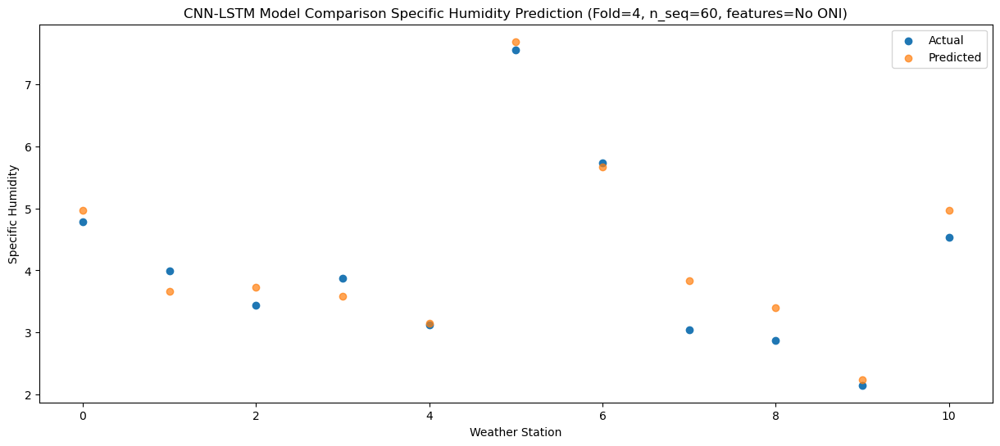

Predictions for (t+12):
    Weather_Station  Actual  Predicted
0                 0    4.06   3.337264
1                 1    0.93   2.037264
2                 2    0.77   2.097264
3                 3    2.23   1.957264
4                 4    1.76   1.517264
5                 5    7.09   6.057264
6                 6    2.90   4.037264
7                 7    1.37   2.197264
8                 8    1.19   1.767264
9                 9    1.06   0.607264
10               10    2.60   3.337264


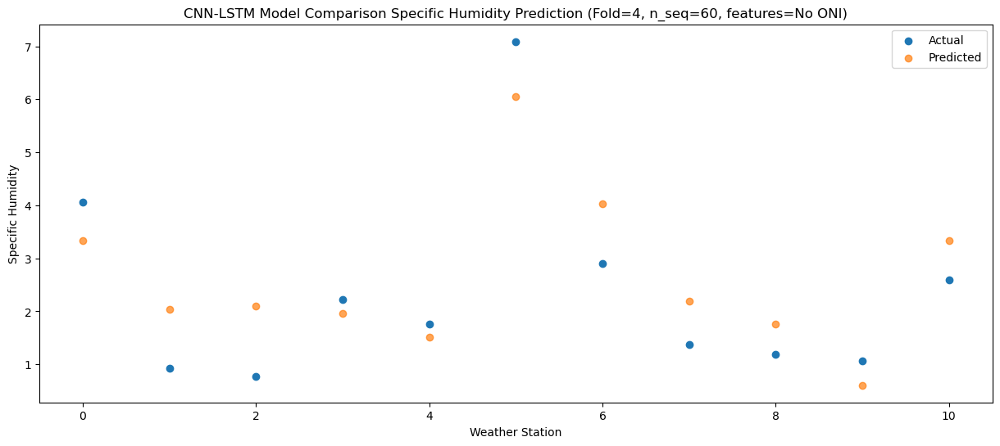

Predictions for (t+13):
    Weather_Station  Actual  Predicted
0                 0    1.83    1.60432
1                 1   -3.81    0.30432
2                 2   -1.61    0.36432
3                 3   -0.37    0.22432
4                 4   -0.81   -0.21568
5                 5    4.53    4.32432
6                 6   -0.44    2.30432
7                 7   -0.56    0.46432
8                 8   -0.41    0.03432
9                 9   -0.85   -1.12568
10               10    1.27    1.60432


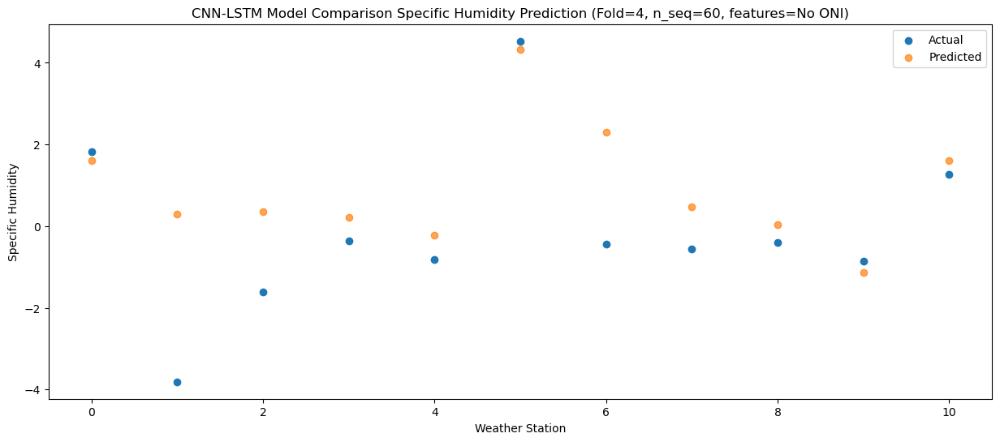

Predictions for (t+14):
    Weather_Station  Actual  Predicted
0                 0    1.95   1.305983
1                 1   -3.46   0.005983
2                 2   -1.72   0.065983
3                 3   -0.48  -0.074017
4                 4   -0.85  -0.514017
5                 5    5.23   4.025983
6                 6   -0.56   2.005983
7                 7   -0.71   0.165983
8                 8   -0.76  -0.264017
9                 9   -1.17  -1.424017
10               10    0.89   1.305983


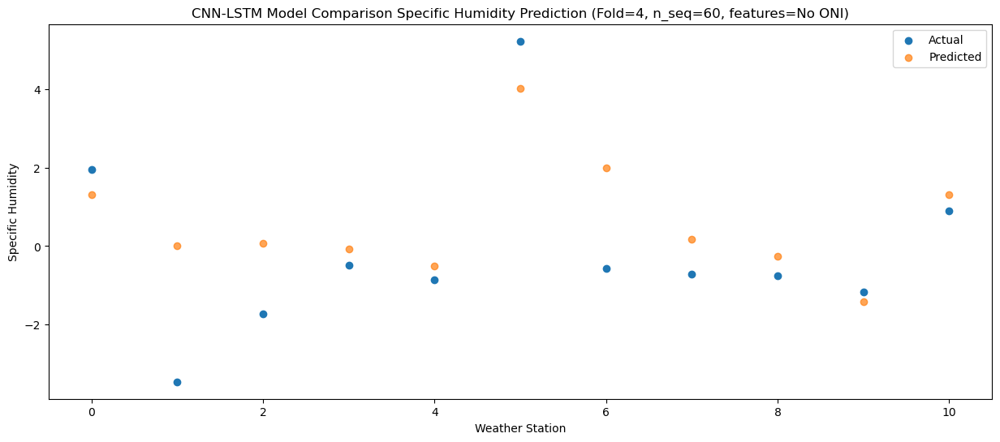

Predictions for (t+15):
    Weather_Station  Actual  Predicted
0                 0    0.86   0.920245
1                 1   -1.47  -0.379755
2                 2   -1.84  -0.319755
3                 3   -0.80  -0.459755
4                 4   -1.30  -0.899755
5                 5    4.59   3.640245
6                 6   -0.31   1.620245
7                 7   -1.34  -0.219755
8                 8   -1.33  -0.649755
9                 9   -1.81  -1.809755
10               10    0.32   0.920245


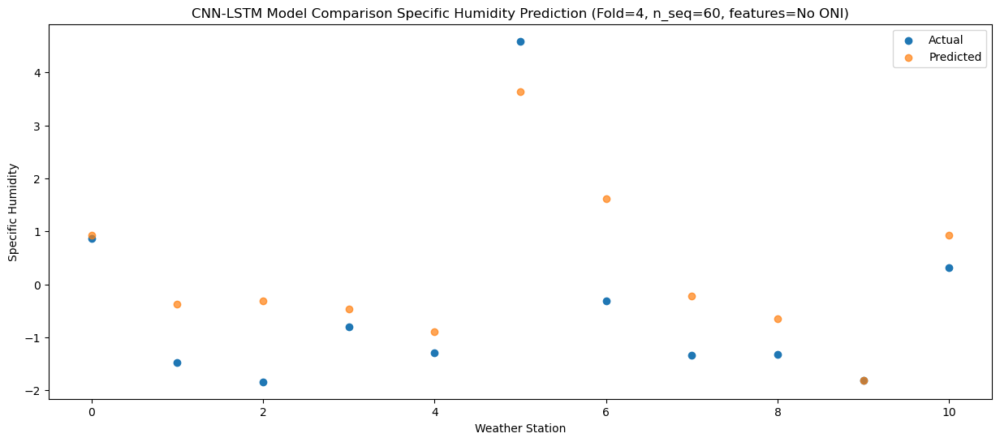

Predictions for (t+16):
    Weather_Station  Actual  Predicted
0                 0    3.62   2.577951
1                 1   -1.50   1.277951
2                 2    1.22   1.337951
3                 3    1.86   1.197951
4                 4    1.28   0.757951
5                 5    6.08   5.297951
6                 6    1.40   3.277951
7                 7    1.03   1.437951
8                 8    0.61   1.007951
9                 9    0.56  -0.152049
10               10    1.61   2.577951


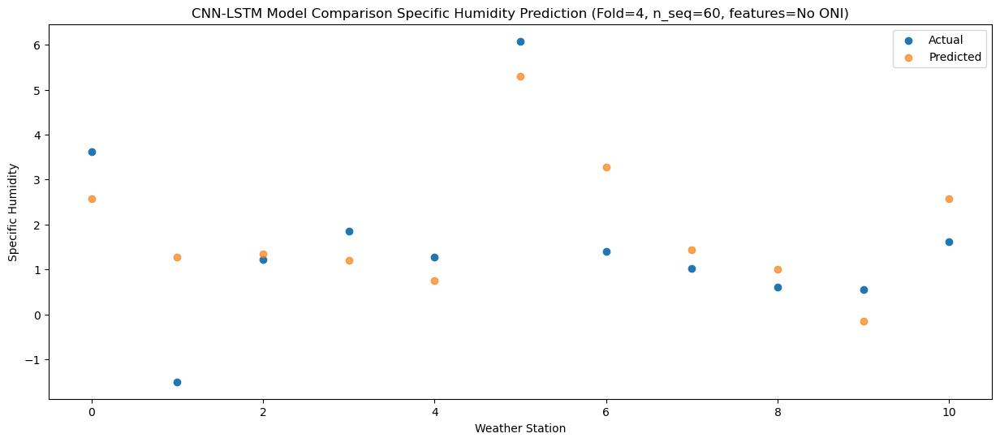

Predictions for (t+17):
    Weather_Station  Actual  Predicted
0                 0    4.83   3.709109
1                 1   -0.75   2.409109
2                 2    1.47   2.469109
3                 3    3.15   2.329109
4                 4    2.64   1.889109
5                 5    7.04   6.429109
6                 6    1.81   4.409109
7                 7    1.95   2.569109
8                 8    1.94   2.139109
9                 9    1.87   0.979109
10               10    3.28   3.709109


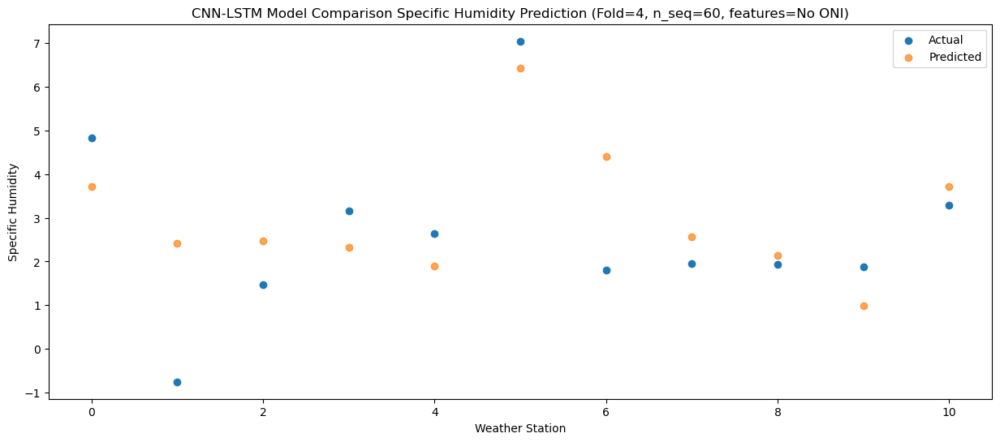

Predictions for (t+18):
    Weather_Station  Actual  Predicted
0                 0    8.39   5.811996
1                 1    0.58   4.511996
2                 2    4.91   4.571996
3                 3    7.15   4.431996
4                 4    6.93   3.991996
5                 5   11.59   8.531996
6                 6    4.79   6.511996
7                 7    5.11   4.671996
8                 8    4.23   4.241996
9                 9    4.49   3.081996
10               10    4.88   5.811996


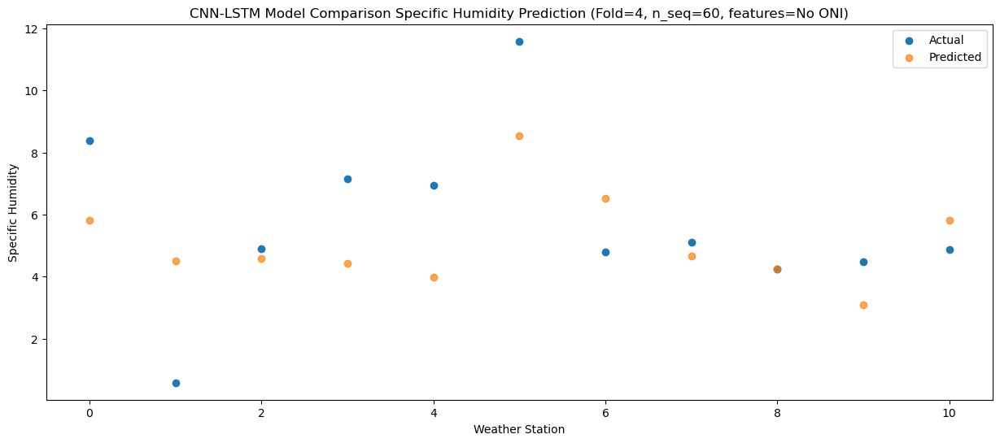

Predictions for (t+19):
    Weather_Station  Actual  Predicted
0                 0   12.98  10.176961
1                 1    4.87   8.876961
2                 2    9.15   8.936961
3                 3   10.84   8.796961
4                 4   10.81   8.356961
5                 5   13.89  12.896961
6                 6    9.48  10.876961
7                 7    9.71   9.036961
8                 8    9.29   8.606961
9                 9    9.24   7.446961
10               10    9.89  10.176961


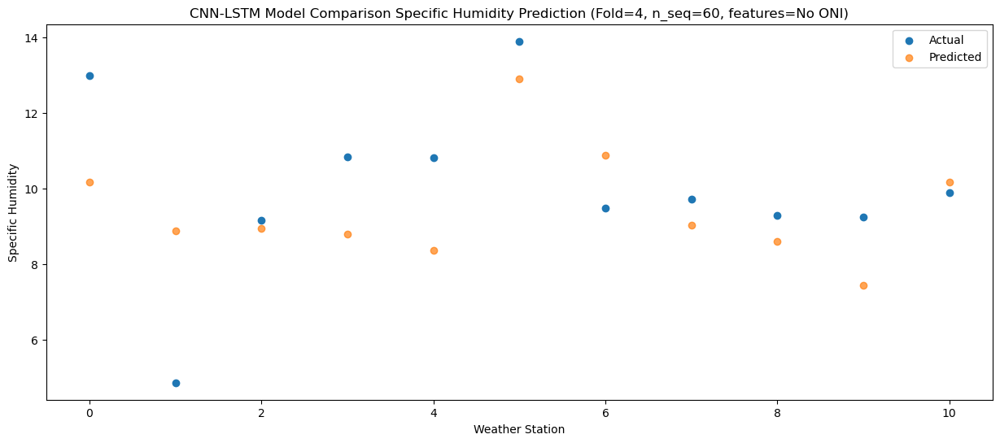

Predictions for (t+20):
    Weather_Station  Actual  Predicted
0                 0   14.37  11.301961
1                 1    6.08  10.001961
2                 2   10.80  10.061961
3                 3   11.41   9.921961
4                 4   11.19   9.481961
5                 5   14.92  14.021961
6                 6   11.08  12.001961
7                 7   10.66  10.161961
8                 8   10.55   9.731961
9                 9   10.64   8.571961
10               10   11.16  11.301961


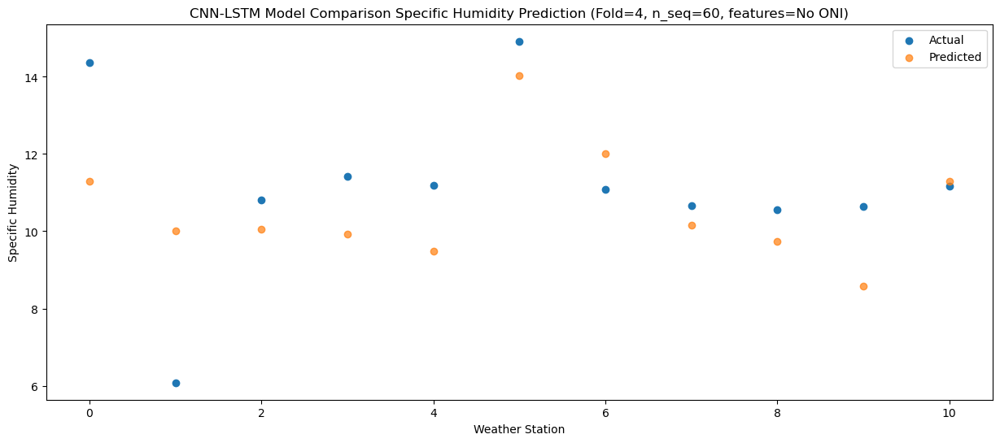

Predictions for (t+21):
    Weather_Station  Actual  Predicted
0                 0   14.19  11.803767
1                 1    6.47  10.503767
2                 2   10.81  10.563767
3                 3   11.80  10.423767
4                 4   11.30   9.983767
5                 5   14.64  14.523767
6                 6   11.46  12.503767
7                 7   10.40  10.663767
8                 8   10.69  10.233767
9                 9   10.89   9.073767
10               10   12.03  11.803767


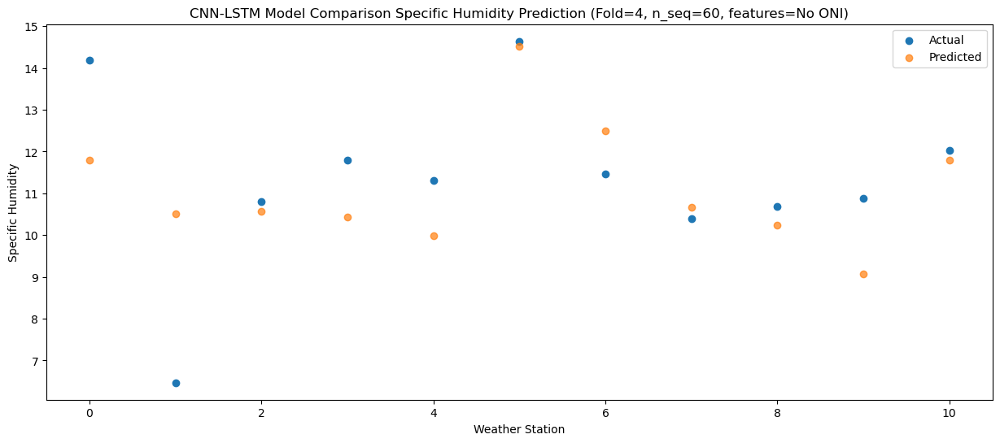

Predictions for (t+22):
    Weather_Station  Actual  Predicted
0                 0   10.61   8.553058
1                 1    5.67   7.253058
2                 2    7.87   7.313058
3                 3    7.79   7.173058
4                 4    7.40   6.733058
5                 5   11.39  11.273058
6                 6    7.88   9.253058
7                 7    7.14   7.413058
8                 8    7.21   6.983058
9                 9    6.86   5.823058
10               10    8.27   8.553058


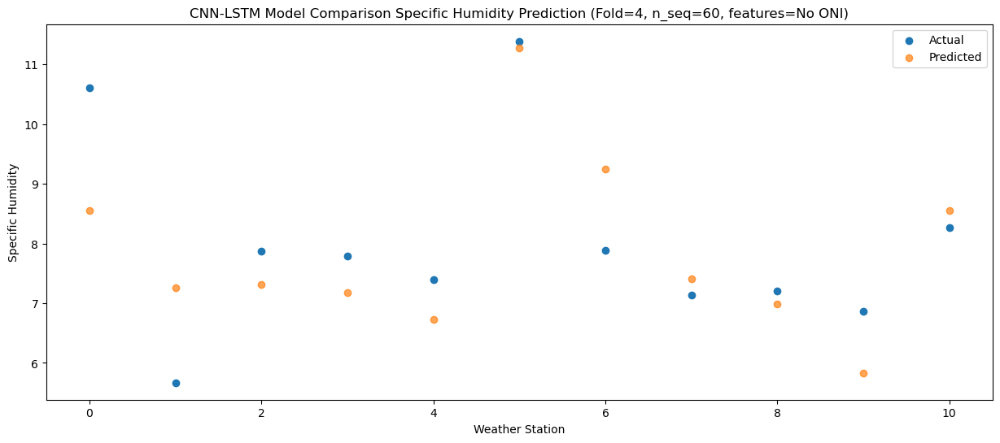

Predictions for (t+23):
    Weather_Station  Actual  Predicted
0                 0    7.24   6.784958
1                 1    2.75   5.484958
2                 2    5.09   5.544958
3                 3    4.94   5.404958
4                 4    4.67   4.964958
5                 5    8.34   9.504958
6                 6    5.67   7.484958
7                 7    5.05   5.644958
8                 8    6.06   5.214958
9                 9    4.99   4.054958
10               10    7.26   6.784958


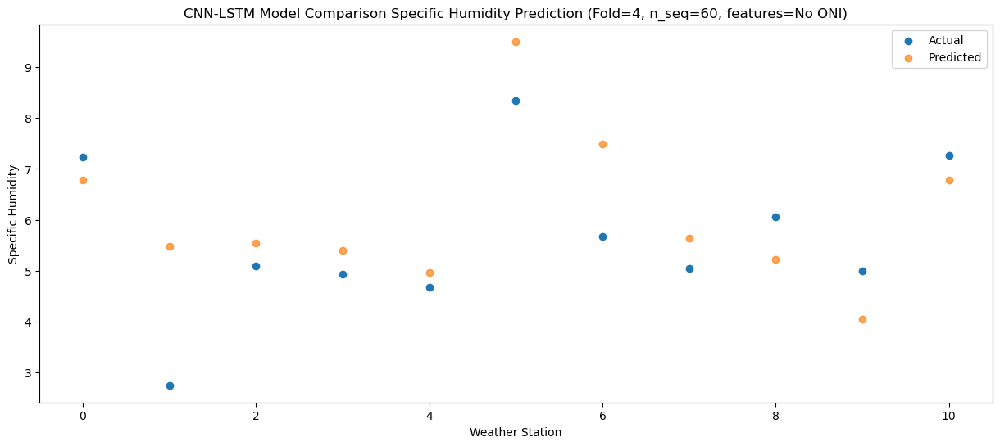

Predictions for (t+24):
    Weather_Station  Actual  Predicted
0                 0    3.15   2.507033
1                 1   -1.91   1.207033
2                 2   -0.35   1.267033
3                 3    1.32   1.127033
4                 4    1.06   0.687033
5                 5    6.62   5.227033
6                 6   -0.05   3.207033
7                 7    0.36   1.367033
8                 8    0.29   0.937033
9                 9   -0.30  -0.222967
10               10    2.02   2.507033


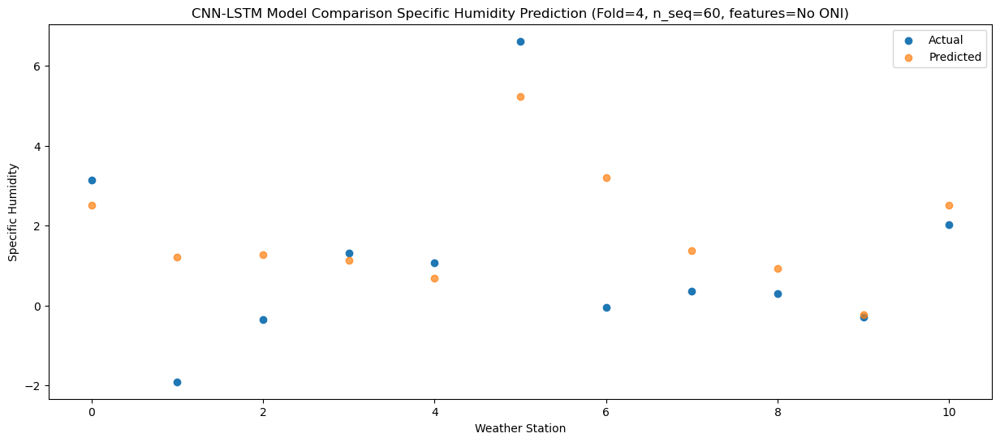

Predictions for (t+25):
    Weather_Station  Actual  Predicted
0                 0    2.94   2.832598
1                 1   -0.17   1.532598
2                 2    2.60   1.592598
3                 3    3.18   1.452598
4                 4    2.47   1.012598
5                 5    5.77   5.552598
6                 6    1.81   3.532598
7                 7    1.83   1.692598
8                 8    1.00   1.262598
9                 9    0.24   0.102598
10               10    1.98   2.832598


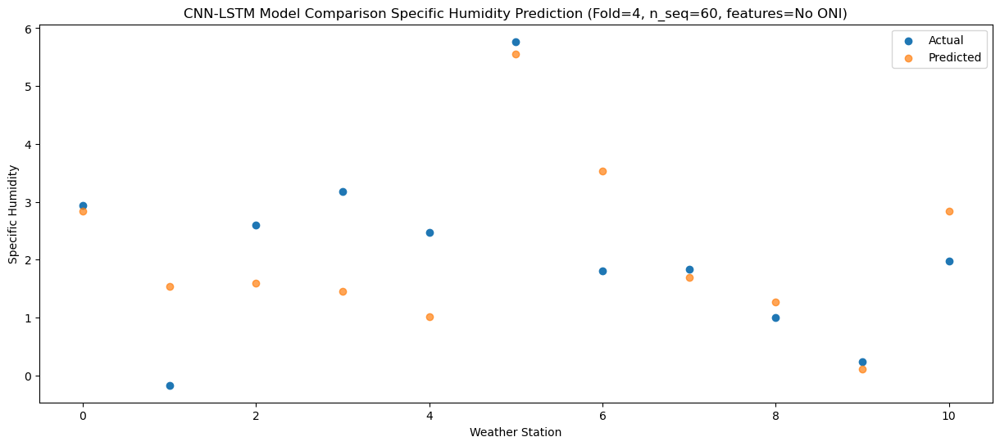

Predictions for (t+26):
    Weather_Station  Actual  Predicted
0                 0    0.93   0.746708
1                 1   -4.03  -0.553292
2                 2   -2.13  -0.493292
3                 3   -1.48  -0.633292
4                 4   -1.86  -1.073292
5                 5    4.31   3.466708
6                 6   -1.17   1.446708
7                 7   -1.37  -0.393292
8                 8   -1.38  -0.823292
9                 9   -2.00  -1.983292
10               10    0.24   0.746708


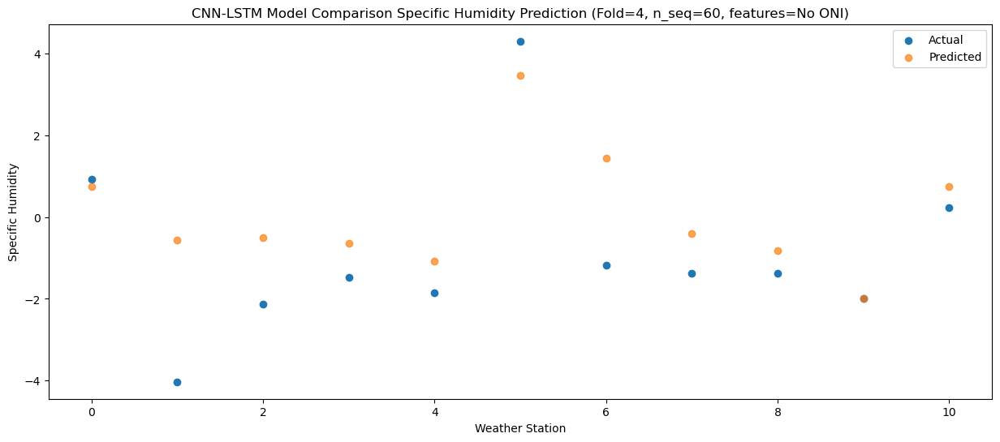

Predictions for (t+27):
    Weather_Station  Actual  Predicted
0                 0    1.15   1.293811
1                 1   -2.45  -0.006189
2                 2   -1.28   0.053811
3                 3   -0.95  -0.086189
4                 4   -1.42  -0.526189
5                 5    4.30   4.013811
6                 6    0.15   1.993811
7                 7   -0.86   0.153811
8                 8   -0.80  -0.276189
9                 9   -1.30  -1.436189
10               10    0.69   1.293811


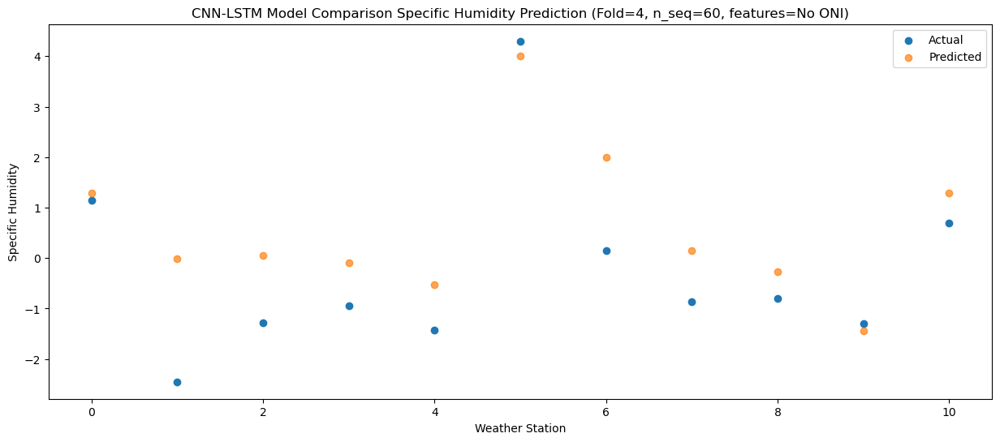

Predictions for (t+28):
    Weather_Station  Actual  Predicted
0                 0    2.71   2.372707
1                 1   -0.92   1.072707
2                 2   -0.23   1.132707
3                 3    0.64   0.992707
4                 4    0.10   0.552707
5                 5    4.89   5.092707
6                 6    0.99   3.072707
7                 7    0.65   1.232707
8                 8    0.51   0.802707
9                 9    0.22  -0.357293
10               10    1.84   2.372707


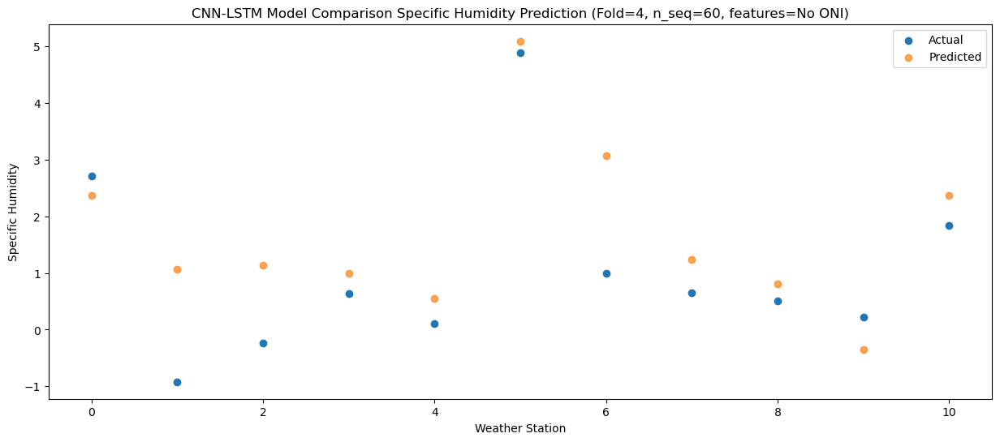

Predictions for (t+29):
    Weather_Station  Actual  Predicted
0                 0    4.20   3.484069
1                 1    0.37   2.184069
2                 2    2.22   2.244069
3                 3    4.15   2.104069
4                 4    3.78   1.664069
5                 5    6.92   6.204069
6                 6    2.05   4.184069
7                 7    2.44   2.344069
8                 8    2.00   1.914069
9                 9    1.52   0.754069
10               10    2.83   3.484069


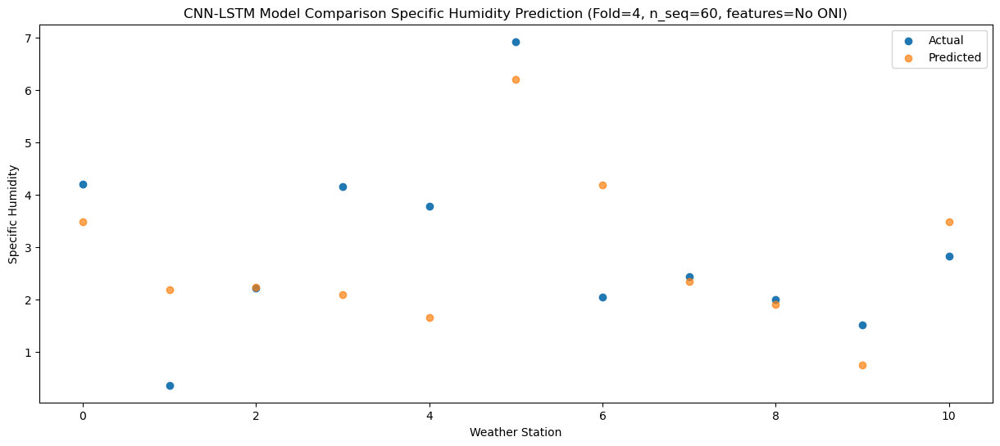

Predictions for (t+30):
    Weather_Station  Actual  Predicted
0                 0    9.08    6.96128
1                 1    2.76    5.66128
2                 2    6.82    5.72128
3                 3    8.14    5.58128
4                 4    7.66    5.14128
5                 5    9.18    9.68128
6                 6    6.06    7.66128
7                 7    7.15    5.82128
8                 8    6.02    5.39128
9                 9    5.59    4.23128
10               10    6.29    6.96128


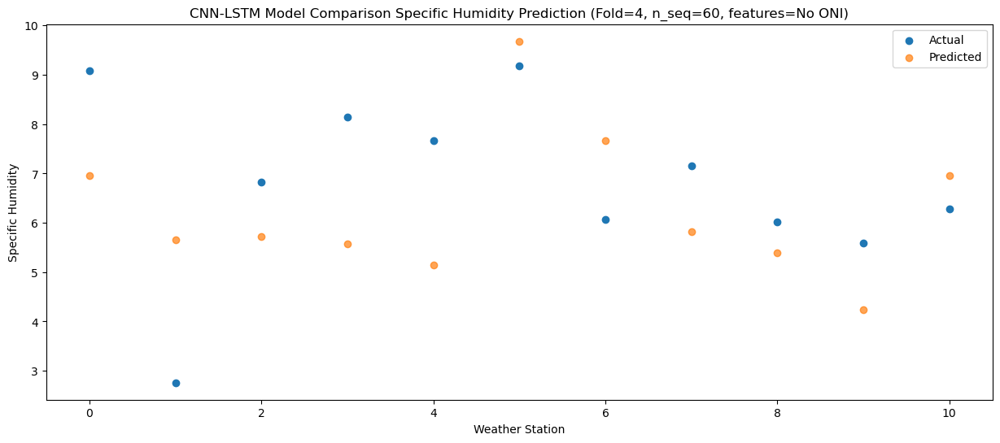

Predictions for (t+31):
    Weather_Station  Actual  Predicted
0                 0   12.31   8.739582
1                 1    5.66   7.439582
2                 2    9.20   7.499582
3                 3    9.91   7.359582
4                 4    9.34   6.919582
5                 5   12.03  11.459582
6                 6    8.34   9.439582
7                 7    9.51   7.599582
8                 8    7.46   7.169582
9                 9    7.83   6.009582
10               10    8.20   8.739582


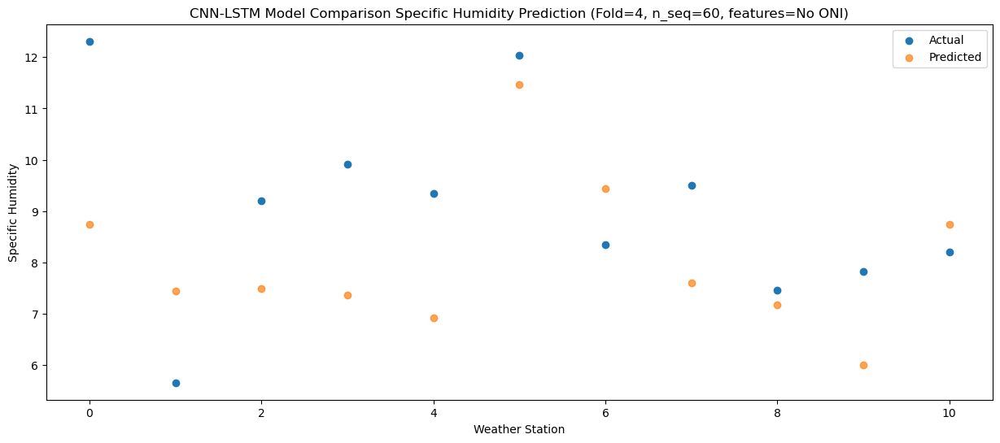

Predictions for (t+32):
    Weather_Station  Actual  Predicted
0                 0   13.94  11.079421
1                 1    6.69   9.779421
2                 2   11.04   9.839421
3                 3    9.33   9.699421
4                 4    8.84   9.259421
5                 5   12.72  13.799421
6                 6   11.50  11.779421
7                 7   10.31   9.939421
8                 8   10.20   9.509421
9                 9   10.47   8.349421
10               10    9.93  11.079421


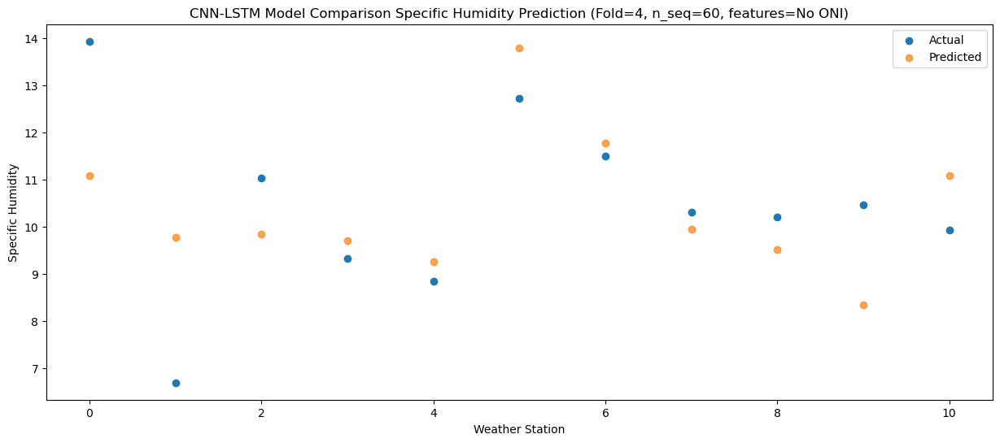

Predictions for (t+33):
    Weather_Station  Actual  Predicted
0                 0   13.73  11.093036
1                 1    6.77   9.793036
2                 2   10.86   9.853036
3                 3   10.34   9.713036
4                 4   10.01   9.273036
5                 5   14.71  13.813036
6                 6   10.31  11.793036
7                 7   10.78   9.953036
8                 8    9.84   9.523036
9                 9    9.70   8.363036
10               10   10.39  11.093036


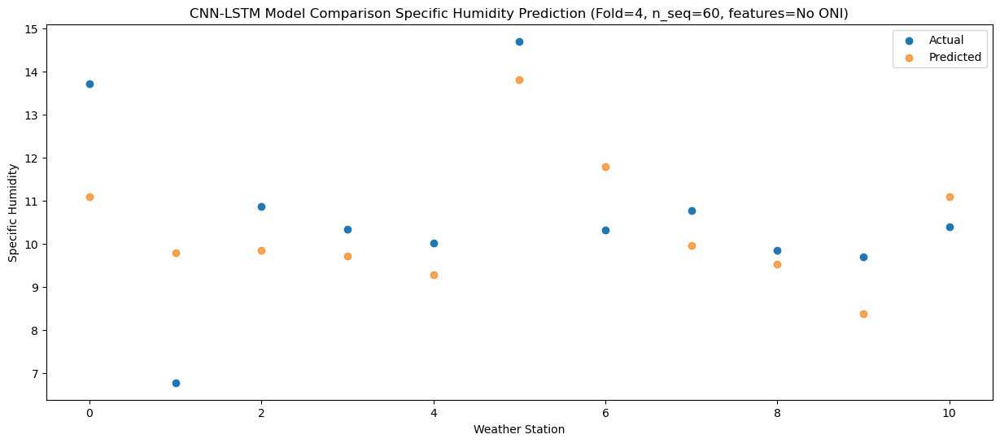

Predictions for (t+34):
    Weather_Station  Actual  Predicted
0                 0    9.03   8.276663
1                 1    5.90   6.976663
2                 2    6.62   7.036663
3                 3    7.06   6.896663
4                 4    6.86   6.456663
5                 5   13.46  10.996663
6                 6    6.76   8.976663
7                 7    6.97   7.136663
8                 8    7.18   6.706663
9                 9    6.33   5.546663
10               10    8.40   8.276663


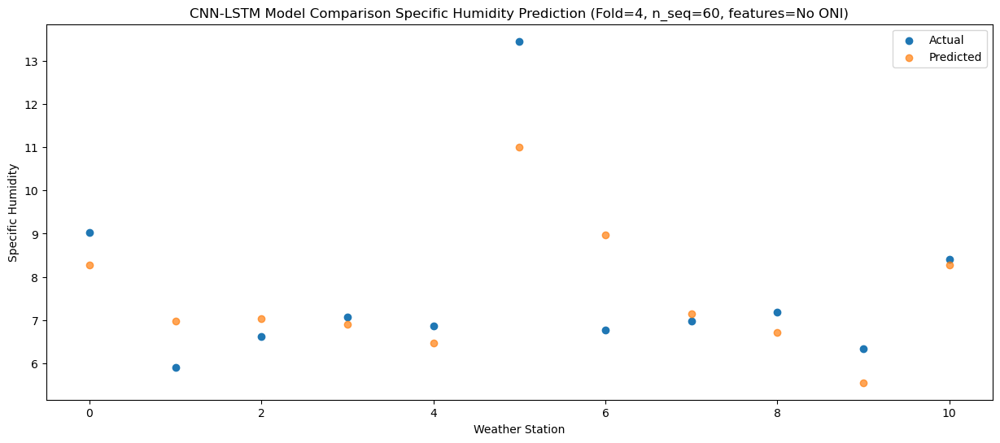

Predictions for (t+35):
    Weather_Station  Actual  Predicted
0                 0    4.44   4.361728
1                 1    1.12   3.061728
2                 2    1.66   3.121728
3                 3    2.60   2.981728
4                 4    2.40   2.541728
5                 5    9.95   7.081728
6                 6    2.08   5.061728
7                 7    2.31   3.221728
8                 8    1.85   2.791728
9                 9    1.57   1.631728
10               10    3.58   4.361728


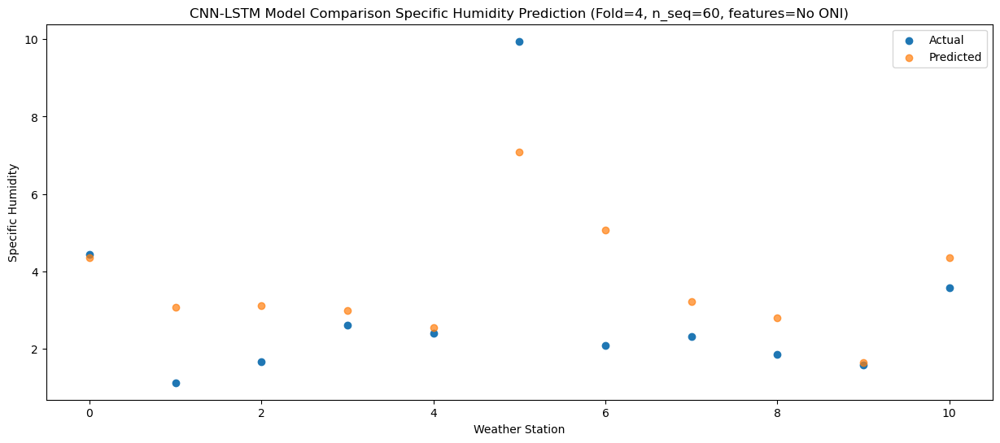

Predictions for (t+36):
    Weather_Station  Actual  Predicted
0                 0    3.27   3.044049
1                 1    1.29   1.744049
2                 2    0.91   1.804049
3                 3    2.42   1.664049
4                 4    1.98   1.224049
5                 5    7.25   5.764049
6                 6    1.90   3.744049
7                 7    0.95   1.904049
8                 8    0.81   1.474049
9                 9    0.20   0.314049
10               10    2.86   3.044049


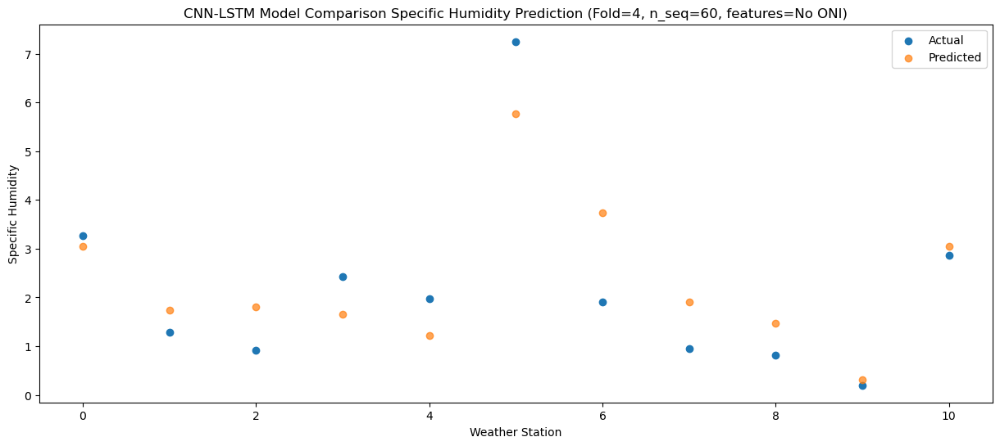

Predictions for (t+37):
    Weather_Station  Actual  Predicted
0                 0    1.93   1.781607
1                 1   -2.23   0.481607
2                 2    0.37   0.541607
3                 3    0.84   0.401607
4                 4    0.39  -0.038393
5                 5    6.61   4.501607
6                 6   -0.09   2.481607
7                 7    0.08   0.641607
8                 8   -0.15   0.211607
9                 9   -0.91  -0.948393
10               10    1.41   1.781607


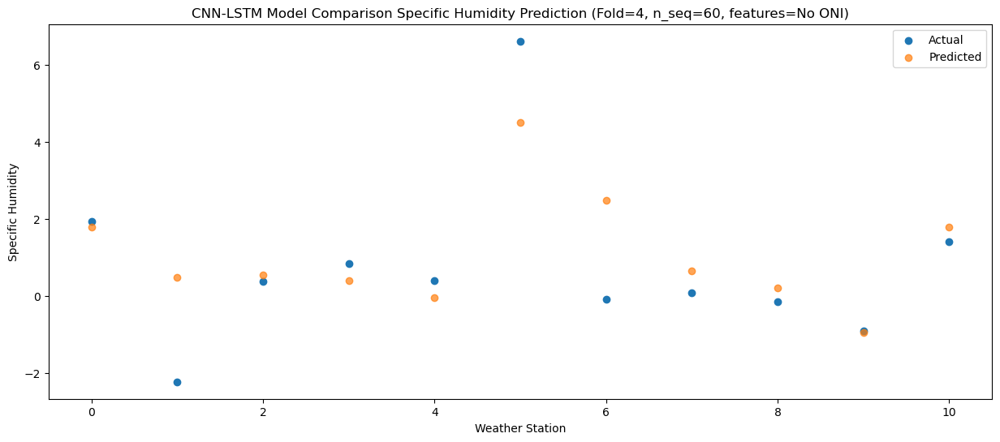

Predictions for (t+38):
    Weather_Station  Actual  Predicted
0                 0    2.28   2.239071
1                 1   -2.74   0.939071
2                 2    0.27   0.999071
3                 3    0.15   0.859071
4                 4   -0.36   0.419071
5                 5    5.06   4.959071
6                 6    0.54   2.939071
7                 7    0.36   1.099071
8                 8    0.47   0.669071
9                 9   -0.39  -0.490929
10               10    2.03   2.239071


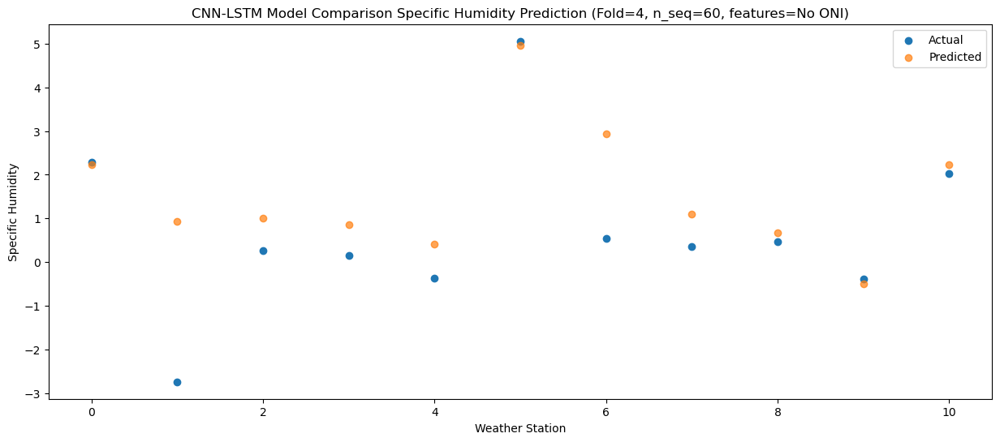

Predictions for (t+39):
    Weather_Station  Actual  Predicted
0                 0    2.23   1.960864
1                 1   -0.80   0.660864
2                 2    0.94   0.720864
3                 3    0.51   0.580864
4                 4    0.04   0.140864
5                 5    5.18   4.680864
6                 6    1.58   2.660864
7                 7    0.17   0.820864
8                 8    0.07   0.390864
9                 9   -0.62  -0.769136
10               10    1.28   1.960864


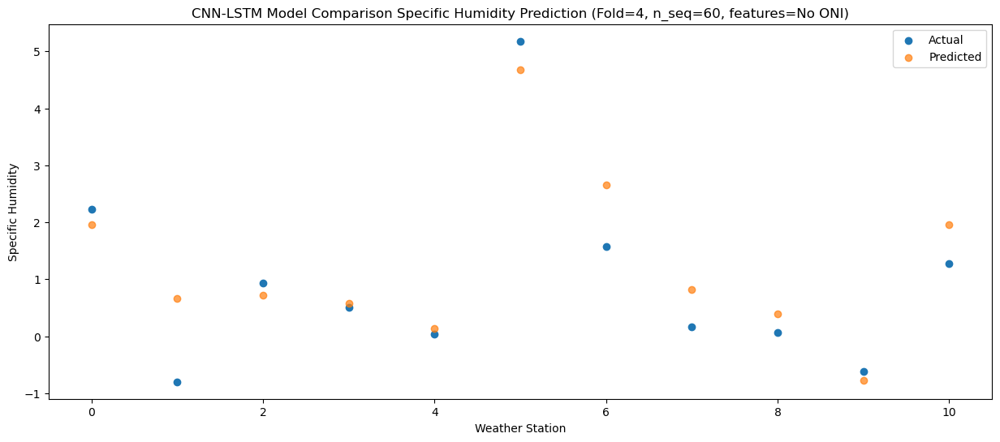

Predictions for (t+40):
    Weather_Station  Actual  Predicted
0                 0    3.07   2.479763
1                 1   -0.42   1.179763
2                 2    1.27   1.239763
3                 3    2.57   1.099763
4                 4    2.01   0.659763
5                 5    6.47   5.199763
6                 6    1.07   3.179763
7                 7    0.93   1.339763
8                 8    0.42   0.909763
9                 9   -0.01  -0.250237
10               10    1.49   2.479763


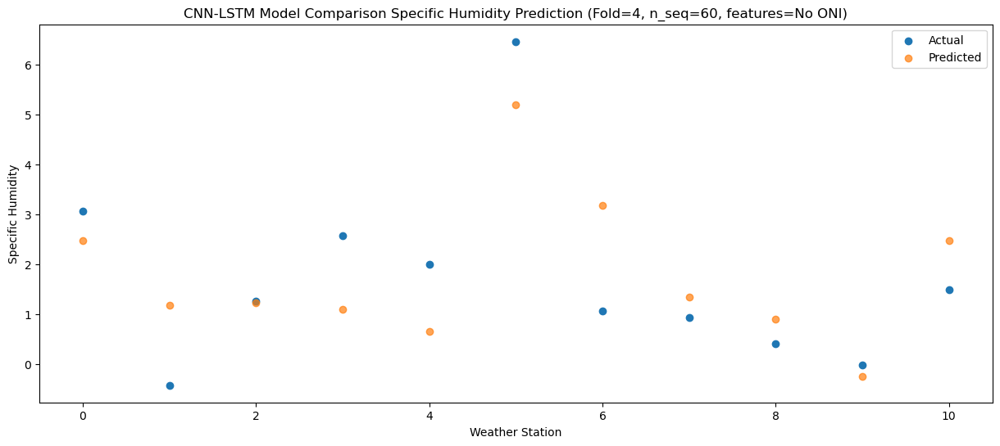

Predictions for (t+41):
    Weather_Station  Actual  Predicted
0                 0    4.25   3.995743
1                 1    1.07   2.695743
2                 2    2.11   2.755743
3                 3    3.25   2.615743
4                 4    2.86   2.175743
5                 5    6.44   6.715743
6                 6    2.67   4.695743
7                 7    1.83   2.855743
8                 8    1.87   2.425743
9                 9    1.50   1.265743
10               10    3.19   3.995743


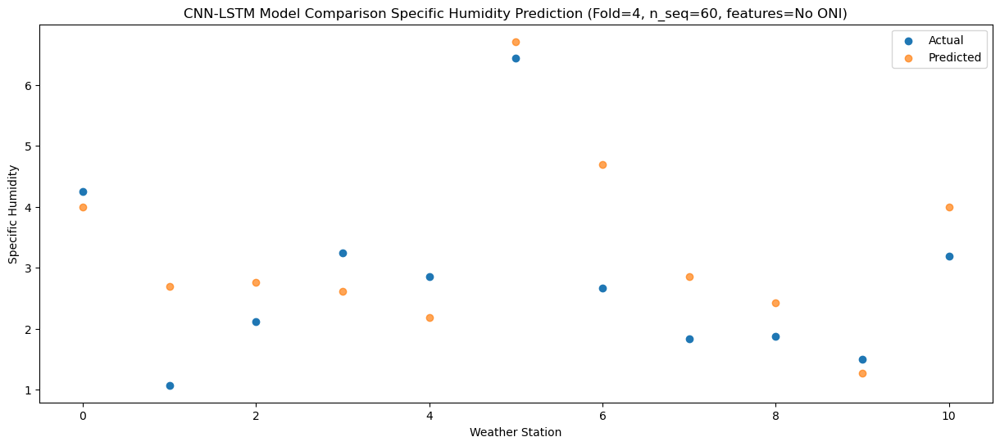

Predictions for (t+42):
    Weather_Station  Actual  Predicted
0                 0    8.27   5.958896
1                 1    1.87   4.658896
2                 2    5.49   4.718896
3                 3    7.51   4.578896
4                 4    7.13   4.138896
5                 5   11.28   8.678896
6                 6    4.89   6.658896
7                 7    6.22   4.818896
8                 8    4.12   4.388896
9                 9    4.28   3.228896
10               10    4.09   5.958896


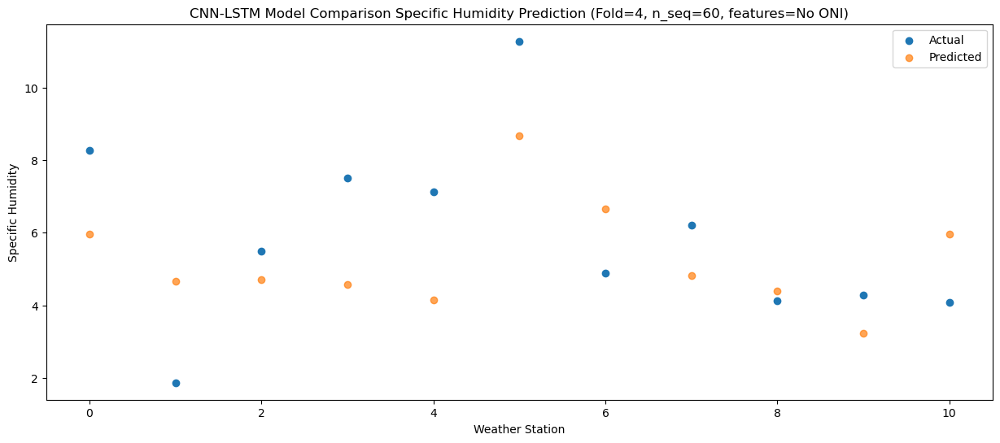

Predictions for (t+43):
    Weather_Station  Actual  Predicted
0                 0   10.81   8.917928
1                 1    5.38   7.617928
2                 2    9.06   7.677928
3                 3   11.45   7.537928
4                 4   10.61   7.097928
5                 5   15.14  11.637928
6                 6    7.94   9.617928
7                 7    8.78   7.777928
8                 8    6.08   7.347928
9                 9    5.92   6.187928
10               10    7.33   8.917928


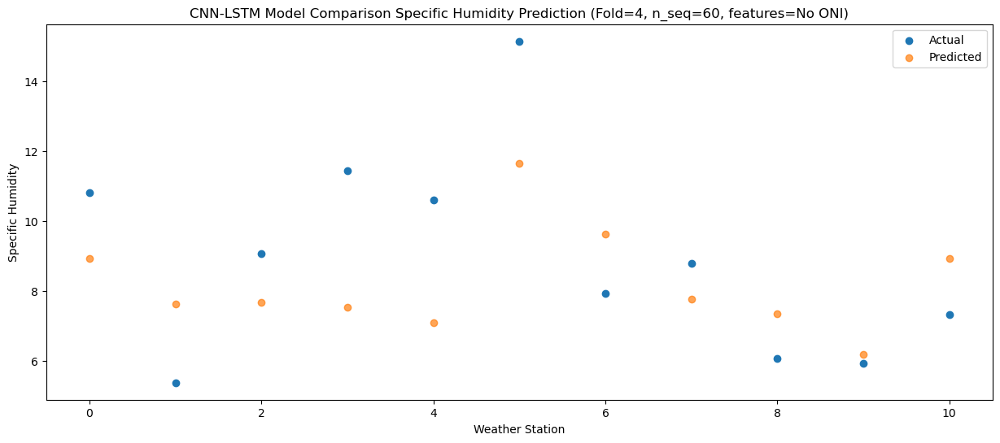

Predictions for (t+44):
    Weather_Station  Actual  Predicted
0                 0   13.50  11.758416
1                 1    7.29  10.458416
2                 2   10.65  10.518416
3                 3   11.30  10.378416
4                 4    9.71   9.938416
5                 5   12.81  14.478416
6                 6   11.33  12.458416
7                 7   11.57  10.618416
8                 8   10.38  10.188416
9                 9   10.62   9.028416
10               10   10.95  11.758416


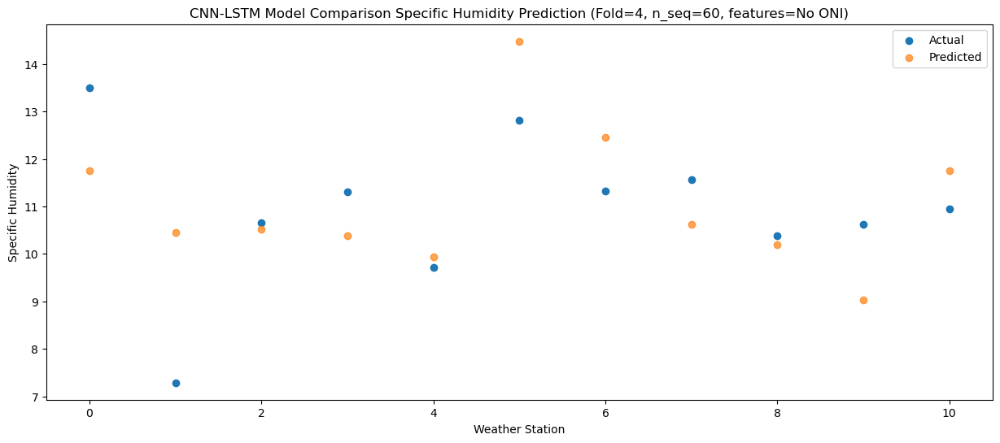

Predictions for (t+45):
    Weather_Station  Actual  Predicted
0                 0   14.43  11.071489
1                 1    7.59   9.771489
2                 2    9.07   9.831489
3                 3    9.20   9.691489
4                 4    8.33   9.251489
5                 5   11.95  13.791489
6                 6   10.87  11.771489
7                 7   11.85   9.931489
8                 8    9.84   9.501489
9                 9   10.49   8.341489
10               10   10.15  11.071489


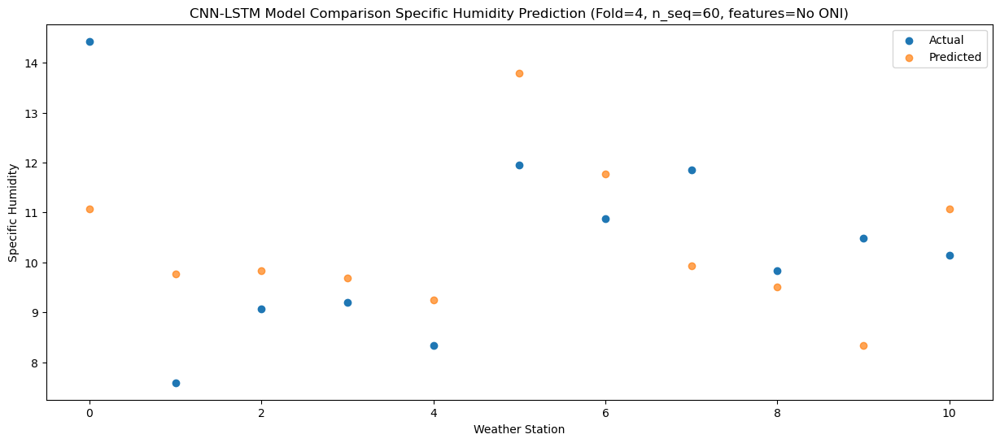

Predictions for (t+46):
    Weather_Station  Actual  Predicted
0                 0    9.51   9.114185
1                 1    5.14   7.814185
2                 2    6.05   7.874185
3                 3    8.30   7.734185
4                 4    8.00   7.294185
5                 5   12.46  11.834185
6                 6    7.42   9.814185
7                 7    7.65   7.974185
8                 8    7.04   7.544185
9                 9    6.71   6.384185
10               10    8.44   9.114185


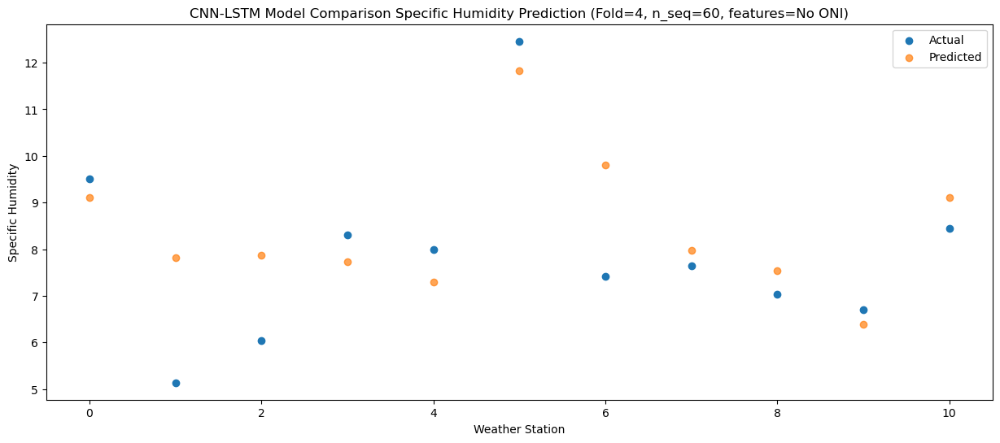

Predictions for (t+47):
    Weather_Station  Actual  Predicted
0                 0    6.32   5.865246
1                 1    1.52   4.565246
2                 2    2.12   4.625246
3                 3    4.58   4.485246
4                 4    4.34   4.045246
5                 5   10.33   8.585246
6                 6    3.51   6.565246
7                 7    4.04   4.725246
8                 8    3.71   4.295246
9                 9    3.27   3.135246
10               10    5.38   5.865246


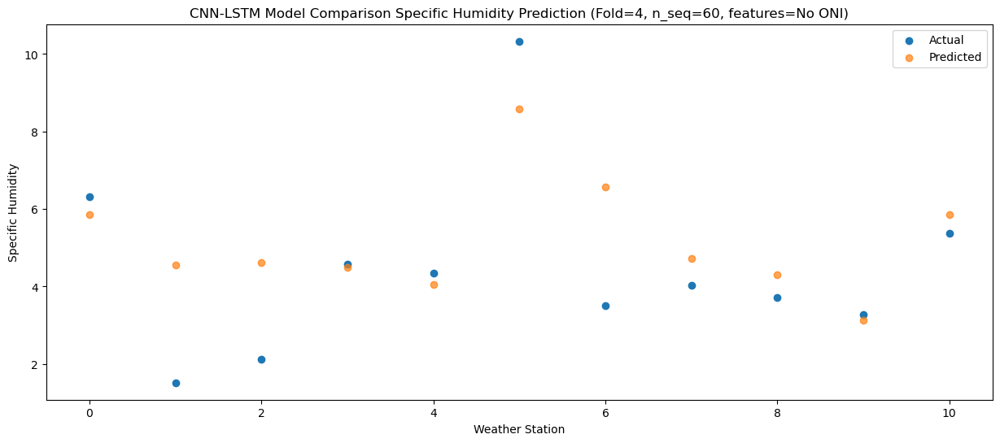

Predictions for (t+48):
    Weather_Station  Actual  Predicted
0                 0    3.42   2.757704
1                 1   -0.78   1.457704
2                 2    0.14   1.517704
3                 3    2.05   1.377704
4                 4    1.92   0.937704
5                 5    8.03   5.477704
6                 6    0.56   3.457704
7                 7    1.01   1.617704
8                 8    0.64   1.187704
9                 9   -0.12   0.027704
10               10    1.94   2.757704


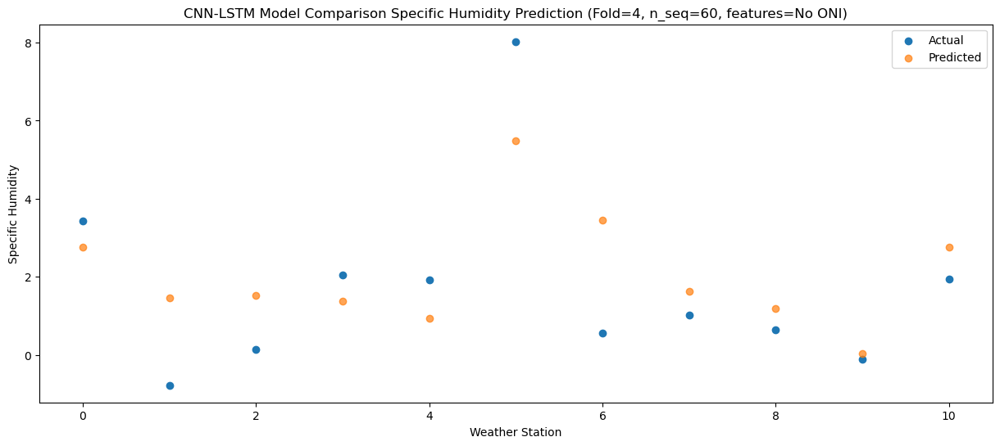

Predictions for (t+49):
    Weather_Station  Actual  Predicted
0                 0    3.24    2.74742
1                 1   -1.87    1.44742
2                 2   -1.17    1.50742
3                 3    0.30    1.36742
4                 4    0.16    0.92742
5                 5    6.45    5.46742
6                 6    0.28    3.44742
7                 7    0.20    1.60742
8                 8    0.61    1.17742
9                 9    0.37    0.01742
10               10    2.46    2.74742


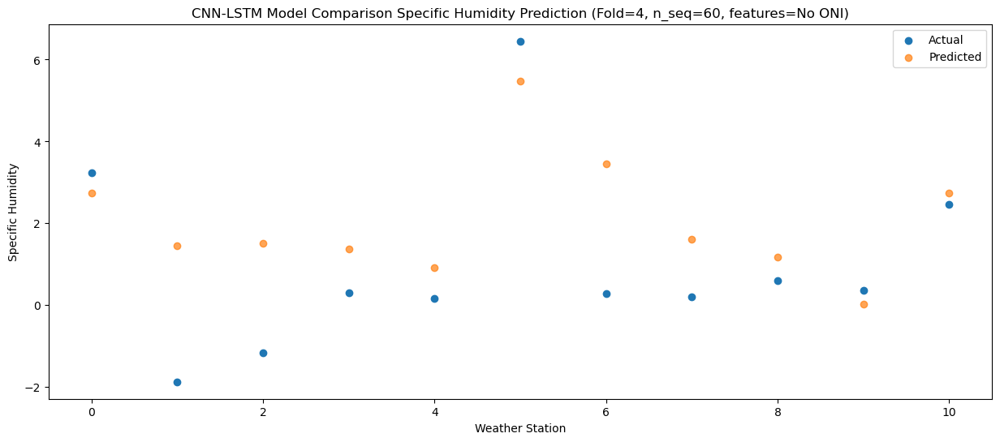

Predictions for (t+50):
    Weather_Station  Actual  Predicted
0                 0    1.54   1.659916
1                 1   -2.91   0.359916
2                 2   -1.89   0.419916
3                 3   -0.98   0.279916
4                 4   -1.26  -0.160084
5                 5    5.18   4.379916
6                 6   -0.50   2.359916
7                 7   -0.95   0.519916
8                 8   -0.47   0.089916
9                 9   -1.09  -1.070084
10               10    1.39   1.659916


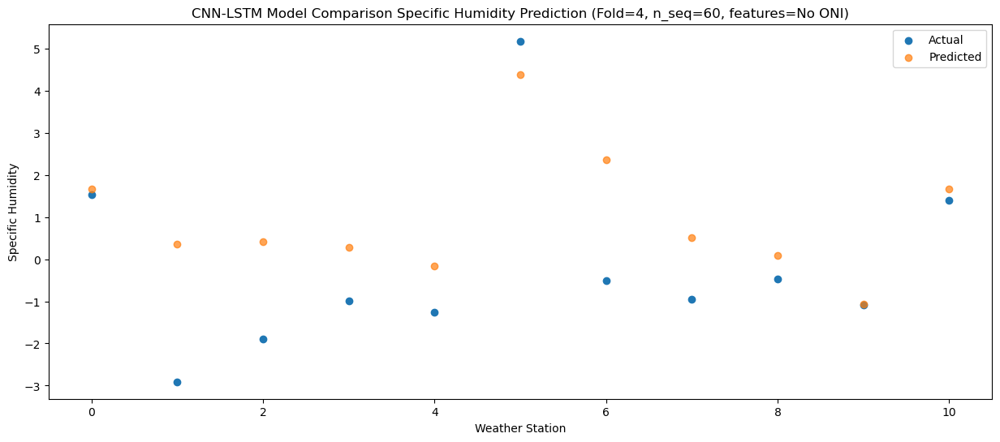

Predictions for (t+51):
    Weather_Station  Actual  Predicted
0                 0    2.55   2.253629
1                 1   -3.60   0.953629
2                 2   -0.46   1.013629
3                 3    1.36   0.873629
4                 4    1.09   0.433629
5                 5    5.53   4.973629
6                 6   -0.32   2.953629
7                 7    0.41   1.113629
8                 8    0.11   0.683629
9                 9   -0.17  -0.476371
10               10    1.41   2.253629


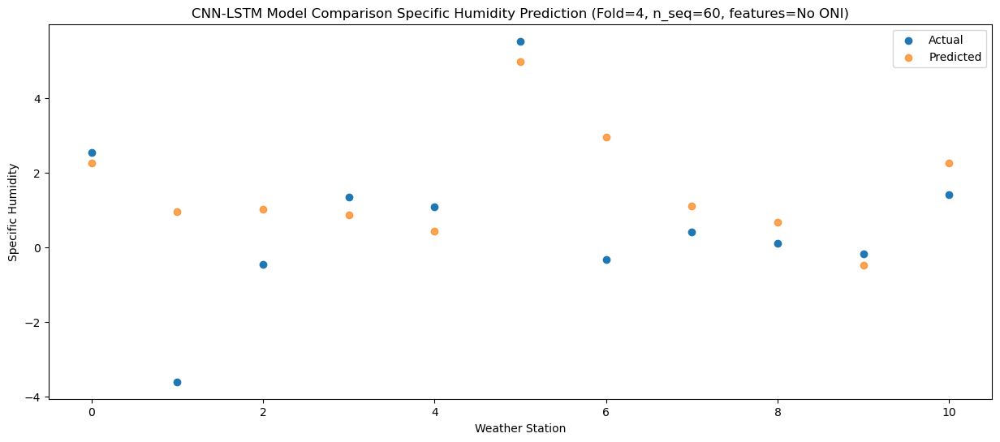

Predictions for (t+52):
    Weather_Station  Actual  Predicted
0                 0    3.61   3.072608
1                 1   -0.31   1.772608
2                 2    1.17   1.832608
3                 3    3.15   1.692608
4                 4    3.04   1.252608
5                 5    6.67   5.792608
6                 6    1.25   3.772608
7                 7    1.62   1.932608
8                 8    1.18   1.502608
9                 9    0.80   0.342608
10               10    2.48   3.072608


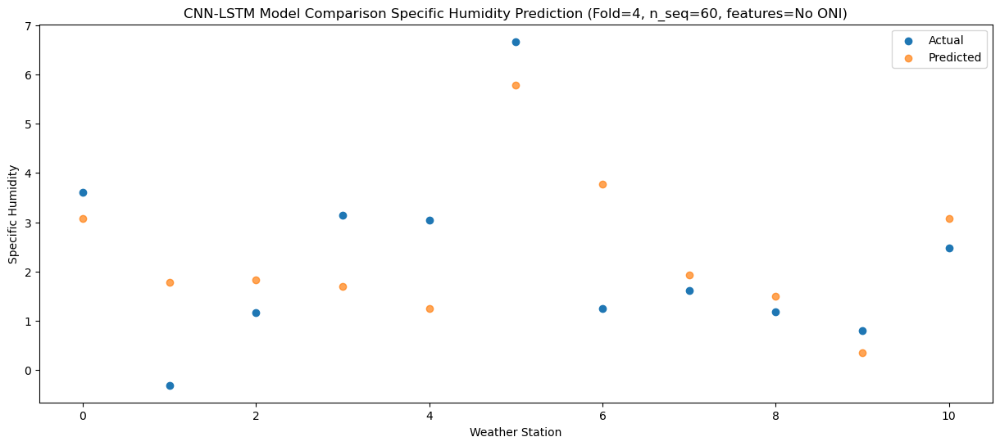

Predictions for (t+53):
    Weather_Station  Actual  Predicted
0                 0    5.29   4.542583
1                 1   -0.91   3.242583
2                 2    3.35   3.302583
3                 3    5.52   3.162583
4                 4    5.54   2.722583
5                 5    7.27   7.262583
6                 6    3.17   5.242583
7                 7    3.35   3.402583
8                 8    3.21   2.972583
9                 9    2.52   1.812583
10               10    4.26   4.542583


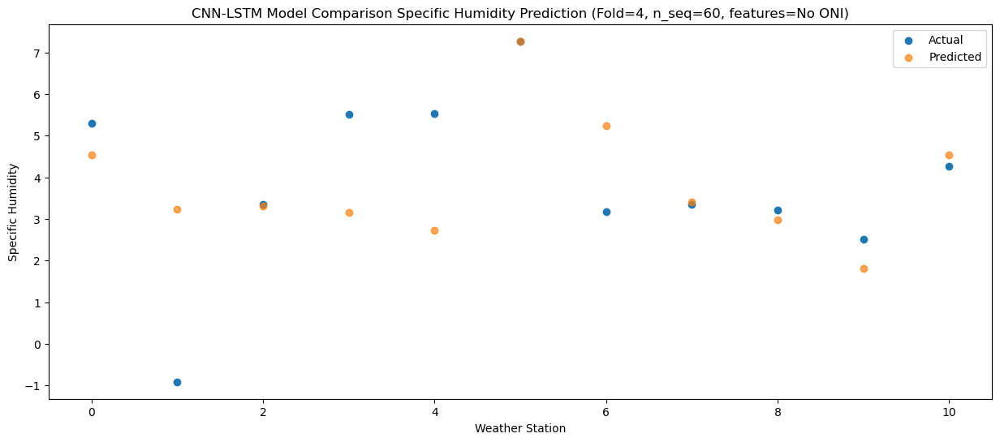

Predictions for (t+54):
    Weather_Station  Actual  Predicted
0                 0    9.36   7.678233
1                 1    1.68   6.378233
2                 2    7.67   6.438233
3                 3    9.09   6.298233
4                 4    8.97   5.858233
5                 5   10.03  10.398233
6                 6    7.17   8.378233
7                 7    7.77   6.538233
8                 8    6.70   6.108233
9                 9    6.06   4.948233
10               10    7.18   7.678233


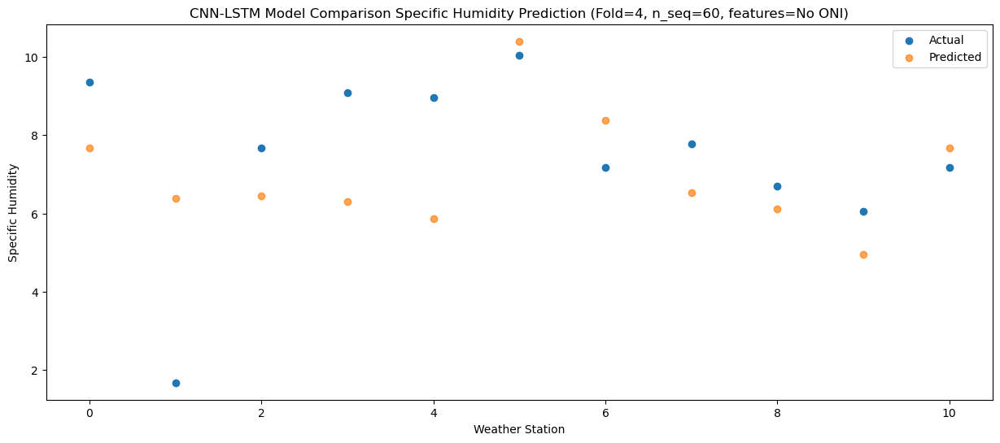

Predictions for (t+55):
    Weather_Station  Actual  Predicted
0                 0   12.62  10.006275
1                 1    3.14   8.706275
2                 2    9.01   8.766275
3                 3   11.03   8.626275
4                 4   11.08   8.186275
5                 5   14.56  12.726275
6                 6    8.93  10.706275
7                 7    9.75   8.866275
8                 8    8.39   8.436275
9                 9    8.82   7.276275
10               10    9.73  10.006275


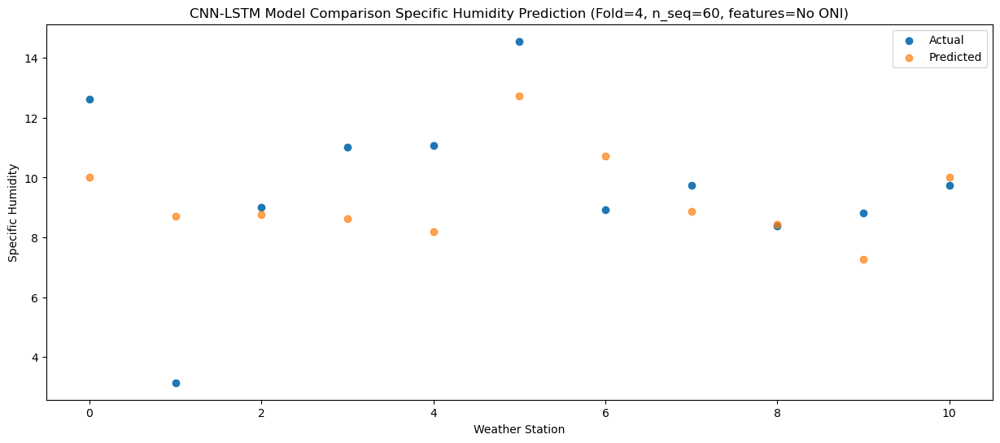

Predictions for (t+56):
    Weather_Station  Actual  Predicted
0                 0   13.81  11.653895
1                 1    4.60  10.353895
2                 2   11.04  10.413895
3                 3   10.99  10.273895
4                 4   10.61   9.833895
5                 5   14.44  14.373895
6                 6   11.32  12.353895
7                 7   10.73  10.513895
8                 8    9.69  10.083895
9                 9   10.43   8.923895
10               10   10.85  11.653895


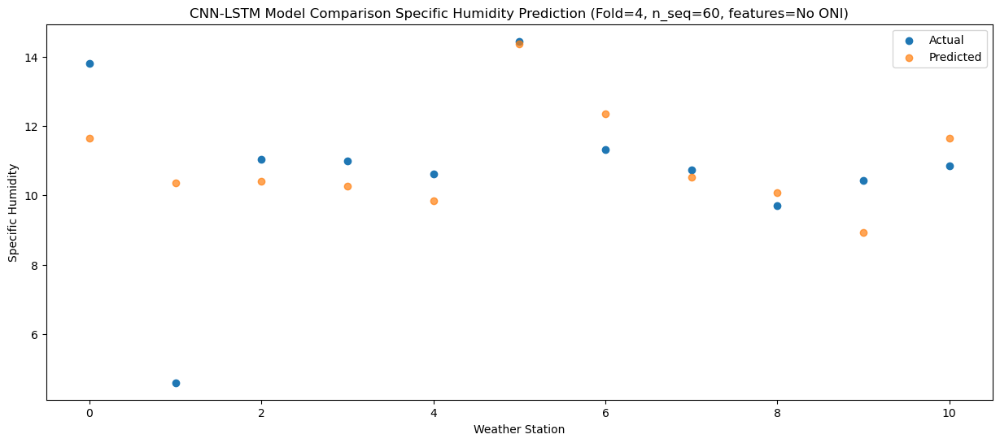

Predictions for (t+57):
    Weather_Station  Actual  Predicted
0                 0   12.65  10.806676
1                 1    7.21   9.506676
2                 2    8.73   9.566676
3                 3   10.28   9.426676
4                 4    9.84   8.986676
5                 5   13.24  13.526676
6                 6   10.58  11.506676
7                 7    9.44   9.666676
8                 8    9.33   9.236676
9                 9   10.07   8.076676
10               10   10.83  10.806676


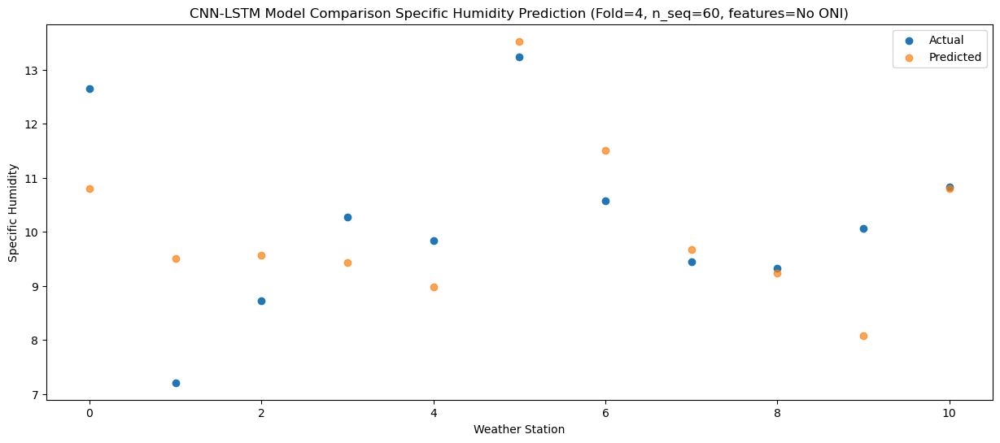

Predictions for (t+58):
    Weather_Station  Actual  Predicted
0                 0    9.35    8.88665
1                 1    7.02    7.58665
2                 2    7.63    7.64665
3                 3    7.75    7.50665
4                 4    7.68    7.06665
5                 5   12.36   11.60665
6                 6    8.26    9.58665
7                 7    7.40    7.74665
8                 8    6.65    7.31665
9                 9    6.57    6.15665
10               10    8.76    8.88665


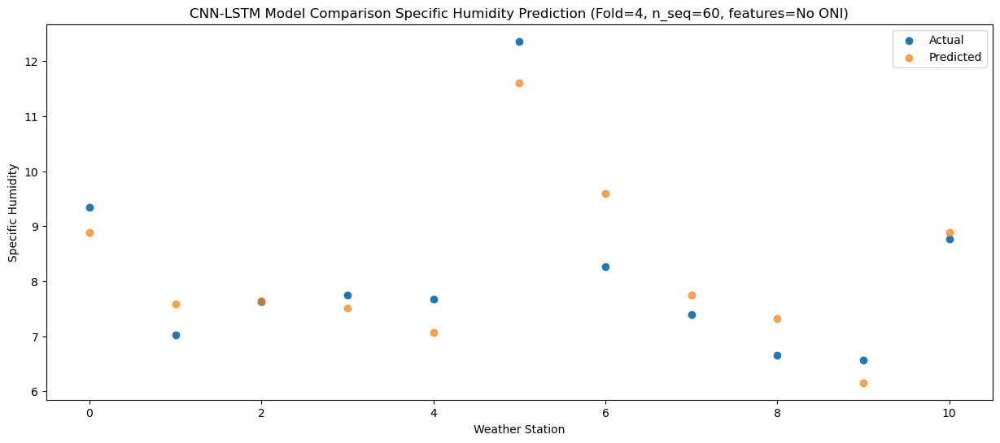

Predictions for (t+59):
    Weather_Station  Actual  Predicted
0                 0    5.22   5.071778
1                 1    2.60   3.771778
2                 2    2.84   3.831778
3                 3    4.29   3.691778
4                 4    3.94   3.251778
5                 5    8.67   7.791778
6                 6    3.86   5.771778
7                 7    3.08   3.931778
8                 8    3.07   3.501778
9                 9    2.47   2.341778
10               10    4.65   5.071778


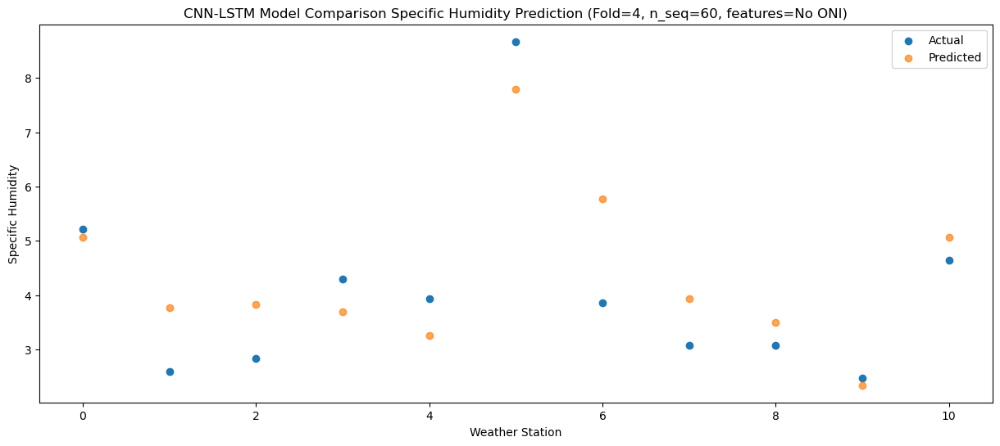

Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_4 (Conv1D)           (None, 1, 512)            1014272   
                                                                 
 max_pooling1d_4 (MaxPooling  (None, 1, 512)           0         
 1D)                                                             
                                                                 
 dropout_12 (Dropout)        (None, 1, 512)            0         
                                                                 
 lstm_8 (LSTM)               (None, 1, 1024)           6295552   
                                                                 
 dropout_13 (Dropout)        (None, 1, 1024)           0         
                                                                 
 lstm_9 (LSTM)               (None, 1024)              8392704   
                                                      

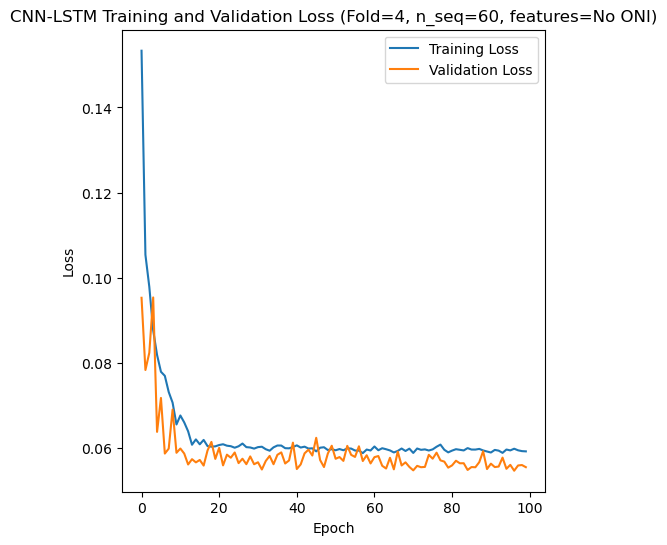

[[2.1033321569199175, 1.6749518574685827, 1.763659229078147, 1.296518769821288, 1.2570020883536779, 1.467486454760269, 1.5369789059104195, 1.1231620467394117, 1.3605311490940803, 0.8857557334544494, 0.8658975633274849, 0.4250916201528157, 1.5004839358546125, 2.7498942040660945, 2.83104746952562, 2.3267712375527143, 1.9301556947864558, 2.3535790936028174, 2.089116048695355, 1.5655210588979669, 1.5975135153401216, 1.6202382285201766, 1.510737256206652, 2.0297057206465805, 3.3938841975863405, 1.668900935569057, 3.14772453822795, 2.44443312651609, 2.548012365610891, 2.2820119056015478, 1.5769917382547602, 1.8051257918286103, 1.8794014430376895, 2.105550682907589, 2.5363170120892806, 3.710208402380855, 2.8978324794543338, 3.268180899753424, 3.1413914571868125, 2.1706050140115334, 2.646067857711312, 2.584636010330034, 2.694778889569688, 2.616370320700988, 2.2797646643461036, 2.066938648053267, 2.8356295776614093, 3.9515580290814554, 3.9190968317664296, 4.566608447458644, 4.515382399751457, 4

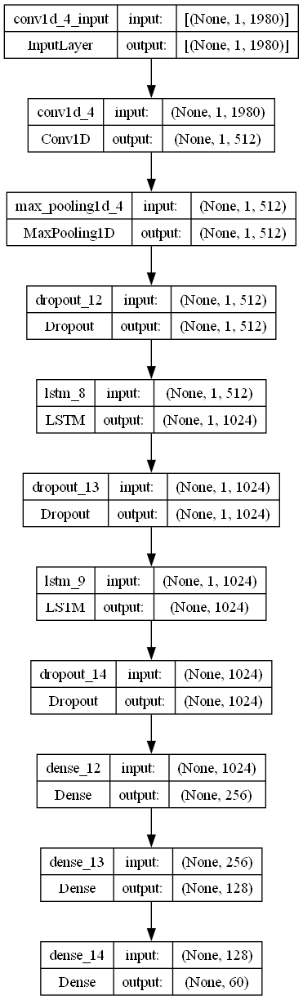

In [2]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, mean_absolute_percentage_error, r2_score
from tensorflow.keras.utils import plot_model

def rmse (y_true, y_pred):
    return K.sqrt(K.mean(K.square(y_pred - y_true)))

# fit the best LSTM model using parameters found by Optuna
def create_best_model(X, y, n_lag, n_seq, n_batch, nb_epoch):
    
    #Parameters:
    #trial (array-like): Optuna parameters.
    #train (array-like): Target values.
    #n_lag (int): Number of lag observations.
    #n_seq (int): Number of sequence observations
    #nb_epoch (int): Maximum number of epochs
    
    # Hyperparameters from the best model
    filters = 512
    lr = 0.002580076831724171
    optimizer = Adam(learning_rate = lr)
    activation_function = 'relu'
    lstm_units = 1024
    dropout_rate = 0.3626842867187114

    # design network
    model = Sequential()
    model.add(Conv1D(filters=filters, kernel_size=1, activation='relu', input_shape=(X.shape[1], X.shape[2]))) # CNN-LSTM only
    model.add(MaxPooling1D(pool_size=1)) # CNN-LSTM only
    model.add(Dropout(dropout_rate))
    model.add(LSTM(lstm_units, return_sequences=True))
    model.add(Dropout(dropout_rate))
    model.add(LSTM(lstm_units))
    model.add(Dropout(dropout_rate))
    model.add(Dense(256, input_dim=y.shape[1], activation=activation_function))
    model.add(Dense(128, activation=activation_function))
    model.add(Dense(n_seq))
    model.compile(loss=rmse, optimizer=optimizer, metrics=['accuracy', 'mae', rmse, mape, pearson])
        
    return model

# Make one forecast with a CNN-LSTM
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def forecast_cnnlstm(model, X, n_seq, n_test):
    # reshape input pattern to [samples, timesteps, features]
    X = X.reshape(1, 1, X.shape[1])
    # make forecast
    forecast = model.predict(X)
    # convert to array
    return forecast
     
# Evaluate the persistence model
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def make_forecasts(model, X_test, y_test, n_lag, n_seq, n_test):
    forecasts = list()
    for i in range(len(X_test)):
        X, y = X_test[i, :], y_test[i, :]
        # make forecast
        forecast = forecast_cnnlstm(model, X, n_seq, n_test)
        # store the forecast
        forecasts.append(forecast)
    return forecasts
     
# Invert differenced forecast
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def inverse_difference(last_ob, forecast):
    # Invert the first forecast
    inverted = list()
    inverted.append(forecast[0] + last_ob)
    # Propagate the difference forecast using the inverted first value
    for i in range(1, len(forecast)):
        inverted.append(forecast[i] + inverted[i-1])
    return inverted
     
# Inverse data transform on forecasts
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def inverse_transform(series, forecasts, scaler, n_test, n_seq):
    inverted = list()
    for i in range(len(forecasts)):
        # Create an array from the forecast
        forecast = forecasts[i]
        forecast = forecast.reshape(1, n_seq)
        # invert scaling
        inv_scale = scaler.inverse_transform(forecast)
        inv_scale = inv_scale[0, :]
        # invert differencing
        index = len(series) - n_test + i - 1
        last_ob = series.values[index]
        inv_diff = inverse_difference(last_ob, inv_scale)
        # store
        inverted.append(inv_diff)
    return inverted
     
# Evaluate the RMSE for each forecast time step
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def evaluate_forecasts(test, forecasts, n_lag, n_seq):
    rmse_list = []
    mae_list = []
    mape_list = []
    r2_list = []
    for i in range(n_seq):
        actual = [row[i] for row in test]
        predicted = [forecast[i] for forecast in forecasts]
        rmse = sqrt(mean_squared_error(actual, predicted))
        mae = mean_absolute_error(actual, predicted)
        mse = mean_squared_error(actual, predicted)
        mape = mean_absolute_percentage_error(actual, predicted)
        r2 = r2_score(actual, predicted) 
        rmse_list.append(rmse)
        mae_list.append(mae)
        mape_list.append(mape)
        r2_list.append(r2)
        print("Month at t+"+str(i+1)+":")
        print('t+%d RMSE: %f' % ((i+1), rmse))
        print('t+%d MAE: %f' % ((i+1), mae))
        print('t+%d MAPE: %f' % ((i+1), mape))
        print('t+%d R2_SCORE: %f' % ((i+1), r2))

    return rmse_list, mae_list, mape_list, r2_list
     
# plot the forecasts in the context of the original dataset
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def plot_forecasts(series, forecasts, n_test, n_seq, n_lag):
    # plot the entire dataset in blue
    plt.plot(series[:n_lag+2+len(forecasts)].values)
    # plot the forecasts in red
    off_s = n_lag + 1
    off_e = off_s + len(forecasts) + 1
    xaxis = [x for x in range(off_s, off_e)]
    yaxis = [series.values[off_s]] + forecasts
    print(xaxis)
    print(yaxis)
    plt.plot(xaxis, yaxis, color='red')
    plt.xlabel("Month")
    plt.ylabel("Specific Humidity")
    # show the plot
    plt.show()

n_batch = 1
n_test = 11
nb_epoch = 100
    
rmse_avg_list = []
mae_avg_list = []
mape_avg_list = []
r2_score_avg_list = []
forecast_results = []
actual_results = []
    
for i in range(5):
    train1 = train[i]
    test1 = test[i]
    validation1 = validation[i]

    X = train1[:, 0:-n_seq]
    y = train1[:, -n_seq:]
    X_test = test1[:, 0:-n_seq]
    y_test = test1[:, -n_seq:]
    X_val = validation1[:, 0:-n_seq]
    y_val = validation1[:, -n_seq:]

    dataset_df = pd.DataFrame(val_y[i])
    dataset_df = dataset_df.iloc[0:10, :]
    dataset = dataset_df.values

    series = pd.Series(dataset[:, 0]) # Using first column (specific humidity)

    X = X.reshape(X.shape[0], 1, X.shape[1])
    X1 = X_test
    X_test = X_test.reshape(X_test.shape[0], 1, X_test.shape[1])
    X_val = X_val.reshape(X_val.shape[0], 1, X_val.shape[1])

    best_model = create_best_model(X, y, n_lag, n_seq, n_batch, nb_epoch)
    history = best_model.fit(X, y, epochs=100, batch_size=n_batch, validation_data=(X_val, y_val))

    # Evaluate the model
    loss = best_model.evaluate(X_test, y_test, verbose=2)
    print(f'Test Loss: {loss}')

    # make forecasts
    forecasts = make_forecasts(best_model, X_test, y_test, n_lag, n_seq, n_test)
    
    # inverse transform forecasts and test
    forecasts = inverse_transform(series, forecasts, scaler[i], n_test+2, n_seq)
    actual = [row[-n_seq:] for row in test1]
    actual = inverse_transform(series, actual, scaler[i], n_test+2, n_seq)

    rmse_list = [] # list stores root mean squared errors for each future time prediction
    mae_list = [] # list stores root mean squared errors for each future time prediction
    mape_list = [] # list stores root mean squared errors for each future time prediction
    r2_list = [] # list stores root mean squared errors for each future time prediction

    # evaluate forecasts
    rmse_list, mae_list, mape_list, r2_list = evaluate_forecasts(actual, forecasts, n_lag, n_seq)

    rmse_avg_list.append(rmse_list)
    mae_avg_list.append(mae_list)
    mape_avg_list.append(mape_list)
    r2_score_avg_list.append(r2_list)
    forecast_results.append(forecasts)
    actual_results.append(actual)

    for j in range(11):
        print("Weather Station "+str(j+1)+":")
        print("Actual S.H.\tPredicted S.H.\tDifference")
        print("-----------\t--------------\t----------")
        for k in range(n_seq):
            diff = forecasts[j][k] - actual[j][k]
            print(f"{actual[j][k]:.2f}\t\t{forecasts[j][k]:.2f}\t\t{diff:.2f}")
    
        # plot forecasts
        dataset_df = pd.DataFrame(val_y[i])
        dataset_df = dataset_df.iloc[0:11, :]
        dataset_df = dataset_df.transpose()
        dataset = dataset_df.values

        series_ws = pd.Series(dataset[:, j]) # Using first column (temperatures)
        forecasts_ws = forecasts[j]
        
        plot_forecasts(series_ws, forecasts_ws, n_test, n_seq, n_lag)

    # Print out plots of actual and predicted values for weather stations
    ws = df.index[1:12]
    print(ws)
    a = []
    f = []
    for q in range(len(actual)):
        x = actual[q]
        a.append(x[0])
    for q in range(len(forecasts)):
        x = forecasts[q]
        f.append(x[0])
    print(a)
    print(f)
    # Create a DataFrame for plotting
    results_df = pd.DataFrame({
        'ws': ws,
        'Actual': a,
        'Predicted': f
    })

    for k in range(n_seq):
        print("Predictions for (t+"+str(k)+"):")
        # Print out plots of actual and predicted values for each weather station
        results = []

        # Create a DataFrame for plotting
        for j in range(11):
            results.append([j, actual[j][k], forecasts[j][k]])
               
        results_df = pd.DataFrame(results)
        results_df.columns = ['Weather_Station', 'Actual', 'Predicted']

        print(results_df)
            
        # Plotting the results
        plt.figure(figsize=(15, 6))
        plt.scatter(results_df['Weather_Station'], results_df['Actual'], label='Actual')
        plt.scatter(results_df['Weather_Station'], results_df['Predicted'], label='Predicted', alpha=0.7)
        title1='CNN-LSTM Model Comparison Specific Humidity Prediction (Fold='+str(i)+', n_seq='+str(n_seq)+', features=No ONI)'
        plt.title(title1)
        plt.xlabel('Weather Station')
        plt.ylabel('Specific Humidity')
        plt.legend()
        plt.show()

    best_model.summary()

    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1)
    plt.plot(history.history['loss'], label='Training Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    title2 = 'CNN-LSTM Training and Validation Loss (Fold='+str(i)+', n_seq='+str(n_seq)+', features=No ONI)'
    plt.title(title2)
    plt.ylabel('Loss')
    plt.xlabel('Epoch')
    plt.legend(loc='upper right')
    plt.show()

print(rmse_avg_list)
print(mae_avg_list)
print(mape_avg_list)
print(r2_score_avg_list)
print(forecast_results)
print(actual_results)
print("Accuracy Results:")
print("RMSE for each fold:")
print(rmse_avg_list)
print("Average RMSE:"+str(np.mean(rmse_avg_list)))
print("Average MAE:"+str(np.mean(mae_avg_list)))
print("Average MAPE:"+str(np.mean(mape_avg_list)))
print("Average R2 Score:"+str(np.mean(r2_score_avg_list)))

# Plot model architecture
filename = "cnnlstm_model_optimized_SH_S6_No_ONI.png"
plot_model(best_model, to_file=filename, show_shapes=True, show_layer_names=True)

In [3]:
print(np.mean(mape_avg_list[0]))

3.4114706565952035


In [4]:
print(np.mean(mape_avg_list[1]))

9949753759210.463


In [5]:
print(np.mean(mape_avg_list[2]))

1.9223704984126218


In [6]:
print(np.mean(mape_avg_list[3]))

8856561828575.74


In [7]:
print(np.mean(mape_avg_list[4]))

0.8825600108060225


In [8]:
print(mape_avg_list[1])

[1.0526089455111836, 1.7212577799844693, 374772917339447.6, 11.227658947082478, 0.5616232995805311, 6.899319616081623, 0.2697438088132922, 0.1330996965853473, 0.14017698507140944, 0.1129184717965948, 0.09191534743284557, 0.13540656403099838, 2.7030116404896916, 2.094954509000454, 3.3825124727557108, 2.945245940897683, 2.9250140435099605, 10.335319775886704, 0.4361787216936662, 0.15438808336507143, 0.11905923387965676, 0.11062096035724117, 0.12963774996441632, 0.39744998417217625, 1.1650621529558365, 2.5582048640121173, 2.0572509502750065, 5.203825766759201, 25.394933960123502, 222212308213035.88, 0.3048546114494108, 0.1544425173910703, 0.15867060287147158, 0.11854695451532868, 0.2213314855853569, 9.827998799381444, 3.89675721931239, 1.52233754255354, 1.6121456823616989, 13.966749058322591, 3.2966246036872873, 1.0384336333991138, 0.3739330050394926, 0.2443343220233278, 0.1322744932330956, 0.19668279682222573, 0.24508558465769026, 0.6013011486515919, 1.549550063664299, 1.7019333420876201

In [11]:
print(mape_avg_list[1][2])

374772917339447.6


In [12]:
print(mape_avg_list[1][29])

222212308213035.88


In [13]:
print(mape_avg_list[3][16])

503184048404920.25


In [14]:
print(mape_avg_list[3][51])

28209661309569.586


In [15]:
print(mape_avg_list[3])

[0.9532980625595292, 0.9343722293136025, 1.7639066695043675, 0.8864293022462831, 0.9736929102070384, 0.7380676891269211, 0.31410671381158267, 0.13123972806768647, 0.20404245084321967, 0.1136758463246386, 0.11562656564593969, 0.26932149554376017, 0.69675110642365, 0.7316462701210285, 0.697897166914299, 0.5505247974128966, 503184048404920.25, 0.6146657646385459, 0.547178481480027, 0.20200848660576234, 0.12816252606987788, 0.1475756017137229, 0.09638652673287083, 0.1724463702634902, 1.3340924823698024, 1.2469733343418574, 0.5930964360381927, 0.6177192855733611, 7.265378563166555, 0.7316825362390623, 0.2526547535069796, 0.23167660775398316, 0.12997492691035165, 0.13195725172600326, 0.1558457074935227, 0.6199024243738539, 1.2419133437550507, 2.812513182209264, 1.3182737047020827, 1.2578510007097459, 3.2604073503680806, 0.7199452682786484, 2.2712734172785543, 0.20851026520965196, 0.16795989965481806, 0.08259909155323276, 0.09714021876992977, 0.6697678894768452, 2.979106235484333, 1.571586264

In [16]:
print(np.sum(mape_avg_list[1][0:1])+np.sum(mape_avg_list[1][3:28])+np.sum(mape_avg_list[1][30:60]))

117.09245422880205


In [17]:
print("MAPE Average for Fold 2 (removing >1e14 values): "+str(117.09245422880205/58))

MAPE Average for Fold 2 (removing >1e14 values): 2.0188354177379666


In [18]:
print(np.sum(mape_avg_list[3][0:15])+np.sum(mape_avg_list[3][17:50])+np.sum(mape_avg_list[3][52:60]))

53.233726096047405


In [19]:
print("MAPE Average for Fold 4 (removing >1e14 values): "+str(53.233726096047405/58))

MAPE Average for Fold 4 (removing >1e14 values): 0.9178228637249553


In [20]:
print("Average MAPE: "+str((3.4114706565952035+2.0188354177379666+1.9223704984126218+0.9178228637249553+0.8825600108060225)/5))

Average MAPE: 1.8306118894553542
